
##**Proyek Akhir KASDD**

<h2 align="center"><strong>Kafka</strong></h2>

<h3 align="center"><strong>Dataset: Cycling Segments Leaderboard (CSL)</strong></h3>

# Deskripsi Dataset dan Preprocessing

Dataset mencakup berbagai informasi, seperti:<br>
* **user_age_group:** Grup usia peserta
* **user_weight_category:** Grup berat badan peserta
* **user_id:** User ID
* **attempt_date:** Tanggal log bersepeda
* **gender:** Jenis kelamin peserta
* **smt_rank:** Rank peserta di suatu segmen dan gender
* **smt_avg_spd:** Kecepatan rata-rata peserta di suatu segmen (lintasan) dalam km/jam
* **smt_finish_seconds:** Waktu yang dibutuhkan peserta untuk menyelesaikan suatu segmen (lintasan) dalam detik
* **smt_name:** Nama segmen (lintasan)
* **act_title:** Judul log aktivitas bersepeda
* **act_avg_spd:** Kecepatan rata-rata peserta di suatu log (sepanjang segmen + di luar segmen) dalam km/jam
* **act_max_spd:** Kecepatan maksimum peserta di suatu log (sepanjang segmen + di luar segmen) dalam km/jam
* **act_total_km:** Total jarak yang ditempuh peserta di suatu log (sepanjang segmen + di luar segmen) dalam km
* **act_moving_seconds:** Total waktu bersepeda peserta di suatu log (sepanjang segmen + di luar segmen) dalam detik
* **act_total_seconds:** Total waktu suatu log (sepanjang segmen + di luar segmen) dalam detik
* **has_hr_data:** Ada atau tidaknya data detak jantung di log tersebut

In [20]:
!pip install pandas

In [21]:
# Import semua library yang dibutuhkan
import pandas as pd
import numpy as np
import seaborn as sns #untuk visualisasi
import plotly.express as px #untuk visualisasi
import matplotlib.pyplot as plt
import scipy.stats as scp
import statsmodels.api as sm

from numpy import polyfit
from sklearn.preprocessing import LabelEncoder, Normalizer, StandardScaler, MinMaxScaler, OrdinalEncoder

In [22]:
import warnings
warnings.filterwarnings('ignore')

## Membuat dan Membaca Informasi *Dataframe*

In [23]:
df = pd.read_csv("https://drive.google.com/uc?id=1FUIyjpZSSDVb9QAvHR5Am4v3BxTYQu4x")

In [24]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6292 entries, 0 to 6291
Data columns (total 17 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   user_age_group        6292 non-null   object 
 1   user_id               6292 non-null   int64  
 2   attempt_date          6292 non-null   object 
 3   gender                6292 non-null   object 
 4   smt_rank              6292 non-null   int64  
 5   smt_avg_spd           6292 non-null   float64
 6   smt_finish_seconds    6292 non-null   int64  
 7   smt_name              6292 non-null   object 
 8   user_weight_category  5932 non-null   object 
 9   act_title             6292 non-null   object 
 10  act_avg_spd           6292 non-null   float64
 11  act_max_spd           6292 non-null   float64
 12  act_total_km          6292 non-null   float64
 13  act_moving_seconds    6292 non-null   int64  
 14  act_total_seconds     6292 non-null   int64  
 15  has_hr_data          

In [25]:
df.head()

,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
0,25 to 34,1972,2017-12-22,male,712,15.8,382,Headquarters Business Park,54 kg and under,Night Ride,13.6,34.9,19.24,5103,5103,0,6977
1,25 to 34,239,2015-04-13,male,189,33.2,216,Oghor 2 SailsIsland,105 kg to 114 kg,Night Ride,21.5,43.2,23.47,3926,3926,0,3518
2,25 to 34,405,2018-02-07,male,264,23.7,593,Starbucks to Majid,75 to 84 kg,Evening Ride,26.7,92.9,38.23,5152,5152,0,415
3,25 to 34,318,2018-08-24,male,50,33.4,817,Al Fardoos to shellfish round about,75 to 84 kg,Afternoon Ride,31.4,54.4,65.77,7548,7548,1,1755
4,25 to 34,628,2020-03-06,female,19,21.3,284,Headquarters Business Park,54 kg and under,ثاني تمرين ١٠٠كم,19.9,43.2,96.53,17493,17493,0,7088


In [26]:
df.describe()

,user_id,smt_rank,smt_avg_spd,smt_finish_seconds,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
count,6292.000000,6292.000000,6292.00000,6292.000000,6292.000000,6292.000000,6292.000000,6.292000e+03,6.292000e+03,6292.000000,6292.000000
mean,782.421964,172.515893,26.80925,531.276224,22.681024,44.757533,42.147134,1.252379e+04,1.252379e+04,0.196440,3947.028608
std,539.051866,173.487689,8.44806,431.974886,5.851547,17.055338,27.010789,2.157781e+05,2.157781e+05,0.397337,2261.820409
min,2.000000,1.000000,0.80000,112.000000,0.000000,8.600000,2.280000,2.640000e+02,2.640000e+02,0.000000,1.000000
25%,335.000000,37.000000,21.30000,266.000000,18.700000,36.700000,23.440000,4.095000e+03,4.095000e+03,0.000000,2004.750000
50%,703.500000,108.000000,26.50000,439.000000,22.100000,42.100000,37.780000,5.781500e+03,5.781500e+03,0.000000,3941.000000
75%,1096.000000,267.000000,32.50000,651.000000,26.400000,48.600000,52.140000,8.098500e+03,8.098500e+03,0.000000,5907.250000
max,2254.000000,805.000000,87.30000,9224.000000,75.200000,690.800000,706.590000,1.167978e+07,1.167978e+07,1.000000,7863.000000


## Handle *Missing Values*

In [27]:
df.isnull().sum()

,0
user_age_group,0
user_id,0
attempt_date,0
gender,0
smt_rank,0
smt_avg_spd,0
smt_finish_seconds,0
smt_name,0
user_weight_category,360
act_title,0


In [28]:
col_na = df.isnull().sum().sort_values(ascending=False)
percent = col_na / len(df)

missing_data = pd.concat([col_na, percent], axis=1, keys=['Total', 'Percent'])
print(missing_data[missing_data['Total'] > 0])

                      Total   Percent
user_weight_category    360  0.057216


In [29]:
df[df.isna().any(axis=1)]

,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
18,25 to 34,222,2019-10-23,male,76,33.2,512,King Street side,NaN,Evening Ride,27.6,45.7,40.23,5253,5253,0,2057
54,25 to 34,320,2018-01-13,male,286,24.1,250,Headquarters Business Park,NaN,Evening Ride,20.7,34.6,14.11,2451,2451,0,6552
69,35 to 44,824,2019-09-16,male,254,28.2,254,Oghor 2 SailsIsland,NaN,Evening Ride,23.2,36.4,50.50,7821,7821,0,4224
71,25 to 34,1925,2019-12-09,male,624,18.2,332,Headquarters Business Park,NaN,Afternoon Ride,17.3,43.6,17.44,3640,3640,0,6888
80,25 to 34,222,2019-12-16,male,82,23.4,1361,S.Ubhur Alkurnaysh South Bound with detour,NaN,الجوهرة,27.5,46.4,53.37,6987,6987,0,1226
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6167,25 to 34,369,2016-11-23,male,227,24.9,565,Starbucks to Majid,NaN,Pedalada de mañana,29.6,44.6,36.17,4402,4402,0,379
6200,55 to 64,1275,2020-02-28,male,16,14.2,689,PRINCE SULTAN - ASSALAM TO FATIMA,NaN,Camel Circle Ride V2,18.9,52.2,75.25,14305,14305,0,3073
6232,25 to 34,1486,2018-03-14,male,562,19.4,369,Oghor 2 SailsIsland,NaN,Night Ride,17.9,37.4,10.94,2206,2206,0,3890
6265,25 to 34,1954,2019-07-12,male,685,16.8,359,Headquarters Business Park,NaN,Morning Ride,15.7,31.0,12.87,2961,2961,0,6949


In [30]:
df_clean = df.copy()

In [31]:
def fill_null_mode(df):
    mode = df.mode()[0]
    filled_df = df.fillna(mode)
    return filled_df

In [32]:
df_clean['user_weight_category'] = fill_null_mode(df_clean['user_weight_category'])

In [33]:
df_clean.isnull().sum()

,0
user_age_group,0
user_id,0
attempt_date,0
gender,0
smt_rank,0
smt_avg_spd,0
smt_finish_seconds,0
smt_name,0
user_weight_category,0
act_title,0


Berdasarkan proporsi missing values 5.72% dilakukan pendekatan imputasi menggunakan mode pada fitur `user_weight_category` karena fitur ini merupakan data categorical sehingga mengisi nilai kosong dengan mode dapat menjaga distribusi data tetap konsisten tanpa penambahan bias signifikan. Selain itu, tidak dilakukannya penghapusan baris karena akan dapat mengurangi jumlah data secara keseluruhan dan dapat menyebabkan kehilangan informasi penting.

Referensi:
* [Teknik Pengolahan Data](https://dqlab.id/digital-transformation-pahami-teknik-pengolahan-ini-dalam-industri-data)

## Handle duplicate data

In [34]:
duplicate_rows = df_clean[df_clean.duplicated()]
duplicate_total_rows, duplicate_total_attributes = duplicate_rows.shape
print('jumlah data duplicate: ', duplicate_total_rows)

jumlah data duplicate:  0


In [35]:
df_clean.drop(["id", "user_id"], axis = 1, inplace=True)

Pada proses ini, tidak diperlukan langkah tambahan untuk menangani duplikasi data, karena dataset yang digunakan telah dipastikan bebas dari data yang duplikat. Hal ini berarti setiap baris data bersifat unik, sehingga tidak ada risiko redundansi yang dapat memengaruhi analisis atau hasil prediksi.

Referensi:
* [Data Preprocessing — Handling Duplicate Values and Outliers in a dataset](https://medium.com/@ayushmandurgapal/handling-dPada%20proses%20ini,%20tidak%20diperlukan%20langkah%20tambahan%20untuk%20menangani%20duplikasi%20data,%20karena%20dataset%20yang%20digunakan%20telah%20dipastikan%20bebas%20dari%20data%20yang%20duplikat.%20Hal%20ini%20berarti%20setiap%20baris%20data%20bersifat%20unik,%20sehingga%20tidak%20ada%20risiko%20redundansi%20yang%20dapat%20memengaruhi%20analisis%20atau%20hasil%20prediksi.uplicate-values-and-outliers-in-a-dataset-b00ce130818e)

## Handle Outlier

In [36]:
def hitung_outlier(df) :
    outliers_dict = {}
    outliers_percentage_dict = {}

    numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']

    for col in df.select_dtypes(include=numerics) :
        q1 = np.percentile(df[col], 25)
        q3 = np.percentile(df[col], 75)
        iqr = q3 - q1
        outliers = df[col][
            (df[col] > q3 + 1.5 * iqr) |
            (df[col] < q1 - 1.5 * iqr)
        ]
        outliers_dict[col] = len(outliers)
        outliers_percentage_dict[col] = (len(outliers) / len(df)) * 100

    outliers_values = tuple(outliers_dict.values())
    outliers_percentage_values = tuple(outliers_percentage_dict.values())

    outliers_df = pd.DataFrame([outliers_values, outliers_percentage_values],
                            columns=list(outliers_dict.keys()),
                            index=['Outliers count', 'Outliers percentage (%)'])
    display(outliers_df)

In [37]:
hitung_outlier(df_clean)

,smt_rank,smt_avg_spd,smt_finish_seconds,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data
Outliers count,163.000000,53.000000,288.000000,94.000000,375.000000,308.000000,296.000000,296.000000,1236.000000
Outliers percentage (%),2.590591,0.842339,4.577241,1.493961,5.959949,4.895105,4.704387,4.704387,19.643992


<Axes: >

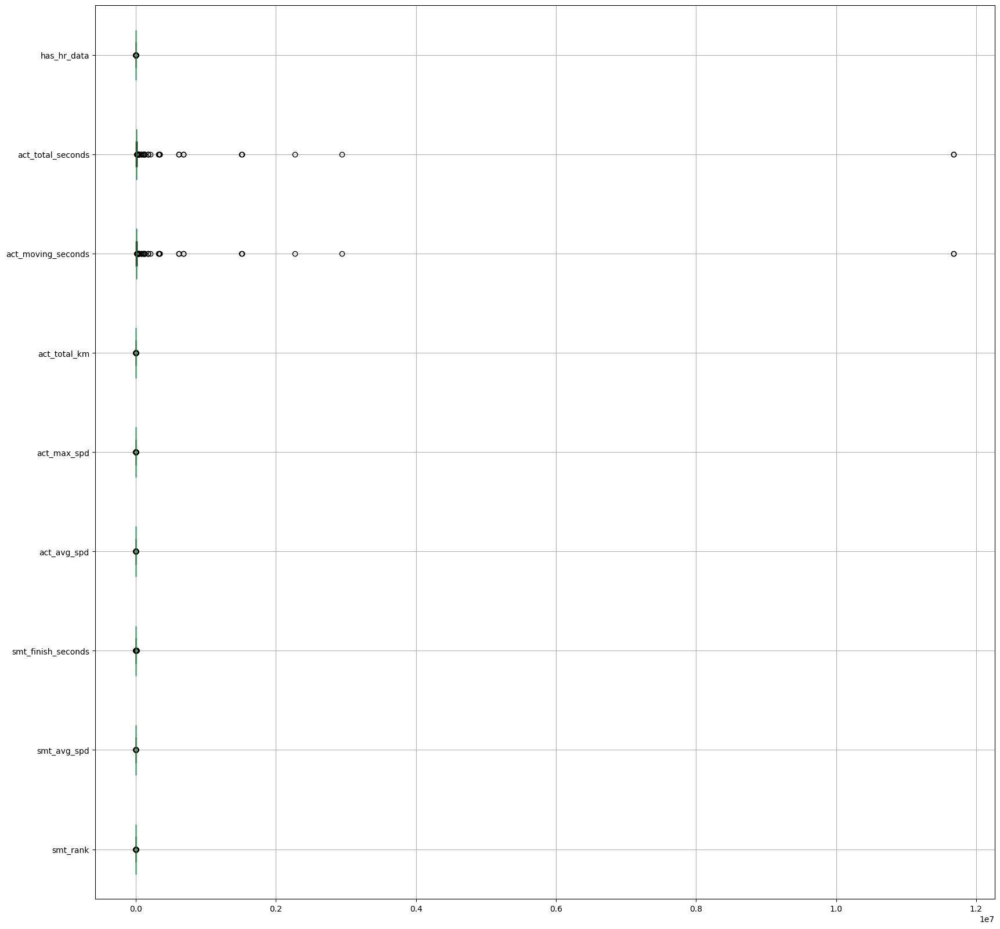

In [38]:
df_clean.boxplot(vert=False, figsize=(20,20))

Pada tahap ini, analisis outlier dilakukan menggunakan visualisasi boxplot untuk mengidentifikasi data yang memiliki outlier ekstrem. Dari visualisasi tersebut, terlihat beberapa atribut yang mengandung outlier ekstrem. Namun, kami memutuskan untuk tidak menangani outlier tersebut karena analisis kami menyimpulkan bahwa nilai-nilai outlier tersebut dapat diterima sebagai representasi kondisi nyata yang mungkin terjadi. Oleh karena itu, pada kasus ini menghilangkan atau mengubah outlier tersebut berpotensi menghilangkan informasi penting yang relevan dengan analisis atau model.

Referensi:   
* [cara mendeteksi outlier](https://blog.algorit.ma/cara-mendeteksi-outlier/)

# **== Exploratory Data Analysis ==**

## Pengaruh umur dan berat badan ke performa bersepeda

### Pemilihan atribut lanjutan

Berikut adalah penjelasan mengenai alasan pemilihan setiap fitur untuk menganalisis pengaruh umur dan berat badan ke performa bersepeda:  

1. **`user_age_group`**  
   - Atribut ini digunakan untuk mengidentifikasi bagaimana pengaruh usia terhadap performa bersepeda untuk setiap gender.

2. **`user_weight_category`**  
   - Atribut ini berhubungan langsung dengan kekuatan dan efisiensi saat bersepeda. Analisis berdasarkan kategori berat badan memungkinkan kita memahami bagaimana faktor ini memengaruhi perbedaan performa antar gender.

3. **`act_avg_spd`**  
   - Kecepatan rata-rata adalah indikator utama performa bersepeda, mencerminkan kemampuan fisik dan efisiensi peserta di sepanjang perjalanan.

4. **`act_total_km`**  
   - Jarak total adalah indikator ketahanan fisik dan stamina peserta. Peserta yang mampu menempuh jarak lebih jauh dengan kecepatan tinggi menunjukkan performa yang lebih baik, sehingga fitur ini relevan untuk mengukur hubungan dengan usia dan berat badan.

### *Pre-Processing* Lanjutan

In [39]:
df_eda1 = df_clean.copy()
df_eda1

,user_age_group,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data
0,25 to 34,2017-12-22,male,712,15.8,382,Headquarters Business Park,54 kg and under,Night Ride,13.6,34.9,19.24,5103,5103,0
1,25 to 34,2015-04-13,male,189,33.2,216,Oghor 2 SailsIsland,105 kg to 114 kg,Night Ride,21.5,43.2,23.47,3926,3926,0
2,25 to 34,2018-02-07,male,264,23.7,593,Starbucks to Majid,75 to 84 kg,Evening Ride,26.7,92.9,38.23,5152,5152,0
3,25 to 34,2018-08-24,male,50,33.4,817,Al Fardoos to shellfish round about,75 to 84 kg,Afternoon Ride,31.4,54.4,65.77,7548,7548,1
4,25 to 34,2020-03-06,female,19,21.3,284,Headquarters Business Park,54 kg and under,ثاني تمرين ١٠٠كم,19.9,43.2,96.53,17493,17493,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6287,25 to 34,2018-07-16,male,431,22.3,778,North Corniche,54 kg and under,Night Ride,17.9,96.5,41.93,8446,8446,0
6288,35 to 44,2018-11-21,male,34,38.9,446,North Corniche,85 to 95 kg,تمرين جده ١٣/٣/٤٠,34.5,52.2,48.13,5026,5026,1
6289,35 to 44,2013-08-11,male,218,22.1,637,Starbucks to Majid,75 to 84 kg,Night Ride,17.6,40.7,50.64,10374,10374,0
6290,35 to 44,2015-04-24,male,477,12.4,485,Headquarters Business Park,85 to 95 kg,Morning Ride,14.5,34.9,40.93,10158,10158,0


Mengurutkan `user_age_group` dan `user_weight_category`

In [40]:
# Menampilkan nilai unique yang terdapat pada setiap kolom kategorikal
for col in df_eda1.select_dtypes(include=object).columns:
    print(col, f": {len(df_eda1[col].unique())}", df_eda1[col].unique())

user_age_group : 9 ['25 to 34' '19 and under' '35 to 44' '55 to 64' '45 to 54' '20 to 24'
 '65 to 69' '75+' '70 to 74']
attempt_date : 1457 ['2017-12-22' '2015-04-13' '2018-02-07' ... '2016-04-21' '2019-08-31'
 '2019-04-25']
gender : 2 ['male' 'female']
smt_name : 9 ['Headquarters Business Park' 'Oghor 2 SailsIsland' 'Starbucks to Majid'
 'Al Fardoos to shellfish round about' 'North Corniche' 'King Street side'
 'S.Ubhur Alkurnaysh South Bound with detour' 'Obhur North Short'
 'PRINCE SULTAN - ASSALAM TO FATIMA']
user_weight_category : 8 ['54 kg and under' '105 kg to 114 kg' '75 to 84 kg' '65 to 74 kg'
 '115 kg and over' '85 to 95 kg' '95 kg to 104 kg' '55 to 64 kg']
act_title : 1051 ['Night Ride' 'Evening Ride' 'Afternoon Ride' ...
 'Evening Ride مسائي للوحوش' 'Evening Ride With Jeddah Cyclists '
 'Nice Relaxed Ride next the Red Sea']


In [41]:
age_group_order = [
    '19 and under', '20 to 24', '25 to 34',
    '35 to 44', '45 to 54', '55 to 64',
    '65 to 69', '70 to 74', '75+'
]

weight_category_order = [
    '54 kg and under', '55 to 64 kg', '65 to 74 kg',
    '75 to 84 kg', '85 to 95 kg', '95 kg to 104 kg',
    '105 kg to 114 kg', '115 kg and over'
]

In [42]:
df_eda1['user_age_group'] = pd.Categorical(df_eda1['user_age_group'], categories=age_group_order, ordered=True)
df_eda1['user_weight_category'] = pd.Categorical(df_eda1['user_weight_category'], categories=weight_category_order, ordered=True)

In [43]:
df_eda1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6292 entries, 0 to 6291
Data columns (total 15 columns):
 #   Column                Non-Null Count  Dtype   
---  ------                --------------  -----   
 0   user_age_group        6292 non-null   category
 1   attempt_date          6292 non-null   object  
 2   gender                6292 non-null   object  
 3   smt_rank              6292 non-null   int64   
 4   smt_avg_spd           6292 non-null   float64 
 5   smt_finish_seconds    6292 non-null   int64   
 6   smt_name              6292 non-null   object  
 7   user_weight_category  6292 non-null   category
 8   act_title             6292 non-null   object  
 9   act_avg_spd           6292 non-null   float64 
 10  act_max_spd           6292 non-null   float64 
 11  act_total_km          6292 non-null   float64 
 12  act_moving_seconds    6292 non-null   int64   
 13  act_total_seconds     6292 non-null   int64   
 14  has_hr_data           6292 non-null   int64   
dtypes: c

### Menganalisis pengaruh umur dan berat badan ke performa bersepeda menggunakan *bubble chart*

In [44]:
# Menghitung rata-rata performa dan handle NaN
performance_by_group = df_eda1.groupby(['user_age_group', 'user_weight_category']).agg({
    'act_avg_spd': 'mean',
    'act_total_km': 'mean',
}).reset_index()

# Hapus baris dengan NaN
performance_by_group = performance_by_group.dropna()

# Bubble chart
fig = px.scatter(performance_by_group,
                x ='user_age_group',
                y ='user_weight_category',
                size='act_total_km',
                color='act_avg_spd',
                title='Performa Bersepeda berdasarkan Kelompok Usia dan Kategori Berat Badan',
                labels={
                    'user_age_group': 'Kelompok Usia',
                    'user_weight_category': 'Kategori Berat Badan',
                    'act_avg_spd': 'Kecepatan Rata-rata (km/jam)',
                    'act_total_km': 'Jarak Total (km)'
                })

fig.show()

*Insight* yang diperoleh:
*   kelompok usia menengah keatas (25-69 tahun) dengan berat badan sedang (65-84 kg) memiliki performa terbaik jika berdasarkan kecepatan rata-rata dan jarak total yang ditempuh.
*   Kelompok usia yang lebih muda (19 tahun ke bawah) atau yang lebih tua (65 tahun ke atas) dengan berat badan yang sangat ringan (54 kg ke bawah) atau sangat berat (115 kg ke atas), cenderung menghasilkan kecepatan rata-rata yang lebih rendah dan jarak total yang ditempuh lebih kecil (performanya kurang).
*   Jarak total yang ditempuh lebih besar pada kelompok usia menengah dengan berat badan sedang. Hal tersebut mengindikasikan bahwa kombinasi umur dan berat badan tidak hanya memungkinkan performa kecepatan bersepeda yang lebih tinggi, tetapi juga performa untuk menempuh jarak yang lebih jauh.

### Menganalisis pengaruh umur dan berat badan ke performa bersepeda menggunakan *3D Scatter Plot*

In [45]:
# 3D Scatter Plot
fig = px.scatter_3d(performance_by_group,
                    x ='user_age_group',
                    y ='user_weight_category',
                    z ='act_avg_spd',
                    color ='act_total_km',
                    size ='act_total_km',
                    title ='Performa Bersepeda berdasarkan Kelompok Usia dan Kategori Berat Badan',
                    labels={
                        'user_age_group': 'Kelompok Usia',
                        'user_weight_category': 'Kategori Berat Badan',
                        'act_avg_spd': 'Kecepatan (km/jam)',
                        'act_total_km': 'Jarak Total (km)'
                    })

fig.update_layout(
    scene=dict(
        xaxis_title='Kelompok Usia',
        yaxis_title='Kategori Berat Badan',
        zaxis_title='Kecepatan (km/jam)'
    ),
    width=945,
    height=735
)

fig.show()

*Insight* yang diperoleh:
*   Titik-titik dengan kecepatan rata-rata tinggi (26-28 km/jam) dan jarak total yang ditempuh lebih besar (ditunjukkan oleh warna orange cerah hingga kuning) cenderung berada pada kelompok usia menengah (25-69 tahun) dengan berat badan sedang(65-84 kg). Ini menunjukkan bahwa kelompok tersebut memiliki performa terbaik.
*   Pada kelompok usia sangat muda (19 tahun ke bawah) dan sangat tua (55 tahun ke atas), kecepatan rata-rata cenderung lebih rendah (22-24 km/jam). Selain itu, jarak total yang ditempuh oleh kelompok ini cenderung lebih kecil, seperti yang terlihat dari dominasi warna lebih gelap (ungu hingga biru) di kelompok tersebut.
*   Kategori berat badan yang terlalu rendah (54 kg ke bawah) atau terlalu tinggi (115 kg ke atas) menunjukkan penurunan performa, dengan kecepatan rata-rata lebih rendah dan jarak total yang lebih pendek. Hal ini terlihat dari titik-titik yang lebih terkonsentrasi di area bawah plot, dengan warna lebih gelap.

### Menganalisis pengaruh umur dengan `act_avg_speed` menggunakan *Violin Plot*

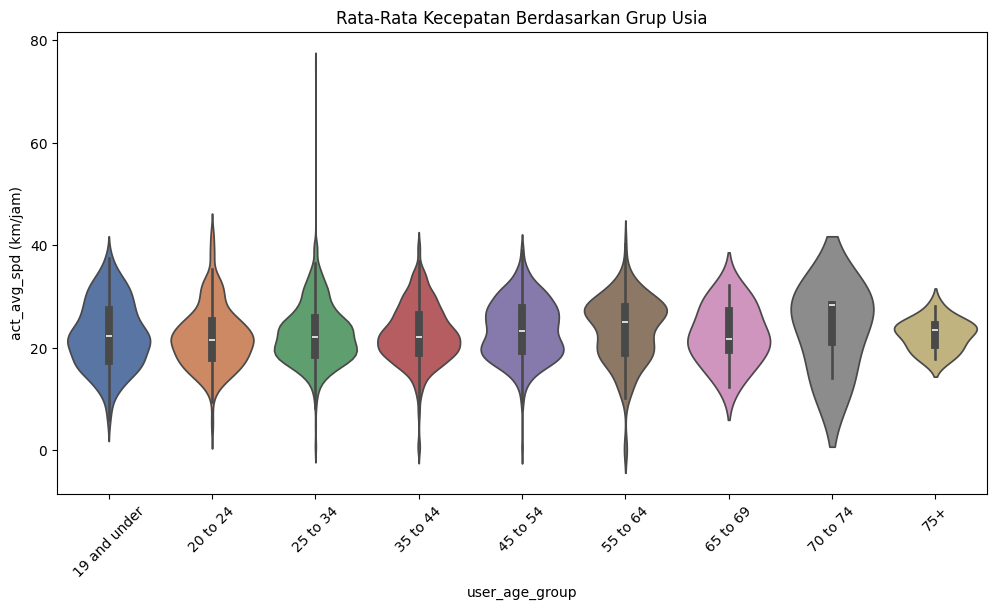

In [46]:
plt.figure(figsize=(12, 6))
sns.violinplot(x='user_age_group', y='act_avg_spd', data=df_eda1, palette='deep')
plt.title('Rata-Rata Kecepatan Berdasarkan Grup Usia')
plt.xlabel('user_age_group')
plt.ylabel('act_avg_spd (km/jam)')
plt.xticks(rotation=45)
plt.show()

*Insight* yang diperoleh:
*   Kelompok usia 25-69 tahun menunjukkan distribusi kecepatan yang relatif konsisten, yang mengindikasikan kemampuan fisik yang stabil selama rentang usia ini.
*   Kecepatan rata-rata berkurang secara signifikan setelah usia 75 tahun, yang mengindikasikan dampak bertambahnya usia terhadap kemampuan fisik saat bersepeda.

### Menganalisis pengaruh berat badan dengan `act_avg_speed` menggunakan *Violin Plot*

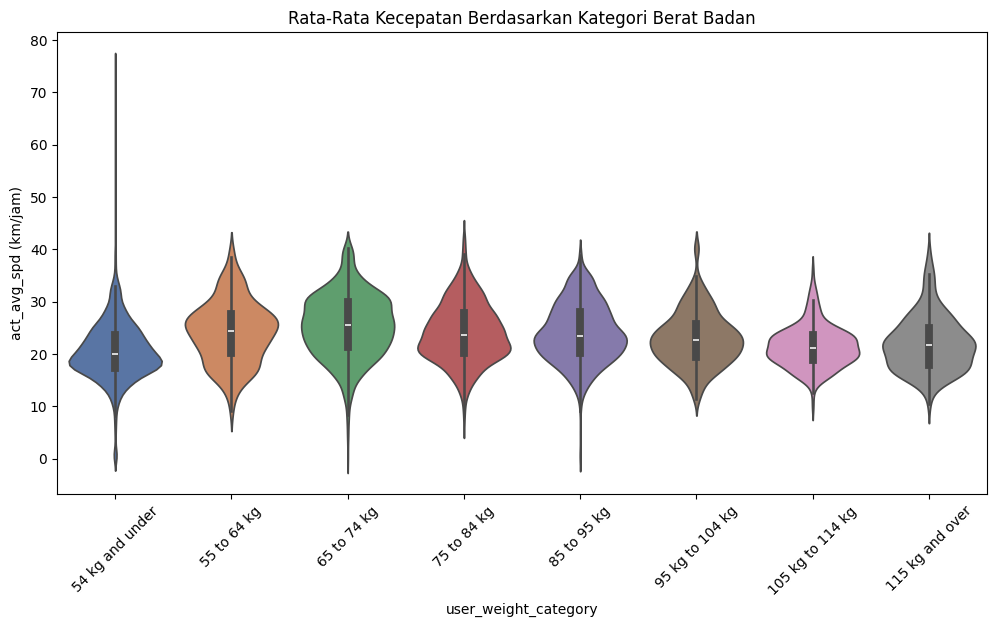

In [47]:
plt.figure(figsize=(12, 6))
sns.violinplot(x='user_weight_category', y='act_avg_spd', data=df_eda1, palette='deep')
plt.title('Rata-Rata Kecepatan Berdasarkan Kategori Berat Badan')
plt.xlabel('user_weight_category')
plt.ylabel('act_avg_spd (km/jam)')
plt.xticks(rotation=45)
plt.show()

*Insight* yang diperoleh:
*   Kategori berat badan 65-84 kg menunjukkan distribusi kecepatan yang lebih stabil dan konsisten, yang mengindikasikan efisiensi tenaga yang optimal untuk bersepeda.
*   Kategori berat badan yang sangat ringan (54 kg keatas) atau sangat berat (105 kg kebawah) menunjukkan distribusi kecepatan yang lebih lebar dengan rata-rata lebih rendah, yang mengindikasikan performa yang kurang efisien dibandingkan kategori berat badan sedang.

### Menganalisis pengaruh umur dengan `act_total_km` menggunakan *Violin Plot*

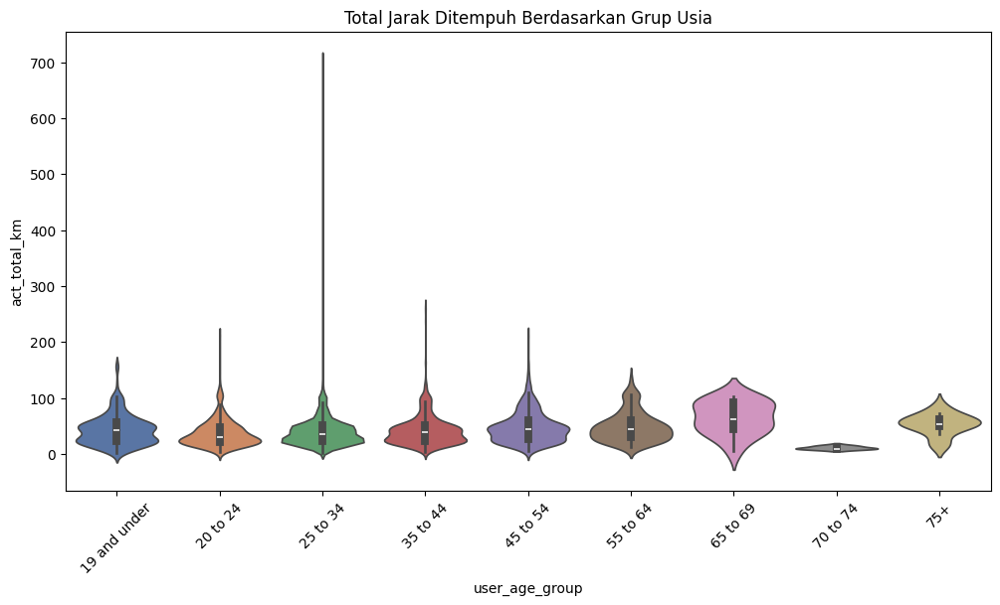

In [48]:
plt.figure(figsize=(12, 6))
sns.violinplot(x='user_age_group', y='act_total_km', data=df_eda1, palette='deep')
plt.title('Total Jarak Ditempuh Berdasarkan Grup Usia')
plt.xlabel('user_age_group')
plt.ylabel('act_total_km')
plt.xticks(rotation=45)
plt.show()

*Insight* yang diperoleh:
*   Kelompok usia 25-54 tahun menunjukkan distribusi jarak total yang lebih konsisten, yang mengindikasikan kemampuan fisik yang optimal untuk menempuh jarak yang lebih jauh.
*   Kelompok usia 70 tahun ke atas menunjukkan jarak tempuh yang lebih rendah dengan distribusi yang lebih sempit, yang mendindikasikan penurunan stamina atau kemampuan fisik seiring bertambahnya usia.

### Menganalisis pengaruh berat badan dengan `act_total_km` menggunakan *Violin Plot*

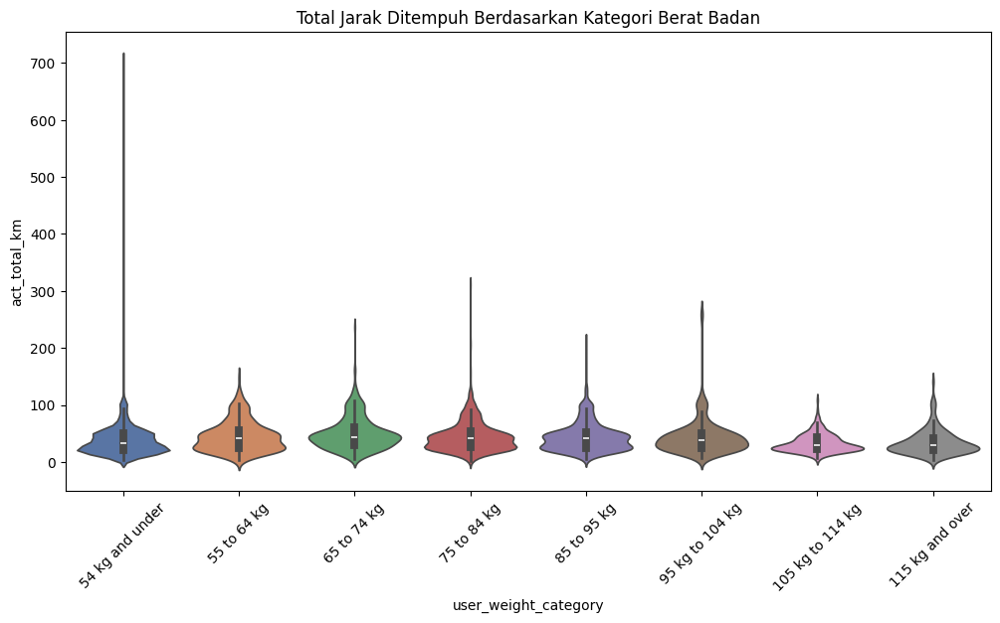

In [49]:
plt.figure(figsize=(12, 6))
sns.violinplot(x='user_weight_category', y='act_total_km', data=df_eda1, palette='deep')
plt.title('Total Jarak Ditempuh Berdasarkan Kategori Berat Badan')
plt.xlabel('user_weight_category')
plt.ylabel('act_total_km')
plt.xticks(rotation=45)
plt.show()

*Insight* yang diperoleh:
*   Kategori berat badan 65-95 kg menunjukkan distribusi jarak total yang lebih konsisten dan stabil, yang mengindikasikan efisiensi fisik yang optimal untuk menempuh jarak jauh.
*   Kategori berat badan yang sangat ringan (54 kg kebawah) atau sangat berat (105 kg keatas) memiliki distribusi jarak yang lebih lebar dengan jarak rata-rata yang lebih rendah, menunjukkan bahwa performa menurun pada kategori berat badan ekstrem.

### Menganalisis pengaruh umur dan berat badan dengan `act_avg_speed` menggunakan *Heatmap*

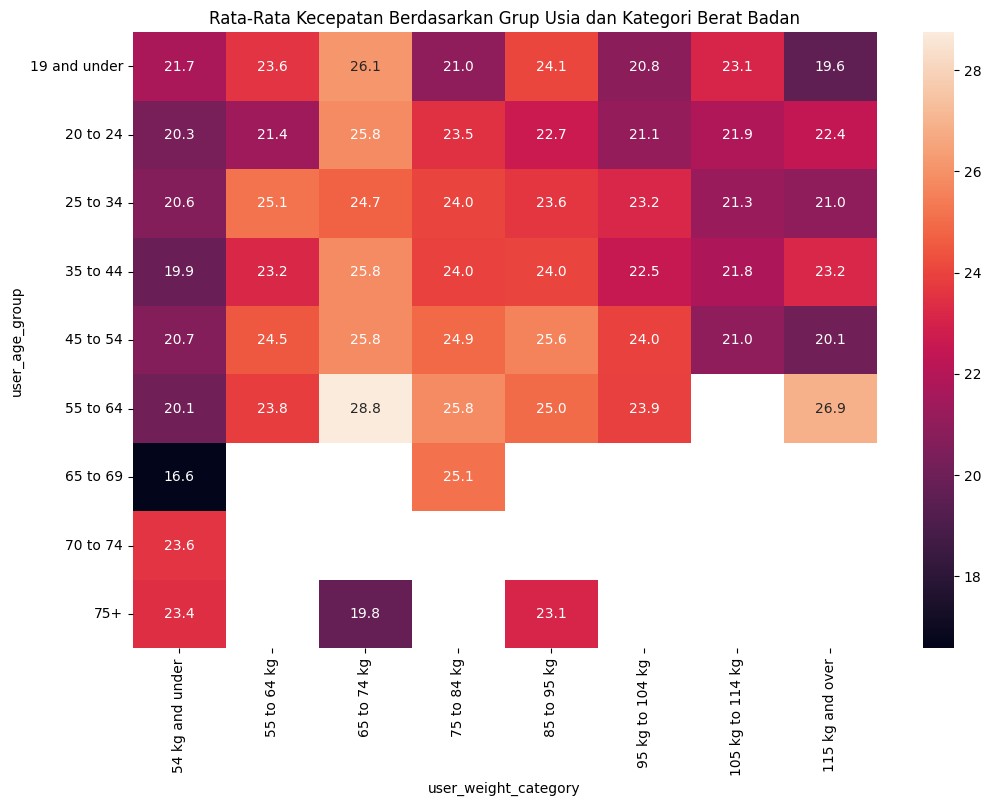

In [50]:
# Pivot table untuk heatmap
pivot_table = df_eda1.pivot_table(index='user_age_group', columns='user_weight_category', values='act_avg_spd', aggfunc='mean')

# Plot heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(pivot_table, annot=True, fmt=".1f")
plt.title('Rata-Rata Kecepatan Berdasarkan Grup Usia dan Kategori Berat Badan')
plt.ylabel('user_age_group')
plt.xlabel('user_weight_category')
plt.show()

*Insight* yang diperoleh:
*   Kecepatan rata-rata cenderung lebih tinggi pada kelompok usia menengah (25-64 tahun) dibandingkan usia yang lebih muda (20 tahun kebawah) atau lebih tua (65 tahun keatas). Hal ini menunjukkan bahwa usia produktif memiliki performa terbaik dalam bersepeda.
*   Peserta dengan berat badan dalam kategori sedang (55-95 kg) cenderung memiliki kecepatan rata-rata lebih tinggi dibandingkan kategori berat badan yang sangat ringan (54 kg kebawah) atau sangat berat (95 kg keatas), yang mungkin mencerminkan efisiensi tenaga optimal pada berat badan tertentu.
*   Kombinasi kelompok usia 55-64 tahun dan kategori berat badan 65-74 kg menunjukkan kecepatan tertinggi (28.8 km/jam), yang dapat menjadi indikasi kelompok dengan ketahanan dan efisiensi optimal di antara semua kombinasi. Namun, kecepatan menurun signifikan pada usia tua (65 tahun keatas) di semua kategori berat badan.

### Menganalisis pengaruh umur dan berat badan dengan `act_total_km` menggunakan *Heatmap*

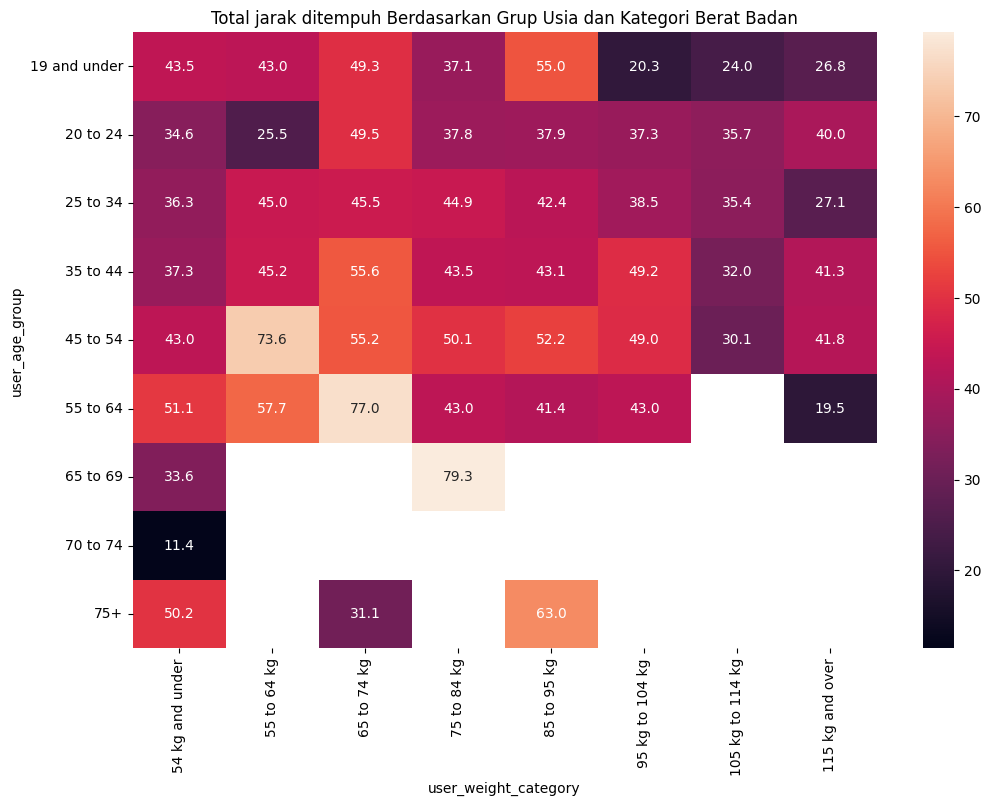

In [51]:
# Pivot table untuk heatmap
pivot_table = df_eda1.pivot_table(index='user_age_group', columns='user_weight_category', values='act_total_km', aggfunc='mean')

# Plot heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(pivot_table, annot=True, fmt=".1f")
plt.title('Total jarak ditempuh Berdasarkan Grup Usia dan Kategori Berat Badan')
plt.ylabel('user_age_group')
plt.xlabel('user_weight_category')
plt.show()

*Insight* yang diperoleh:
*   Kelompok usia 65-69 tahun menempuh jarak total tertinggi (79.3 km) di kategori berat badan 75-84 kg. Ini mengindikasikan bahwa kelompok usia ini memiliki ketahanan fisik yang optimal dibandingkan kelompok usia lainnya.
*   Peserta dengan berat badan sedang (55-95 kg) cenderung menempuh jarak lebih jauh dibandingkan kategori berat badan yang sangat ringan (54 kg kebawah) atau sangat berat (95 kg keatas). Hal ini menunjukkan bahwa berat badan sedang lebih efisien untuk aktivitas bersepeda jarak jauh.
*   Jarak yang ditempuh menurun drastis pada usia tua (65 tahun keatas) di hampir semua kategori berat badan, kecuali untuk kategori berat badan 75-84 kg yang tetap menunjukkan performa jarak yang terbaik (79,3 km untuk usia 65-69 tahun).

### Kesimpulan

Umur dan berat badan terbukti berpengaruh terhadap performa bersepeda. Secara umum, usia menengah (25–69 tahun) dengan berat badan sedang (65–84 kg) cenderung memiliki kecepatan yang lebih tinggi dan mampu menempuh jarak yang lebih jauh. Sebaliknya, kelompok usia yang sangat muda atau sangat tua serta mereka yang memiliki berat badan terlalu ringan atau terlalu berat cenderung mengalami penurunan performa. Pola ini menunjukkan adanya kombinasi optimal antara umur dan berat badan yang mendukung performa bersepeda yang lebih baik.

Namun, tidak semua individu dalam kelompok ideal ini otomatis mencapai performa puncak. Ada peserta yang berada di luar kategori usia dan berat badan tersebut namun tetap mampu meraih hasil yang lebih baik. Hal ini menunjukkan bahwa pengaruh umur dan berat badan terhadap performa bersepeda cukup signifikan, tetapi tidak terlalu kuat. Oleh karena itu, faktor-faktor lain diperlukan untuk menentukan performa bersepeda secara keseluruhan.

## Perbedaan performa bersepeda antara laki-laki dan perempuan pada segment yang sama

#### Pemilihan Attribut yang relevan

Berikut adalah penjelasan mengenai alasan pemilihan setiap fitur untuk menganalisis perbedaan performa bersepeda antara laki-laki dan perempuan:  

1. **`gender`**  
   - Atribut ini digunakan untuk memisahkan data berdasarkan jenis kelamin (laki-laki dan perempuan). Dengan atribut ini, performa dapat dibandingkan antara kedua kelompok gender untuk setiap segmen.

2. **`smt_name`**  
   - Atribut ini diperlukan untuk memastikan bahwa perbandingan performa dilakukan di lintasan yang sama. Hal ini diperlukan agar proses analisis di ukur pada saat menghadapi tantangan yang setara di segmen tersebut.

3. **`smt_avg_spd`**  
   - Kecepatan rata-rata peserta pada segmen tertentu memberikan gambaran langsung tentang performa. Fitur ini penting karena kecepatan rata-rata mencerminkan kemampuan peserta untuk mempertahankan kecepatan pada lintasan tertentu, sehingga menjadi indikator utama perbedaan performa fisik antara gender.

4. **`smt_finish_seconds`**  
   - Fitur ini memungkinkan analisis performa berdasarkan waktu yang di perlukan untuk menyelesaikan suatu segmen lintasan.

5. **`smt_rank`**  
   - Rank peserta dalam suatu segmen digunakan untuk melihat posisi relatif laki-laki dan perempuan dibandingkan dengan peserta lainnya di lintasan yang sama. Fitur ini akan memberikan konteks performa, misalnya apakah laki-laki atau perempuan lebih sering berada di posisi atas atau bawah dalam suatu lintasan tertentu.

#### Statistik deskriptif per-segmen

In [52]:
male_segments = df_clean[df_clean['gender'] == 'male'].groupby('smt_name').agg({
    'smt_avg_spd': ['count', 'mean','median','std', 'min', 'max'],
    'smt_finish_seconds': ['mean','median','std', 'min', 'max'],
    'smt_rank': ['mean', 'min', 'max']
}).round(2)

male_segments

smt_avg_spd                      \
                                                 count   mean median   std   
smt_name                                                                     
Al Fardoos to shellfish round about                155  34.21  35.40  6.98   
Headquarters Business Park                        1433  22.67  22.40  6.80   
King Street side                                   576  28.42  28.20  7.56   
North Corniche                                    1018  28.69  29.15  8.08   
Obhur North Short                                  190  25.94  28.20  8.40   
Oghor 2 SailsIsland                               1224  29.59  29.60  8.17   
PRINCE SULTAN - ASSALAM TO FATIMA                  359  30.18  29.70  9.21   
S.Ubhur Alkurnaysh South Bound with detour         249  29.07  29.30  8.78   
Starbucks to Majid                                 835  24.98  24.70  7.78   

                                                      smt_finish_seconds  \
                                            min   max               mean   
smt_name                                                                   
Al Fardoos to shellfish round about         6.6  47.5             862.05   
Headquarters Business Park                  0.8  47.2             311.06   
King Street side                            4.7  71.8             658.62   
North Corniche                              2.7  57.3             686.81   
Obhur North Short                           2.7  39.0            1179.12   
Oghor 2 SailsIsland                         3.2  63.5             271.27   
PRINCE SULTAN - ASSALAM TO FATIMA           4.7  87.3             361.33   
S.Ubhur Alkurnaysh South Bound with detour  7.8  45.6            1234.01   
Starbucks to Majid                          2.5  69.4             639.13   

                                                                       \
                                            median     std  min   max   
smt_name                                                                
Al Fardoos to shellfish round about          770.0  394.24  574  4159   
Headquarters Business Park                   269.0  275.88  128  7506   
King Street side                             603.0  268.26  237  3628   
North Corniche                               595.0  382.92  303  6503   
Obhur North Short                            876.0  876.33  633  9224   
Oghor 2 SailsIsland                          242.0  137.60  113  2243   
PRINCE SULTAN - ASSALAM TO FATIMA            329.0  171.87  112  2091   
S.Ubhur Alkurnaysh South Bound with detour  1088.0  508.89  698  4096   
Starbucks to Majid                           569.0  357.32  203  5683   

                                           smt_rank           
                                               mean min  max  
smt_name                                                      
Al Fardoos to shellfish round about           28.45   1   74  
Headquarters Business Park                   269.93   1  805  
King Street side                             102.10   1  293  
North Corniche                               189.71   1  539  
Obhur North Short                             31.01   1   80  
Oghor 2 SailsIsland                          213.75   1  617  
PRINCE SULTAN - ASSALAM TO FATIMA             65.47   1  167  
S.Ubhur Alkurnaysh South Bound with detour    44.73   1  118  
Starbucks to Majid                           164.04   1  467

In [53]:
female_segments = df_clean[df_clean['gender'] == 'female'].groupby('smt_name').agg({
    'smt_avg_spd': ['count', 'mean','median','std', 'min', 'max'],
    'smt_finish_seconds': ['mean','median','std', 'min', 'max'],
    'smt_rank': ['mean', 'min', 'max']
}).round(2)

female_segments

smt_avg_spd                       \
                                                 count   mean median    std   
smt_name                                                                      
Al Fardoos to shellfish round about                  2  24.30  24.30   1.41   
Headquarters Business Park                         112  17.81  17.75   6.33   
King Street side                                    16  23.79  26.90   7.43   
North Corniche                                      38  25.34  24.15   5.82   
Obhur North Short                                   11  15.41  17.00   7.65   
Oghor 2 SailsIsland                                 36  22.85  23.10   6.29   
PRINCE SULTAN - ASSALAM TO FATIMA                    2  45.95  45.95  25.39   
S.Ubhur Alkurnaysh South Bound with detour           6  27.78  28.40   3.40   
Starbucks to Majid                                  30  19.97  17.65   9.25   

                                                       smt_finish_seconds  \
                                             min   max               mean   
smt_name                                                                    
Al Fardoos to shellfish round about         23.3  25.3            1124.00   
Headquarters Business Park                   3.8  40.8             404.71   
King Street side                            10.6  32.7             827.62   
North Corniche                              10.6  35.8             731.58   
Obhur North Short                            6.3  24.8            2093.91   
Oghor 2 SailsIsland                          6.3  35.7             354.03   
PRINCE SULTAN - ASSALAM TO FATIMA           28.0  63.9             251.00   
S.Ubhur Alkurnaysh South Bound with detour  22.1  32.2            1162.33   
Starbucks to Majid                           3.5  55.0             876.10   

                                                                         \
                                            median      std   min   max   
smt_name                                                                  
Al Fardoos to shellfish round about         1124.0    62.23  1080  1168   
Headquarters Business Park                   341.0   228.01   148  1573   
King Street side                             633.5   395.89   520  1602   
North Corniche                               718.5   224.70   485  1639   
Obhur North Short                           1453.0  1115.79   998  3897   
Oghor 2 SailsIsland                          310.0   173.87   201  1136   
PRINCE SULTAN - ASSALAM TO FATIMA            251.0   138.59   153   349   
S.Ubhur Alkurnaysh South Bound with detour  1121.5   154.97   990  1441   
Starbucks to Majid                           799.0   637.29   256  4053   

                                           smt_rank           
                                               mean min  max  
smt_name                                                      
Al Fardoos to shellfish round about            1.00   1    1  
Headquarters Business Park                    19.00   1   57  
King Street side                               2.81   1    6  
North Corniche                                 7.47   1   21  
Obhur North Short                              3.55   1    8  
Oghor 2 SailsIsland                            8.08   1   24  
PRINCE SULTAN - ASSALAM TO FATIMA              1.00   1    1  
S.Ubhur Alkurnaysh South Bound with detour     1.67   1    3  
Starbucks to Majid                            12.73   1  101

#### Visualisasi perbandingan partisipasi

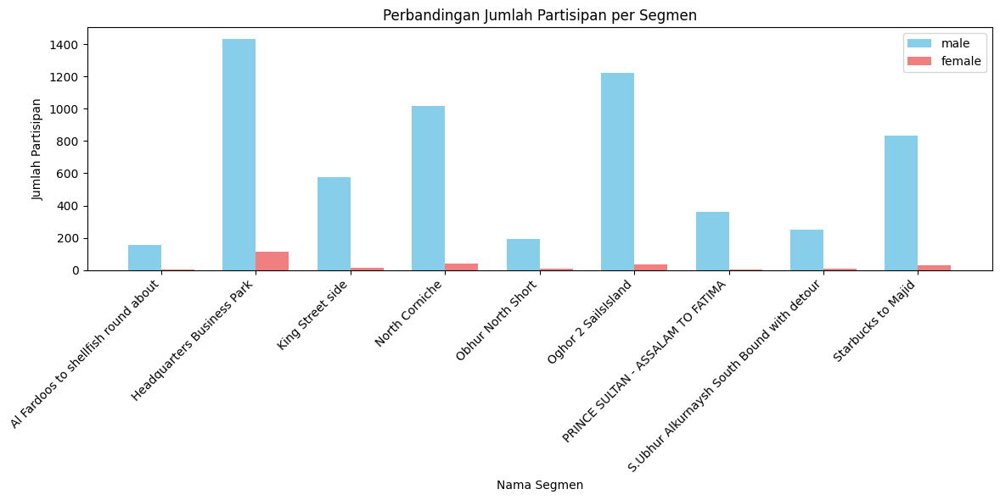

In [54]:
plt.figure(figsize=(12, 6))
x = np.arange(len(male_segments.index))
width = 0.35

plt.bar(x - width/2, male_segments['smt_avg_spd']['count'], width, label='male', color='skyblue')
plt.bar(x + width/2, female_segments['smt_avg_spd']['count'], width, label='female', color='lightcoral')

plt.xlabel('Nama Segmen')
plt.ylabel('Jumlah Partisipan')
plt.title('Perbandingan Jumlah Partisipan per Segmen')
plt.xticks(x, male_segments.index, rotation=45, ha='right')
plt.legend()
plt.tight_layout()
plt.show()

#### Boxplot Perbandingan Kecepatan

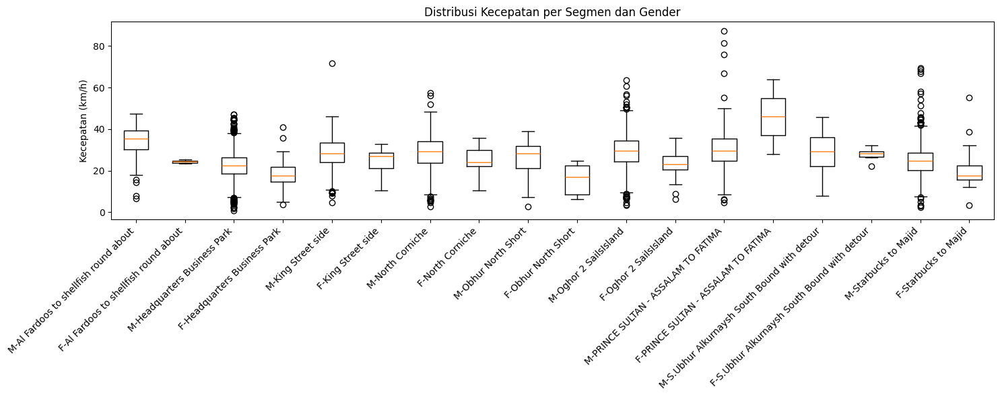

In [55]:
plt.figure(figsize=(15, 6))

data_to_plot = []
labels = []
for segment in male_segments.index:
    male_data = df_clean[(df_clean['gender'] == 'male') &
                        (df_clean['smt_name'] == segment)]['smt_avg_spd']
    female_data = df_clean[(df_clean['gender'] == 'female') &
                          (df_clean['smt_name'] == segment)]['smt_avg_spd']
    data_to_plot.extend([male_data, female_data])
    labels.extend([f'M-{segment}', f'F-{segment}'])

plt.boxplot(data_to_plot, labels=labels)
plt.xticks(rotation=45, ha='right')
plt.ylabel('Kecepatan (km/h)')
plt.title('Distribusi Kecepatan per Segmen dan Gender')
plt.tight_layout()
plt.show()

#### Visualisasi Waktu Penyelesaian

<Figure size 1200x600 with 0 Axes>

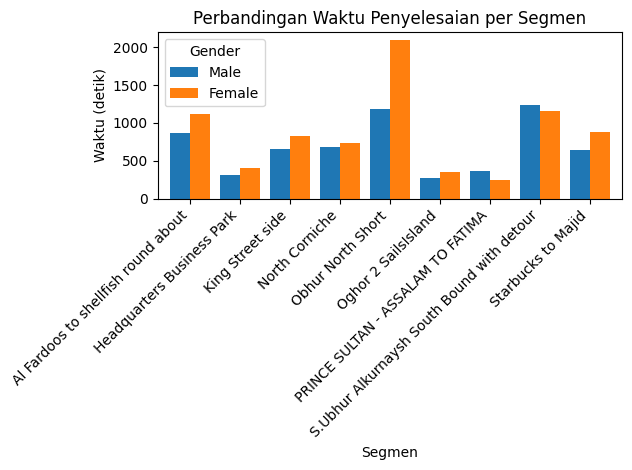

In [56]:
plt.figure(figsize=(12, 6))
time_comparison = pd.DataFrame({
    'Male': male_segments['smt_finish_seconds']['mean'],
    'Female': female_segments['smt_finish_seconds']['mean']
}).plot(kind='bar', width=0.8)
plt.title('Perbandingan Waktu Penyelesaian per Segmen')
plt.xlabel('Segmen')
plt.ylabel('Waktu (detik)')
plt.xticks(rotation=45, ha='right')
plt.legend(title='Gender')
plt.tight_layout()
plt.show()

#### Heatmap Distribusi Ranking

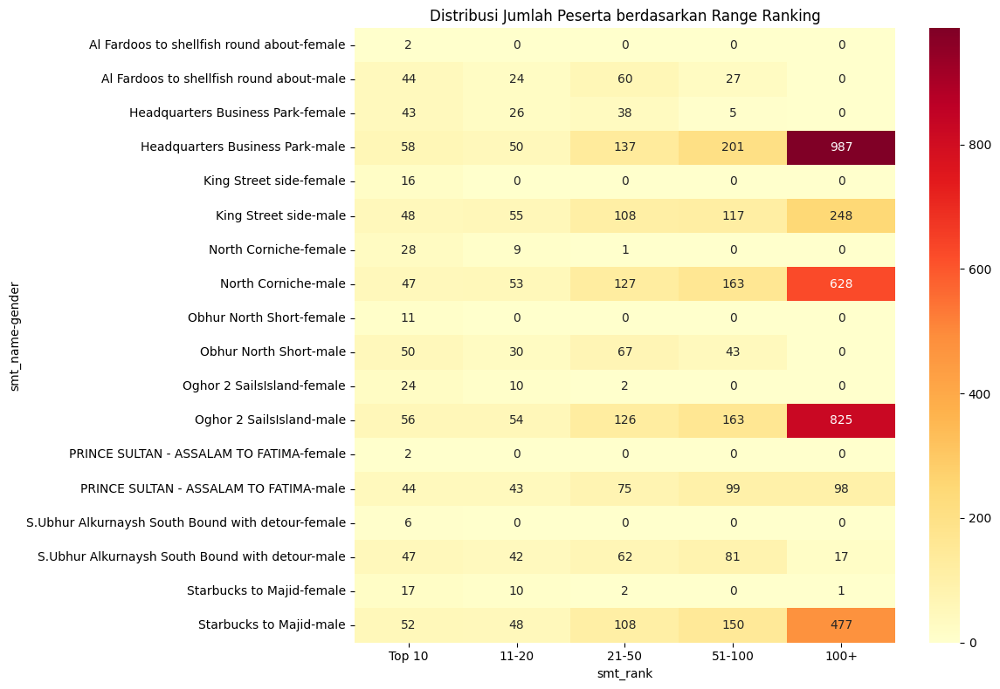

In [57]:
plt.figure(figsize=(12, 8))
rank_ranges = pd.cut(df_clean['smt_rank'],
                    bins=[0,10,20,50,100,float('inf')],
                    labels=['Top 10','11-20','21-50','51-100','100+'])

rank_dist = pd.crosstab([df_clean['smt_name'], df_clean['gender']], rank_ranges)

sns.heatmap(rank_dist, annot=True, fmt='g', cmap='YlOrRd')
plt.title('Distribusi Jumlah Peserta berdasarkan Range Ranking')
plt.tight_layout()
plt.show()

#### Kesimpulan

Bedasarkan visualisasi diatas terlihat bahwa, Diperoleh beberapa insight berikut.
1. Pada saat mengukur partisipan laki-laki dan perempuan di setiap segment, Laki-laki cenderung memiliki jumlah partisipan yang jauh lebih banyak di banding dengan perempuan.
2. Pada saat mengukur distribusi kecepatan laki-laki dan perempuan pada setiap segmen. Median kecepatan laki-laki cenderung lebih tinggi dibandingkan perempuan. Namun, pada segment **PRINCE SULTAN-ASSALAM TO FATIMA** median kecepatan perempuan lebih tinggi, hanya saja terdapat outlier laki-laki yang jauh di atas IQR perempuan sehingga menunjukkan bahwa ada laki-laki yang dapat menyaingi perempuan pada segment ini meskipun jumlahnya sedikit.
3. Pada saat mengukur perbandingan waktu kecepatan pada setiap segment. Terlihat bahwa laki-laki lebih cepat menyelesaikan suatu segmen dan menunjukkan performa yang lebih baik, hanya saja pada segmen **Prince Sultan** dan **S. Ubhur Alkurnaysh** performa perempuan lebih baik. Oleh karena itu, terlihat bahwa ada suatu segmen yang memungkinkan perempuan lebih unggul di banding laki-laki.
4. Pada saat mengukur distribusi peserta Range Nilai. Laki-Laki mendominasi top 10 nilai tertinggi di semua segmen. Walaupun terdapat kasus unik dimana perempuan hanya diwakili oleh 2 orang di segmen tertentu, tetapi keduanya berhasil menjadi peringkat 1 di kategori umur masing-masing. Hal ini menunjukkan bahwa terdapat faktor partisipasi perempuan yang lebih sedikit , sehingga laki-laki lebih mendominasi ran tersebut.

Oleh karena itu, dapat disimpulkan bahwa terdapat perbedaan performa yang signifikan antara laki-laki dan perempuan pada segmen yang sama, di mana  laki-laki cenderung menunjukkan performa lebih baik dalam hal jumlah partisipan, median kecepatan dan waktu penyelesaian. Namun, perempuan tetap ada yang mampu untuk bersaing di segmen tertentu bahkan menunjukkan keunggulan pada suatu kategori spesifik meskipun jumlah yang berpartisipasi lebih sedikit.


## Bagaimana karakteristik performa dan fisik top 10% pemenang?


### Mengelompokan data sesuai dengan nama lintasan, gender, dan grup usia

In [58]:
# Kelompokkan dan sort berdasarkan kolom yang diinginkan
df_sorted = df.sort_values(['smt_rank']).groupby(['smt_name', 'gender', 'user_age_group'])

# Nampilin data yang sudah sorted berdasarkan smt_rank perkelompok smt_name, gender, dan user_age_group
for group_name, group_data in df_sorted:
    print(f"Group: {group_name}")
    display(group_data)


Group: ('Al Fardoos to shellfish round about', 'female', '20 to 24')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
2474,20 to 24,1053,2018-07-27,female,1,23.3,1168,Al Fardoos to shellfish round about,65 to 74 kg,Morning Ride,22.2,37.1,101.26,16425,16425,0,1705


Group: ('Al Fardoos to shellfish round about', 'female', '25 to 34')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
1383,25 to 34,610,2018-07-27,female,1,25.3,1080,Al Fardoos to shellfish round about,65 to 74 kg,Morning Ride,23.5,33.5,100.06,15342,15342,1,1780


Group: ('Al Fardoos to shellfish round about', 'male', '19 and under')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
5804,19 and under,13,2019-11-01,male,1,40.6,671,Al Fardoos to shellfish round about,65 to 74 kg,Morning Ride,36.4,58.3,54.02,5339,5339,1,1686
5634,19 and under,46,2018-02-03,male,2,40.5,674,Al Fardoos to shellfish round about,75 to 84 kg,Afternoon Ride,26.6,51.8,50.55,6843,6843,1,1687
1622,19 and under,1129,2018-10-05,male,3,39.9,684,Al Fardoos to shellfish round about,55 to 64 kg,Morning Ride,34.3,55.1,73.43,7706,7706,0,1688
3658,19 and under,21,2019-01-11,male,4,37.0,738,Al Fardoos to shellfish round about,55 to 64 kg,Early morning ride,30.4,50.4,97.70,11552,11552,0,1689
4338,19 and under,2,2019-03-09,male,5,35.9,760,Al Fardoos to shellfish round about,65 to 74 kg,Morning Ride,28.2,49.0,98.08,12540,12540,0,1690
2314,19 and under,17,2017-11-11,male,6,34.9,781,Al Fardoos to shellfish round about,54 kg and under,Morning Ride,28.2,47.2,63.57,8125,8125,0,1691
3826,19 and under,34,2019-01-12,male,7,33.7,809,Al Fardoos to shellfish round about,54 kg and under,Morning Ride,29.4,54.4,87.27,10679,10679,0,1692
5868,19 and under,4,2017-12-13,male,8,30.3,901,Al Fardoos to shellfish round about,54 kg and under,Afternoon Ride,31.4,47.5,70.23,8043,8043,0,1693
423,19 and under,6,2017-04-14,male,9,30.2,903,Al Fardoos to shellfish round about,54 kg and under,Morning Ride,24.4,39.2,61.73,9105,9105,0,1694


Group: ('Al Fardoos to shellfish round about', 'male', '20 to 24')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
1040,20 to 24,2,2019-09-27,male,1,43.9,621,Al Fardoos to shellfish round about,65 to 74 kg,Morning Ride,30.7,52.2,64.03,7511,7511,0,1695
5918,20 to 24,51,2016-01-01,male,2,40.9,666,Al Fardoos to shellfish round about,65 to 74 kg,Morning Ride,33.1,48.2,115.49,12561,12561,0,1696
2469,20 to 24,4,2018-02-03,male,3,40.5,673,Al Fardoos to shellfish round about,54 kg and under,Afternoon Ride,29.0,54.0,89.28,11073,11073,0,1697
3082,20 to 24,58,2018-10-05,male,4,38.8,702,Al Fardoos to shellfish round about,NaN,Morning Ride,33.9,52.2,71.05,7550,7550,1,1698
427,20 to 24,56,2017-05-26,male,5,38.6,706,Al Fardoos to shellfish round about,65 to 74 kg,Morning Ride,32.7,56.9,70.79,7797,7797,0,1699
1580,20 to 24,1101,2019-01-18,male,6,35.5,769,Al Fardoos to shellfish round about,85 to 95 kg,Morning Ride,33.0,52.6,117.80,12832,12832,0,1700
270,20 to 24,53,2019-02-01,male,8,31.7,861,Al Fardoos to shellfish round about,75 to 84 kg,Morning Ride,29.4,46.1,115.85,14187,14187,0,1702
4369,20 to 24,512,2019-09-20,male,10,6.6,4159,Al Fardoos to shellfish round about,54 kg and under,Evening Ride,11.6,30.6,24.36,7564,7564,0,1704


Group: ('Al Fardoos to shellfish round about', 'male', '25 to 34')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
6006,25 to 34,157,2019-09-27,male,2,44.1,618,Al Fardoos to shellfish round about,95 kg to 104 kg,Morning Ride,32.4,55.1,74.53,8289,8289,1,1707
4666,25 to 34,592,2019-09-27,male,3,43.8,622,Al Fardoos to shellfish round about,55 to 64 kg,Morning Ride,35.6,54.4,60.56,6118,6118,1,1708
4161,25 to 34,158,2016-10-14,male,4,43.5,627,Al Fardoos to shellfish round about,85 to 95 kg,Morning Ride,35.2,51.1,101.92,10423,10423,1,1709
864,25 to 34,187,2016-10-14,male,5,43.3,630,Al Fardoos to shellfish round about,85 to 95 kg,Morning Ride,35.0,52.2,103.12,10601,10601,1,1710
4394,25 to 34,56,2019-12-13,male,6,43.2,632,Al Fardoos to shellfish round about,65 to 74 kg,Morning Ride,32.8,56.9,68.15,7481,7481,1,1711
4075,25 to 34,1101,2019-10-18,male,7,42.6,640,Al Fardoos to shellfish round about,85 to 95 kg,Morning Ride,35.5,62.3,69.40,7029,7029,1,1712
4141,25 to 34,235,2019-10-11,male,8,42.0,649,Al Fardoos to shellfish round about,54 kg and under,Morning Ride,32.2,57.6,69.72,7805,7805,0,1713
5753,25 to 34,1130,2019-10-18,male,9,42.0,650,Al Fardoos to shellfish round about,65 to 74 kg,حماس من الاخر fire,33.5,56.9,73.41,7894,7894,1,1715
2081,25 to 34,170,2019-10-11,male,9,42.0,650,Al Fardoos to shellfish round about,85 to 95 kg,Morning Ride,33.9,58.3,67.93,7206,7206,1,1714
4366,25 to 34,1131,2020-03-06,male,11,41.2,662,Al Fardoos to shellfish round about,115 kg and over,Morning Ride,34.9,55.8,70.04,7225,7225,1,1716


Group: ('Al Fardoos to shellfish round about', 'male', '35 to 44')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
3125,35 to 44,639,2017-12-08,male,1,47.5,574,Al Fardoos to shellfish round about,65 to 74 kg,Morning Ride,29.7,52.9,101.13,12265,12265,0,1781
4632,35 to 44,1139,2019-10-18,male,5,42.7,638,Al Fardoos to shellfish round about,65 to 74 kg,تمرين جدة دراجين الغربية,33.1,52.9,68.31,7428,7428,0,1785
3045,35 to 44,1072,2019-12-13,male,7,41.8,652,Al Fardoos to shellfish round about,75 to 84 kg,Morning Ride,30.0,59.4,75.36,9040,9040,1,1787
1493,35 to 44,268,2019-08-30,male,8,41.3,661,Al Fardoos to shellfish round about,65 to 74 kg,Morning Ride,33.6,57.2,67.78,7268,7268,1,1788
580,35 to 44,1073,2017-12-01,male,9,40.0,682,Al Fardoos to shellfish round about,54 kg and under,Morning Ride,25.9,50.8,82.99,11519,11519,0,1789
4890,35 to 44,674,2019-01-11,male,11,39.9,684,Al Fardoos to shellfish round about,85 to 95 kg,Morning Ride,28.5,48.6,93.07,11747,11747,1,1792
1019,35 to 44,682,2015-11-06,male,11,39.9,684,Al Fardoos to shellfish round about,75 to 84 kg,Morning Ride,33.8,51.1,90.21,9620,9620,1,1791
5977,35 to 44,646,2015-11-06,male,14,39.6,689,Al Fardoos to shellfish round about,85 to 95 kg,Morning Ride Jeddah,33.6,58.7,92.27,9875,9875,0,1794
269,35 to 44,714,2018-10-26,male,15,39.5,691,Al Fardoos to shellfish round about,65 to 74 kg,Nice ride with jeddah tri thumbs up: light ski...,33.5,55.1,84.14,9049,9049,1,1795
4447,35 to 44,231,2019-01-11,male,16,39.0,699,Al Fardoos to shellfish round about,65 to 74 kg,مع دراج جدة,28.8,49.7,91.89,11504,11504,1,1796


Group: ('Al Fardoos to shellfish round about', 'male', '45 to 54')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
5788,45 to 54,1147,2019-09-27,male,2,44.3,616,Al Fardoos to shellfish round about,NaN,Morning Ride,29.9,56.9,74.87,9015,9015,0,1841
2874,45 to 54,940,2016-10-14,male,3,43.6,626,Al Fardoos to shellfish round about,55 to 64 kg,Morning Ride,32.1,50.4,116.25,13055,13055,0,1842
5964,45 to 54,933,2016-01-30,male,4,43.4,628,Al Fardoos to shellfish round about,85 to 95 kg,Morning Ride,32.4,47.9,70.45,7817,7817,1,1843
3803,45 to 54,1089,2019-10-11,male,6,41.8,653,Al Fardoos to shellfish round about,54 kg and under,Morning Ride,27.9,56.9,77.09,9935,9935,0,1845
2961,45 to 54,682,2016-12-02,male,7,40.0,682,Al Fardoos to shellfish round about,75 to 84 kg,"Dark clouds, front wind, side wind, rain, summ...",29.1,50.4,45.32,5612,5612,1,1846
2412,45 to 54,946,2015-12-11,male,8,39.6,688,Al Fardoos to shellfish round about,65 to 74 kg,Sortie à vélo matinale,32.3,47.2,105.11,11718,11718,0,1847
5304,45 to 54,1090,2019-12-20,male,9,39.2,696,Al Fardoos to shellfish round about,65 to 74 kg,Friday ride,24.2,50.0,80.16,11901,11901,0,1848
2068,45 to 54,652,2019-09-13,male,10,38.7,704,Al Fardoos to shellfish round about,65 to 74 kg,Morning Ride,31.2,50.4,70.02,8067,8067,1,1849
1096,45 to 54,942,2014-10-10,male,12,37.9,720,Al Fardoos to shellfish round about,75 to 84 kg,"10/10/2014 Jeddah, Makkah Province, Saudi Arabia",32.3,48.6,86.08,9586,9586,0,1851
5438,45 to 54,978,2017-03-04,male,13,37.0,737,Al Fardoos to shellfish round about,85 to 95 kg,Recovery burn,32.6,57.6,83.96,9266,9266,1,1852


Group: ('Al Fardoos to shellfish round about', 'male', '55 to 64')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
1047,55 to 64,940,2018-04-27,male,2,43.6,625,Al Fardoos to shellfish round about,55 to 64 kg,Morning Ride,29.5,56.5,38.51,4704,4704,1,1881
3604,55 to 64,1039,2017-11-24,male,5,34.8,784,Al Fardoos to shellfish round about,65 to 74 kg,Morning Ride,27.2,44.3,106.56,14109,14109,1,1884
3282,55 to 64,1127,2017-03-31,male,6,30.1,907,Al Fardoos to shellfish round about,55 to 64 kg,"March 31, 2017 Lap 1",24.8,41.8,46.27,6704,6704,1,1885
5243,55 to 64,1128,2018-01-19,male,8,27.5,991,Al Fardoos to shellfish round about,54 kg and under,Morning Ride,21.6,37.4,103.11,17161,17161,0,1887


Group: ('Al Fardoos to shellfish round about', 'male', '75+')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
2836,75+,1049,2019-08-02,male,1,40.1,680,Al Fardoos to shellfish round about,85 to 95 kg,August 2nd 2019,28.1,53.6,85.89,11000,11000,0,1889


Group: ('Headquarters Business Park', 'female', '19 and under')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
3704,19 and under,1674,2019-11-23,female,1,40.8,148,Headquarters Business Park,55 to 64 kg,Morning Ride,16.4,79.9,20.99,4612,4612,0,6037
5062,19 and under,49,2019-12-02,female,2,24.9,242,Headquarters Business Park,54 kg and under,Night Ride,17.5,78.8,8.65,1777,1777,0,6038
5047,19 and under,1675,2019-01-13,female,3,24.7,244,Headquarters Business Park,54 kg and under,Evening Ride,20.8,33.1,22.48,3897,3897,0,6039
2796,19 and under,1676,2018-09-04,female,4,24.0,251,Headquarters Business Park,54 kg and under,Afternoon Ride,20.1,40.3,16.45,2946,2946,0,6040
1796,19 and under,47,2018-09-15,female,5,23.7,255,Headquarters Business Park,54 kg and under,من أرهب التمارين,17.7,31.3,54.53,11094,11094,0,6041
5390,19 and under,1677,2018-11-14,female,6,23.1,261,Headquarters Business Park,54 kg and under,Night Ride,18.9,35.3,21.93,4178,4178,0,6042
1760,19 and under,48,2019-12-22,female,8,18.2,332,Headquarters Business Park,54 kg and under,20k evening ride,17.2,24.1,21.19,4437,4437,0,6044
692,19 and under,50,2019-09-27,female,10,15.3,394,Headquarters Business Park,54 kg and under,Morning ride,17.5,30.6,36.43,7480,7480,0,6046
1349,19 and under,1679,2018-12-29,female,11,12.5,483,Headquarters Business Park,54 kg and under,Morning Ride,14.3,23.0,11.51,2898,2898,0,6047
3348,19 and under,1680,2019-10-22,female,12,5.8,1046,Headquarters Business Park,54 kg and under,Afternoon Ride,6.4,16.6,4.76,2688,2688,0,6048


Group: ('Headquarters Business Park', 'female', '20 to 24')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
3717,20 to 24,1053,2018-11-14,female,1,27.4,220,Headquarters Business Park,65 to 74 kg,Two Amigas Morning Ride,27.4,39.2,30.13,3955,3955,0,6250
359,20 to 24,1054,2019-11-12,female,2,26.2,230,Headquarters Business Park,54 kg and under,Night Ride,22.0,34.6,40.07,6569,6569,0,6251
3927,20 to 24,1758,2018-01-14,female,3,24.3,248,Headquarters Business Park,54 kg and under,Night Ride,19.7,37.1,9.24,1692,1692,0,6252
5255,20 to 24,1760,2019-01-12,female,5,19.9,303,Headquarters Business Park,54 kg and under,Afternoon Ride,18.1,35.6,40.45,8034,8034,0,6254
542,20 to 24,1761,2019-11-10,female,6,18.7,323,Headquarters Business Park,54 kg and under,محاوله في تعديل المزاج sleeping face,16.9,65.9,20.47,4354,4354,0,6255
2998,20 to 24,1397,2020-02-03,female,7,17.3,349,Headquarters Business Park,54 kg and under,ليال في موت,18.7,51.8,31.87,6138,6138,0,6256
1587,20 to 24,1396,2019-11-20,female,8,16.4,367,Headquarters Business Park,54 kg and under,Evening Ride,16.4,36.4,30.95,6804,6804,0,6257
3290,20 to 24,1765,2019-10-22,female,12,10.7,563,Headquarters Business Park,54 kg and under,Afternoon Ride,9.3,20.2,5.72,2219,2219,0,6261
1195,20 to 24,1766,2019-03-03,female,13,6.8,889,Headquarters Business Park,54 kg and under,Afternoon Ride,32.6,110.9,42.03,4638,4638,0,6262
3194,20 to 24,1768,2019-10-22,female,16,3.8,1573,Headquarters Business Park,NaN,طالبات الجامعه العربية المفتوحه تحدي الامل,3.7,8.6,4.85,4668,4668,0,6264


Group: ('Headquarters Business Park', 'female', '25 to 34')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
2599,25 to 34,608,2019-01-13,female,1,35.7,169,Headquarters Business Park,54 kg and under,Afternoon Ride,24.4,40.0,24.43,3611,3611,1,7070
2770,25 to 34,610,2019-10-01,female,2,29.3,206,Headquarters Business Park,65 to 74 kg,Evening Ride,24.8,37.1,35.80,5202,5202,1,7071
2020,25 to 34,1053,2019-02-26,female,3,28.7,210,Headquarters Business Park,65 to 74 kg,Night Ride,24.9,37.4,30.01,4339,4339,1,7072
6135,25 to 34,616,2018-05-16,female,4,28.2,214,Headquarters Business Park,54 kg and under,Morning Ride,27.7,37.8,30.75,3994,3994,1,7073
698,25 to 34,607,2019-10-30,female,5,26.8,225,Headquarters Business Park,54 kg and under,Evening Ride,22.3,92.2,35.72,5762,5762,0,7074
4661,25 to 34,612,2020-03-06,female,6,25.9,233,Headquarters Business Park,54 kg and under,Morning Ride,23.4,31.0,60.02,9237,9237,0,7075
1960,25 to 34,1217,2018-07-14,female,7,25.2,240,Headquarters Business Park,65 to 74 kg,Morning Ride,22.3,36.7,22.07,3555,3555,1,7076
3469,25 to 34,614,2019-02-12,female,8,24.6,245,Headquarters Business Park,55 to 64 kg,Evening Ride,23.0,31.0,20.01,3126,3126,1,7077
5730,25 to 34,617,2019-10-09,female,9,23.9,253,Headquarters Business Park,54 kg and under,Evening Ride,22.1,29.9,6.40,1042,1042,0,7079
2203,25 to 34,2034,2018-11-04,female,9,23.9,253,Headquarters Business Park,54 kg and under,Evening Ride,19.1,38.2,15.40,2903,2903,0,7078


Group: ('Headquarters Business Park', 'female', '35 to 44')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
4390,35 to 44,923,2019-08-07,female,1,28.2,214,Headquarters Business Park,65 to 74 kg,Morning Ride,21.2,32.0,17.80,3029,3029,1,7628
6181,35 to 44,924,2018-12-03,female,2,23.3,259,Headquarters Business Park,55 to 64 kg,Morning Ride,25.1,35.3,50.51,7244,7244,1,7629
766,35 to 44,2184,2018-11-24,female,3,22.1,273,Headquarters Business Park,54 kg and under,Morning Ride,17.5,32.4,15.71,3224,3224,0,7630
1814,35 to 44,2186,2019-09-30,female,5,21.5,281,Headquarters Business Park,54 kg and under,Morning Ride,16.8,36.7,18.96,4060,4060,0,7632
866,35 to 44,2187,2018-11-17,female,6,21.2,285,Headquarters Business Park,55 to 64 kg,Morning Ride,18.5,28.8,21.13,4106,4106,1,7633
6045,35 to 44,2189,2019-02-20,female,8,20.0,302,Headquarters Business Park,55 to 64 kg,Night Ride,19.0,34.2,22.53,4259,4259,0,7635
3573,35 to 44,926,2017-12-08,female,10,19.5,310,Headquarters Business Park,75 to 84 kg,Sand storm,16.3,32.8,17.36,3829,3829,0,7637
5905,35 to 44,1146,2018-06-24,female,11,19.3,313,Headquarters Business Park,55 to 64 kg,Evening Ride,20.5,37.8,20.61,3623,3623,0,7638
4211,35 to 44,928,2019-11-01,female,12,18.9,320,Headquarters Business Park,54 kg and under,Morning Ride,16.4,29.5,33.36,7320,7320,0,7639
5046,35 to 44,927,2019-11-18,female,13,18.8,321,Headquarters Business Park,65 to 74 kg,Evening Ride,14.6,47.9,36.13,8883,8883,0,7640


Group: ('Headquarters Business Park', 'female', '45 to 54')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
2347,45 to 54,2235,2018-12-26,female,1,21.6,280,Headquarters Business Park,54 kg and under,Afternoon Ride,15.1,28.8,12.87,3066,3066,0,7809
1977,45 to 54,2236,2018-05-20,female,3,20.7,292,Headquarters Business Park,55 to 64 kg,Night Ride,16.7,26.6,9.20,1978,1978,0,7811
3096,45 to 54,2237,2018-06-01,female,4,18.6,324,Headquarters Business Park,55 to 64 kg,Night Ride,17.4,67.7,34.46,7142,7142,0,7812
2419,45 to 54,1621,2020-01-31,female,5,18.6,325,Headquarters Business Park,55 to 64 kg,Corniche Ride,15.6,98.3,30.88,7115,7115,0,7813
4915,45 to 54,2238,2019-02-25,female,6,17.9,338,Headquarters Business Park,54 kg and under,Afternoon Ride,16.2,45.7,22.26,4941,4941,0,7814
3997,45 to 54,2239,2018-05-27,female,7,17.3,349,Headquarters Business Park,75 to 84 kg,Night Ride,17.8,39.2,9.47,1912,1912,0,7815
3459,45 to 54,2240,2019-09-01,female,8,17.1,352,Headquarters Business Park,54 kg and under,Afternoon Ride,17.4,34.9,16.35,3383,3383,0,7816
3084,45 to 54,1028,2019-11-13,female,9,15.9,380,Headquarters Business Park,85 to 95 kg,20k Brave Cyclists 12,15.8,26.6,22.51,5140,5140,0,7817
952,45 to 54,2241,2018-07-30,female,10,15.7,384,Headquarters Business Park,54 kg and under,Evening Ride,14.0,22.3,13.16,3376,3376,0,7818
1177,45 to 54,2242,2018-03-25,female,11,14.9,405,Headquarters Business Park,54 kg and under,Evening Ride,13.4,20.2,10.62,2864,2864,0,7819


Group: ('Headquarters Business Park', 'female', '55 to 64')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
2761,55 to 64,2251,2019-06-07,female,2,17.9,337,Headquarters Business Park,55 to 64 kg,Morning Ride,14.4,33.1,29.5,7383,7383,0,7855


Group: ('Headquarters Business Park', 'female', '65 to 69')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
2023,65 to 69,2252,2019-04-08,female,1,8.1,742,Headquarters Business Park,54 kg and under,Morning Bike,12.3,19.8,5.42,1591,1591,0,7859


Group: ('Headquarters Business Park', 'male', '19 and under')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
3451,19 and under,2,2019-01-26,male,1,44.4,136,Headquarters Business Park,65 to 74 kg,Morning Ride,37.6,52.2,21.79,2087,2087,0,5939
1442,19 and under,15,2019-01-13,male,2,44.1,137,Headquarters Business Park,85 to 95 kg,Afternoon Ride,22.4,56.2,103.26,16570,16570,0,5940
4656,19 and under,5,2015-02-09,male,3,32.8,184,Headquarters Business Park,54 kg and under,Evening Speeders Group Ride,20.2,46.8,103.59,18504,18504,0,5941
3569,19 and under,27,2018-09-15,male,5,32.1,188,Headquarters Business Park,NaN,Morning Ride,22.7,39.6,41.57,6594,6594,0,5943
2909,19 and under,3,2019-11-12,male,6,31.9,189,Headquarters Business Park,65 to 74 kg,Evening Ride winking face flexed biceps man bi...,25.0,45.7,50.14,7216,7216,1,5944
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4876,19 and under,1668,2019-01-18,male,92,10.4,578,Headquarters Business Park,54 kg and under,Afternoon Ride,13.8,25.9,12.46,3250,3250,0,6030
5250,19 and under,1669,2018-03-23,male,93,9.9,607,Headquarters Business Park,NaN,Night Ride,12.8,33.1,56.43,15909,15909,0,6031
1158,19 and under,1670,2019-08-13,male,94,9.0,674,Headquarters Business Park,55 to 64 kg,Morning Ride,15.5,41.8,9.65,2249,2249,0,6032
4175,19 and under,1671,2019-01-06,male,95,8.6,699,Headquarters Business Park,54 kg and under,تمرين خفيف فالكورنيش,16.6,47.5,12.11,2633,2633,0,6033


Group: ('Headquarters Business Park', 'male', '20 to 24')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
3634,20 to 24,52,2019-04-27,male,1,44.4,136,Headquarters Business Park,75 to 84 kg,Morning Ride,41.8,60.1,41.65,3583,3583,1,6052
3907,20 to 24,54,2018-12-27,male,2,40.2,150,Headquarters Business Park,65 to 74 kg,Crazy wind dashing away man biking: light skin...,30.0,58.0,112.10,13463,13463,0,6053
3315,20 to 24,1684,2019-04-19,male,4,37.5,161,Headquarters Business Park,75 to 84 kg,Дневной велозаезд,37.5,64.1,51.14,4906,4906,0,6055
2041,20 to 24,1685,2019-04-19,male,5,37.3,162,Headquarters Business Park,65 to 74 kg,Afternoon Ride,39.1,64.4,50.68,4664,4664,0,6056
3780,20 to 24,1131,2019-04-19,male,5,37.3,162,Headquarters Business Park,115 kg and over,Afternoon Ride,39.4,63.4,49.92,4558,4558,1,6057
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4376,20 to 24,1753,2018-04-10,male,192,5.7,1063,Headquarters Business Park,75 to 84 kg,الواجهة البحرية,6.7,33.8,6.38,3406,3406,0,6243
1788,20 to 24,1393,2018-01-15,male,193,5.4,1112,Headquarters Business Park,54 kg and under,تمسيكية جدا جميلة مع جدة سايكلست fire man bik...,19.1,52.6,32.41,6110,6110,0,6244
4310,20 to 24,1754,2019-01-22,male,195,4.8,1263,Headquarters Business Park,54 kg and under,Night Ride,13.3,73.8,18.48,5017,5017,0,6246
3098,20 to 24,1755,2020-01-14,male,196,4.7,1298,Headquarters Business Park,65 to 74 kg,Evening Ride,4.8,15.5,9.00,6751,6751,0,6247


Group: ('Headquarters Business Park', 'male', '25 to 34')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
6282,25 to 34,146,2019-08-31,male,1,47.2,128,Headquarters Business Park,105 kg to 114 kg,Morning Ride,19.4,76.0,20.43,3793,3793,0,6265
3053,25 to 34,157,2019-04-27,male,3,45.4,133,Headquarters Business Park,95 kg to 104 kg,Morning Ride,40.3,54.0,41.49,3702,3702,0,6267
493,25 to 34,592,2019-01-26,male,4,45.0,134,Headquarters Business Park,55 to 64 kg,سباق جدة,39.4,57.2,21.03,1924,1924,1,6268
2773,25 to 34,226,2019-01-26,male,5,44.4,136,Headquarters Business Park,65 to 74 kg,Morning Ride,39.2,55.1,21.61,1986,1986,0,6270
5261,25 to 34,1139,2019-01-26,male,5,44.4,136,Headquarters Business Park,65 to 74 kg,سباق تحدي جده,39.6,51.8,21.21,1927,1927,0,6269
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2855,25 to 34,2031,2019-11-28,male,801,3.5,1710,Headquarters Business Park,54 kg and under,Afternoon Ride,15.8,38.5,67.87,15444,15444,0,7065
3893,25 to 34,2032,2018-04-06,male,802,2.3,2647,Headquarters Business Park,65 to 74 kg,مسار الواجه البحريه جده دراجتي السعوديه,10.7,40.0,9.45,3176,3176,0,7066
2948,25 to 34,383,2018-01-24,male,803,2.3,2669,Headquarters Business Park,115 kg and over,Evening Ride,16.8,41.8,30.40,6534,6534,0,7067
5398,25 to 34,1300,2019-01-18,male,804,1.7,3498,Headquarters Business Park,54 kg and under,Morning Ride,18.9,39.6,36.58,6975,6975,0,7068


Group: ('Headquarters Business Park', 'male', '35 to 44')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
5359,35 to 44,635,2019-01-30,male,1,47.2,128,Headquarters Business Park,95 kg to 104 kg,Back 2 bicycle العودة الى,27.4,50.8,64.10,8425,8425,1,7127
1018,35 to 44,267,2019-04-27,male,2,45.0,134,Headquarters Business Park,65 to 74 kg,Morning Ride,38.0,51.1,35.31,3350,3350,1,7128
5491,35 to 44,268,2019-04-27,male,4,42.8,141,Headquarters Business Park,65 to 74 kg,Morning Ride,39.7,49.0,38.50,3491,3491,1,7130
4189,35 to 44,637,2019-04-27,male,5,42.2,143,Headquarters Business Park,95 kg to 104 kg,Morning Ride,40.0,56.9,41.90,3769,3769,0,7131
1932,35 to 44,636,2020-03-27,male,6,40.5,149,Headquarters Business Park,85 to 95 kg,Sortie à vélo matinale - dur dur... grosse gam...,31.8,47.9,35.03,3971,3971,0,7132
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2384,35 to 44,1329,2019-04-27,male,495,5.8,1046,Headquarters Business Park,75 to 84 kg,Evening Ride,13.5,32.0,35.48,9463,9463,1,7621
13,35 to 44,1582,2019-04-27,male,496,5.7,1061,Headquarters Business Park,95 kg to 104 kg,Evening Ride,14.1,35.3,33.48,8559,8559,1,7622
1998,35 to 44,1563,2019-12-20,male,497,5.2,1164,Headquarters Business Park,54 kg and under,Afternoon Ride,10.8,22.3,3.90,1301,1301,0,7623
4582,35 to 44,854,2016-06-25,male,498,5.1,1176,Headquarters Business Park,105 kg to 114 kg,Night Ride,20.2,40.3,21.06,3758,3758,0,7624


Group: ('Headquarters Business Park', 'male', '45 to 54')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
2473,45 to 54,958,2019-01-26,male,2,40.0,151,Headquarters Business Park,85 to 95 kg,Jeddah Challenge,34.5,46.1,17.86,1865,1865,0,7659
5932,45 to 54,949,2019-12-15,male,3,38.9,155,Headquarters Business Park,75 to 84 kg,Morning Ride,31.3,64.1,110.70,12723,12723,1,7660
4802,45 to 54,685,2019-01-26,male,4,36.1,167,Headquarters Business Park,75 to 84 kg,Morning Ride,29.1,44.6,24.86,3077,3077,0,7661
1345,45 to 54,936,2018-11-02,male,6,35.7,169,Headquarters Business Park,75 to 84 kg,Morning Ride,30.8,44.6,90.74,10591,10591,0,7663
1218,45 to 54,1092,2017-12-21,male,8,34.1,177,Headquarters Business Park,65 to 74 kg,Afternoon Ride,27.7,42.8,50.96,6630,6630,0,7665
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4514,45 to 54,2230,2019-10-22,male,143,12.3,489,Headquarters Business Park,54 kg and under,Shahad,9.4,21.6,5.03,1935,1935,0,7800
2124,45 to 54,2231,2019-12-11,male,144,12.2,495,Headquarters Business Park,54 kg and under,Evening Ride,12.3,33.1,15.33,4491,4491,0,7801
2373,45 to 54,1606,2017-06-15,male,146,11.3,532,Headquarters Business Park,54 kg and under,كورنيش الحمراء,14.6,27.0,24.99,6166,6166,0,7803
3418,45 to 54,983,2018-03-16,male,147,10.2,593,Headquarters Business Park,85 to 95 kg,Night Ride,17.0,108.4,31.24,6603,6603,0,7804


Group: ('Headquarters Business Park', 'male', '55 to 64')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
4095,55 to 64,1032,2018-12-27,male,1,41.1,147,Headquarters Business Park,54 kg and under,Morning Ride,24.5,70.2,60.21,8833,8833,1,7824
4861,55 to 64,1038,2019-01-26,male,2,36.4,166,Headquarters Business Park,54 kg and under,Morning Ride,29.0,47.5,21.37,2652,2652,0,7825
6037,55 to 64,1031,2019-01-26,male,3,35.9,168,Headquarters Business Park,85 to 95 kg,Inaugural Jeddah challenge: met the paving gri...,35.2,50.0,20.99,2148,2148,0,7826
4503,55 to 64,1033,2019-09-28,male,5,33.7,179,Headquarters Business Park,75 to 84 kg,Flat tire slightly frowning face,32.1,39.6,38.27,4287,4287,1,7828
2950,55 to 64,1030,2014-09-01,male,6,32.6,185,Headquarters Business Park,95 kg to 104 kg,Morning Ride,26.4,44.6,41.91,5707,5707,0,7829
2684,55 to 64,937,2017-01-04,male,7,30.8,196,Headquarters Business Park,75 to 84 kg,Night Solo Ride late for the club ride getting...,31.5,49.3,21.12,2418,2418,1,7830
6273,55 to 64,1034,2015-11-30,male,8,29.6,204,Headquarters Business Park,65 to 74 kg,Evening Ride,27.2,55.8,58.64,7748,7748,0,7831
5874,55 to 64,1039,2018-08-17,male,9,27.9,216,Headquarters Business Park,65 to 74 kg,Morning Ride,29.7,37.8,45.30,5494,5494,1,7832
5820,55 to 64,1037,2019-04-17,male,10,27.4,220,Headquarters Business Park,85 to 95 kg,Evening Ride,25.0,33.8,12.54,1804,1804,0,7833
3729,55 to 64,2246,2019-06-17,male,12,25.9,233,Headquarters Business Park,54 kg and under,"Jeddah, Saudi Arabia",19.7,35.3,32.03,5859,5859,0,7835


Group: ('Headquarters Business Park', 'male', '65 to 69')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
1213,65 to 69,1043,2019-04-27,male,2,29.2,207,Headquarters Business Park,75 to 84 kg,Morning Ride,26.8,37.1,44.27,5949,5949,0,7857
1446,65 to 69,1100,2019-05-17,male,3,22.6,267,Headquarters Business Park,54 kg and under,Morning Ride,16.8,33.1,55.45,11874,11874,0,7858


Group: ('Headquarters Business Park', 'male', '70 to 74')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
2966,70 to 74,2253,2018-05-03,male,1,17.7,342,Headquarters Business Park,54 kg and under,Afternoon Ride,14.0,34.2,14.84,3805,3805,0,7860


Group: ('Headquarters Business Park', 'male', '75+')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
4240,75+,1049,2019-09-03,male,1,35.5,170,Headquarters Business Park,85 to 95 kg,Ride 4 d health,19.3,46.8,35.51,6609,6609,0,7861
2197,75+,2254,2018-02-23,male,2,26.1,231,Headquarters Business Park,65 to 74 kg,Morning Ride,23.7,38.9,59.42,9042,9042,0,7862
1060,75+,1048,2018-09-17,male,3,22.4,269,Headquarters Business Park,54 kg and under,Evening Ride,23.4,37.1,50.16,7717,7717,0,7863


Group: ('King Street side', 'female', '19 and under')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
228,19 and under,47,2018-12-14,female,1,22.5,756,King Street side,54 kg and under,Morning Ride,22.1,35.6,43.63,7104,7104,0,1919
477,19 and under,49,2020-01-10,female,2,10.6,1602,King Street side,54 kg and under,Afternoon Ride,17.3,46.1,102.65,21341,21341,0,1921
4737,19 and under,48,2020-01-10,female,2,10.6,1602,King Street side,54 kg and under,100 K ride fire fire fire,17.3,31.3,87.18,18146,18146,0,1920


Group: ('King Street side', 'female', '20 to 24')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
6187,20 to 24,1053,2018-12-26,female,1,31.6,538,King Street side,65 to 74 kg,Morning Ride,30.8,37.1,32.67,3821,3821,0,1981


Group: ('King Street side', 'female', '25 to 34')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
2489,25 to 34,610,2018-12-26,female,1,32.7,520,King Street side,65 to 74 kg,Morning Ride,31.5,38.5,30.22,3456,3456,1,2277
6143,25 to 34,614,2018-07-20,female,2,30.6,556,King Street side,55 to 64 kg,Morning Ride,25.1,36.4,40.83,5849,5849,1,2278
3518,25 to 34,616,2018-10-24,female,3,28.5,597,King Street side,54 kg and under,Morning Ride,26.8,38.2,42.35,5684,5684,1,2279
470,25 to 34,611,2017-05-29,female,4,27.6,617,King Street side,75 to 84 kg,Night Ride,26.4,40.0,19.93,2714,2714,0,2280
3368,25 to 34,1217,2018-07-27,female,5,27.1,629,King Street side,65 to 74 kg,Morning Ride,25.1,36.0,40.64,5828,5828,1,2281
2856,25 to 34,1053,2019-09-11,female,6,26.8,636,King Street side,65 to 74 kg,Evening Ride,26.9,37.4,60.48,8104,8104,1,2282


Group: ('King Street side', 'female', '35 to 44')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
4292,35 to 44,614,2020-02-14,female,1,28.6,596,King Street side,55 to 64 kg,Morning Ride,27.5,35.3,55.05,7204,7204,1,2507
5385,35 to 44,924,2018-07-27,female,2,27.0,631,King Street side,55 to 64 kg,Morning Ride,24.4,31.3,42.43,6259,6259,0,2508
1276,35 to 44,923,2019-10-11,female,3,24.8,687,King Street side,65 to 74 kg,Morning Ride Hope challenge,22.2,36.0,100.29,16265,16265,1,2509
5979,35 to 44,926,2017-12-29,female,5,22.1,771,King Street side,75 to 84 kg,Morning Ride,21.7,30.2,35.25,5859,5859,0,2511
3007,35 to 44,1260,2018-06-05,female,6,18.9,902,King Street side,55 to 64 kg,Night Ride,22.0,31.0,35.00,5724,5724,1,2512


Group: ('King Street side', 'female', '45 to 54')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
261,45 to 54,1028,2020-01-10,female,1,10.6,1602,King Street side,85 to 95 kg,Brave Cyclists 15 - 100km challenge,16.1,30.6,97.44,21761,21761,0,2598


Group: ('King Street side', 'male', '19 and under')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
2308,19 and under,21,2018-12-26,male,1,43.4,392,King Street side,55 to 64 kg,Evening ride,26.3,50.4,57.90,7921,7921,0,1890
539,19 and under,2,2018-12-26,male,2,43.3,393,King Street side,65 to 74 kg,Evening Ride,30.2,50.8,56.28,6720,6720,0,1891
1404,19 and under,46,2017-06-11,male,3,41.9,406,King Street side,75 to 84 kg,Night Ride,35.1,50.0,42.49,4362,4362,1,1892
5810,19 and under,17,2018-03-28,male,6,39.0,436,King Street side,54 kg and under,Night Ride,32.3,56.9,46.15,5146,5146,0,1895
2968,19 and under,34,2019-01-23,male,7,38.5,442,King Street side,54 kg and under,Evening Ride,36.8,53.6,47.56,4659,4659,0,1896
3136,19 and under,7,2019-07-12,male,9,34.1,499,King Street side,65 to 74 kg,Morning Ride,31.2,47.9,89.45,10322,10322,1,1898
6239,19 and under,11,2017-09-11,male,10,33.2,512,King Street side,54 kg and under,Jeddah cyclist monday training,26.0,38.5,34.00,4716,4716,0,1899
3279,19 and under,1129,2018-10-05,male,11,32.9,517,King Street side,55 to 64 kg,Morning Ride,34.3,55.1,73.43,7706,7706,0,1900
4788,19 and under,1150,2017-09-10,male,12,31.8,536,King Street side,54 kg and under,Morning Ride,33.4,49.3,41.28,4451,4451,0,1901
586,19 and under,15,2019-08-08,male,13,31.0,549,King Street side,85 to 95 kg,First good ride in a while hugging face huggin...,30.2,42.5,43.48,5184,5184,0,1902


Group: ('King Street side', 'male', '20 to 24')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
1955,20 to 24,66,2018-01-13,male,2,42.9,397,King Street side,75 to 84 kg,Morning Ride,36.8,48.6,40.84,3995,3995,1,1923
2179,20 to 24,1131,2018-10-24,male,2,42.9,397,King Street side,115 kg and over,تحت المطر والهوا يا لطيف ( تمرين جده ),32.7,55.8,39.11,4312,4312,0,1924
4150,20 to 24,56,2017-04-29,male,4,42.2,403,King Street side,65 to 74 kg,Afternoon Ride,30.7,54.4,40.35,4731,4731,0,1925
4108,20 to 24,2,2019-08-07,male,6,41.1,414,King Street side,65 to 74 kg,Night Ride,35.3,55.4,33.86,3458,3458,1,1927
295,20 to 24,4,2018-01-13,male,7,40.5,420,King Street side,54 kg and under,Morning Ride,31.0,51.1,60.85,7072,7072,1,1928
3351,20 to 24,58,2018-12-02,male,7,40.5,420,King Street side,NaN,Evening Ride,39.0,50.8,37.71,3480,3480,1,1929
5988,20 to 24,57,2016-10-26,male,9,40.1,424,King Street side,65 to 74 kg,Evening Ride,25.9,43.6,35.41,4925,4925,0,1930
5709,20 to 24,53,2018-11-29,male,10,38.5,442,King Street side,75 to 84 kg,Night Ride,32.6,43.2,27.16,3002,3002,0,1931
2768,20 to 24,71,2017-09-19,male,11,37.1,459,King Street side,75 to 84 kg,beaming face with smiling eyes person biking:...,25.4,46.1,41.76,5908,5908,0,1932
4423,20 to 24,69,2018-06-27,male,12,35.6,478,King Street side,65 to 74 kg,تمرين جميل مع جده سايكلس red heart,30.1,50.0,77.18,9222,9222,0,1933


Group: ('King Street side', 'male', '25 to 34')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
5765,25 to 34,318,2019-01-27,male,1,46.0,370,King Street side,75 to 84 kg,Morning Ride,26.3,57.2,31.84,4352,4352,1,1982
1439,25 to 34,217,2018-05-07,male,2,43.8,389,King Street side,54 kg and under,Evening Ride,33.2,51.5,49.39,5362,5362,1,1983
4342,25 to 34,227,2018-12-26,male,3,43.3,393,King Street side,75 to 84 kg,Evening Ride,28.7,51.1,33.98,4267,4267,0,1985
5310,25 to 34,180,2018-12-26,male,3,43.3,393,King Street side,75 to 84 kg,Evening Ride,27.3,49.7,40.67,5357,5357,0,1984
5970,25 to 34,186,2017-07-17,male,5,43.2,394,King Street side,54 kg and under,Night Ride,38.6,49.3,39.05,3642,3642,1,1986
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2999,25 to 34,443,2014-04-02,male,288,11.8,1445,King Street side,54 kg and under,يوم التوحد و تمرين في جدة,19.2,55.1,37.12,6951,6951,0,2269
4147,25 to 34,528,2014-04-02,male,289,11.7,1451,King Street side,95 kg to 104 kg,Afternoon Ride,16.9,47.5,48.09,10250,10250,0,2270
1058,25 to 34,1212,2018-04-28,male,290,11.6,1469,King Street side,85 to 95 kg,Home to Obhur and back!,17.2,39.2,53.27,11175,11175,0,2271
182,25 to 34,1214,2017-03-30,male,292,10.0,1707,King Street side,NaN,Afternoon Ride,0.5,88.9,197.10,1513793,1513793,0,2273


Group: ('King Street side', 'male', '35 to 44')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
3144,35 to 44,267,2018-12-26,male,2,43.2,394,King Street side,65 to 74 kg,Evening شوووغل Ride leaf fluttering in wind,33.2,49.7,50.51,5478,5478,1,2285
5213,35 to 44,639,2018-01-13,male,3,42.8,398,King Street side,65 to 74 kg,Morning Ride,31.7,50.0,60.43,6855,6855,1,2286
3964,35 to 44,662,2017-05-15,male,6,41.1,414,King Street side,75 to 84 kg,Night Ride,30.7,58.3,38.98,4569,4569,1,2289
3178,35 to 44,679,2016-10-26,male,7,41.0,415,King Street side,85 to 95 kg,Afternoon Ride,30.4,56.2,59.39,7030,7030,1,2290
1987,35 to 44,665,2018-12-16,male,9,40.9,416,King Street side,95 kg to 104 kg,هذا من فضل ربي red heart,24.8,63.7,263.31,38249,38249,0,2292
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5548,35 to 44,750,2014-01-02,male,219,12.2,1394,King Street side,95 kg to 104 kg,Night Ride,18.3,63.0,52.84,10420,10420,0,2502
2386,35 to 44,1257,2018-06-29,male,220,11.0,1546,King Street side,54 kg and under,Morning Ride,17.4,31.3,24.51,5074,5074,0,2503
5585,35 to 44,1258,2017-09-04,male,221,10.8,1576,King Street side,54 kg and under,تمرين مسائي جميل في مدينة جدة مع ابو انس,21.7,44.3,52.79,8757,8757,0,2504
1297,35 to 44,1259,2019-12-13,male,222,10.7,1593,King Street side,85 to 95 kg,Evening Ride,16.0,25.2,29.07,6525,6525,0,2505


Group: ('King Street side', 'male', '45 to 54')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
4328,45 to 54,652,2018-12-26,male,2,43.0,396,King Street side,65 to 74 kg,Evening Ride,31.2,49.7,55.05,6357,6357,1,2514
2420,45 to 54,936,2019-11-26,male,6,39.2,434,King Street side,75 to 84 kg,Morning Ride,39.0,52.2,30.66,2832,2832,1,2518
3377,45 to 54,676,2018-10-22,male,8,37.2,458,King Street side,85 to 95 kg,Evening Ride,27.1,42.5,25.06,3329,3329,1,2520
598,45 to 54,950,2016-09-03,male,9,36.5,466,King Street side,85 to 95 kg,"Morning Ride, PR and 8th on Kings Road.",25.3,40.7,32.57,4635,4635,0,2521
628,45 to 54,947,2019-03-13,male,10,35.2,483,King Street side,85 to 95 kg,Evening Ride,26.1,43.6,56.43,7770,7770,0,2522
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5265,45 to 54,980,2013-10-27,male,81,13.7,1240,King Street side,85 to 95 kg,Evening Ride,18.8,35.6,37.24,7130,7130,0,2593
1596,45 to 54,1270,2018-03-20,male,82,12.4,1369,King Street side,105 kg to 114 kg,Last Trial,15.1,25.6,24.75,5895,5895,0,2594
5112,45 to 54,1271,2020-02-21,male,83,11.7,1451,King Street side,NaN,Morning Ride,19.3,42.8,73.16,13623,13623,0,2595
1683,45 to 54,1009,2020-03-07,male,84,10.9,1565,King Street side,75 to 84 kg,Morning Ride,19.3,40.7,66.50,12391,12391,0,2596


Group: ('King Street side', 'male', '55 to 64')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
4703,55 to 64,937,2017-02-08,male,1,40.3,422,King Street side,75 to 84 kg,Evening Ride strong head winds,31.4,50.0,46.72,5360,5360,1,2599
2138,55 to 64,1033,2020-03-28,male,2,39.3,433,King Street side,75 to 84 kg,Morning sprint wind face wind face wind face s...,40.2,52.9,29.72,2660,2660,0,2600
3743,55 to 64,1038,2019-02-26,male,3,37.3,456,King Street side,54 kg and under,Lunch Ride,21.2,46.4,104.14,17675,17675,0,2601
2452,55 to 64,1039,2020-03-27,male,4,37.0,460,King Street side,65 to 74 kg,Morning Ride,26.3,44.3,59.01,8087,8087,1,2602
570,55 to 64,1041,2018-02-15,male,5,36.8,462,King Street side,85 to 95 kg,Evening Ride,31.9,41.8,61.00,6893,6893,1,2603
4367,55 to 64,1036,2018-02-17,male,6,34.9,488,King Street side,75 to 84 kg,Morning Ride,27.1,38.2,58.05,7718,7718,1,2604
2817,55 to 64,1032,2019-05-06,male,8,31.3,544,King Street side,54 kg and under,Night Ride,27.4,46.4,81.82,10733,10733,0,2606
2306,55 to 64,938,2019-03-30,male,9,31.2,546,King Street side,85 to 95 kg,Morning Ride,26.9,33.8,43.72,5856,5856,1,2607
3176,55 to 64,1040,2020-02-03,male,10,30.6,557,King Street side,54 kg and under,Evening Ride,26.6,36.4,44.04,5964,5964,1,2608
8,55 to 64,1037,2019-11-13,male,11,30.2,564,King Street side,85 to 95 kg,تمرين الأربعاء 2019/11/13,25.4,36.7,43.91,6234,6234,0,2609


Group: ('King Street side', 'male', '65 to 69')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
1329,65 to 69,1277,2020-03-04,male,1,71.8,237,King Street side,75 to 84 kg,Fahrt am Morgen,20.4,82.8,91.99,16223,16223,0,2622


Group: ('King Street side', 'male', '75+')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
4491,75+,1049,2019-10-14,male,1,33.4,510,King Street side,85 to 95 kg,Ride 4 d health,25.4,51.1,71.57,10147,10147,0,2624
6082,75+,1048,2018-09-17,male,2,26.4,644,King Street side,54 kg and under,Evening Ride,23.4,37.1,50.16,7717,7717,0,2625


Group: ('North Corniche', 'female', '19 and under')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
3776,19 and under,47,2018-12-14,female,1,27.3,635,North Corniche,54 kg and under,Morning Ride,22.1,35.6,43.63,7104,7104,0,4676
764,19 and under,1362,2018-11-08,female,2,22.7,764,North Corniche,54 kg and under,Night Ride,16.4,38.5,27.00,5910,5910,0,4677
725,19 and under,50,2019-09-29,female,3,17.4,1000,North Corniche,54 kg and under,Evening Ride,14.7,32.8,20.57,5054,5054,0,4678


Group: ('North Corniche', 'female', '20 to 24')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
4502,20 to 24,610,2017-11-18,female,2,23.4,741,North Corniche,65 to 74 kg,Morning Ride,23.0,34.6,45.35,7104,7104,1,4792
2741,20 to 24,1054,2019-09-05,female,3,23.4,743,North Corniche,54 kg and under,Evening Ride,16.3,28.1,56.63,12484,12484,0,4793
2235,20 to 24,1396,2020-01-31,female,4,17.6,987,North Corniche,54 kg and under,Morning Ride,15.3,31.3,20.67,4866,4866,0,4794
4360,20 to 24,1397,2020-01-24,female,5,10.6,1639,North Corniche,54 kg and under,thumbs up: medium skin tone fire,14.7,24.5,20.40,4982,4982,0,4795


Group: ('North Corniche', 'female', '25 to 34')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
5355,25 to 34,611,2017-01-02,female,2,35.8,485,North Corniche,75 to 84 kg,Evening Ride,23.8,45.4,17.47,2646,2646,0,5336
2316,25 to 34,610,2018-12-20,female,3,34.4,505,North Corniche,65 to 74 kg,Morning Ride,24.9,36.4,30.33,4389,4389,1,5337
2996,25 to 34,1053,2019-09-11,female,4,33.7,515,North Corniche,65 to 74 kg,Evening Ride,26.9,37.4,60.48,8104,8104,1,5338
2857,25 to 34,616,2018-05-09,female,5,32.2,539,North Corniche,54 kg and under,Morning Ride,23.8,36.0,30.86,4674,4674,1,5339
1111,25 to 34,1110,2020-01-30,female,6,32.0,543,North Corniche,54 kg and under,Corniche Ride,26.4,36.0,36.42,4961,4961,0,5340
1884,25 to 34,613,2017-03-08,female,7,31.5,551,North Corniche,65 to 74 kg,Evening Ride,25.3,37.8,27.68,3945,3945,0,5341
5110,25 to 34,1217,2018-07-31,female,8,31.2,556,North Corniche,65 to 74 kg,Morning Ride,22.2,37.4,32.45,5261,5261,1,5342
4341,25 to 34,615,2019-02-15,female,9,31.0,560,North Corniche,54 kg and under,Afternoon Ride,21.2,73.1,104.74,17814,17814,0,5343
330,25 to 34,619,2016-11-07,female,10,30.0,578,North Corniche,54 kg and under,Evening Ride,18.3,43.2,18.72,3688,3688,0,5344
2425,25 to 34,614,2018-08-10,female,11,29.9,581,North Corniche,55 to 64 kg,Morning Ride,24.8,33.1,45.02,6536,6536,1,5345


Group: ('North Corniche', 'female', '35 to 44')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
6074,35 to 44,1583,2019-07-19,female,1,30.3,573,North Corniche,NaN,Evening Ride,24.0,37.1,15.52,2324,2324,0,5739
2637,35 to 44,924,2018-12-03,female,2,29.6,587,North Corniche,55 to 64 kg,Morning Ride,25.1,35.3,50.51,7244,7244,1,5740
105,35 to 44,614,2019-11-22,female,3,29.0,598,North Corniche,55 to 64 kg,Morning Ride,25.8,33.8,53.59,7468,7468,1,5741
4975,35 to 44,923,2018-12-14,female,4,28.9,600,North Corniche,65 to 74 kg,Morning Ride,22.5,31.3,50.40,8050,8050,1,5742
2164,35 to 44,928,2020-02-07,female,5,28.0,619,North Corniche,54 kg and under,Morning Ride,19.6,36.4,38.95,7163,7163,0,5743
3443,35 to 44,1146,2018-05-15,female,6,27.4,634,North Corniche,55 to 64 kg,Morning Ride,21.3,33.1,51.06,8615,8615,1,5744
5595,35 to 44,1260,2018-06-05,female,7,25.5,680,North Corniche,55 to 64 kg,Night Ride,22.0,31.0,35.00,5724,5724,1,5745
3266,35 to 44,927,2020-02-17,female,9,21.2,818,North Corniche,65 to 74 kg,Evening Ride,15.8,35.3,46.16,10502,10502,0,5747
790,35 to 44,1584,2017-10-01,female,10,19.1,908,North Corniche,54 kg and under,Night Ride,17.0,27.7,19.10,4051,4051,0,5748


Group: ('North Corniche', 'female', '45 to 54')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
1856,45 to 54,1029,2019-02-25,female,1,24.3,715,North Corniche,54 kg and under,Afternoon Ride,18.3,39.2,82.79,16317,16317,0,5894
5862,45 to 54,1614,2020-03-07,female,2,24.0,722,North Corniche,55 to 64 kg,Corniche lazy saturday 7th march,16.3,32.0,33.92,7482,7482,0,5895


Group: ('North Corniche', 'female', '55 to 64')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
2708,55 to 64,1621,2020-03-07,female,1,23.4,743,North Corniche,55 to 64 kg,Morning Ride,14.9,45.4,33.76,8141,8141,0,5930


Group: ('North Corniche', 'male', '19 and under')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
123,19 and under,46,2017-03-27,male,2,43.9,395,North Corniche,75 to 84 kg,Night Ride,33.6,47.5,42.64,4567,4567,1,4623
3198,19 and under,6,2017-12-25,male,3,42.4,409,North Corniche,54 kg and under,Evening Ride,32.8,57.2,41.14,4515,4515,0,4624
67,19 and under,7,2019-09-18,male,4,41.3,420,North Corniche,65 to 74 kg,Morning Ride,32.8,47.9,43.62,4789,4789,1,4626
5082,19 and under,2,2019-04-20,male,6,41.2,421,North Corniche,65 to 74 kg,Evening Ride,28.8,54.4,26.64,3330,3330,0,4627
1186,19 and under,8,2019-12-27,male,8,39.7,437,North Corniche,54 kg and under,Evening Ride,29.2,54.0,51.96,6416,6416,0,4629
341,19 and under,43,2019-04-22,male,9,39.3,442,North Corniche,54 kg and under,خفافي,30.0,55.4,26.62,3194,3194,0,4630
5162,19 and under,3,2019-12-25,male,11,39.1,444,North Corniche,65 to 74 kg,Evening Ride winking face flexed biceps person...,25.3,45.7,67.16,9561,9561,1,4632
2866,19 and under,21,2018-01-26,male,12,38.8,447,North Corniche,55 to 64 kg,Early morning ride,21.0,55.4,20.58,3534,3534,0,4633
1735,19 and under,1129,2018-10-05,male,14,37.1,468,North Corniche,55 to 64 kg,Morning Ride,34.3,55.1,73.43,7706,7706,0,4635
6090,19 and under,27,2018-10-06,male,15,36.8,472,North Corniche,NaN,Morning Ride,23.7,40.0,66.18,10038,10038,0,4636


Group: ('North Corniche', 'male', '20 to 24')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
1701,20 to 24,58,2018-12-02,male,1,47.6,365,North Corniche,NaN,Evening Ride,39.0,50.8,37.71,3480,3480,1,4679
4326,20 to 24,52,2019-04-27,male,3,44.2,393,North Corniche,75 to 84 kg,Morning Ride,41.8,60.1,41.65,3583,3583,1,4681
5915,20 to 24,4,2018-01-20,male,4,43.0,404,North Corniche,54 kg and under,Morning Ride,32.1,54.0,58.52,6558,6558,0,4682
4679,20 to 24,8,2020-02-08,male,5,42.5,408,North Corniche,54 kg and under,Quick TT tailwind,37.2,50.4,20.82,2015,2015,0,4683
2401,20 to 24,66,2018-01-15,male,7,42.2,411,North Corniche,75 to 84 kg,Morning Ride,32.9,48.6,30.02,3284,3284,1,4685
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1361,20 to 24,1153,2017-07-17,male,108,14.8,1172,North Corniche,65 to 74 kg,Evening Ride,23.4,41.4,19.96,3073,3073,0,4786
1150,20 to 24,1166,2019-08-08,male,109,14.7,1179,North Corniche,54 kg and under,Night Ride,17.5,43.9,53.66,11010,11010,0,4787
4652,20 to 24,1370,2017-09-17,male,110,12.6,1378,North Corniche,75 to 84 kg,Cooling down,23.1,36.4,18.17,2836,2836,0,4788
299,20 to 24,93,2018-03-05,male,111,8.9,1950,North Corniche,55 to 64 kg,Beach road,15.6,32.8,30.65,7092,7092,0,4789


Group: ('North Corniche', 'male', '25 to 34')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
283,25 to 34,149,2019-07-19,male,1,57.3,303,North Corniche,54 kg and under,Afternoon Ride,22.6,85.3,78.45,12507,12507,0,4796
4662,25 to 34,282,2018-10-20,male,2,56.2,309,North Corniche,75 to 84 kg,Morning Ride,36.1,63.7,38.33,3818,3818,0,4797
6193,25 to 34,168,2019-06-16,male,3,52.0,334,North Corniche,65 to 74 kg,Morning Ride,31.5,60.5,114.06,13021,13021,1,4798
5693,25 to 34,158,2017-03-08,male,4,48.3,359,North Corniche,85 to 95 kg,Evening Ride,36.2,56.2,41.33,4108,4108,1,4799
4732,25 to 34,187,2017-01-20,male,7,46.4,374,North Corniche,85 to 95 kg,Morning Ride,33.8,52.2,85.26,9069,9069,1,4802
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
142,25 to 34,588,2019-07-07,male,534,10.6,1644,North Corniche,54 kg and under,Evening Ride,13.5,50.0,60.84,16226,16226,0,5329
3454,25 to 34,1508,2018-04-04,male,535,10.4,1674,North Corniche,54 kg and under,Evening Ride,15.3,28.1,21.85,5135,5135,0,5330
3472,25 to 34,1625,2017-01-07,male,536,9.7,1782,North Corniche,95 kg to 104 kg,Morning Ride,15.2,33.5,32.34,7680,7680,0,5331
246,25 to 34,1511,2016-05-23,male,538,6.6,2627,North Corniche,85 to 95 kg,Evening Ride,23.7,39.6,70.22,10676,10676,0,5333


Group: ('North Corniche', 'male', '35 to 44')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
2562,35 to 44,662,2017-02-05,male,2,46.3,375,North Corniche,75 to 84 kg,Evening Ride,36.1,55.8,41.95,4185,4185,1,5357
5360,35 to 44,639,2017-02-05,male,3,45.7,380,North Corniche,65 to 74 kg,Evening Ride,34.3,57.6,42.90,4499,4499,0,5358
919,35 to 44,670,2018-04-23,male,4,45.3,383,North Corniche,65 to 74 kg,Ciclismo por la mañana,31.9,51.8,70.23,7921,7921,1,5359
2377,35 to 44,635,2019-02-19,male,5,45.0,386,North Corniche,95 kg to 104 kg,Chilly windy Ride هواء بارد,22.6,54.7,52.57,8384,8384,1,5360
2499,35 to 44,646,2015-11-06,male,6,44.5,390,North Corniche,85 to 95 kg,Morning Ride Jeddah,33.6,58.7,92.27,9875,9875,0,5361
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6283,35 to 44,1628,2020-01-18,male,379,6.6,2646,North Corniche,65 to 74 kg,Sur la corniche de Jeddah !,16.1,47.2,44.14,9865,9865,0,5734
1199,35 to 44,1582,2017-09-16,male,380,5.9,2960,North Corniche,95 kg to 104 kg,Evening Ride,11.6,29.5,12.87,4009,4009,0,5735
2649,35 to 44,825,2014-08-11,male,381,5.8,3006,North Corniche,75 to 84 kg,Lunch Ride,13.6,28.1,50.60,13441,13441,0,5736
247,35 to 44,868,2013-12-11,male,382,5.2,3349,North Corniche,105 kg to 114 kg,Evening Ride,18.8,34.9,19.66,3775,3775,0,5737


Group: ('North Corniche', 'male', '45 to 54')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
5172,45 to 54,958,2019-02-11,male,1,48.3,359,North Corniche,85 to 95 kg,Monday evening windy ride,34.7,52.2,41.90,4344,4344,0,5750
2229,45 to 54,682,2019-02-16,male,2,46.0,377,North Corniche,75 to 84 kg,Morning Ride,28.6,48.6,117.44,14774,14774,1,5751
3299,45 to 54,949,2019-04-01,male,3,45.4,382,North Corniche,75 to 84 kg,Monday night Crit.....schooled by a bunch of A...,33.9,78.5,41.47,4403,4403,1,5752
452,45 to 54,933,2015-11-06,male,4,44.5,390,North Corniche,85 to 95 kg,Morning Ride,35.1,51.5,84.37,8661,8661,1,5753
4956,45 to 54,935,2018-04-10,male,5,43.6,398,North Corniche,85 to 95 kg,Morning Ride,32.1,48.6,41.68,4673,4673,1,5754
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4771,45 to 54,1021,2018-09-29,male,137,13.8,1257,North Corniche,54 kg and under,Afternoon Ride,13.8,40.3,26.97,7053,7053,0,5886
2404,45 to 54,981,2013-11-04,male,139,13.5,1281,North Corniche,75 to 84 kg,Evening Ride,20.4,40.3,38.16,6729,6729,0,5888
445,45 to 54,1605,2018-05-08,male,140,12.9,1341,North Corniche,75 to 84 kg,Evening Ride,16.9,31.0,37.18,7904,7904,0,5889
6145,45 to 54,1089,2018-12-07,male,143,10.3,1685,North Corniche,54 kg and under,Morning Ride,17.7,41.8,62.33,12697,12697,0,5892


Group: ('North Corniche', 'male', '55 to 64')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
5358,55 to 64,937,2018-01-01,male,1,43.4,400,North Corniche,75 to 84 kg,Solo training Evening Ride,30.7,47.5,19.28,2259,2259,1,5898
370,55 to 64,1034,2017-05-26,male,2,41.4,419,North Corniche,65 to 74 kg,Morning Ride,28.3,60.8,105.69,13442,13442,0,5899
1752,55 to 64,1033,2019-10-29,male,3,40.9,424,North Corniche,75 to 84 kg,Fastantic Evening Ride,30.2,46.4,30.03,3582,3582,0,5900
809,55 to 64,940,2017-12-01,male,5,39.2,443,North Corniche,55 to 64 kg,Morning Ride,27.7,49.3,80.41,10446,10446,1,5902
1644,55 to 64,1038,2019-07-04,male,6,38.3,453,North Corniche,54 kg and under,Night Ride,26.6,55.1,38.79,5255,5255,0,5903
5719,55 to 64,1040,2020-02-10,male,9,35.4,490,North Corniche,54 kg and under,Evening Ride,23.1,42.8,30.07,4681,4681,1,5906
399,55 to 64,1035,2017-01-28,male,10,34.9,498,North Corniche,115 kg and over,Morning Ride,26.8,38.5,14.93,2005,2005,0,5907
2501,55 to 64,1030,2017-05-22,male,11,34.2,507,North Corniche,95 kg to 104 kg,Morning Ride,26.7,35.6,21.42,2884,2884,0,5908
4325,55 to 64,1031,2019-04-27,male,12,32.6,532,North Corniche,85 to 95 kg,Geely Jeddah 50km,32.6,44.6,44.34,4902,4902,0,5909
3307,55 to 64,972,2018-10-30,male,13,31.6,549,North Corniche,85 to 95 kg,Camel Circle,20.4,37.4,51.57,9109,9109,0,5910


Group: ('North Corniche', 'male', '65 to 69')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
5218,65 to 69,1043,2018-08-31,male,2,30.6,567,North Corniche,75 to 84 kg,Afternoon Ride,23.9,37.1,55.82,8423,8423,0,5932
4333,65 to 69,1100,2020-03-07,male,3,23.4,742,North Corniche,54 kg and under,Morning Ride,16.3,33.5,32.49,7166,7166,0,5933
2353,65 to 69,1277,2020-03-04,male,4,18.7,926,North Corniche,75 to 84 kg,Fahrt am Morgen,20.4,82.8,91.99,16223,16223,0,5934


Group: ('North Corniche', 'male', '70 to 74')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
599,70 to 74,1622,2016-12-05,male,1,33.8,514,North Corniche,54 kg and under,Night Ride,28.4,49.0,9.71,1230,1230,0,5935


Group: ('North Corniche', 'male', '75+')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
1568,75+,1049,2019-08-05,male,1,39.4,441,North Corniche,85 to 95 kg,July 5th 2019,25.2,48.2,62.54,8924,8924,0,5936
467,75+,1623,2018-05-09,male,2,31.8,545,North Corniche,65 to 74 kg,Night Ride,17.8,54.7,16.89,3409,3409,0,5937


Group: ('Obhur North Short', 'female', '19 and under')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
4068,19 and under,49,2020-01-10,female,1,17.0,1453,Obhur North Short,54 kg and under,Afternoon Ride,17.3,46.1,102.65,21341,21341,0,1441


Group: ('Obhur North Short', 'female', '20 to 24')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
2934,20 to 24,1053,2018-07-27,female,1,24.6,1005,Obhur North Short,65 to 74 kg,Morning Ride,22.2,37.1,101.26,16425,16425,0,1455
1515,20 to 24,1054,2019-09-13,female,2,7.4,3356,Obhur North Short,54 kg and under,Evening Ride,17.7,33.1,100.05,20372,20372,0,1456


Group: ('Obhur North Short', 'female', '25 to 34')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
2075,25 to 34,612,2020-04-04,female,2,24.8,998,Obhur North Short,54 kg and under,Morning Ride,25.2,34.6,40.02,5708,5708,0,1534
113,25 to 34,1053,2019-06-08,female,4,23.5,1053,Obhur North Short,65 to 74 kg,Emad tri series cycling leg,25.8,34.2,19.78,2764,2764,1,1536
3191,25 to 34,615,2019-02-15,female,5,19.6,1258,Obhur North Short,54 kg and under,Afternoon Ride,21.2,73.1,104.74,17814,17814,0,1537
2083,25 to 34,628,2020-03-06,female,6,8.4,2945,Obhur North Short,54 kg and under,ثاني تمرين ١٠٠كم,19.9,43.2,96.53,17493,17493,0,1538
120,25 to 34,617,2020-03-06,female,7,8.4,2946,Obhur North Short,54 kg and under,Afternoon Ride,19.6,36.7,49.58,9107,9107,0,1539
5500,25 to 34,629,2020-03-06,female,8,8.4,2948,Obhur North Short,NaN,Evening Ride,21.1,161.6,68.04,11609,11609,0,1540


Group: ('Obhur North Short', 'female', '35 to 44')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
1480,35 to 44,923,2019-09-13,female,1,21.1,1174,Obhur North Short,65 to 74 kg,My 1st ever Century Ride,22.3,33.5,100.60,16206,16206,1,1621
4678,35 to 44,927,2019-11-15,female,2,6.3,3897,Obhur North Short,65 to 74 kg,Afternoon Ride,15.5,36.4,86.44,20098,20098,0,1622


Group: ('Obhur North Short', 'male', '19 and under')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
3255,19 and under,7,2019-07-12,male,3,30.5,810,Obhur North Short,65 to 74 kg,Morning Ride,31.2,47.9,89.45,10322,10322,1,1431
1756,19 and under,21,2018-11-09,male,4,29.2,847,Obhur North Short,55 to 64 kg,Century- Rain- Strong winds- Sand- Mud,28.9,49.0,94.93,11845,11845,0,1432
492,19 and under,4,2017-12-24,male,5,29.0,852,Obhur North Short,54 kg and under,Morning Ride,26.8,51.1,100.35,13503,13503,0,1433
2061,19 and under,34,2019-01-12,male,6,28.9,856,Obhur North Short,54 kg and under,Morning Ride,29.4,54.4,87.27,10679,10679,0,1434
4321,19 and under,46,2018-02-16,male,7,28.7,862,Obhur North Short,75 to 84 kg,Morning Ride,32.9,53.3,84.04,9190,9190,1,1435
96,19 and under,17,2017-10-21,male,8,28.0,883,Obhur North Short,54 kg and under,Morning Ride,28.5,49.7,91.35,11543,11543,0,1436
1820,19 and under,5,2015-02-04,male,9,18.8,1318,Obhur North Short,54 kg and under,Early Morning Solo Ride,21.2,43.6,127.03,21594,21594,0,1437
4146,19 and under,25,2018-10-12,male,11,9.0,2747,Obhur North Short,85 to 95 kg,Afternoon Ride,24.1,110.9,94.74,14155,14155,0,1439
3877,19 and under,11,2017-07-28,male,12,8.7,2829,Obhur North Short,54 kg and under,Afternoon Ride,22.8,73.8,82.43,13012,13012,0,1440


Group: ('Obhur North Short', 'male', '20 to 24')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
3654,20 to 24,51,2016-08-19,male,1,37.5,659,Obhur North Short,65 to 74 kg,Morning Ride,34.9,50.8,69.15,7138,7138,1,1442
394,20 to 24,4,2018-02-17,male,2,36.8,671,Obhur North Short,54 kg and under,Morning Ride,27.1,54.0,101.39,13493,13493,1,1443
2468,20 to 24,56,2017-03-10,male,3,33.1,747,Obhur North Short,65 to 74 kg,Morning Ride,28.6,48.2,100.78,12688,12688,1,1444
5912,20 to 24,58,2019-03-08,male,4,31.1,794,Obhur North Short,NaN,Morning Ride,29.2,50.0,65.15,8032,8032,0,1445
50,20 to 24,2,2019-10-25,male,5,31.0,796,Obhur North Short,65 to 74 kg,Morning Ride,30.1,57.2,102.85,12295,12295,1,1446
2972,20 to 24,67,2019-06-28,male,6,27.5,900,Obhur North Short,54 kg and under,Morning Ride,29.0,38.9,80.00,9938,9938,1,1447
1227,20 to 24,1101,2019-01-18,male,7,27.2,907,Obhur North Short,85 to 95 kg,Morning Ride,33.0,52.6,117.80,12832,12832,0,1448
3276,20 to 24,71,2017-07-22,male,8,22.2,1112,Obhur North Short,75 to 84 kg,تمرين ال 100 km الفردي trophy person biking 1s...,25.9,50.4,100.03,13895,13895,0,1449
4281,20 to 24,101,2017-07-28,male,12,8.7,2825,Obhur North Short,75 to 84 kg,Afternoon Ride,19.4,47.9,65.54,12153,12153,0,1453


Group: ('Obhur North Short', 'male', '25 to 34')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
2798,25 to 34,214,2014-10-24,male,1,38.1,649,Obhur North Short,75 to 84 kg,Bike. Jeddah-North Obhur. Ritmo alegre. Grupet...,32.2,53.3,104.27,11653,11653,0,1457
4607,25 to 34,186,2017-01-20,male,2,37.9,652,Obhur North Short,54 kg and under,Morning Ride,34.0,49.0,105.09,11119,11119,1,1458
3534,25 to 34,190,2017-10-20,male,3,37.6,658,Obhur North Short,55 to 64 kg,Morning Ride,32.8,50.8,94.12,10328,10328,1,1459
5339,25 to 34,187,2016-07-30,male,4,37.5,659,Obhur North Short,85 to 95 kg,Morning Ride,30.0,43.2,87.60,10507,10507,1,1460
2531,25 to 34,158,2016-08-19,male,4,37.5,659,Obhur North Short,85 to 95 kg,Morning Ride,35.7,51.5,82.75,8341,8341,1,1461
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6235,25 to 34,72,2018-10-12,male,72,8.5,2894,Obhur North Short,54 kg and under,Afternoon Ride,22.1,46.1,96.92,15753,15753,0,1528
6068,25 to 34,234,2018-10-12,male,73,8.5,2899,Obhur North Short,65 to 74 kg,Afternoon Ride,21.7,37.8,96.57,16002,16002,0,1529
1424,25 to 34,371,2018-01-06,male,74,8.4,2947,Obhur North Short,54 kg and under,Afternoon Ride,18.4,59.4,100.50,19691,19691,0,1530
5450,25 to 34,532,2020-02-14,male,75,7.8,3177,Obhur North Short,75 to 84 kg,Morning Ride,15.7,59.8,69.64,15931,15931,0,1531


Group: ('Obhur North Short', 'male', '35 to 44')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
2329,35 to 44,639,2018-02-17,male,1,37.6,658,Obhur North Short,65 to 74 kg,Morning Ride,27.4,50.0,100.91,13267,13267,1,1541
5510,35 to 44,267,2019-09-28,male,2,35.8,691,Obhur North Short,65 to 74 kg,تمرين هلاك... collision على الجمر fire,29.7,42.1,93.01,11259,11259,0,1542
106,35 to 44,660,2016-10-28,male,3,35.7,693,Obhur North Short,75 to 84 kg,Morning Ride,32.5,42.8,71.74,7946,7946,1,1543
3764,35 to 44,652,2017-03-10,male,6,34.8,710,Obhur North Short,65 to 74 kg,Morning Ride,29.8,60.1,99.81,12050,12050,0,1546
4344,35 to 44,641,2014-12-05,male,7,34.4,718,Obhur North Short,65 to 74 kg,"12/05/2014 Jeddah, Makkah Province, Saudi Arabia",33.4,54.4,163.05,17574,17574,1,1547
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1050,35 to 44,1117,2019-02-22,male,72,9.4,2630,Obhur North Short,NaN,Morning Ride,19.9,33.1,92.68,16801,16801,0,1612
3465,35 to 44,746,2018-05-11,male,73,9.1,2709,Obhur North Short,65 to 74 kg,123 km Ride smiling face with heart-eyes man b...,22.7,47.2,123.09,19550,19550,0,1613
1324,35 to 44,686,2017-07-28,male,74,8.6,2858,Obhur North Short,75 to 84 kg,Afternoon Ride,18.9,59.8,49.56,9464,9464,0,1614
5056,35 to 44,666,2020-02-14,male,79,7.5,3286,Obhur North Short,115 kg and over,Morning Ride,17.9,38.9,140.97,28277,28277,0,1619


Group: ('Obhur North Short', 'male', '45 to 54')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
3887,45 to 54,936,2018-11-30,male,2,39.0,633,Obhur North Short,75 to 84 kg,Morning Ride,32.9,48.6,91.78,10045,10045,0,1624
5603,45 to 54,940,2017-01-20,male,3,37.9,652,Obhur North Short,55 to 64 kg,Morning Ride,30.8,50.0,119.49,13962,13962,1,1625
2233,45 to 54,942,2014-10-10,male,4,37.7,656,Obhur North Short,75 to 84 kg,"10/10/2014 Jeddah, Makkah Province, Saudi Arabia",32.3,48.6,86.08,9586,9586,0,1626
2751,45 to 54,682,2016-05-27,male,5,35.8,691,Obhur North Short,75 to 84 kg,Morning Ride,31.8,43.2,101.50,11482,11482,1,1627
2863,45 to 54,935,2016-10-28,male,5,35.8,691,Obhur North Short,85 to 95 kg,La plage fast,32.1,46.1,72.01,8072,8072,0,1628
2563,45 to 54,941,2016-10-28,male,7,35.6,695,Obhur North Short,95 kg to 104 kg,Pedalada de mañana,31.8,42.1,73.64,8334,8334,1,1629
1045,45 to 54,933,2015-10-30,male,8,35.0,706,Obhur North Short,85 to 95 kg,Morning Ride,33.5,47.9,86.35,9287,9287,1,1630
5649,45 to 54,946,2015-09-18,male,9,34.4,718,Obhur North Short,65 to 74 kg,Sortie à vélo matinale,30.4,44.6,92.07,10902,10902,0,1631
5350,45 to 54,949,2020-03-25,male,11,34.0,727,Obhur North Short,75 to 84 kg,Morning Ride,33.7,42.1,46.86,5006,5006,0,1633
5662,45 to 54,978,2017-07-31,male,13,32.8,753,Obhur North Short,85 to 95 kg,Weird Windy solo,30.7,41.4,61.60,7235,7235,1,1635


Group: ('Obhur North Short', 'male', '55 to 64')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
5061,55 to 64,940,2018-06-03,male,2,33.5,738,Obhur North Short,55 to 64 kg,Morning Ride,29.8,51.1,110.18,13313,13313,1,1673
3490,55 to 64,937,2017-03-10,male,3,33.3,743,Obhur North Short,75 to 84 kg,Morning Ride 100km with JC,28.5,45.7,103.28,13031,13031,1,1674
1304,55 to 64,1036,2017-12-29,male,4,31.0,797,Obhur North Short,75 to 84 kg,Morning Ride,26.1,41.0,108.91,14996,14996,1,1675
2226,55 to 64,1038,2019-02-26,male,5,28.4,869,Obhur North Short,54 kg and under,Lunch Ride,21.2,46.4,104.14,17675,17675,0,1676
6092,55 to 64,1039,2017-10-27,male,7,27.8,890,Obhur North Short,65 to 74 kg,Morning Ride,30.0,42.8,84.32,10111,10111,1,1678
5685,55 to 64,1041,2017-10-27,male,8,27.6,894,Obhur North Short,85 to 95 kg,Morning Ride,29.8,41.4,82.43,9958,9958,1,1679
5489,55 to 64,1127,2016-11-25,male,9,25.6,967,Obhur North Short,55 to 64 kg,Morning Ride,21.9,33.5,60.72,9987,9987,0,1680
3823,55 to 64,1032,2018-10-27,male,10,19.6,1261,Obhur North Short,54 kg and under,Morning Ride,25.7,65.5,56.82,7963,7963,1,1681
5926,55 to 64,1128,2019-02-01,male,11,7.8,3174,Obhur North Short,54 kg and under,Sarawat to buhairat loop,17.7,56.2,134.85,27358,27358,0,1682
552,55 to 64,1037,2020-02-15,male,12,2.7,9224,Obhur North Short,85 to 95 kg,رحله الى خليج سلمان مع دراج جدة 2020/2/15,10.1,161.6,106.28,37822,37822,0,1683


Group: ('Obhur North Short', 'male', '65 to 69')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
1245,65 to 69,1047,2018-04-28,male,1,33.4,740,Obhur North Short,75 to 84 kg,Saturday Spin with Patrice,32.2,41.8,101.09,11287,11287,1,1684


Group: ('Obhur North Short', 'male', '75+')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
6271,75+,1049,2019-06-18,male,1,28.5,867,Obhur North Short,85 to 95 kg,Morning Ride,20.5,40.3,60.17,10586,10586,0,1685


Group: ('Oghor 2 SailsIsland', 'female', '19 and under')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
161,19 and under,47,2018-12-14,female,1,25.3,284,Oghor 2 SailsIsland,54 kg and under,Morning Ride,22.1,35.6,43.63,7104,7104,0,3133
2831,19 and under,1362,2018-11-08,female,2,23.8,302,Oghor 2 SailsIsland,54 kg and under,Night Ride,16.4,38.5,27.00,5910,5910,0,3134
5363,19 and under,50,2019-09-29,female,4,16.2,444,Oghor 2 SailsIsland,54 kg and under,Evening Ride,14.7,32.8,20.57,5054,5054,0,3136


Group: ('Oghor 2 SailsIsland', 'female', '20 to 24')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
808,20 to 24,1053,2018-12-26,female,1,32.6,220,Oghor 2 SailsIsland,65 to 74 kg,Morning Ride,30.8,37.1,32.67,3821,3821,0,3274
2801,20 to 24,1054,2019-09-05,female,2,22.6,317,Oghor 2 SailsIsland,54 kg and under,Evening Ride,16.3,28.1,56.63,12484,12484,0,3275
2423,20 to 24,610,2017-11-18,female,3,21.9,328,Oghor 2 SailsIsland,65 to 74 kg,Morning Ride,23.0,34.6,45.35,7104,7104,1,3276
1920,20 to 24,1396,2020-01-31,female,4,17.2,417,Oghor 2 SailsIsland,54 kg and under,Morning Ride,15.3,31.3,20.67,4866,4866,0,3277
5299,20 to 24,1397,2020-01-24,female,5,6.3,1136,Oghor 2 SailsIsland,54 kg and under,thumbs up: medium skin tone fire,14.7,24.5,20.40,4982,4982,0,3278


Group: ('Oghor 2 SailsIsland', 'female', '25 to 34')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
2021,25 to 34,611,2016-12-28,female,2,35.7,201,Oghor 2 SailsIsland,75 to 84 kg,Evening Ride,24.5,46.1,24.55,3606,3606,0,3947
5562,25 to 34,616,2018-05-09,female,7,31.3,229,Oghor 2 SailsIsland,54 kg and under,Morning Ride,23.8,36.0,30.86,4674,4674,1,3952
4708,25 to 34,1110,2020-01-30,female,8,31.1,231,Oghor 2 SailsIsland,54 kg and under,Corniche Ride,26.4,36.0,36.42,4961,4961,0,3953
551,25 to 34,1217,2018-07-31,female,10,29.3,245,Oghor 2 SailsIsland,65 to 74 kg,Morning Ride,22.2,37.4,32.45,5261,5261,1,3955
2004,25 to 34,614,2018-08-10,female,11,28.9,248,Oghor 2 SailsIsland,55 to 64 kg,Morning Ride,24.8,33.1,45.02,6536,6536,1,3956
3805,25 to 34,1512,2017-10-30,female,12,23.1,310,Oghor 2 SailsIsland,54 kg and under,احلا تمرين بجدة person biking person biking tw...,19.7,34.6,19.44,3550,3550,0,3957
3122,25 to 34,612,2020-03-06,female,12,23.1,310,Oghor 2 SailsIsland,54 kg and under,Morning Ride,23.4,31.0,60.02,9237,9237,0,3958
4533,25 to 34,625,2019-11-18,female,14,22.8,314,Oghor 2 SailsIsland,NaN,With Brave Cyclist,15.5,32.0,37.88,8795,8795,0,3959
557,25 to 34,620,2019-06-15,female,16,21.9,328,Oghor 2 SailsIsland,55 to 64 kg,Evening Ride,16.0,29.2,50.68,11398,11398,0,3961
5312,25 to 34,621,2019-11-18,female,17,21.6,332,Oghor 2 SailsIsland,54 kg and under,Evening Ride,16.2,34.2,33.45,7432,7432,0,3962


Group: ('Oghor 2 SailsIsland', 'female', '35 to 44')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
3951,35 to 44,923,2018-12-14,female,1,28.4,253,Oghor 2 SailsIsland,65 to 74 kg,Morning Ride,22.5,31.3,50.40,8050,8050,1,4403
3153,35 to 44,924,2018-12-03,female,1,28.4,253,Oghor 2 SailsIsland,55 to 64 kg,Morning Ride,25.1,35.3,50.51,7244,7244,1,4402
332,35 to 44,614,2019-11-22,female,4,27.5,261,Oghor 2 SailsIsland,55 to 64 kg,Morning Ride,25.8,33.8,53.59,7468,7468,1,4405
3700,35 to 44,928,2020-02-07,female,5,26.7,269,Oghor 2 SailsIsland,54 kg and under,Morning Ride,19.6,36.4,38.95,7163,7163,0,4406
1296,35 to 44,1146,2018-05-15,female,6,26.6,270,Oghor 2 SailsIsland,55 to 64 kg,Morning Ride,21.3,33.1,51.06,8615,8615,1,4407
4777,35 to 44,1260,2018-06-05,female,7,24.0,299,Oghor 2 SailsIsland,55 to 64 kg,Night Ride,22.0,31.0,35.00,5724,5724,1,4408
2491,35 to 44,1584,2017-09-20,female,10,19.2,374,Oghor 2 SailsIsland,54 kg and under,Evening Ride,14.7,24.5,17.62,4308,4308,0,4411
6047,35 to 44,930,2019-05-03,female,12,17.3,414,Oghor 2 SailsIsland,54 kg and under,Back to the track with Shak victory hand: medi...,17.2,38.5,15.17,3184,3184,0,4413


Group: ('Oghor 2 SailsIsland', 'female', '45 to 54')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
3666,45 to 54,1614,2020-03-07,female,1,24.7,290,Oghor 2 SailsIsland,55 to 64 kg,Corniche lazy saturday 7th march,16.3,32.0,33.92,7482,7482,0,4576
2679,45 to 54,1029,2019-02-25,female,2,23.1,310,Oghor 2 SailsIsland,54 kg and under,Afternoon Ride,18.3,39.2,82.79,16317,16317,0,4577
3066,45 to 54,1028,2019-09-16,female,3,18.0,399,Oghor 2 SailsIsland,85 to 95 kg,30k Brave Cyclists 9,15.8,27.0,34.33,7842,7842,0,4578
4312,45 to 54,1615,2018-01-15,female,4,13.5,533,Oghor 2 SailsIsland,54 kg and under,احلى تمرين مع دراجي جدة سايكلس person biking: ...,18.2,50.4,32.32,6388,6388,0,4579


Group: ('Oghor 2 SailsIsland', 'female', '55 to 64')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
5345,55 to 64,1621,2020-03-07,female,1,23.4,307,Oghor 2 SailsIsland,55 to 64 kg,Morning Ride,14.9,45.4,33.76,8141,8141,0,4613


Group: ('Oghor 2 SailsIsland', 'male', '19 and under')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
190,19 and under,34,2018-12-10,male,2,46.3,155,Oghor 2 SailsIsland,54 kg and under,Evening Ride,31.3,55.4,41.46,4762,4762,0,3077
4779,19 and under,2,2019-04-20,male,4,43.7,164,Oghor 2 SailsIsland,65 to 74 kg,Evening Ride,28.8,54.4,26.64,3330,3330,0,3079
112,19 and under,4,2017-12-26,male,5,43.0,167,Oghor 2 SailsIsland,54 kg and under,Lunch Ride,26.8,51.5,99.21,13306,13306,0,3080
4012,19 and under,3,2019-12-25,male,6,41.5,173,Oghor 2 SailsIsland,65 to 74 kg,Evening Ride winking face flexed biceps person...,25.3,45.7,67.16,9561,9561,1,3081
1546,19 and under,7,2019-09-18,male,7,40.5,177,Oghor 2 SailsIsland,65 to 74 kg,Morning Ride,32.8,47.9,43.62,4789,4789,1,3082
3557,19 and under,15,2018-12-19,male,8,40.1,179,Oghor 2 SailsIsland,85 to 95 kg,jeddah tri,34.7,55.1,36.96,3839,3839,0,3084
3693,19 and under,21,2018-01-26,male,8,40.1,179,Oghor 2 SailsIsland,55 to 64 kg,Early morning ride,21.0,55.4,20.58,3534,3534,0,3083
1067,19 and under,43,2019-04-22,male,10,39.2,183,Oghor 2 SailsIsland,54 kg and under,خفافي,30.0,55.4,26.62,3194,3194,0,3085
5174,19 and under,17,2019-01-01,male,11,39.0,184,Oghor 2 SailsIsland,54 kg and under,Night Ride,29.1,52.2,23.97,2968,2968,1,3086
5644,19 and under,8,2019-12-27,male,12,37.6,191,Oghor 2 SailsIsland,54 kg and under,Evening Ride,29.2,54.0,51.96,6416,6416,0,3087


Group: ('Oghor 2 SailsIsland', 'male', '20 to 24')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
3372,20 to 24,58,2018-12-02,male,1,47.8,150,Oghor 2 SailsIsland,NaN,Evening Ride,39.0,50.8,37.71,3480,3480,1,3137
3638,20 to 24,2,2019-11-02,male,1,47.8,150,Oghor 2 SailsIsland,65 to 74 kg,Evening Ride,25.1,52.2,7.27,1041,1041,1,3138
1371,20 to 24,51,2016-07-19,male,3,46.3,155,Oghor 2 SailsIsland,65 to 74 kg,Morning Ride,33.0,58.7,67.77,7389,7389,1,3139
5483,20 to 24,53,2018-11-03,male,4,44.6,161,Oghor 2 SailsIsland,75 to 84 kg,Morning Ride,42.8,47.9,3.13,264,264,0,3141
5539,20 to 24,56,2017-04-24,male,4,44.6,161,Oghor 2 SailsIsland,65 to 74 kg,Evening Ride,33.0,48.6,59.30,6460,6460,0,3140
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2006,20 to 24,1393,2018-01-15,male,134,13.4,536,Oghor 2 SailsIsland,54 kg and under,تمسيكية جدا جميلة مع جدة سايكلست fire man bik...,19.1,52.6,32.41,6110,6110,0,3269
2398,20 to 24,1394,2015-12-10,male,135,13.0,550,Oghor 2 SailsIsland,54 kg and under,Night Ride,14.2,51.1,16.01,4073,4073,0,3270
3504,20 to 24,1157,2017-11-19,male,136,12.3,581,Oghor 2 SailsIsland,54 kg and under,Night Ride,23.3,36.7,23.18,3580,3580,0,3271
5983,20 to 24,132,2018-05-08,male,137,8.3,868,Oghor 2 SailsIsland,85 to 95 kg,Night Ride,15.6,44.6,30.92,7128,7128,0,3272


Group: ('Oghor 2 SailsIsland', 'male', '25 to 34')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
4706,25 to 34,404,2019-12-20,male,1,60.8,118,Oghor 2 SailsIsland,95 kg to 104 kg,Morning Ride,26.3,72.7,24.14,3305,3305,0,3280
4914,25 to 34,282,2018-10-20,male,3,56.0,128,Oghor 2 SailsIsland,75 to 84 kg,Morning Ride,36.1,63.7,38.33,3818,3818,0,3281
5159,25 to 34,168,2019-06-16,male,5,53.1,135,Oghor 2 SailsIsland,65 to 74 kg,Morning Ride,31.5,60.5,114.06,13021,13021,1,3283
5433,25 to 34,1398,2018-03-02,male,6,52.0,138,Oghor 2 SailsIsland,115 kg and over,Lunch Ride,37.0,67.0,15.34,1493,1493,0,3284
2434,25 to 34,158,2017-03-08,male,7,50.2,143,Oghor 2 SailsIsland,85 to 95 kg,Evening Ride,36.2,56.2,41.33,4108,4108,1,3285
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2982,25 to 34,1508,2018-04-04,male,612,7.3,988,Oghor 2 SailsIsland,54 kg and under,Evening Ride,15.3,28.1,21.85,5135,5135,0,3940
1885,25 to 34,1509,2016-05-27,male,614,6.7,1078,Oghor 2 SailsIsland,54 kg and under,Evening Ride,15.1,61.9,36.61,8726,8726,0,3942
6202,25 to 34,594,2019-04-17,male,615,6.6,1091,Oghor 2 SailsIsland,54 kg and under,Evening Ride,17.3,40.7,29.39,6110,6110,0,3943
803,25 to 34,1510,2018-03-20,male,616,4.6,1557,Oghor 2 SailsIsland,75 to 84 kg,Afternoon Ride,15.3,31.0,15.75,3717,3717,0,3944


Group: ('Oghor 2 SailsIsland', 'male', '35 to 44')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
3161,35 to 44,672,2015-05-15,male,1,50.5,142,Oghor 2 SailsIsland,95 kg to 104 kg,"05/15/2015 Jeddah, Makkah Province, Saudi Arabia",28.6,56.5,88.11,11091,11091,1,3970
4401,35 to 44,669,2017-05-26,male,3,49.8,144,Oghor 2 SailsIsland,85 to 95 kg,Afternoon Ride,31.9,57.2,35.07,3961,3961,1,3972
5598,35 to 44,635,2019-02-19,male,4,48.1,149,Oghor 2 SailsIsland,95 kg to 104 kg,Chilly windy Ride هواء بارد,22.6,54.7,52.57,8384,8384,1,3974
74,35 to 44,670,2018-04-23,male,4,48.1,149,Oghor 2 SailsIsland,65 to 74 kg,Ciclismo por la mañana,31.9,51.8,70.23,7921,7921,1,3973
88,35 to 44,639,2017-06-05,male,6,47.5,151,Oghor 2 SailsIsland,65 to 74 kg,Night Ride,33.4,57.6,47.28,5102,5102,0,3975
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1253,35 to 44,1579,2014-08-02,male,428,8.9,802,Oghor 2 SailsIsland,85 to 95 kg,Evening Ride,13.2,39.6,6.50,1780,1780,0,4397
348,35 to 44,875,2020-01-11,male,429,7.6,945,Oghor 2 SailsIsland,NaN,MTB ride,17.0,59.0,64.78,13715,13715,0,4398
3858,35 to 44,1580,2018-09-23,male,430,7.2,990,Oghor 2 SailsIsland,65 to 74 kg,Afternoon Ride,7.0,21.2,7.89,4041,4041,0,4399
3876,35 to 44,1581,2019-10-28,male,431,6.7,1073,Oghor 2 SailsIsland,54 kg and under,Night Ride,14.5,24.1,6.91,1721,1721,0,4400


Group: ('Oghor 2 SailsIsland', 'male', '45 to 54')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
5075,45 to 54,932,2020-02-01,male,1,56.9,126,Oghor 2 SailsIsland,85 to 95 kg,Lunch Ride,28.3,63.7,53.53,6815,6815,1,4415
1919,45 to 54,933,2015-05-15,male,2,50.5,142,Oghor 2 SailsIsland,85 to 95 kg,Wind in my hair! 40 out - 40 back,31.6,54.7,84.44,9630,9630,1,4416
1840,45 to 54,958,2019-04-13,male,2,50.5,142,Oghor 2 SailsIsland,85 to 95 kg,THC Saturday Club Run,29.5,56.2,121.10,14799,14799,0,4417
3836,45 to 54,682,2017-08-19,male,5,46.0,156,Oghor 2 SailsIsland,75 to 84 kg,Should have kept those low profile wheels,28.8,53.3,45.76,5715,5715,1,4419
2346,45 to 54,955,2019-02-19,male,6,45.4,158,Oghor 2 SailsIsland,95 kg to 104 kg,Very windy and cold.. we had to cut it short,20.2,51.8,25.11,4479,4479,1,4420
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5192,45 to 54,1610,2018-08-18,male,155,13.4,534,Oghor 2 SailsIsland,54 kg and under,Morning Ride,17.7,31.7,35.73,7251,7251,0,4569
1263,45 to 54,1027,2018-06-22,male,156,13.1,547,Oghor 2 SailsIsland,75 to 84 kg,Morning Ride,12.1,16.9,21.01,6254,6254,0,4570
5344,45 to 54,1611,2019-01-11,male,157,12.3,581,Oghor 2 SailsIsland,75 to 84 kg,Red Sea Cyclers,15.2,33.8,55.49,13176,13176,0,4571
4506,45 to 54,1021,2018-09-29,male,158,11.5,622,Oghor 2 SailsIsland,54 kg and under,Afternoon Ride,13.8,40.3,26.97,7053,7053,0,4572


Group: ('Oghor 2 SailsIsland', 'male', '55 to 64')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
5171,55 to 64,937,2017-05-03,male,1,45.4,158,Oghor 2 SailsIsland,75 to 84 kg,Evening Ride with JC,28.5,54.4,32.40,4096,4096,1,4580
726,55 to 64,1034,2017-05-26,male,2,43.2,166,Oghor 2 SailsIsland,65 to 74 kg,Morning Ride,28.3,60.8,105.69,13442,13442,0,4581
292,55 to 64,1032,2019-05-24,male,3,42.4,169,Oghor 2 SailsIsland,54 kg and under,Night Ride,28.0,46.1,55.05,7076,7076,1,4582
5698,55 to 64,1033,2019-10-29,male,4,41.2,174,Oghor 2 SailsIsland,75 to 84 kg,Fastantic Evening Ride,30.2,46.4,30.03,3582,3582,0,4583
3967,55 to 64,1036,2018-03-31,male,5,38.0,189,Oghor 2 SailsIsland,75 to 84 kg,Morning Ride,27.3,40.0,58.28,7694,7694,1,4585
635,55 to 64,1040,2020-02-10,male,7,37.6,191,Oghor 2 SailsIsland,54 kg and under,Evening Ride,23.1,42.8,30.07,4681,4681,1,4586
3900,55 to 64,1030,2014-07-18,male,10,35.9,200,Oghor 2 SailsIsland,95 kg to 104 kg,Morning Ride,28.0,53.3,38.13,4902,4902,0,4589
678,55 to 64,1035,2017-01-28,male,11,34.2,210,Oghor 2 SailsIsland,115 kg and over,Morning Ride,26.8,38.5,14.93,2005,2005,0,4590
5639,55 to 64,1031,2019-01-26,male,13,31.2,230,Oghor 2 SailsIsland,85 to 95 kg,Inaugural Jeddah challenge: met the paving gri...,35.2,50.0,20.99,2148,2148,0,4592
1388,55 to 64,981,2014-01-01,male,14,30.1,238,Oghor 2 SailsIsland,75 to 84 kg,Evening Ride,18.9,37.1,26.55,5049,5049,0,4593


Group: ('Oghor 2 SailsIsland', 'male', '65 to 69')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
2710,65 to 69,1277,2020-03-04,male,1,63.5,113,Oghor 2 SailsIsland,75 to 84 kg,Fahrt am Morgen,20.4,82.8,91.99,16223,16223,0,4614
2883,65 to 69,1047,2018-04-10,male,2,46.6,154,Oghor 2 SailsIsland,75 to 84 kg,Morning Ride,28.3,47.5,91.22,11616,11616,1,4615
4704,65 to 69,1043,2018-08-31,male,3,32.2,223,Oghor 2 SailsIsland,75 to 84 kg,Afternoon Ride,23.9,37.1,55.82,8423,8423,0,4616
2551,65 to 69,1100,2020-03-07,male,4,23.3,308,Oghor 2 SailsIsland,54 kg and under,Morning Ride,16.3,33.5,32.49,7166,7166,0,4617


Group: ('Oghor 2 SailsIsland', 'male', '70 to 74')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
2239,70 to 74,1622,2016-12-05,male,1,33.1,217,Oghor 2 SailsIsland,54 kg and under,Night Ride,28.4,49.0,9.71,1230,1230,0,4618


Group: ('Oghor 2 SailsIsland', 'male', '75+')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
964,75+,1049,2019-08-05,male,1,40.5,177,Oghor 2 SailsIsland,85 to 95 kg,July 5th 2019,25.2,48.2,62.54,8924,8924,0,4619
2415,75+,1623,2018-05-09,male,2,28.8,249,Oghor 2 SailsIsland,65 to 74 kg,Night Ride,17.8,54.7,16.89,3409,3409,0,4620
5187,75+,1048,2018-09-17,male,3,24.0,299,Oghor 2 SailsIsland,54 kg and under,Evening Ride,23.4,37.1,50.16,7717,7717,0,4621


Group: ('PRINCE SULTAN - ASSALAM TO FATIMA', 'female', '35 to 44')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
184,35 to 44,1339,2017-05-29,female,1,63.9,153,PRINCE SULTAN - ASSALAM TO FATIMA,54 kg and under,Night Ride,17.9,72.4,25.14,5070,5070,0,2984


Group: ('PRINCE SULTAN - ASSALAM TO FATIMA', 'female', '45 to 54')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
4901,45 to 54,1350,2019-07-12,female,1,28.0,349,PRINCE SULTAN - ASSALAM TO FATIMA,75 to 84 kg,Morning Ride,24.7,46.8,71.2,10385,10385,0,3056


Group: ('PRINCE SULTAN - ASSALAM TO FATIMA', 'male', '19 and under')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
4979,19 and under,17,2019-01-01,male,1,40.4,242,PRINCE SULTAN - ASSALAM TO FATIMA,54 kg and under,Night Ride,29.1,52.2,23.97,2968,2968,1,2626
759,19 and under,34,2019-03-27,male,3,38.2,256,PRINCE SULTAN - ASSALAM TO FATIMA,54 kg and under,Evening Ride,32.5,54.7,68.86,7626,7626,0,2628
3339,19 and under,13,2019-10-09,male,5,30.6,319,PRINCE SULTAN - ASSALAM TO FATIMA,65 to 74 kg,Evening Ride,31.3,54.7,61.04,7020,7020,1,2630
3789,19 and under,7,2019-03-18,male,6,28.2,346,PRINCE SULTAN - ASSALAM TO FATIMA,65 to 74 kg,Evening Ride,32.4,49.7,67.44,7502,7502,1,2631
4480,19 and under,1278,2018-01-15,male,7,27.9,350,PRINCE SULTAN - ASSALAM TO FATIMA,55 to 64 kg,Night Ride,19.5,33.5,8.75,1618,1618,0,2632
1838,19 and under,46,2017-04-07,male,8,27.6,354,PRINCE SULTAN - ASSALAM TO FATIMA,75 to 84 kg,Morning Ride,27.6,46.4,88.99,11591,11591,1,2633
3360,19 and under,1279,2019-05-22,male,9,27.1,360,PRINCE SULTAN - ASSALAM TO FATIMA,54 kg and under,Night Ride,16.6,97.6,49.01,10652,10652,0,2634
5032,19 and under,43,2019-11-20,male,10,25.9,378,PRINCE SULTAN - ASSALAM TO FATIMA,54 kg and under,تمرين كادنس,24.1,47.2,49.19,7354,7354,0,2635
3820,19 and under,36,2018-03-09,male,11,24.9,392,PRINCE SULTAN - ASSALAM TO FATIMA,54 kg and under,Evening ride,17.3,36.7,21.37,4445,4445,0,2636
3761,19 and under,44,2018-04-28,male,12,24.9,393,PRINCE SULTAN - ASSALAM TO FATIMA,75 to 84 kg,Evening Ride,17.3,39.6,10.99,2292,2292,0,2637


Group: ('PRINCE SULTAN - ASSALAM TO FATIMA', 'male', '20 to 24')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
3235,20 to 24,137,2019-01-05,male,1,81.4,120,PRINCE SULTAN - ASSALAM TO FATIMA,54 kg and under,Morning Ride,27.3,94.3,31.02,4095,4095,0,2643
468,20 to 24,2,2019-08-28,male,2,43.1,227,PRINCE SULTAN - ASSALAM TO FATIMA,65 to 74 kg,Evening Ride,32.4,52.6,84.43,9392,9392,1,2644
4959,20 to 24,72,2017-07-29,male,3,38.2,256,PRINCE SULTAN - ASSALAM TO FATIMA,54 kg and under,Evening Ride,21.5,44.3,37.47,6282,6282,0,2645
3367,20 to 24,60,2015-06-17,male,7,32.0,305,PRINCE SULTAN - ASSALAM TO FATIMA,85 to 95 kg,Evening Ride,20.9,46.4,74.14,12761,12761,0,2649
2213,20 to 24,1282,2019-12-28,male,10,29.9,327,PRINCE SULTAN - ASSALAM TO FATIMA,NaN,Morning Ride,25.1,38.5,29.81,4276,4276,0,2652
1159,20 to 24,1101,2019-02-23,male,12,29.1,336,PRINCE SULTAN - ASSALAM TO FATIMA,85 to 95 kg,strava started after 23 km,30.8,73.4,211.50,24686,24686,0,2654
2411,20 to 24,77,2018-05-20,male,12,29.1,336,PRINCE SULTAN - ASSALAM TO FATIMA,75 to 84 kg,Great ride with madon 9.0,23.2,47.9,32.49,5049,5049,0,2655
828,20 to 24,83,2017-01-09,male,14,27.8,351,PRINCE SULTAN - ASSALAM TO FATIMA,85 to 95 kg,Evening Ride,23.6,38.2,18.74,2863,2863,0,2656
4691,20 to 24,1050,2015-04-28,male,15,27.7,353,PRINCE SULTAN - ASSALAM TO FATIMA,65 to 74 kg,Morning Ride,21.3,47.5,45.89,7745,7745,0,2657
2845,20 to 24,1284,2017-02-25,male,16,27.6,354,PRINCE SULTAN - ASSALAM TO FATIMA,54 kg and under,Night Ride,22.9,39.2,22.42,3524,3524,0,2658


Group: ('PRINCE SULTAN - ASSALAM TO FATIMA', 'male', '25 to 34')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
4541,25 to 34,397,2018-02-16,male,1,87.3,112,PRINCE SULTAN - ASSALAM TO FATIMA,85 to 95 kg,Evening Ride,17.6,108.0,20.57,4197,4197,0,2667
2542,25 to 34,169,2017-08-23,male,2,55.2,177,PRINCE SULTAN - ASSALAM TO FATIMA,105 kg to 114 kg,Evening Ride,23.8,66.6,36.50,5526,5526,0,2668
2446,25 to 34,1288,2018-09-03,male,4,49.9,196,PRINCE SULTAN - ASSALAM TO FATIMA,NaN,Evening Ride,17.3,59.0,28.73,5985,5985,0,2670
2579,25 to 34,170,2018-12-19,male,5,47.0,208,PRINCE SULTAN - ASSALAM TO FATIMA,85 to 95 kg,Sortie à vélo en soirée,33.2,56.9,60.06,6507,6507,0,2671
3530,25 to 34,226,2018-12-19,male,6,44.8,218,PRINCE SULTAN - ASSALAM TO FATIMA,65 to 74 kg,Evening Ride,32.6,56.2,59.00,6524,6524,0,2672
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
817,25 to 34,1318,2018-05-03,male,163,14.9,655,PRINCE SULTAN - ASSALAM TO FATIMA,54 kg and under,Evening Ride,16.4,40.3,60.20,13217,13217,0,2829
3854,25 to 34,356,2016-07-23,male,164,13.5,722,PRINCE SULTAN - ASSALAM TO FATIMA,75 to 84 kg,Morning Ride تمرين مع دراج الحجاز,23.0,33.5,24.15,3782,3782,0,2830
5409,25 to 34,503,2017-01-10,male,165,13.0,750,PRINCE SULTAN - ASSALAM TO FATIMA,75 to 84 kg,West Sky Ride 1,15.2,41.4,21.94,5183,5183,0,2831
5270,25 to 34,456,2018-05-05,male,166,8.6,1137,PRINCE SULTAN - ASSALAM TO FATIMA,54 kg and under,Evening Ride,16.9,34.9,47.42,10112,10112,0,2832


Group: ('PRINCE SULTAN - ASSALAM TO FATIMA', 'male', '35 to 44')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
2742,35 to 44,216,2019-02-02,male,1,75.8,129,PRINCE SULTAN - ASSALAM TO FATIMA,75 to 84 kg,Morning Ride,35.4,98.3,78.00,7926,7926,1,2834
5711,35 to 44,1227,2018-09-03,male,4,49.9,196,PRINCE SULTAN - ASSALAM TO FATIMA,95 kg to 104 kg,Evening Ride,17.3,59.0,28.73,5985,5985,0,2838
3437,35 to 44,1077,2018-09-03,male,4,49.9,196,PRINCE SULTAN - ASSALAM TO FATIMA,65 to 74 kg,Evening Ride,17.3,59.0,28.73,5985,5985,0,2837
5643,35 to 44,267,2018-12-19,male,6,46.1,212,PRINCE SULTAN - ASSALAM TO FATIMA,65 to 74 kg,Cycling is hard Sport weary face bicycle,34.3,56.9,56.52,5926,5926,1,2839
278,35 to 44,679,2015-01-19,male,7,44.0,222,PRINCE SULTAN - ASSALAM TO FATIMA,85 to 95 kg,Evening Ride,29.0,54.4,42.84,5313,5313,0,2840
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4067,35 to 44,774,2019-08-13,male,146,16.3,599,PRINCE SULTAN - ASSALAM TO FATIMA,75 to 84 kg,Morning Ride,19.5,33.5,59.38,10938,10938,0,2979
2822,35 to 44,285,2020-04-03,male,147,14.4,677,PRINCE SULTAN - ASSALAM TO FATIMA,95 kg to 104 kg,Morning Ride,20.0,49.3,21.43,3862,3862,0,2980
1650,35 to 44,850,2020-03-09,male,148,8.9,1092,PRINCE SULTAN - ASSALAM TO FATIMA,65 to 74 kg,Evening Ride,17.1,32.0,51.34,10781,10781,0,2981
5526,35 to 44,804,2020-03-10,male,149,6.3,1549,PRINCE SULTAN - ASSALAM TO FATIMA,95 kg to 104 kg,تمرين جدة 10/03/2020,18.9,34.6,26.47,5049,5049,0,2982


Group: ('PRINCE SULTAN - ASSALAM TO FATIMA', 'male', '45 to 54')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
2042,45 to 54,1124,2018-08-07,male,1,66.9,146,PRINCE SULTAN - ASSALAM TO FATIMA,54 kg and under,Evening Ride,24.2,80.6,92.43,13775,13775,0,2985
3869,45 to 54,1123,2017-02-06,male,5,43.6,224,PRINCE SULTAN - ASSALAM TO FATIMA,95 kg to 104 kg,Morning Ride,29.8,50.0,38.53,4658,4658,1,2989
3423,45 to 54,1090,2020-02-01,male,6,40.2,243,PRINCE SULTAN - ASSALAM TO FATIMA,65 to 74 kg,Saturday ride,23.8,60.8,59.03,8931,8931,0,2990
5504,45 to 54,652,2018-12-19,male,9,39.7,246,PRINCE SULTAN - ASSALAM TO FATIMA,65 to 74 kg,Evening Ride,32.9,47.9,57.76,6327,6327,1,2993
4286,45 to 54,1147,2019-10-30,male,10,39.4,248,PRINCE SULTAN - ASSALAM TO FATIMA,NaN,Morning Ride,28.3,46.4,35.26,4489,4489,0,2994
504,45 to 54,938,2019-02-02,male,11,38.6,253,PRINCE SULTAN - ASSALAM TO FATIMA,85 to 95 kg,Evening Ride,29.6,42.5,50.54,6144,6144,1,2996
188,45 to 54,975,2019-06-09,male,11,38.6,253,PRINCE SULTAN - ASSALAM TO FATIMA,75 to 84 kg,Night Ride,28.0,52.2,41.66,5354,5354,0,2995
2951,45 to 54,950,2017-02-01,male,14,37.7,259,PRINCE SULTAN - ASSALAM TO FATIMA,85 to 95 kg,"Evening Ride, traffic and wind.",22.6,44.3,40.06,6374,6374,0,2998
6022,45 to 54,965,2020-01-20,male,14,37.7,259,PRINCE SULTAN - ASSALAM TO FATIMA,75 to 84 kg,Monday Evening Ride person biking night with ...,25.3,45.0,72.59,10343,10343,1,2999
118,45 to 54,685,2019-07-29,male,16,37.4,261,PRINCE SULTAN - ASSALAM TO FATIMA,75 to 84 kg,Night Ride,28.1,42.8,40.03,5126,5126,1,3000


Group: ('PRINCE SULTAN - ASSALAM TO FATIMA', 'male', '55 to 64')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
4803,55 to 64,1041,2017-11-28,male,1,40.7,240,PRINCE SULTAN - ASSALAM TO FATIMA,85 to 95 kg,Evening Ride,33.3,44.6,39.93,4324,4324,1,3057
1598,55 to 64,1039,2017-10-11,male,2,40.4,242,PRINCE SULTAN - ASSALAM TO FATIMA,65 to 74 kg,Evening Ride,32.5,45.7,36.25,4014,4014,1,3058
5671,55 to 64,1033,2020-02-12,male,3,37.0,264,PRINCE SULTAN - ASSALAM TO FATIMA,75 to 84 kg,Morning Ride,27.5,40.7,28.56,3733,3733,0,3059
6078,55 to 64,1127,2017-05-26,male,4,36.3,269,PRINCE SULTAN - ASSALAM TO FATIMA,55 to 64 kg,"May 26, 2017",26.5,47.2,70.72,9619,9619,0,3060
3720,55 to 64,1031,2019-09-11,male,5,35.5,275,PRINCE SULTAN - ASSALAM TO FATIMA,85 to 95 kg,Morning Ride,29.9,42.1,29.30,3534,3534,0,3061
3206,55 to 64,1044,2020-01-06,male,6,35.4,276,PRINCE SULTAN - ASSALAM TO FATIMA,75 to 84 kg,Evening Ride,28.2,50.8,53.07,6768,6768,1,3062
2300,55 to 64,1040,2019-12-04,male,7,35.0,279,PRINCE SULTAN - ASSALAM TO FATIMA,54 kg and under,Evening Ride,28.2,43.9,42.82,5468,5468,1,3064
2173,55 to 64,938,2019-06-24,male,7,35.0,279,PRINCE SULTAN - ASSALAM TO FATIMA,85 to 95 kg,Evening Ride,28.6,39.2,45.61,5747,5747,1,3063
1846,55 to 64,1034,2016-05-07,male,10,29.7,329,PRINCE SULTAN - ASSALAM TO FATIMA,65 to 74 kg,Morning Ride,26.9,57.2,124.69,16687,16687,0,3066
5852,55 to 64,998,2019-12-06,male,11,29.1,336,PRINCE SULTAN - ASSALAM TO FATIMA,95 kg to 104 kg,Bike 150 mins - 65.00km - 26.00kph - 2/4 2nd p...,26.0,34.2,65.00,9013,9013,1,3067


Group: ('PRINCE SULTAN - ASSALAM TO FATIMA', 'male', '65 to 69')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
1652,65 to 69,1047,2018-05-30,male,1,38.2,256,PRINCE SULTAN - ASSALAM TO FATIMA,75 to 84 kg,Wednesday Ramadan Ride Solo,29.8,40.0,74.75,9021,9021,1,3074


Group: ('PRINCE SULTAN - ASSALAM TO FATIMA', 'male', '75+')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
2111,75+,1049,2019-06-09,male,1,36.2,270,PRINCE SULTAN - ASSALAM TO FATIMA,85 to 95 kg,Morning Ride,20.4,52.9,53.85,9508,9508,0,3075


Group: ('S.Ubhur Alkurnaysh South Bound with detour', 'female', '19 and under')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
954,19 and under,47,2018-12-14,female,1,26.2,1217,S.Ubhur Alkurnaysh South Bound with detour,54 kg and under,Morning Ride,22.1,35.6,43.63,7104,7104,0,1121


Group: ('S.Ubhur Alkurnaysh South Bound with detour', 'female', '20 to 24')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
5086,20 to 24,1053,2019-01-04,female,1,29.4,1083,S.Ubhur Alkurnaysh South Bound with detour,65 to 74 kg,Morning Ride,26.2,39.2,60.79,8355,8355,0,1141


Group: ('S.Ubhur Alkurnaysh South Bound with detour', 'female', '25 to 34')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
4498,25 to 34,608,2019-12-20,female,2,32.2,990,S.Ubhur Alkurnaysh South Bound with detour,54 kg and under,Morning Ride,25.0,44.3,59.2,8528,8528,1,1262


Group: ('S.Ubhur Alkurnaysh South Bound with detour', 'female', '35 to 44')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
1094,35 to 44,926,2017-12-08,female,1,28.6,1114,S.Ubhur Alkurnaysh South Bound with detour,75 to 84 kg,Bravo Bravo Jeddah,20.2,35.6,34.27,6115,6115,0,1366
3890,35 to 44,614,2019-11-22,female,2,28.2,1129,S.Ubhur Alkurnaysh South Bound with detour,55 to 64 kg,Morning Ride,25.8,33.8,53.59,7468,7468,1,1367
3411,35 to 44,927,2019-11-15,female,3,22.1,1441,S.Ubhur Alkurnaysh South Bound with detour,65 to 74 kg,Afternoon Ride,15.5,36.4,86.44,20098,20098,0,1368


Group: ('S.Ubhur Alkurnaysh South Bound with detour', 'male', '19 and under')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
2015,19 and under,6,2017-12-04,male,1,41.1,776,S.Ubhur Alkurnaysh South Bound with detour,54 kg and under,Evening Ride,32.2,46.4,49.92,5581,5581,0,1104
2193,19 and under,4,2017-12-11,male,2,40.6,784,S.Ubhur Alkurnaysh South Bound with detour,54 kg and under,Night Ride,36.7,46.8,49.32,4842,4842,0,1105
2582,19 and under,34,2019-11-11,male,2,40.6,784,S.Ubhur Alkurnaysh South Bound with detour,54 kg and under,Evening Ride,34.6,52.9,42.16,4385,4385,0,1106
4139,19 and under,8,2020-01-08,male,4,39.6,804,S.Ubhur Alkurnaysh South Bound with detour,54 kg and under,Morning Ride,30.8,50.8,50.01,5844,5844,0,1107
12,19 and under,14,2019-07-10,male,5,37.3,854,S.Ubhur Alkurnaysh South Bound with detour,54 kg and under,Night Ride,33.3,54.0,54.16,5856,5856,0,1108
259,19 and under,2,2018-12-24,male,6,35.9,888,S.Ubhur Alkurnaysh South Bound with detour,65 to 74 kg,Evening Ride,30.1,48.6,53.92,6445,6445,0,1109
2949,19 and under,13,2019-12-17,male,7,35.7,893,S.Ubhur Alkurnaysh South Bound with detour,65 to 74 kg,Afternoon Ride,30.8,60.8,41.81,4891,4891,0,1110
2012,19 and under,3,2019-12-25,male,8,32.4,982,S.Ubhur Alkurnaysh South Bound with detour,65 to 74 kg,Evening Ride winking face flexed biceps person...,25.3,45.7,67.16,9561,9561,1,1111
1085,19 and under,7,2019-12-25,male,9,31.5,1011,S.Ubhur Alkurnaysh South Bound with detour,65 to 74 kg,Morning Ride,26.8,42.8,40.89,5492,5492,1,1112
2400,19 and under,25,2018-12-28,male,10,31.1,1024,S.Ubhur Alkurnaysh South Bound with detour,85 to 95 kg,Morning Ride,22.6,40.0,56.18,8943,8943,0,1113


Group: ('S.Ubhur Alkurnaysh South Bound with detour', 'male', '20 to 24')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
5581,20 to 24,2,2020-01-03,male,1,43.9,726,S.Ubhur Alkurnaysh South Bound with detour,65 to 74 kg,Morning Ride,34.3,59.0,65.31,6862,6862,1,1122
3356,20 to 24,51,2015-12-06,male,3,42.1,757,S.Ubhur Alkurnaysh South Bound with detour,65 to 74 kg,Time trial D1,37.7,48.6,23.52,2243,2243,0,1124
3744,20 to 24,57,2016-12-05,male,4,34.8,916,S.Ubhur Alkurnaysh South Bound with detour,65 to 74 kg,Evening Ride,31.5,57.6,45.48,5205,5205,0,1125
1500,20 to 24,56,2016-11-30,male,5,34.5,923,S.Ubhur Alkurnaysh South Bound with detour,65 to 74 kg,Evening Ride,32.6,56.2,43.86,4841,4841,0,1126
2416,20 to 24,53,2019-01-07,male,6,34.3,930,S.Ubhur Alkurnaysh South Bound with detour,75 to 84 kg,Evening Ride,32.1,46.4,45.70,5132,5132,0,1127
2846,20 to 24,85,2016-12-09,male,9,30.5,1046,S.Ubhur Alkurnaysh South Bound with detour,85 to 95 kg,S,24.2,38.9,49.59,7368,7368,0,1130
4525,20 to 24,1050,2015-05-11,male,10,27.8,1146,S.Ubhur Alkurnaysh South Bound with detour,65 to 74 kg,Morning Ride,29.3,54.7,40.02,4926,4926,0,1131
3320,20 to 24,137,2019-12-11,male,11,27.7,1151,S.Ubhur Alkurnaysh South Bound with detour,54 kg and under,Evening Ride,25.4,42.5,50.31,7131,7131,0,1132
3626,20 to 24,72,2017-11-20,male,12,24.3,1312,S.Ubhur Alkurnaysh South Bound with detour,54 kg and under,Evening Ride,28.0,48.6,36.38,4672,4672,0,1133
2749,20 to 24,65,2015-01-17,male,13,23.4,1364,S.Ubhur Alkurnaysh South Bound with detour,95 kg to 104 kg,Afternoon Ride,19.0,33.1,21.51,4071,4071,0,1134


Group: ('S.Ubhur Alkurnaysh South Bound with detour', 'male', '25 to 34')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
3011,25 to 34,158,2016-12-16,male,1,45.5,700,S.Ubhur Alkurnaysh South Bound with detour,85 to 95 kg,Morning Ride,34.6,54.4,85.00,8854,8854,1,1143
5402,25 to 34,56,2019-12-13,male,3,44.2,721,S.Ubhur Alkurnaysh South Bound with detour,65 to 74 kg,Morning Ride,32.8,56.9,68.15,7481,7481,1,1145
5982,25 to 34,226,2020-01-03,male,5,43.5,732,S.Ubhur Alkurnaysh South Bound with detour,65 to 74 kg,Morning Ride,36.1,56.9,61.63,6142,6142,1,1147
5758,25 to 34,157,2018-12-17,male,6,43.2,738,S.Ubhur Alkurnaysh South Bound with detour,95 kg to 104 kg,Evening Ride,34.9,54.0,70.15,7230,7230,0,1148
5710,25 to 34,1056,2020-01-06,male,8,42.0,758,S.Ubhur Alkurnaysh South Bound with detour,NaN,Evening Ride,37.3,58.0,53.23,5137,5137,0,1150
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1462,25 to 34,228,2019-11-29,male,113,14.6,2189,S.Ubhur Alkurnaysh South Bound with detour,75 to 84 kg,Morning Ride,28.0,43.6,100.13,12878,12878,1,1255
5423,25 to 34,529,2017-11-19,male,114,14.2,2251,S.Ubhur Alkurnaysh South Bound with detour,54 kg and under,Afternoon Ride,19.1,34.9,23.54,4430,4430,0,1256
2792,25 to 34,306,2019-05-27,male,115,13.9,2300,S.Ubhur Alkurnaysh South Bound with detour,75 to 84 kg,Evening Ride,22.1,34.9,106.43,17322,17322,1,1257
1270,25 to 34,585,2019-07-02,male,116,11.8,2699,S.Ubhur Alkurnaysh South Bound with detour,65 to 74 kg,Night Ride,17.5,38.5,81.26,16732,16732,0,1258


Group: ('S.Ubhur Alkurnaysh South Bound with detour', 'male', '35 to 44')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
2596,35 to 44,639,2016-12-16,male,1,45.6,698,S.Ubhur Alkurnaysh South Bound with detour,65 to 74 kg,Morning Ride,31.7,52.9,83.60,9504,9504,1,1264
4311,35 to 44,1072,2019-12-13,male,2,44.2,721,S.Ubhur Alkurnaysh South Bound with detour,75 to 84 kg,Morning Ride,30.0,59.4,75.36,9040,9040,1,1265
4114,35 to 44,267,2020-01-03,male,3,43.7,729,S.Ubhur Alkurnaysh South Bound with detour,65 to 74 kg,Morning Ride sun behind small cloud beach with...,35.6,58.7,56.68,5731,5731,0,1266
6237,35 to 44,1073,2017-12-01,male,4,43.6,730,S.Ubhur Alkurnaysh South Bound with detour,54 kg and under,Morning Ride,25.9,50.8,82.99,11519,11519,0,1267
749,35 to 44,1074,2018-12-14,male,5,42.9,742,S.Ubhur Alkurnaysh South Bound with detour,65 to 74 kg,Fantastic ride,24.3,57.2,87.27,12940,12940,0,1268
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1711,35 to 44,1087,2016-12-23,male,98,15.3,2089,S.Ubhur Alkurnaysh South Bound with detour,54 kg and under,Morning Ride,15.9,43.6,41.62,9444,9444,0,1361
510,35 to 44,773,2019-11-29,male,99,15.0,2117,S.Ubhur Alkurnaysh South Bound with detour,85 to 95 kg,Morning Ride,28.0,44.3,93.67,12062,12062,1,1362
6216,35 to 44,817,2017-12-16,male,100,14.9,2138,S.Ubhur Alkurnaysh South Bound with detour,95 kg to 104 kg,Evening Ride,16.2,90.7,53.96,11998,11998,0,1363
3944,35 to 44,1088,2019-12-13,male,101,14.8,2158,S.Ubhur Alkurnaysh South Bound with detour,54 kg and under,Morning Ride,18.6,41.0,93.43,18084,18084,0,1364


Group: ('S.Ubhur Alkurnaysh South Bound with detour', 'male', '45 to 54')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
5971,45 to 54,958,2019-12-13,male,1,44.4,718,S.Ubhur Alkurnaysh South Bound with detour,85 to 95 kg,Morning Ride,31.1,55.1,80.52,9325,9325,1,1369
489,45 to 54,1089,2018-12-14,male,3,43.0,741,S.Ubhur Alkurnaysh South Bound with detour,54 kg and under,Morning Ride,25.4,50.0,80.20,11387,11387,0,1371
3394,45 to 54,945,2020-03-30,male,8,39.3,811,S.Ubhur Alkurnaysh South Bound with detour,54 kg and under,Morning Ride,36.4,49.7,37.02,3663,3663,1,1376
3038,45 to 54,935,2017-12-18,male,9,39.2,812,S.Ubhur Alkurnaysh South Bound with detour,85 to 95 kg,Morning Ride,31.6,43.6,42.37,4827,4827,0,1377
2557,45 to 54,943,2019-11-15,male,10,39.2,813,S.Ubhur Alkurnaysh South Bound with detour,85 to 95 kg,Morning Ride,31.2,43.9,100.41,11580,11580,1,1378
389,45 to 54,940,2016-12-16,male,11,38.5,828,S.Ubhur Alkurnaysh South Bound with detour,55 to 64 kg,Morning Ride,28.4,56.5,124.75,15807,15807,0,1379
4422,45 to 54,959,2019-11-20,male,12,38.4,829,S.Ubhur Alkurnaysh South Bound with detour,75 to 84 kg,تمرين بطل 20/11/2019,27.2,52.6,43.72,5778,5778,0,1380
2643,45 to 54,685,2019-11-20,male,13,38.4,830,S.Ubhur Alkurnaysh South Bound with detour,75 to 84 kg,Evening Ride,35.2,49.7,28.00,2867,2867,1,1381
3581,45 to 54,936,2019-11-14,male,14,37.7,846,S.Ubhur Alkurnaysh South Bound with detour,75 to 84 kg,Morning Ride,36.4,50.8,40.05,3959,3959,1,1382
5459,45 to 54,978,2016-12-23,male,16,35.5,897,S.Ubhur Alkurnaysh South Bound with detour,85 to 95 kg,First 100km ride,30.6,40.3,100.67,11827,11827,1,1384


Group: ('S.Ubhur Alkurnaysh South Bound with detour', 'male', '55 to 64')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
2287,55 to 64,940,2017-12-08,male,1,45.4,702,S.Ubhur Alkurnaysh South Bound with detour,55 to 64 kg,Morning Ride,27.0,59.4,76.46,10212,10212,1,1413
1865,55 to 64,1033,2019-11-22,male,3,34.0,937,S.Ubhur Alkurnaysh South Bound with detour,75 to 84 kg,Morning Ride,31.8,40.3,68.53,7767,7767,0,1415
647,55 to 64,937,2017-12-09,male,4,33.8,943,S.Ubhur Alkurnaysh South Bound with detour,75 to 84 kg,Morning Solo Ride,27.6,46.1,86.66,11286,11286,1,1416
2393,55 to 64,1032,2018-12-29,male,5,33.8,944,S.Ubhur Alkurnaysh South Bound with detour,54 kg and under,Morning Ride,26.5,45.7,60.35,8194,8194,0,1417
4407,55 to 64,1036,2017-12-15,male,6,31.3,1018,S.Ubhur Alkurnaysh South Bound with detour,75 to 84 kg,Morning Ride,26.3,35.3,58.64,8034,8034,1,1418
3229,55 to 64,1040,2019-11-27,male,10,20.6,1548,S.Ubhur Alkurnaysh South Bound with detour,54 kg and under,Evening Ride,27.9,40.3,44.64,5769,5769,1,1422
374,55 to 64,1038,2018-12-12,male,11,19.7,1615,S.Ubhur Alkurnaysh South Bound with detour,54 kg and under,Evening Ride,28.8,86.0,71.56,8940,8940,0,1423
2176,55 to 64,938,2019-06-05,male,12,18.6,1713,S.Ubhur Alkurnaysh South Bound with detour,85 to 95 kg,Morning Ride,22.9,35.6,48.32,7594,7594,1,1424


Group: ('S.Ubhur Alkurnaysh South Bound with detour', 'male', '65 to 69')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
2185,65 to 69,1100,2020-01-08,male,2,28.0,1139,S.Ubhur Alkurnaysh South Bound with detour,54 kg and under,Morning Ride,21.2,81.7,42.34,7184,7184,0,1427


Group: ('S.Ubhur Alkurnaysh South Bound with detour', 'male', '75+')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
3375,75+,1049,2019-11-20,male,1,39.9,798,S.Ubhur Alkurnaysh South Bound with detour,85 to 95 kg,Nov.20th 2019,21.0,48.6,72.14,12373,12373,0,1428


Group: ('Starbucks to Majid', 'female', '19 and under')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
4573,19 and under,47,2018-09-15,female,1,25.3,556,Starbucks to Majid,54 kg and under,من أرهب التمارين,17.7,31.3,54.53,11094,11094,0,46
1063,19 and under,48,2020-02-03,female,2,18.2,772,Starbucks to Majid,54 kg and under,35 k ride,14.6,40.0,16.62,4099,4099,0,47
1890,19 and under,50,2019-09-29,female,4,15.1,933,Starbucks to Majid,54 kg and under,Evening Ride,14.7,32.8,20.57,5054,5054,0,49


Group: ('Starbucks to Majid', 'female', '20 to 24')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
872,20 to 24,145,2018-01-26,female,101,3.5,4053,Starbucks to Majid,85 to 95 kg,Evening Ride,13.7,39.2,28.72,7572,7572,0,151


Group: ('Starbucks to Majid', 'female', '25 to 34')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
3987,25 to 34,607,2019-10-30,female,1,55.0,256,Starbucks to Majid,54 kg and under,Evening Ride,22.3,92.2,35.72,5762,5762,0,619
1610,25 to 34,609,2019-01-05,female,3,32.1,439,Starbucks to Majid,54 kg and under,Solo 5th Jan,14.6,91.1,24.57,6040,6040,0,621
5943,25 to 34,611,2016-12-28,female,5,27.3,515,Starbucks to Majid,75 to 84 kg,Evening Ride,24.5,46.1,24.55,3606,3606,0,623
249,25 to 34,614,2019-07-26,female,8,22.9,614,Starbucks to Majid,55 to 64 kg,Morning Ride,21.8,30.2,41.87,6905,6905,1,626
1184,25 to 34,615,2019-09-13,female,9,22.9,616,Starbucks to Majid,54 kg and under,Afternoon Ride,22.8,39.6,105.28,16599,16599,0,627
4560,25 to 34,616,2018-05-13,female,10,22.2,634,Starbucks to Majid,54 kg and under,Morning Ride,24.5,34.6,24.55,3608,3608,1,628
4010,25 to 34,617,2019-11-08,female,11,18.8,750,Starbucks to Majid,54 kg and under,Morning Ride,16.9,28.1,44.03,9406,9406,0,629
3770,25 to 34,618,2019-10-16,female,12,18.3,770,Starbucks to Majid,54 kg and under,Night Ride,17.9,30.6,19.73,3970,3970,0,630
3245,25 to 34,619,2016-09-25,female,13,18.2,775,Starbucks to Majid,54 kg and under,Morning Ride,18.2,61.9,15.13,2986,2986,0,631
3696,25 to 34,620,2019-05-15,female,14,17.1,823,Starbucks to Majid,55 to 64 kg,Night Ride,26.6,24.5,28.87,3910,3910,0,632


Group: ('Starbucks to Majid', 'female', '35 to 44')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
3870,35 to 44,922,2018-05-09,female,1,38.8,363,Starbucks to Majid,54 kg and under,Evening Ride,18.7,78.8,31.84,6114,6114,0,961
3468,35 to 44,923,2019-07-26,female,2,22.6,622,Starbucks to Majid,65 to 74 kg,Morning Ride,22.6,29.9,40.14,6402,6402,1,962
4478,35 to 44,924,2019-08-21,female,3,20.5,686,Starbucks to Majid,55 to 64 kg,Evening Ride,20.6,35.6,80.64,14071,14071,1,963
372,35 to 44,925,2018-06-22,female,4,20.1,699,Starbucks to Majid,54 kg and under,Afternoon Ride,18.7,37.4,34.31,6619,6619,0,964
4835,35 to 44,927,2019-10-21,female,6,16.9,833,Starbucks to Majid,65 to 74 kg,Evening Ride,15.2,26.3,28.38,6722,6722,0,966
886,35 to 44,928,2020-01-28,female,7,16.9,834,Starbucks to Majid,54 kg and under,Evening Ride,19.0,31.7,44.35,8392,8392,0,967
3981,35 to 44,929,2019-12-09,female,8,15.6,904,Starbucks to Majid,54 kg and under,Evening Ride,17.2,56.9,40.75,8548,8548,1,968
564,35 to 44,930,2019-05-03,female,9,12.6,1120,Starbucks to Majid,54 kg and under,Back to the track with Shak victory hand: medi...,17.2,38.5,15.17,3184,3184,0,969


Group: ('Starbucks to Majid', 'male', '19 and under')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
4169,19 and under,2,2019-04-27,male,2,39.9,353,Starbucks to Majid,65 to 74 kg,Morning Ride,37.3,53.3,42.06,4057,4057,0,1
4432,19 and under,3,2019-12-13,male,3,36.4,387,Starbucks to Majid,65 to 74 kg,تمرين صباحي جميل winking face flexed biceps ma...,26.3,46.4,65.43,8962,8962,0,2
5105,19 and under,4,2017-12-28,male,4,36.2,389,Starbucks to Majid,54 kg and under,Morning Ride,31.4,45.4,44.60,5121,5121,0,3
5740,19 and under,5,2015-02-09,male,5,35.0,402,Starbucks to Majid,54 kg and under,Evening Speeders Group Ride,20.2,46.8,103.59,18504,18504,0,4
5109,19 and under,6,2017-12-04,male,6,32.7,430,Starbucks to Majid,54 kg and under,Evening Ride,32.2,46.4,49.92,5581,5581,0,5
2821,19 and under,7,2019-09-18,male,7,31.9,442,Starbucks to Majid,65 to 74 kg,Morning Ride,32.8,47.9,43.62,4789,4789,1,6
3150,19 and under,8,2019-12-25,male,8,29.2,482,Starbucks to Majid,54 kg and under,Evening Ride,30.1,53.6,51.16,6123,6123,0,7
5371,19 and under,10,2016-07-25,male,10,28.9,487,Starbucks to Majid,65 to 74 kg,Night Ride,22.2,36.0,23.12,3751,3751,0,9
4466,19 and under,11,2017-12-01,male,11,28.7,491,Starbucks to Majid,54 kg and under,Morning Ride,23.0,43.9,53.50,8366,8366,0,10
3860,19 and under,12,2016-12-23,male,12,28.6,493,Starbucks to Majid,54 kg and under,ذهاب إلى مجدولة جدة و الرجوع,21.4,59.0,156.30,26351,26351,0,11


Group: ('Starbucks to Majid', 'male', '20 to 24')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
257,20 to 24,52,2019-04-27,male,2,45.4,310,Starbucks to Majid,75 to 84 kg,Morning Ride,41.8,60.1,41.65,3583,3583,1,51
2602,20 to 24,53,2019-03-24,male,3,43.1,327,Starbucks to Majid,75 to 84 kg,Night Ride,30.2,52.2,16.64,1984,1984,0,52
4446,20 to 24,4,2018-01-22,male,4,39.3,358,Starbucks to Majid,54 kg and under,Afternoon Ride,31.4,52.6,56.53,6486,6486,1,53
4783,20 to 24,54,2018-12-27,male,5,37.1,380,Starbucks to Majid,65 to 74 kg,Crazy wind dashing away man biking: light skin...,30.0,58.0,112.10,13463,13463,0,54
5195,20 to 24,55,2015-08-10,male,6,35.5,397,Starbucks to Majid,54 kg and under,Night Ride,27.1,51.1,43.09,5715,5715,0,55
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4484,20 to 24,140,2018-01-24,male,96,16.7,844,Starbucks to Majid,54 kg and under,Morning Ride,19.5,31.7,15.21,2804,2804,1,145
5968,20 to 24,141,2017-08-07,male,97,15.7,896,Starbucks to Majid,75 to 84 kg,Evening Ride,16.7,39.6,18.87,4066,4066,1,146
3495,20 to 24,142,2014-01-24,male,98,12.8,1096,Starbucks to Majid,115 kg and over,Evening Ride,15.5,75.2,60.50,14085,14085,0,147
4647,20 to 24,143,2019-01-28,male,99,7.3,1941,Starbucks to Majid,54 kg and under,Evening Ride,11.8,51.8,28.31,8628,8628,0,148


Group: ('Starbucks to Majid', 'male', '25 to 34')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
2025,25 to 34,146,2019-05-08,male,1,69.4,203,Starbucks to Majid,105 kg to 114 kg,Night Ride,28.8,105.5,28.01,3504,3504,0,152
4625,25 to 34,147,2019-02-12,male,2,67.7,208,Starbucks to Majid,54 kg and under,Afternoon Ride,31.6,122.0,20.55,2341,2341,0,153
5802,25 to 34,148,2018-10-27,male,3,66.7,211,Starbucks to Majid,54 kg and under,Afternoon Ride,14.2,110.9,25.39,6432,6432,0,154
3063,25 to 34,149,2019-05-13,male,4,58.2,242,Starbucks to Majid,54 kg and under,Night Ride,5.0,107.6,114.54,82218,82218,0,155
4085,25 to 34,152,2018-12-16,male,7,47.7,295,Starbucks to Majid,54 kg and under,Evening Ride,19.0,73.8,19.34,3664,3664,0,158
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4545,25 to 34,602,2019-02-10,male,463,8.1,1741,Starbucks to Majid,54 kg and under,Afternoon Ride,15.5,38.9,26.09,6052,6052,0,614
2431,25 to 34,603,2019-01-23,male,464,7.8,1802,Starbucks to Majid,54 kg and under,تمرين ممتع من ابحر,18.8,30.6,43.16,8268,8268,0,615
5599,25 to 34,604,2017-08-18,male,465,7.8,1812,Starbucks to Majid,85 to 95 kg,Evening Ride,23.6,46.8,23.98,3659,3659,0,616
1770,25 to 34,605,2018-11-01,male,466,7.5,1881,Starbucks to Majid,NaN,Evening Ride,15.2,36.0,24.38,5790,5790,0,617


Group: ('Starbucks to Majid', 'male', '35 to 44')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
2432,35 to 44,631,2019-09-30,male,1,68.7,205,Starbucks to Majid,54 kg and under,تمرين مع دراج جده,32.4,110.9,50.52,5606,5606,0,643
1642,35 to 44,632,2018-12-24,male,2,57.0,247,Starbucks to Majid,54 kg and under,Evening Ride,20.2,97.9,63.05,11210,11210,0,644
5103,35 to 44,633,2018-09-29,male,3,54.2,260,Starbucks to Majid,54 kg and under,Afternoon Ride,20.9,86.0,38.59,6642,6642,0,645
6231,35 to 44,634,2018-01-30,male,4,51.2,275,Starbucks to Majid,85 to 95 kg,Night Ride,21.2,69.8,22.87,3886,3886,0,646
1682,35 to 44,636,2020-03-27,male,6,45.0,313,Starbucks to Majid,85 to 95 kg,Sortie à vélo matinale - dur dur... grosse gam...,31.8,47.9,35.03,3971,3971,0,648
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5873,35 to 44,915,2019-01-23,male,313,11.4,1232,Starbucks to Majid,75 to 84 kg,Evening Ride,31.2,46.4,38.71,4465,4465,1,954
4076,35 to 44,916,2018-12-16,male,314,11.4,1233,Starbucks to Majid,115 kg and over,Night Ride,19.4,27.7,14.28,2655,2655,0,955
5893,35 to 44,917,2018-12-11,male,315,11.4,1234,Starbucks to Majid,85 to 95 kg,Evening Ride,22.9,51.8,57.10,8988,8988,1,956
658,35 to 44,919,2019-02-07,male,317,9.3,1520,Starbucks to Majid,54 kg and under,Morning Ride,20.2,47.2,29.33,5239,5239,0,958


Group: ('Starbucks to Majid', 'male', '45 to 54')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
5773,45 to 54,682,2016-07-25,male,2,40.2,350,Starbucks to Majid,75 to 84 kg,Morning Ride,29.1,46.4,43.71,5413,5413,1,971
2449,45 to 54,932,2019-04-27,male,3,38.2,369,Starbucks to Majid,85 to 95 kg,Morning Ride,35.2,47.5,41.45,4242,4242,1,972
2623,45 to 54,933,2016-01-08,male,4,36.4,387,Starbucks to Majid,85 to 95 kg,Morning Ride,30.5,40.0,90.52,10701,10701,1,973
6246,45 to 54,935,2018-03-09,male,5,35.9,392,Starbucks to Majid,85 to 95 kg,Morning Ride,28.4,46.1,24.85,3149,3149,0,975
4404,45 to 54,934,2015-08-06,male,5,35.9,392,Starbucks to Majid,55 to 64 kg,"08/06/2015 Jeddah, Makkah Province, Saudi Arabia",22.1,39.6,28.10,4580,4580,0,974
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1409,45 to 54,1021,2018-04-02,male,102,11.0,1277,Starbucks to Majid,54 kg and under,Afternoon Ride,18.1,105.8,25.14,5002,5002,0,1071
3787,45 to 54,1022,2019-09-29,male,103,10.6,1326,Starbucks to Majid,75 to 84 kg,Evening Ride,18.5,39.2,36.15,7051,7051,0,1072
715,45 to 54,1023,2019-09-29,male,104,10.6,1329,Starbucks to Majid,NaN,2019sep29-night,19.7,34.2,35.40,6483,6483,0,1073
6173,45 to 54,1026,2019-01-23,male,107,8.2,1725,Starbucks to Majid,75 to 84 kg,تمرين ٤٠ ك مع القروب,19.8,34.6,40.63,7405,7405,0,1076


Group: ('Starbucks to Majid', 'male', '55 to 64')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
3342,55 to 64,1030,2014-08-27,male,1,37.5,375,Starbucks to Majid,95 kg to 104 kg,Morning Ride,25.9,67.7,33.37,4639,4639,0,1080
5706,55 to 64,937,2018-05-02,male,2,36.3,388,Starbucks to Majid,75 to 84 kg,Solo Evening Ride,29.1,40.3,25.55,3159,3159,1,1081
6251,55 to 64,1031,2019-04-27,male,3,34.3,411,Starbucks to Majid,85 to 95 kg,Geely Jeddah 50km,32.6,44.6,44.34,4902,4902,0,1082
1120,55 to 64,1032,2018-10-20,male,4,34.2,412,Starbucks to Majid,54 kg and under,Morning Ride,25.7,41.4,65.29,9157,9157,0,1083
2992,55 to 64,1034,2016-02-06,male,6,31.3,450,Starbucks to Majid,65 to 74 kg,Morning Ride,31.5,49.3,92.55,10571,10571,0,1085
917,55 to 64,1035,2017-04-22,male,7,30.7,459,Starbucks to Majid,115 kg and over,Morning Ride,27.2,41.8,28.75,3810,3810,0,1086
2660,55 to 64,1037,2019-03-13,male,7,30.7,459,Starbucks to Majid,85 to 95 kg,Evening Ride,27.6,39.6,32.42,4222,4222,0,1088
3067,55 to 64,1038,2019-06-27,male,10,28.9,487,Starbucks to Majid,54 kg and under,Morning Ride,25.9,47.5,37.80,5249,5249,0,1089
3171,55 to 64,1040,2019-11-27,male,12,27.1,519,Starbucks to Majid,54 kg and under,Evening Ride,27.9,40.3,44.64,5769,5769,1,1091
636,55 to 64,940,2018-02-09,male,13,26.3,535,Starbucks to Majid,55 to 64 kg,Morning Ride,27.6,50.8,80.92,10563,10563,1,1092


Group: ('Starbucks to Majid', 'male', '65 to 69')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
3760,65 to 69,1047,2018-05-07,male,1,28.7,490,Starbucks to Majid,75 to 84 kg,Monday Solo Ride,28.4,38.9,102.57,12988,12988,1,1100
421,65 to 69,1043,2018-06-22,male,2,27.1,519,Starbucks to Majid,75 to 84 kg,Evening Ride,22.0,35.3,70.42,11511,11511,0,1101


Group: ('Starbucks to Majid', 'male', '75+')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
2422,75+,1048,2018-09-17,male,1,24.1,583,Starbucks to Majid,54 kg and under,Evening Ride,23.4,37.1,50.16,7717,7717,0,1102


### Mengambil 10% tertinggi untuk tiap kelompok

In [59]:
import math

# Nampilin top 10% pada tiap group
for group_name, group_data in df_sorted:
    top_10_group_data = group_data.head(math.ceil(len(group_data) * 0.1))
    print(f"Group: {group_name}")
    display(top_10_group_data)

Group: ('Al Fardoos to shellfish round about', 'female', '20 to 24')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
2474,20 to 24,1053,2018-07-27,female,1,23.3,1168,Al Fardoos to shellfish round about,65 to 74 kg,Morning Ride,22.2,37.1,101.26,16425,16425,0,1705


Group: ('Al Fardoos to shellfish round about', 'female', '25 to 34')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
1383,25 to 34,610,2018-07-27,female,1,25.3,1080,Al Fardoos to shellfish round about,65 to 74 kg,Morning Ride,23.5,33.5,100.06,15342,15342,1,1780


Group: ('Al Fardoos to shellfish round about', 'male', '19 and under')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
5804,19 and under,13,2019-11-01,male,1,40.6,671,Al Fardoos to shellfish round about,65 to 74 kg,Morning Ride,36.4,58.3,54.02,5339,5339,1,1686


Group: ('Al Fardoos to shellfish round about', 'male', '20 to 24')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
1040,20 to 24,2,2019-09-27,male,1,43.9,621,Al Fardoos to shellfish round about,65 to 74 kg,Morning Ride,30.7,52.2,64.03,7511,7511,0,1695


Group: ('Al Fardoos to shellfish round about', 'male', '25 to 34')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
6006,25 to 34,157,2019-09-27,male,2,44.1,618,Al Fardoos to shellfish round about,95 kg to 104 kg,Morning Ride,32.4,55.1,74.53,8289,8289,1,1707
4666,25 to 34,592,2019-09-27,male,3,43.8,622,Al Fardoos to shellfish round about,55 to 64 kg,Morning Ride,35.6,54.4,60.56,6118,6118,1,1708
4161,25 to 34,158,2016-10-14,male,4,43.5,627,Al Fardoos to shellfish round about,85 to 95 kg,Morning Ride,35.2,51.1,101.92,10423,10423,1,1709
864,25 to 34,187,2016-10-14,male,5,43.3,630,Al Fardoos to shellfish round about,85 to 95 kg,Morning Ride,35.0,52.2,103.12,10601,10601,1,1710
4394,25 to 34,56,2019-12-13,male,6,43.2,632,Al Fardoos to shellfish round about,65 to 74 kg,Morning Ride,32.8,56.9,68.15,7481,7481,1,1711
4075,25 to 34,1101,2019-10-18,male,7,42.6,640,Al Fardoos to shellfish round about,85 to 95 kg,Morning Ride,35.5,62.3,69.40,7029,7029,1,1712


Group: ('Al Fardoos to shellfish round about', 'male', '35 to 44')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
3125,35 to 44,639,2017-12-08,male,1,47.5,574,Al Fardoos to shellfish round about,65 to 74 kg,Morning Ride,29.7,52.9,101.13,12265,12265,0,1781
4632,35 to 44,1139,2019-10-18,male,5,42.7,638,Al Fardoos to shellfish round about,65 to 74 kg,تمرين جدة دراجين الغربية,33.1,52.9,68.31,7428,7428,0,1785
3045,35 to 44,1072,2019-12-13,male,7,41.8,652,Al Fardoos to shellfish round about,75 to 84 kg,Morning Ride,30.0,59.4,75.36,9040,9040,1,1787
1493,35 to 44,268,2019-08-30,male,8,41.3,661,Al Fardoos to shellfish round about,65 to 74 kg,Morning Ride,33.6,57.2,67.78,7268,7268,1,1788
580,35 to 44,1073,2017-12-01,male,9,40.0,682,Al Fardoos to shellfish round about,54 kg and under,Morning Ride,25.9,50.8,82.99,11519,11519,0,1789


Group: ('Al Fardoos to shellfish round about', 'male', '45 to 54')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
5788,45 to 54,1147,2019-09-27,male,2,44.3,616,Al Fardoos to shellfish round about,NaN,Morning Ride,29.9,56.9,74.87,9015,9015,0,1841
2874,45 to 54,940,2016-10-14,male,3,43.6,626,Al Fardoos to shellfish round about,55 to 64 kg,Morning Ride,32.1,50.4,116.25,13055,13055,0,1842
5964,45 to 54,933,2016-01-30,male,4,43.4,628,Al Fardoos to shellfish round about,85 to 95 kg,Morning Ride,32.4,47.9,70.45,7817,7817,1,1843


Group: ('Al Fardoos to shellfish round about', 'male', '55 to 64')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
1047,55 to 64,940,2018-04-27,male,2,43.6,625,Al Fardoos to shellfish round about,55 to 64 kg,Morning Ride,29.5,56.5,38.51,4704,4704,1,1881


Group: ('Al Fardoos to shellfish round about', 'male', '75+')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
2836,75+,1049,2019-08-02,male,1,40.1,680,Al Fardoos to shellfish round about,85 to 95 kg,August 2nd 2019,28.1,53.6,85.89,11000,11000,0,1889


Group: ('Headquarters Business Park', 'female', '19 and under')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
3704,19 and under,1674,2019-11-23,female,1,40.8,148,Headquarters Business Park,55 to 64 kg,Morning Ride,16.4,79.9,20.99,4612,4612,0,6037
5062,19 and under,49,2019-12-02,female,2,24.9,242,Headquarters Business Park,54 kg and under,Night Ride,17.5,78.8,8.65,1777,1777,0,6038


Group: ('Headquarters Business Park', 'female', '20 to 24')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
3717,20 to 24,1053,2018-11-14,female,1,27.4,220,Headquarters Business Park,65 to 74 kg,Two Amigas Morning Ride,27.4,39.2,30.13,3955,3955,0,6250


Group: ('Headquarters Business Park', 'female', '25 to 34')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
2599,25 to 34,608,2019-01-13,female,1,35.7,169,Headquarters Business Park,54 kg and under,Afternoon Ride,24.4,40.0,24.43,3611,3611,1,7070
2770,25 to 34,610,2019-10-01,female,2,29.3,206,Headquarters Business Park,65 to 74 kg,Evening Ride,24.8,37.1,35.80,5202,5202,1,7071
2020,25 to 34,1053,2019-02-26,female,3,28.7,210,Headquarters Business Park,65 to 74 kg,Night Ride,24.9,37.4,30.01,4339,4339,1,7072
6135,25 to 34,616,2018-05-16,female,4,28.2,214,Headquarters Business Park,54 kg and under,Morning Ride,27.7,37.8,30.75,3994,3994,1,7073
698,25 to 34,607,2019-10-30,female,5,26.8,225,Headquarters Business Park,54 kg and under,Evening Ride,22.3,92.2,35.72,5762,5762,0,7074
4661,25 to 34,612,2020-03-06,female,6,25.9,233,Headquarters Business Park,54 kg and under,Morning Ride,23.4,31.0,60.02,9237,9237,0,7075


Group: ('Headquarters Business Park', 'female', '35 to 44')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
4390,35 to 44,923,2019-08-07,female,1,28.2,214,Headquarters Business Park,65 to 74 kg,Morning Ride,21.2,32.0,17.80,3029,3029,1,7628
6181,35 to 44,924,2018-12-03,female,2,23.3,259,Headquarters Business Park,55 to 64 kg,Morning Ride,25.1,35.3,50.51,7244,7244,1,7629
766,35 to 44,2184,2018-11-24,female,3,22.1,273,Headquarters Business Park,54 kg and under,Morning Ride,17.5,32.4,15.71,3224,3224,0,7630


Group: ('Headquarters Business Park', 'female', '45 to 54')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
2347,45 to 54,2235,2018-12-26,female,1,21.6,280,Headquarters Business Park,54 kg and under,Afternoon Ride,15.1,28.8,12.87,3066,3066,0,7809
1977,45 to 54,2236,2018-05-20,female,3,20.7,292,Headquarters Business Park,55 to 64 kg,Night Ride,16.7,26.6,9.20,1978,1978,0,7811


Group: ('Headquarters Business Park', 'female', '55 to 64')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
2761,55 to 64,2251,2019-06-07,female,2,17.9,337,Headquarters Business Park,55 to 64 kg,Morning Ride,14.4,33.1,29.5,7383,7383,0,7855


Group: ('Headquarters Business Park', 'female', '65 to 69')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
2023,65 to 69,2252,2019-04-08,female,1,8.1,742,Headquarters Business Park,54 kg and under,Morning Bike,12.3,19.8,5.42,1591,1591,0,7859


Group: ('Headquarters Business Park', 'male', '19 and under')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
3451,19 and under,2,2019-01-26,male,1,44.4,136,Headquarters Business Park,65 to 74 kg,Morning Ride,37.6,52.2,21.79,2087,2087,0,5939
1442,19 and under,15,2019-01-13,male,2,44.1,137,Headquarters Business Park,85 to 95 kg,Afternoon Ride,22.4,56.2,103.26,16570,16570,0,5940
4656,19 and under,5,2015-02-09,male,3,32.8,184,Headquarters Business Park,54 kg and under,Evening Speeders Group Ride,20.2,46.8,103.59,18504,18504,0,5941
3569,19 and under,27,2018-09-15,male,5,32.1,188,Headquarters Business Park,NaN,Morning Ride,22.7,39.6,41.57,6594,6594,0,5943
2909,19 and under,3,2019-11-12,male,6,31.9,189,Headquarters Business Park,65 to 74 kg,Evening Ride winking face flexed biceps man bi...,25.0,45.7,50.14,7216,7216,1,5944
1479,19 and under,4,2017-12-28,male,7,31.4,192,Headquarters Business Park,54 kg and under,Morning Ride,31.4,45.4,44.60,5121,5121,0,5945
699,19 and under,6,2017-12-04,male,8,31.1,194,Headquarters Business Park,54 kg and under,Evening Ride,32.2,46.4,49.92,5581,5581,0,5946
5019,19 and under,13,2017-09-12,male,9,30.3,199,Headquarters Business Park,65 to 74 kg,Evening Ride,28.5,46.1,39.08,4932,4932,0,5947
5712,19 and under,46,2018-05-04,male,11,28.6,211,Headquarters Business Park,75 to 84 kg,Morning Ride,24.6,47.5,24.92,3644,3644,1,5949


Group: ('Headquarters Business Park', 'male', '20 to 24')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
3634,20 to 24,52,2019-04-27,male,1,44.4,136,Headquarters Business Park,75 to 84 kg,Morning Ride,41.8,60.1,41.65,3583,3583,1,6052
3907,20 to 24,54,2018-12-27,male,2,40.2,150,Headquarters Business Park,65 to 74 kg,Crazy wind dashing away man biking: light skin...,30.0,58.0,112.10,13463,13463,0,6053
3315,20 to 24,1684,2019-04-19,male,4,37.5,161,Headquarters Business Park,75 to 84 kg,Дневной велозаезд,37.5,64.1,51.14,4906,4906,0,6055
2041,20 to 24,1685,2019-04-19,male,5,37.3,162,Headquarters Business Park,65 to 74 kg,Afternoon Ride,39.1,64.4,50.68,4664,4664,0,6056
3780,20 to 24,1131,2019-04-19,male,5,37.3,162,Headquarters Business Park,115 kg and over,Afternoon Ride,39.4,63.4,49.92,4558,4558,1,6057
3945,20 to 24,68,2019-03-14,male,7,36.6,165,Headquarters Business Park,54 kg and under,Lunch Ride,29.1,52.9,50.11,6190,6190,0,6058
575,20 to 24,1366,2018-03-12,male,8,35.9,168,Headquarters Business Park,75 to 84 kg,Night Ride,17.1,82.8,28.64,6025,6025,0,6059
358,20 to 24,51,2015-10-12,male,9,35.3,171,Headquarters Business Park,65 to 74 kg,Evening Ride,31.1,45.4,45.76,5294,5294,0,6060
2844,20 to 24,53,2019-01-05,male,10,33.7,179,Headquarters Business Park,75 to 84 kg,Morning Ride,30.8,38.2,24.71,2892,2892,0,6061
2331,20 to 24,66,2018-01-11,male,11,33.0,183,Headquarters Business Park,75 to 84 kg,person running person biking person swimming,28.1,40.3,48.94,6279,6279,1,6062


Group: ('Headquarters Business Park', 'male', '25 to 34')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
6282,25 to 34,146,2019-08-31,male,1,47.2,128,Headquarters Business Park,105 kg to 114 kg,Morning Ride,19.4,76.0,20.43,3793,3793,0,6265
3053,25 to 34,157,2019-04-27,male,3,45.4,133,Headquarters Business Park,95 kg to 104 kg,Morning Ride,40.3,54.0,41.49,3702,3702,0,6267
493,25 to 34,592,2019-01-26,male,4,45.0,134,Headquarters Business Park,55 to 64 kg,سباق جدة,39.4,57.2,21.03,1924,1924,1,6268
2773,25 to 34,226,2019-01-26,male,5,44.4,136,Headquarters Business Park,65 to 74 kg,Morning Ride,39.2,55.1,21.61,1986,1986,0,6270
5261,25 to 34,1139,2019-01-26,male,5,44.4,136,Headquarters Business Park,65 to 74 kg,سباق تحدي جده,39.6,51.8,21.21,1927,1927,0,6269
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4303,25 to 34,322,2019-02-25,male,69,31.1,194,Headquarters Business Park,NaN,و قفلنا ع المفتاح في السيارة,16.7,36.7,30.12,6483,6483,0,6334
1420,25 to 34,213,2020-04-05,male,71,31.0,195,Headquarters Business Park,54 kg and under,Morning Ride,31.2,52.9,43.03,4969,4969,1,6337
4181,25 to 34,176,2017-04-10,male,71,31.0,195,Headquarters Business Park,95 kg to 104 kg,Night Ride,29.1,40.7,27.47,3399,3399,0,6336
5583,25 to 34,202,2017-05-03,male,71,31.0,195,Headquarters Business Park,75 to 84 kg,Cycling madness solo on roads in Saudi Arabia,33.6,50.0,39.39,4225,4225,1,6335


Group: ('Headquarters Business Park', 'male', '35 to 44')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
5359,35 to 44,635,2019-01-30,male,1,47.2,128,Headquarters Business Park,95 kg to 104 kg,Back 2 bicycle العودة الى,27.4,50.8,64.10,8425,8425,1,7127
1018,35 to 44,267,2019-04-27,male,2,45.0,134,Headquarters Business Park,65 to 74 kg,Morning Ride,38.0,51.1,35.31,3350,3350,1,7128
5491,35 to 44,268,2019-04-27,male,4,42.8,141,Headquarters Business Park,65 to 74 kg,Morning Ride,39.7,49.0,38.50,3491,3491,1,7130
4189,35 to 44,637,2019-04-27,male,5,42.2,143,Headquarters Business Park,95 kg to 104 kg,Morning Ride,40.0,56.9,41.90,3769,3769,0,7131
1932,35 to 44,636,2020-03-27,male,6,40.5,149,Headquarters Business Park,85 to 95 kg,Sortie à vélo matinale - dur dur... grosse gam...,31.8,47.9,35.03,3971,3971,0,7132
3030,35 to 44,642,2019-04-27,male,7,39.7,152,Headquarters Business Park,75 to 84 kg,سباق جيلي ٥٠ جدة flexed biceps,35.3,51.8,40.97,4181,4181,1,7133
3928,35 to 44,641,2014-12-01,male,9,38.0,159,Headquarters Business Park,65 to 74 kg,SS+Threshold,34.2,46.4,57.80,6079,6079,1,7135
5745,35 to 44,714,2019-04-19,male,9,38.0,159,Headquarters Business Park,65 to 74 kg,Afternoon Ride,39.4,64.4,49.88,4558,4558,1,7136
53,35 to 44,2065,2019-04-19,male,11,37.5,161,Headquarters Business Park,65 to 74 kg,Afternoon Ride,39.4,64.1,49.81,4554,4554,1,7137
2689,35 to 44,2066,2019-04-19,male,12,37.0,163,Headquarters Business Park,65 to 74 kg,Jeddah Race with Super wind,39.6,65.5,48.65,4424,4424,1,7138


Group: ('Headquarters Business Park', 'male', '45 to 54')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
2473,45 to 54,958,2019-01-26,male,2,40.0,151,Headquarters Business Park,85 to 95 kg,Jeddah Challenge,34.5,46.1,17.86,1865,1865,0,7659
5932,45 to 54,949,2019-12-15,male,3,38.9,155,Headquarters Business Park,75 to 84 kg,Morning Ride,31.3,64.1,110.70,12723,12723,1,7660
4802,45 to 54,685,2019-01-26,male,4,36.1,167,Headquarters Business Park,75 to 84 kg,Morning Ride,29.1,44.6,24.86,3077,3077,0,7661
1345,45 to 54,936,2018-11-02,male,6,35.7,169,Headquarters Business Park,75 to 84 kg,Morning Ride,30.8,44.6,90.74,10591,10591,0,7663
1218,45 to 54,1092,2017-12-21,male,8,34.1,177,Headquarters Business Park,65 to 74 kg,Afternoon Ride,27.7,42.8,50.96,6630,6630,0,7665
4351,45 to 54,973,2019-01-28,male,8,34.1,177,Headquarters Business Park,105 kg to 114 kg,Morning Ride,24.3,42.1,15.62,2318,2318,1,7666
156,45 to 54,945,2018-11-05,male,10,33.5,180,Headquarters Business Park,54 kg and under,Morning Ride,34.3,44.6,48.29,5069,5069,1,7667
488,45 to 54,989,2019-10-02,male,11,33.4,181,Headquarters Business Park,65 to 74 kg,Morning Ride,24.2,36.0,32.00,4754,4754,0,7669
1174,45 to 54,938,2019-01-26,male,11,33.4,181,Headquarters Business Park,85 to 95 kg,Morning Ride,38.9,49.3,20.75,1921,1921,1,7668
5660,45 to 54,951,2019-08-07,male,13,32.8,184,Headquarters Business Park,NaN,Afternoon Ride,24.7,42.5,60.35,8791,8791,0,7670


Group: ('Headquarters Business Park', 'male', '55 to 64')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
4095,55 to 64,1032,2018-12-27,male,1,41.1,147,Headquarters Business Park,54 kg and under,Morning Ride,24.5,70.2,60.21,8833,8833,1,7824
4861,55 to 64,1038,2019-01-26,male,2,36.4,166,Headquarters Business Park,54 kg and under,Morning Ride,29.0,47.5,21.37,2652,2652,0,7825
6037,55 to 64,1031,2019-01-26,male,3,35.9,168,Headquarters Business Park,85 to 95 kg,Inaugural Jeddah challenge: met the paving gri...,35.2,50.0,20.99,2148,2148,0,7826


Group: ('Headquarters Business Park', 'male', '65 to 69')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
1213,65 to 69,1043,2019-04-27,male,2,29.2,207,Headquarters Business Park,75 to 84 kg,Morning Ride,26.8,37.1,44.27,5949,5949,0,7857


Group: ('Headquarters Business Park', 'male', '70 to 74')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
2966,70 to 74,2253,2018-05-03,male,1,17.7,342,Headquarters Business Park,54 kg and under,Afternoon Ride,14.0,34.2,14.84,3805,3805,0,7860


Group: ('Headquarters Business Park', 'male', '75+')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
4240,75+,1049,2019-09-03,male,1,35.5,170,Headquarters Business Park,85 to 95 kg,Ride 4 d health,19.3,46.8,35.51,6609,6609,0,7861


Group: ('King Street side', 'female', '19 and under')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
228,19 and under,47,2018-12-14,female,1,22.5,756,King Street side,54 kg and under,Morning Ride,22.1,35.6,43.63,7104,7104,0,1919


Group: ('King Street side', 'female', '20 to 24')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
6187,20 to 24,1053,2018-12-26,female,1,31.6,538,King Street side,65 to 74 kg,Morning Ride,30.8,37.1,32.67,3821,3821,0,1981


Group: ('King Street side', 'female', '25 to 34')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
2489,25 to 34,610,2018-12-26,female,1,32.7,520,King Street side,65 to 74 kg,Morning Ride,31.5,38.5,30.22,3456,3456,1,2277


Group: ('King Street side', 'female', '35 to 44')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
4292,35 to 44,614,2020-02-14,female,1,28.6,596,King Street side,55 to 64 kg,Morning Ride,27.5,35.3,55.05,7204,7204,1,2507


Group: ('King Street side', 'female', '45 to 54')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
261,45 to 54,1028,2020-01-10,female,1,10.6,1602,King Street side,85 to 95 kg,Brave Cyclists 15 - 100km challenge,16.1,30.6,97.44,21761,21761,0,2598


Group: ('King Street side', 'male', '19 and under')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
2308,19 and under,21,2018-12-26,male,1,43.4,392,King Street side,55 to 64 kg,Evening ride,26.3,50.4,57.90,7921,7921,0,1890
539,19 and under,2,2018-12-26,male,2,43.3,393,King Street side,65 to 74 kg,Evening Ride,30.2,50.8,56.28,6720,6720,0,1891
1404,19 and under,46,2017-06-11,male,3,41.9,406,King Street side,75 to 84 kg,Night Ride,35.1,50.0,42.49,4362,4362,1,1892


Group: ('King Street side', 'male', '20 to 24')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
1955,20 to 24,66,2018-01-13,male,2,42.9,397,King Street side,75 to 84 kg,Morning Ride,36.8,48.6,40.84,3995,3995,1,1923
2179,20 to 24,1131,2018-10-24,male,2,42.9,397,King Street side,115 kg and over,تحت المطر والهوا يا لطيف ( تمرين جده ),32.7,55.8,39.11,4312,4312,0,1924
4150,20 to 24,56,2017-04-29,male,4,42.2,403,King Street side,65 to 74 kg,Afternoon Ride,30.7,54.4,40.35,4731,4731,0,1925
4108,20 to 24,2,2019-08-07,male,6,41.1,414,King Street side,65 to 74 kg,Night Ride,35.3,55.4,33.86,3458,3458,1,1927
295,20 to 24,4,2018-01-13,male,7,40.5,420,King Street side,54 kg and under,Morning Ride,31.0,51.1,60.85,7072,7072,1,1928


Group: ('King Street side', 'male', '25 to 34')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
5765,25 to 34,318,2019-01-27,male,1,46.0,370,King Street side,75 to 84 kg,Morning Ride,26.3,57.2,31.84,4352,4352,1,1982
1439,25 to 34,217,2018-05-07,male,2,43.8,389,King Street side,54 kg and under,Evening Ride,33.2,51.5,49.39,5362,5362,1,1983
4342,25 to 34,227,2018-12-26,male,3,43.3,393,King Street side,75 to 84 kg,Evening Ride,28.7,51.1,33.98,4267,4267,0,1985
5310,25 to 34,180,2018-12-26,male,3,43.3,393,King Street side,75 to 84 kg,Evening Ride,27.3,49.7,40.67,5357,5357,0,1984
5970,25 to 34,186,2017-07-17,male,5,43.2,394,King Street side,54 kg and under,Night Ride,38.6,49.3,39.05,3642,3642,1,1986
2078,25 to 34,267,2018-05-07,male,6,42.3,402,King Street side,65 to 74 kg,Evening Ride,30.2,53.3,45.39,5402,5402,0,1987
2071,25 to 34,224,2017-11-20,male,7,41.9,406,King Street side,75 to 84 kg,Jeddah Cyclist Ride,27.8,48.2,42.16,5469,5469,1,1988
4100,25 to 34,436,2017-04-05,male,8,41.7,408,King Street side,65 to 74 kg,Morning Ride,31.3,51.5,53.98,6202,6202,0,1989
4850,25 to 34,247,2017-07-31,male,9,41.5,410,King Street side,65 to 74 kg,Night Ride,32.9,48.6,40.16,4397,4397,1,1990
3160,25 to 34,168,2017-06-11,male,10,41.2,413,King Street side,65 to 74 kg,Night Ride,36.6,54.7,40.63,3995,3995,0,1991


Group: ('King Street side', 'male', '35 to 44')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
3144,35 to 44,267,2018-12-26,male,2,43.2,394,King Street side,65 to 74 kg,Evening شوووغل Ride leaf fluttering in wind,33.2,49.7,50.51,5478,5478,1,2285
5213,35 to 44,639,2018-01-13,male,3,42.8,398,King Street side,65 to 74 kg,Morning Ride,31.7,50.0,60.43,6855,6855,1,2286
3964,35 to 44,662,2017-05-15,male,6,41.1,414,King Street side,75 to 84 kg,Night Ride,30.7,58.3,38.98,4569,4569,1,2289
3178,35 to 44,679,2016-10-26,male,7,41.0,415,King Street side,85 to 95 kg,Afternoon Ride,30.4,56.2,59.39,7030,7030,1,2290
1987,35 to 44,665,2018-12-16,male,9,40.9,416,King Street side,95 kg to 104 kg,هذا من فضل ربي red heart,24.8,63.7,263.31,38249,38249,0,2292
3561,35 to 44,674,2018-07-18,male,10,40.5,420,King Street side,85 to 95 kg,Night Ride,35.4,49.0,40.03,4070,4070,1,2293
5688,35 to 44,667,2017-01-15,male,11,40.4,421,King Street side,85 to 95 kg,Evening Ride,34.8,70.9,43.06,4457,4457,0,2294
3064,35 to 44,1072,2020-02-21,male,12,39.0,437,King Street side,75 to 84 kg,Morning Ride,33.6,56.5,76.65,8209,8209,1,2295
5217,35 to 44,663,2019-08-05,male,13,38.8,439,King Street side,75 to 84 kg,Night Ride,35.5,48.2,31.36,3178,3178,0,2296
3234,35 to 44,742,2018-11-30,male,14,38.6,441,King Street side,54 kg and under,Afternoon Ride,25.7,45.4,41.19,5778,5778,0,2297


Group: ('King Street side', 'male', '45 to 54')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
4328,45 to 54,652,2018-12-26,male,2,43.0,396,King Street side,65 to 74 kg,Evening Ride,31.2,49.7,55.05,6357,6357,1,2514
2420,45 to 54,936,2019-11-26,male,6,39.2,434,King Street side,75 to 84 kg,Morning Ride,39.0,52.2,30.66,2832,2832,1,2518
3377,45 to 54,676,2018-10-22,male,8,37.2,458,King Street side,85 to 95 kg,Evening Ride,27.1,42.5,25.06,3329,3329,1,2520
598,45 to 54,950,2016-09-03,male,9,36.5,466,King Street side,85 to 95 kg,"Morning Ride, PR and 8th on Kings Road.",25.3,40.7,32.57,4635,4635,0,2521
628,45 to 54,947,2019-03-13,male,10,35.2,483,King Street side,85 to 95 kg,Evening Ride,26.1,43.6,56.43,7770,7770,0,2522
939,45 to 54,959,2019-10-23,male,11,35.2,484,King Street side,75 to 84 kg,تمرين بطل ماشاء الله person biking: light skin...,27.5,45.4,61.25,8007,8007,0,2523
5842,45 to 54,1145,2019-01-26,male,12,35.1,485,King Street side,75 to 84 kg,تحدي جده مع الكباتن,28.3,40.0,41.93,5339,5339,1,2524


Group: ('King Street side', 'male', '55 to 64')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
4703,55 to 64,937,2017-02-08,male,1,40.3,422,King Street side,75 to 84 kg,Evening Ride strong head winds,31.4,50.0,46.72,5360,5360,1,2599
2138,55 to 64,1033,2020-03-28,male,2,39.3,433,King Street side,75 to 84 kg,Morning sprint wind face wind face wind face s...,40.2,52.9,29.72,2660,2660,0,2600


Group: ('King Street side', 'male', '65 to 69')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
1329,65 to 69,1277,2020-03-04,male,1,71.8,237,King Street side,75 to 84 kg,Fahrt am Morgen,20.4,82.8,91.99,16223,16223,0,2622


Group: ('King Street side', 'male', '75+')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
4491,75+,1049,2019-10-14,male,1,33.4,510,King Street side,85 to 95 kg,Ride 4 d health,25.4,51.1,71.57,10147,10147,0,2624


Group: ('North Corniche', 'female', '19 and under')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
3776,19 and under,47,2018-12-14,female,1,27.3,635,North Corniche,54 kg and under,Morning Ride,22.1,35.6,43.63,7104,7104,0,4676


Group: ('North Corniche', 'female', '20 to 24')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
4502,20 to 24,610,2017-11-18,female,2,23.4,741,North Corniche,65 to 74 kg,Morning Ride,23.0,34.6,45.35,7104,7104,1,4792


Group: ('North Corniche', 'female', '25 to 34')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
5355,25 to 34,611,2017-01-02,female,2,35.8,485,North Corniche,75 to 84 kg,Evening Ride,23.8,45.4,17.47,2646,2646,0,5336
2316,25 to 34,610,2018-12-20,female,3,34.4,505,North Corniche,65 to 74 kg,Morning Ride,24.9,36.4,30.33,4389,4389,1,5337


Group: ('North Corniche', 'female', '35 to 44')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
6074,35 to 44,1583,2019-07-19,female,1,30.3,573,North Corniche,NaN,Evening Ride,24.0,37.1,15.52,2324,2324,0,5739


Group: ('North Corniche', 'female', '45 to 54')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
1856,45 to 54,1029,2019-02-25,female,1,24.3,715,North Corniche,54 kg and under,Afternoon Ride,18.3,39.2,82.79,16317,16317,0,5894


Group: ('North Corniche', 'female', '55 to 64')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
2708,55 to 64,1621,2020-03-07,female,1,23.4,743,North Corniche,55 to 64 kg,Morning Ride,14.9,45.4,33.76,8141,8141,0,5930


Group: ('North Corniche', 'male', '19 and under')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
123,19 and under,46,2017-03-27,male,2,43.9,395,North Corniche,75 to 84 kg,Night Ride,33.6,47.5,42.64,4567,4567,1,4623
3198,19 and under,6,2017-12-25,male,3,42.4,409,North Corniche,54 kg and under,Evening Ride,32.8,57.2,41.14,4515,4515,0,4624
67,19 and under,7,2019-09-18,male,4,41.3,420,North Corniche,65 to 74 kg,Morning Ride,32.8,47.9,43.62,4789,4789,1,4626
5082,19 and under,2,2019-04-20,male,6,41.2,421,North Corniche,65 to 74 kg,Evening Ride,28.8,54.4,26.64,3330,3330,0,4627
1186,19 and under,8,2019-12-27,male,8,39.7,437,North Corniche,54 kg and under,Evening Ride,29.2,54.0,51.96,6416,6416,0,4629


Group: ('North Corniche', 'male', '20 to 24')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
1701,20 to 24,58,2018-12-02,male,1,47.6,365,North Corniche,NaN,Evening Ride,39.0,50.8,37.71,3480,3480,1,4679
4326,20 to 24,52,2019-04-27,male,3,44.2,393,North Corniche,75 to 84 kg,Morning Ride,41.8,60.1,41.65,3583,3583,1,4681
5915,20 to 24,4,2018-01-20,male,4,43.0,404,North Corniche,54 kg and under,Morning Ride,32.1,54.0,58.52,6558,6558,0,4682
4679,20 to 24,8,2020-02-08,male,5,42.5,408,North Corniche,54 kg and under,Quick TT tailwind,37.2,50.4,20.82,2015,2015,0,4683
2401,20 to 24,66,2018-01-15,male,7,42.2,411,North Corniche,75 to 84 kg,Morning Ride,32.9,48.6,30.02,3284,3284,1,4685
266,20 to 24,2,2019-09-15,male,9,42.0,413,North Corniche,65 to 74 kg,Evening Ride,34.0,56.9,40.18,4249,4249,1,4687
4715,20 to 24,64,2016-02-07,male,10,41.5,418,North Corniche,55 to 64 kg,Afternoon Ride,24.0,50.4,23.35,3507,3507,0,4688
2286,20 to 24,53,2019-03-17,male,11,40.3,431,North Corniche,75 to 84 kg,Night Ride,32.9,46.4,13.79,1507,1507,0,4689
851,20 to 24,59,2019-07-05,male,13,39.6,438,North Corniche,85 to 95 kg,Evening Ride (Part 2),30.9,49.3,17.46,2034,2034,1,4691
2529,20 to 24,67,2019-03-23,male,14,37.5,463,North Corniche,54 kg and under,Morning Ride,32.3,43.9,49.43,5514,5514,1,4692


Group: ('North Corniche', 'male', '25 to 34')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
283,25 to 34,149,2019-07-19,male,1,57.3,303,North Corniche,54 kg and under,Afternoon Ride,22.6,85.3,78.45,12507,12507,0,4796
4662,25 to 34,282,2018-10-20,male,2,56.2,309,North Corniche,75 to 84 kg,Morning Ride,36.1,63.7,38.33,3818,3818,0,4797
6193,25 to 34,168,2019-06-16,male,3,52.0,334,North Corniche,65 to 74 kg,Morning Ride,31.5,60.5,114.06,13021,13021,1,4798
5693,25 to 34,158,2017-03-08,male,4,48.3,359,North Corniche,85 to 95 kg,Evening Ride,36.2,56.2,41.33,4108,4108,1,4799
4732,25 to 34,187,2017-01-20,male,7,46.4,374,North Corniche,85 to 95 kg,Morning Ride,33.8,52.2,85.26,9069,9069,1,4802
5375,25 to 34,235,2019-08-28,male,9,43.7,397,North Corniche,54 kg and under,تمرين اليوم مع الوحش بدر,33.7,52.6,40.52,4325,4325,0,4804
4848,25 to 34,202,2017-05-03,male,10,43.4,400,North Corniche,75 to 84 kg,Cycling madness solo on roads in Saudi Arabia,33.6,50.0,39.39,4225,4225,1,4805
4569,25 to 34,318,2019-01-09,male,11,43.1,403,North Corniche,75 to 84 kg,Evening Ride,32.1,54.4,46.88,5258,5258,1,4806
4924,25 to 34,1183,2020-02-08,male,12,42.8,406,North Corniche,55 to 64 kg,Afternoon Ride,27.4,50.0,67.27,8823,8823,1,4807
5336,25 to 34,226,2018-11-19,male,13,42.5,408,North Corniche,65 to 74 kg,تمارين 59 وحوش,34.8,54.4,59.25,6129,6129,0,4809


Group: ('North Corniche', 'male', '35 to 44')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
2562,35 to 44,662,2017-02-05,male,2,46.3,375,North Corniche,75 to 84 kg,Evening Ride,36.1,55.8,41.95,4185,4185,1,5357
5360,35 to 44,639,2017-02-05,male,3,45.7,380,North Corniche,65 to 74 kg,Evening Ride,34.3,57.6,42.90,4499,4499,0,5358
919,35 to 44,670,2018-04-23,male,4,45.3,383,North Corniche,65 to 74 kg,Ciclismo por la mañana,31.9,51.8,70.23,7921,7921,1,5359
2377,35 to 44,635,2019-02-19,male,5,45.0,386,North Corniche,95 kg to 104 kg,Chilly windy Ride هواء بارد,22.6,54.7,52.57,8384,8384,1,5360
2499,35 to 44,646,2015-11-06,male,6,44.5,390,North Corniche,85 to 95 kg,Morning Ride Jeddah,33.6,58.7,92.27,9875,9875,0,5361
420,35 to 44,682,2015-11-06,male,7,44.2,393,North Corniche,75 to 84 kg,Morning Ride,33.8,51.1,90.21,9620,9620,1,5362
2224,35 to 44,674,2018-11-19,male,11,43.4,400,North Corniche,85 to 95 kg,Evening Ride,35.6,52.6,59.05,5980,5980,1,5366
3591,35 to 44,660,2018-04-10,male,14,42.6,407,North Corniche,75 to 84 kg,Morning Ride,32.9,48.2,41.29,4523,4523,1,5369
4402,35 to 44,651,2018-11-28,male,15,42.4,409,North Corniche,65 to 74 kg,Night Ride,39.1,52.9,20.69,1906,1906,0,5370
4961,35 to 44,637,2019-04-27,male,17,42.2,411,North Corniche,95 kg to 104 kg,Morning Ride,40.0,56.9,41.90,3769,3769,0,5373


Group: ('North Corniche', 'male', '45 to 54')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
5172,45 to 54,958,2019-02-11,male,1,48.3,359,North Corniche,85 to 95 kg,Monday evening windy ride,34.7,52.2,41.90,4344,4344,0,5750
2229,45 to 54,682,2019-02-16,male,2,46.0,377,North Corniche,75 to 84 kg,Morning Ride,28.6,48.6,117.44,14774,14774,1,5751
3299,45 to 54,949,2019-04-01,male,3,45.4,382,North Corniche,75 to 84 kg,Monday night Crit.....schooled by a bunch of A...,33.9,78.5,41.47,4403,4403,1,5752
452,45 to 54,933,2015-11-06,male,4,44.5,390,North Corniche,85 to 95 kg,Morning Ride,35.1,51.5,84.37,8661,8661,1,5753
4956,45 to 54,935,2018-04-10,male,5,43.6,398,North Corniche,85 to 95 kg,Morning Ride,32.1,48.6,41.68,4673,4673,1,5754
5960,45 to 54,945,2018-11-12,male,8,41.2,421,North Corniche,54 kg and under,Morning Ride,34.4,46.1,42.47,4443,4443,1,5759
1830,45 to 54,941,2016-10-24,male,8,41.2,421,North Corniche,95 kg to 104 kg,Pedalada de mañana,30.8,45.7,35.23,4124,4124,1,5758
6009,45 to 54,1585,2016-10-17,male,8,41.2,421,North Corniche,65 to 74 kg,Evening Ride,34.5,51.5,41.55,4330,4330,0,5757
1043,45 to 54,652,2018-10-22,male,11,40.9,424,North Corniche,65 to 74 kg,Evening Ride,36.4,46.8,43.21,4271,4271,1,5761
4620,45 to 54,936,2018-11-26,male,11,40.9,424,North Corniche,75 to 84 kg,Morning Ride,34.5,45.0,20.22,2112,2112,0,5760


Group: ('North Corniche', 'male', '55 to 64')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
5358,55 to 64,937,2018-01-01,male,1,43.4,400,North Corniche,75 to 84 kg,Solo training Evening Ride,30.7,47.5,19.28,2259,2259,1,5898
370,55 to 64,1034,2017-05-26,male,2,41.4,419,North Corniche,65 to 74 kg,Morning Ride,28.3,60.8,105.69,13442,13442,0,5899
1752,55 to 64,1033,2019-10-29,male,3,40.9,424,North Corniche,75 to 84 kg,Fastantic Evening Ride,30.2,46.4,30.03,3582,3582,0,5900


Group: ('North Corniche', 'male', '65 to 69')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
5218,65 to 69,1043,2018-08-31,male,2,30.6,567,North Corniche,75 to 84 kg,Afternoon Ride,23.9,37.1,55.82,8423,8423,0,5932


Group: ('North Corniche', 'male', '70 to 74')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
599,70 to 74,1622,2016-12-05,male,1,33.8,514,North Corniche,54 kg and under,Night Ride,28.4,49.0,9.71,1230,1230,0,5935


Group: ('North Corniche', 'male', '75+')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
1568,75+,1049,2019-08-05,male,1,39.4,441,North Corniche,85 to 95 kg,July 5th 2019,25.2,48.2,62.54,8924,8924,0,5936


Group: ('Obhur North Short', 'female', '19 and under')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
4068,19 and under,49,2020-01-10,female,1,17.0,1453,Obhur North Short,54 kg and under,Afternoon Ride,17.3,46.1,102.65,21341,21341,0,1441


Group: ('Obhur North Short', 'female', '20 to 24')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
2934,20 to 24,1053,2018-07-27,female,1,24.6,1005,Obhur North Short,65 to 74 kg,Morning Ride,22.2,37.1,101.26,16425,16425,0,1455


Group: ('Obhur North Short', 'female', '25 to 34')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
2075,25 to 34,612,2020-04-04,female,2,24.8,998,Obhur North Short,54 kg and under,Morning Ride,25.2,34.6,40.02,5708,5708,0,1534


Group: ('Obhur North Short', 'female', '35 to 44')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
1480,35 to 44,923,2019-09-13,female,1,21.1,1174,Obhur North Short,65 to 74 kg,My 1st ever Century Ride,22.3,33.5,100.6,16206,16206,1,1621


Group: ('Obhur North Short', 'male', '19 and under')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
3255,19 and under,7,2019-07-12,male,3,30.5,810,Obhur North Short,65 to 74 kg,Morning Ride,31.2,47.9,89.45,10322,10322,1,1431


Group: ('Obhur North Short', 'male', '20 to 24')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
3654,20 to 24,51,2016-08-19,male,1,37.5,659,Obhur North Short,65 to 74 kg,Morning Ride,34.9,50.8,69.15,7138,7138,1,1442


Group: ('Obhur North Short', 'male', '25 to 34')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
2798,25 to 34,214,2014-10-24,male,1,38.1,649,Obhur North Short,75 to 84 kg,Bike. Jeddah-North Obhur. Ritmo alegre. Grupet...,32.2,53.3,104.27,11653,11653,0,1457
4607,25 to 34,186,2017-01-20,male,2,37.9,652,Obhur North Short,54 kg and under,Morning Ride,34.0,49.0,105.09,11119,11119,1,1458
3534,25 to 34,190,2017-10-20,male,3,37.6,658,Obhur North Short,55 to 64 kg,Morning Ride,32.8,50.8,94.12,10328,10328,1,1459
5339,25 to 34,187,2016-07-30,male,4,37.5,659,Obhur North Short,85 to 95 kg,Morning Ride,30.0,43.2,87.60,10507,10507,1,1460
2531,25 to 34,158,2016-08-19,male,4,37.5,659,Obhur North Short,85 to 95 kg,Morning Ride,35.7,51.5,82.75,8341,8341,1,1461
3777,25 to 34,168,2016-08-19,male,6,36.6,676,Obhur North Short,65 to 74 kg,Morning Ride,36.8,101.9,61.65,6023,6023,0,1462
260,25 to 34,198,2019-09-28,male,7,35.8,690,Obhur North Short,65 to 74 kg,Morning Ride,30.1,42.8,46.56,5577,5577,0,1464


Group: ('Obhur North Short', 'male', '35 to 44')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
2329,35 to 44,639,2018-02-17,male,1,37.6,658,Obhur North Short,65 to 74 kg,Morning Ride,27.4,50.0,100.91,13267,13267,1,1541
5510,35 to 44,267,2019-09-28,male,2,35.8,691,Obhur North Short,65 to 74 kg,تمرين هلاك... collision على الجمر fire,29.7,42.1,93.01,11259,11259,0,1542
106,35 to 44,660,2016-10-28,male,3,35.7,693,Obhur North Short,75 to 84 kg,Morning Ride,32.5,42.8,71.74,7946,7946,1,1543
3764,35 to 44,652,2017-03-10,male,6,34.8,710,Obhur North Short,65 to 74 kg,Morning Ride,29.8,60.1,99.81,12050,12050,0,1546
4344,35 to 44,641,2014-12-05,male,7,34.4,718,Obhur North Short,65 to 74 kg,"12/05/2014 Jeddah, Makkah Province, Saudi Arabia",33.4,54.4,163.05,17574,17574,1,1547
2526,35 to 44,669,2018-10-05,male,8,33.4,741,Obhur North Short,85 to 95 kg,Morning Ride,31.2,43.9,68.86,7942,7942,1,1548
3567,35 to 44,672,2014-11-07,male,9,33.1,746,Obhur North Short,95 kg to 104 kg,"11/07/2014 Jeddah, Makkah Province, Saudi Arabia",28.1,41.4,108.49,13884,13884,1,1549


Group: ('Obhur North Short', 'male', '45 to 54')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
3887,45 to 54,936,2018-11-30,male,2,39.0,633,Obhur North Short,75 to 84 kg,Morning Ride,32.9,48.6,91.78,10045,10045,0,1624
5603,45 to 54,940,2017-01-20,male,3,37.9,652,Obhur North Short,55 to 64 kg,Morning Ride,30.8,50.0,119.49,13962,13962,1,1625
2233,45 to 54,942,2014-10-10,male,4,37.7,656,Obhur North Short,75 to 84 kg,"10/10/2014 Jeddah, Makkah Province, Saudi Arabia",32.3,48.6,86.08,9586,9586,0,1626
2751,45 to 54,682,2016-05-27,male,5,35.8,691,Obhur North Short,75 to 84 kg,Morning Ride,31.8,43.2,101.50,11482,11482,1,1627


Group: ('Obhur North Short', 'male', '55 to 64')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
5061,55 to 64,940,2018-06-03,male,2,33.5,738,Obhur North Short,55 to 64 kg,Morning Ride,29.8,51.1,110.18,13313,13313,1,1673


Group: ('Obhur North Short', 'male', '65 to 69')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
1245,65 to 69,1047,2018-04-28,male,1,33.4,740,Obhur North Short,75 to 84 kg,Saturday Spin with Patrice,32.2,41.8,101.09,11287,11287,1,1684


Group: ('Obhur North Short', 'male', '75+')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
6271,75+,1049,2019-06-18,male,1,28.5,867,Obhur North Short,85 to 95 kg,Morning Ride,20.5,40.3,60.17,10586,10586,0,1685


Group: ('Oghor 2 SailsIsland', 'female', '19 and under')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
161,19 and under,47,2018-12-14,female,1,25.3,284,Oghor 2 SailsIsland,54 kg and under,Morning Ride,22.1,35.6,43.63,7104,7104,0,3133


Group: ('Oghor 2 SailsIsland', 'female', '20 to 24')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
808,20 to 24,1053,2018-12-26,female,1,32.6,220,Oghor 2 SailsIsland,65 to 74 kg,Morning Ride,30.8,37.1,32.67,3821,3821,0,3274


Group: ('Oghor 2 SailsIsland', 'female', '25 to 34')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
2021,25 to 34,611,2016-12-28,female,2,35.7,201,Oghor 2 SailsIsland,75 to 84 kg,Evening Ride,24.5,46.1,24.55,3606,3606,0,3947
5562,25 to 34,616,2018-05-09,female,7,31.3,229,Oghor 2 SailsIsland,54 kg and under,Morning Ride,23.8,36.0,30.86,4674,4674,1,3952


Group: ('Oghor 2 SailsIsland', 'female', '35 to 44')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
3951,35 to 44,923,2018-12-14,female,1,28.4,253,Oghor 2 SailsIsland,65 to 74 kg,Morning Ride,22.5,31.3,50.4,8050,8050,1,4403


Group: ('Oghor 2 SailsIsland', 'female', '45 to 54')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
3666,45 to 54,1614,2020-03-07,female,1,24.7,290,Oghor 2 SailsIsland,55 to 64 kg,Corniche lazy saturday 7th march,16.3,32.0,33.92,7482,7482,0,4576


Group: ('Oghor 2 SailsIsland', 'female', '55 to 64')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
5345,55 to 64,1621,2020-03-07,female,1,23.4,307,Oghor 2 SailsIsland,55 to 64 kg,Morning Ride,14.9,45.4,33.76,8141,8141,0,4613


Group: ('Oghor 2 SailsIsland', 'male', '19 and under')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
190,19 and under,34,2018-12-10,male,2,46.3,155,Oghor 2 SailsIsland,54 kg and under,Evening Ride,31.3,55.4,41.46,4762,4762,0,3077
4779,19 and under,2,2019-04-20,male,4,43.7,164,Oghor 2 SailsIsland,65 to 74 kg,Evening Ride,28.8,54.4,26.64,3330,3330,0,3079
112,19 and under,4,2017-12-26,male,5,43.0,167,Oghor 2 SailsIsland,54 kg and under,Lunch Ride,26.8,51.5,99.21,13306,13306,0,3080
4012,19 and under,3,2019-12-25,male,6,41.5,173,Oghor 2 SailsIsland,65 to 74 kg,Evening Ride winking face flexed biceps person...,25.3,45.7,67.16,9561,9561,1,3081
1546,19 and under,7,2019-09-18,male,7,40.5,177,Oghor 2 SailsIsland,65 to 74 kg,Morning Ride,32.8,47.9,43.62,4789,4789,1,3082


Group: ('Oghor 2 SailsIsland', 'male', '20 to 24')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
3372,20 to 24,58,2018-12-02,male,1,47.8,150,Oghor 2 SailsIsland,NaN,Evening Ride,39.0,50.8,37.71,3480,3480,1,3137
3638,20 to 24,2,2019-11-02,male,1,47.8,150,Oghor 2 SailsIsland,65 to 74 kg,Evening Ride,25.1,52.2,7.27,1041,1041,1,3138
1371,20 to 24,51,2016-07-19,male,3,46.3,155,Oghor 2 SailsIsland,65 to 74 kg,Morning Ride,33.0,58.7,67.77,7389,7389,1,3139
5483,20 to 24,53,2018-11-03,male,4,44.6,161,Oghor 2 SailsIsland,75 to 84 kg,Morning Ride,42.8,47.9,3.13,264,264,0,3141
5539,20 to 24,56,2017-04-24,male,4,44.6,161,Oghor 2 SailsIsland,65 to 74 kg,Evening Ride,33.0,48.6,59.30,6460,6460,0,3140
4148,20 to 24,52,2019-04-27,male,8,43.0,167,Oghor 2 SailsIsland,75 to 84 kg,Morning Ride,41.8,60.1,41.65,3583,3583,1,3144
5687,20 to 24,59,2019-07-05,male,10,42.0,171,Oghor 2 SailsIsland,85 to 95 kg,Evening Ride (Part 2),30.9,49.3,17.46,2034,2034,1,3147
5593,20 to 24,4,2018-01-20,male,10,42.0,171,Oghor 2 SailsIsland,54 kg and under,Morning Ride,32.1,54.0,58.52,6558,6558,0,3146
1129,20 to 24,66,2018-01-15,male,12,41.7,172,Oghor 2 SailsIsland,75 to 84 kg,Morning Ride,32.9,48.6,30.02,3284,3284,1,3148
971,20 to 24,57,2016-12-28,male,13,40.3,178,Oghor 2 SailsIsland,65 to 74 kg,Evening Ride,23.7,46.4,44.99,6844,6844,0,3149


Group: ('Oghor 2 SailsIsland', 'male', '25 to 34')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
4706,25 to 34,404,2019-12-20,male,1,60.8,118,Oghor 2 SailsIsland,95 kg to 104 kg,Morning Ride,26.3,72.7,24.14,3305,3305,0,3280
4914,25 to 34,282,2018-10-20,male,3,56.0,128,Oghor 2 SailsIsland,75 to 84 kg,Morning Ride,36.1,63.7,38.33,3818,3818,0,3281
5159,25 to 34,168,2019-06-16,male,5,53.1,135,Oghor 2 SailsIsland,65 to 74 kg,Morning Ride,31.5,60.5,114.06,13021,13021,1,3283
5433,25 to 34,1398,2018-03-02,male,6,52.0,138,Oghor 2 SailsIsland,115 kg and over,Lunch Ride,37.0,67.0,15.34,1493,1493,0,3284
2434,25 to 34,158,2017-03-08,male,7,50.2,143,Oghor 2 SailsIsland,85 to 95 kg,Evening Ride,36.2,56.2,41.33,4108,4108,1,3285
1076,25 to 34,186,2017-05-26,male,7,50.2,143,Oghor 2 SailsIsland,54 kg and under,Afternoon Ride,30.9,59.0,37.97,4428,4428,1,3286
5189,25 to 34,204,2019-04-13,male,9,49.1,146,Oghor 2 SailsIsland,54 kg and under,Morning Ride,33.2,67.3,40.31,4368,4368,0,3287
1566,25 to 34,157,2019-09-16,male,10,48.8,147,Oghor 2 SailsIsland,95 kg to 104 kg,Afternoon Ride,32.3,54.7,39.84,4436,4436,0,3288
3915,25 to 34,357,2019-01-23,male,12,45.4,158,Oghor 2 SailsIsland,55 to 64 kg,Evening Ride تدريج مسائي,33.0,55.8,53.30,5812,5812,1,3291
4798,25 to 34,306,2019-02-19,male,14,45.1,159,Oghor 2 SailsIsland,75 to 84 kg,Evening Ride,21.9,55.4,21.00,3455,3455,1,3293


Group: ('Oghor 2 SailsIsland', 'male', '35 to 44')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
3161,35 to 44,672,2015-05-15,male,1,50.5,142,Oghor 2 SailsIsland,95 kg to 104 kg,"05/15/2015 Jeddah, Makkah Province, Saudi Arabia",28.6,56.5,88.11,11091,11091,1,3970
4401,35 to 44,669,2017-05-26,male,3,49.8,144,Oghor 2 SailsIsland,85 to 95 kg,Afternoon Ride,31.9,57.2,35.07,3961,3961,1,3972
5598,35 to 44,635,2019-02-19,male,4,48.1,149,Oghor 2 SailsIsland,95 kg to 104 kg,Chilly windy Ride هواء بارد,22.6,54.7,52.57,8384,8384,1,3974
74,35 to 44,670,2018-04-23,male,4,48.1,149,Oghor 2 SailsIsland,65 to 74 kg,Ciclismo por la mañana,31.9,51.8,70.23,7921,7921,1,3973
88,35 to 44,639,2017-06-05,male,6,47.5,151,Oghor 2 SailsIsland,65 to 74 kg,Night Ride,33.4,57.6,47.28,5102,5102,0,3975
3796,35 to 44,741,2019-11-21,male,7,47.2,152,Oghor 2 SailsIsland,54 kg and under,Evening Ride,26.8,91.1,16.89,2274,2274,0,3976
779,35 to 44,662,2017-02-05,male,8,46.6,154,Oghor 2 SailsIsland,75 to 84 kg,Evening Ride,36.1,55.8,41.95,4185,4185,1,3977
1248,35 to 44,660,2017-02-06,male,9,45.7,157,Oghor 2 SailsIsland,75 to 84 kg,Morning Ride,28.0,50.4,29.23,3765,3765,1,3978
1663,35 to 44,755,2017-10-18,male,9,45.7,157,Oghor 2 SailsIsland,54 kg and under,Pedalada de mañana,30.1,50.4,69.82,8338,8338,1,3979
1054,35 to 44,673,2018-03-30,male,11,45.4,158,Oghor 2 SailsIsland,75 to 84 kg,Morning Ride,27.1,52.6,40.09,5323,5323,1,3980


Group: ('Oghor 2 SailsIsland', 'male', '45 to 54')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
5075,45 to 54,932,2020-02-01,male,1,56.9,126,Oghor 2 SailsIsland,85 to 95 kg,Lunch Ride,28.3,63.7,53.53,6815,6815,1,4415
1919,45 to 54,933,2015-05-15,male,2,50.5,142,Oghor 2 SailsIsland,85 to 95 kg,Wind in my hair! 40 out - 40 back,31.6,54.7,84.44,9630,9630,1,4416
1840,45 to 54,958,2019-04-13,male,2,50.5,142,Oghor 2 SailsIsland,85 to 95 kg,THC Saturday Club Run,29.5,56.2,121.10,14799,14799,0,4417
3836,45 to 54,682,2017-08-19,male,5,46.0,156,Oghor 2 SailsIsland,75 to 84 kg,Should have kept those low profile wheels,28.8,53.3,45.76,5715,5715,1,4419
2346,45 to 54,955,2019-02-19,male,6,45.4,158,Oghor 2 SailsIsland,95 kg to 104 kg,Very windy and cold.. we had to cut it short,20.2,51.8,25.11,4479,4479,1,4420
4824,45 to 54,949,2019-04-01,male,8,44.3,162,Oghor 2 SailsIsland,75 to 84 kg,Monday night Crit.....schooled by a bunch of A...,33.9,78.5,41.47,4403,4403,1,4422
2481,45 to 54,943,2019-11-20,male,9,43.2,166,Oghor 2 SailsIsland,85 to 95 kg,Afternoon Ride,28.3,49.0,33.37,4249,4249,1,4423
1011,45 to 54,941,2016-10-24,male,10,43.0,167,Oghor 2 SailsIsland,95 kg to 104 kg,Pedalada de mañana,30.8,45.7,35.23,4124,4124,1,4424
6279,45 to 54,652,2018-01-24,male,11,42.7,168,Oghor 2 SailsIsland,65 to 74 kg,Night Ride,30.0,48.6,19.93,2392,2392,0,4426
4749,45 to 54,942,2013-10-12,male,11,42.7,168,Oghor 2 SailsIsland,75 to 84 kg,Morning Ride,32.3,45.7,66.15,7374,7374,0,4425


Group: ('Oghor 2 SailsIsland', 'male', '55 to 64')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
5171,55 to 64,937,2017-05-03,male,1,45.4,158,Oghor 2 SailsIsland,75 to 84 kg,Evening Ride with JC,28.5,54.4,32.40,4096,4096,1,4580
726,55 to 64,1034,2017-05-26,male,2,43.2,166,Oghor 2 SailsIsland,65 to 74 kg,Morning Ride,28.3,60.8,105.69,13442,13442,0,4581
292,55 to 64,1032,2019-05-24,male,3,42.4,169,Oghor 2 SailsIsland,54 kg and under,Night Ride,28.0,46.1,55.05,7076,7076,1,4582


Group: ('Oghor 2 SailsIsland', 'male', '65 to 69')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
2710,65 to 69,1277,2020-03-04,male,1,63.5,113,Oghor 2 SailsIsland,75 to 84 kg,Fahrt am Morgen,20.4,82.8,91.99,16223,16223,0,4614


Group: ('Oghor 2 SailsIsland', 'male', '70 to 74')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
2239,70 to 74,1622,2016-12-05,male,1,33.1,217,Oghor 2 SailsIsland,54 kg and under,Night Ride,28.4,49.0,9.71,1230,1230,0,4618


Group: ('Oghor 2 SailsIsland', 'male', '75+')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
964,75+,1049,2019-08-05,male,1,40.5,177,Oghor 2 SailsIsland,85 to 95 kg,July 5th 2019,25.2,48.2,62.54,8924,8924,0,4619


Group: ('PRINCE SULTAN - ASSALAM TO FATIMA', 'female', '35 to 44')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
184,35 to 44,1339,2017-05-29,female,1,63.9,153,PRINCE SULTAN - ASSALAM TO FATIMA,54 kg and under,Night Ride,17.9,72.4,25.14,5070,5070,0,2984


Group: ('PRINCE SULTAN - ASSALAM TO FATIMA', 'female', '45 to 54')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
4901,45 to 54,1350,2019-07-12,female,1,28.0,349,PRINCE SULTAN - ASSALAM TO FATIMA,75 to 84 kg,Morning Ride,24.7,46.8,71.2,10385,10385,0,3056


Group: ('PRINCE SULTAN - ASSALAM TO FATIMA', 'male', '19 and under')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
4979,19 and under,17,2019-01-01,male,1,40.4,242,PRINCE SULTAN - ASSALAM TO FATIMA,54 kg and under,Night Ride,29.1,52.2,23.97,2968,2968,1,2626
759,19 and under,34,2019-03-27,male,3,38.2,256,PRINCE SULTAN - ASSALAM TO FATIMA,54 kg and under,Evening Ride,32.5,54.7,68.86,7626,7626,0,2628


Group: ('PRINCE SULTAN - ASSALAM TO FATIMA', 'male', '20 to 24')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
3235,20 to 24,137,2019-01-05,male,1,81.4,120,PRINCE SULTAN - ASSALAM TO FATIMA,54 kg and under,Morning Ride,27.3,94.3,31.02,4095,4095,0,2643
468,20 to 24,2,2019-08-28,male,2,43.1,227,PRINCE SULTAN - ASSALAM TO FATIMA,65 to 74 kg,Evening Ride,32.4,52.6,84.43,9392,9392,1,2644


Group: ('PRINCE SULTAN - ASSALAM TO FATIMA', 'male', '25 to 34')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
4541,25 to 34,397,2018-02-16,male,1,87.3,112,PRINCE SULTAN - ASSALAM TO FATIMA,85 to 95 kg,Evening Ride,17.6,108.0,20.57,4197,4197,0,2667
2542,25 to 34,169,2017-08-23,male,2,55.2,177,PRINCE SULTAN - ASSALAM TO FATIMA,105 kg to 114 kg,Evening Ride,23.8,66.6,36.50,5526,5526,0,2668
2446,25 to 34,1288,2018-09-03,male,4,49.9,196,PRINCE SULTAN - ASSALAM TO FATIMA,NaN,Evening Ride,17.3,59.0,28.73,5985,5985,0,2670
2579,25 to 34,170,2018-12-19,male,5,47.0,208,PRINCE SULTAN - ASSALAM TO FATIMA,85 to 95 kg,Sortie à vélo en soirée,33.2,56.9,60.06,6507,6507,0,2671
3530,25 to 34,226,2018-12-19,male,6,44.8,218,PRINCE SULTAN - ASSALAM TO FATIMA,65 to 74 kg,Evening Ride,32.6,56.2,59.00,6524,6524,0,2672
671,25 to 34,166,2015-10-08,male,7,43.1,227,PRINCE SULTAN - ASSALAM TO FATIMA,95 kg to 104 kg,Afternoon Ride,27.0,76.3,39.57,5286,5286,0,2673
4936,25 to 34,282,2018-11-17,male,8,42.5,230,PRINCE SULTAN - ASSALAM TO FATIMA,75 to 84 kg,Afternoon Ride,32.8,56.9,37.55,4127,4127,1,2674
6056,25 to 34,217,2018-12-24,male,9,41.4,236,PRINCE SULTAN - ASSALAM TO FATIMA,54 kg and under,Evening Ride,33.0,55.4,56.54,6176,6176,1,2675
1592,25 to 34,162,2018-05-31,male,11,40.6,241,PRINCE SULTAN - ASSALAM TO FATIMA,75 to 84 kg,Afternoon Ride,27.6,51.1,34.50,4506,4506,1,2677
1161,25 to 34,235,2019-07-10,male,12,40.2,243,PRINCE SULTAN - ASSALAM TO FATIMA,54 kg and under,Night Ride,30.3,78.1,33.61,3992,3992,0,2678


Group: ('PRINCE SULTAN - ASSALAM TO FATIMA', 'male', '35 to 44')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
2742,35 to 44,216,2019-02-02,male,1,75.8,129,PRINCE SULTAN - ASSALAM TO FATIMA,75 to 84 kg,Morning Ride,35.4,98.3,78.00,7926,7926,1,2834
5711,35 to 44,1227,2018-09-03,male,4,49.9,196,PRINCE SULTAN - ASSALAM TO FATIMA,95 kg to 104 kg,Evening Ride,17.3,59.0,28.73,5985,5985,0,2838
3437,35 to 44,1077,2018-09-03,male,4,49.9,196,PRINCE SULTAN - ASSALAM TO FATIMA,65 to 74 kg,Evening Ride,17.3,59.0,28.73,5985,5985,0,2837
5643,35 to 44,267,2018-12-19,male,6,46.1,212,PRINCE SULTAN - ASSALAM TO FATIMA,65 to 74 kg,Cycling is hard Sport weary face bicycle,34.3,56.9,56.52,5926,5926,1,2839
278,35 to 44,679,2015-01-19,male,7,44.0,222,PRINCE SULTAN - ASSALAM TO FATIMA,85 to 95 kg,Evening Ride,29.0,54.4,42.84,5313,5313,0,2840
2666,35 to 44,639,2016-10-08,male,8,43.6,224,PRINCE SULTAN - ASSALAM TO FATIMA,65 to 74 kg,Morning Ride,27.0,52.6,54.72,7297,7297,1,2841
1686,35 to 44,651,2019-09-02,male,10,42.3,231,PRINCE SULTAN - ASSALAM TO FATIMA,65 to 74 kg,Evening Ride,30.3,50.8,124.85,14833,14833,1,2843
4274,35 to 44,903,2016-10-08,male,11,41.4,236,PRINCE SULTAN - ASSALAM TO FATIMA,105 kg to 114 kg,أول مرة أصل لهذه السرعة مع دراج الحجاز,28.7,50.4,45.25,5670,5670,1,2844
1301,35 to 44,268,2019-01-18,male,13,40.1,244,PRINCE SULTAN - ASSALAM TO FATIMA,65 to 74 kg,Morning Ride,30.5,52.9,110.24,13001,13001,1,2846
4168,35 to 44,652,2017-04-08,male,15,39.9,245,PRINCE SULTAN - ASSALAM TO FATIMA,65 to 74 kg,Morning Ride,29.9,56.2,55.64,6705,6705,0,2848


Group: ('PRINCE SULTAN - ASSALAM TO FATIMA', 'male', '45 to 54')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
2042,45 to 54,1124,2018-08-07,male,1,66.9,146,PRINCE SULTAN - ASSALAM TO FATIMA,54 kg and under,Evening Ride,24.2,80.6,92.43,13775,13775,0,2985
3869,45 to 54,1123,2017-02-06,male,5,43.6,224,PRINCE SULTAN - ASSALAM TO FATIMA,95 kg to 104 kg,Morning Ride,29.8,50.0,38.53,4658,4658,1,2989
3423,45 to 54,1090,2020-02-01,male,6,40.2,243,PRINCE SULTAN - ASSALAM TO FATIMA,65 to 74 kg,Saturday ride,23.8,60.8,59.03,8931,8931,0,2990
5504,45 to 54,652,2018-12-19,male,9,39.7,246,PRINCE SULTAN - ASSALAM TO FATIMA,65 to 74 kg,Evening Ride,32.9,47.9,57.76,6327,6327,1,2993
4286,45 to 54,1147,2019-10-30,male,10,39.4,248,PRINCE SULTAN - ASSALAM TO FATIMA,NaN,Morning Ride,28.3,46.4,35.26,4489,4489,0,2994


Group: ('PRINCE SULTAN - ASSALAM TO FATIMA', 'male', '55 to 64')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
4803,55 to 64,1041,2017-11-28,male,1,40.7,240,PRINCE SULTAN - ASSALAM TO FATIMA,85 to 95 kg,Evening Ride,33.3,44.6,39.93,4324,4324,1,3057
1598,55 to 64,1039,2017-10-11,male,2,40.4,242,PRINCE SULTAN - ASSALAM TO FATIMA,65 to 74 kg,Evening Ride,32.5,45.7,36.25,4014,4014,1,3058


Group: ('PRINCE SULTAN - ASSALAM TO FATIMA', 'male', '65 to 69')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
1652,65 to 69,1047,2018-05-30,male,1,38.2,256,PRINCE SULTAN - ASSALAM TO FATIMA,75 to 84 kg,Wednesday Ramadan Ride Solo,29.8,40.0,74.75,9021,9021,1,3074


Group: ('PRINCE SULTAN - ASSALAM TO FATIMA', 'male', '75+')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
2111,75+,1049,2019-06-09,male,1,36.2,270,PRINCE SULTAN - ASSALAM TO FATIMA,85 to 95 kg,Morning Ride,20.4,52.9,53.85,9508,9508,0,3075


Group: ('S.Ubhur Alkurnaysh South Bound with detour', 'female', '19 and under')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
954,19 and under,47,2018-12-14,female,1,26.2,1217,S.Ubhur Alkurnaysh South Bound with detour,54 kg and under,Morning Ride,22.1,35.6,43.63,7104,7104,0,1121


Group: ('S.Ubhur Alkurnaysh South Bound with detour', 'female', '20 to 24')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
5086,20 to 24,1053,2019-01-04,female,1,29.4,1083,S.Ubhur Alkurnaysh South Bound with detour,65 to 74 kg,Morning Ride,26.2,39.2,60.79,8355,8355,0,1141


Group: ('S.Ubhur Alkurnaysh South Bound with detour', 'female', '25 to 34')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
4498,25 to 34,608,2019-12-20,female,2,32.2,990,S.Ubhur Alkurnaysh South Bound with detour,54 kg and under,Morning Ride,25.0,44.3,59.2,8528,8528,1,1262


Group: ('S.Ubhur Alkurnaysh South Bound with detour', 'female', '35 to 44')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
1094,35 to 44,926,2017-12-08,female,1,28.6,1114,S.Ubhur Alkurnaysh South Bound with detour,75 to 84 kg,Bravo Bravo Jeddah,20.2,35.6,34.27,6115,6115,0,1366


Group: ('S.Ubhur Alkurnaysh South Bound with detour', 'male', '19 and under')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
2015,19 and under,6,2017-12-04,male,1,41.1,776,S.Ubhur Alkurnaysh South Bound with detour,54 kg and under,Evening Ride,32.2,46.4,49.92,5581,5581,0,1104
2193,19 and under,4,2017-12-11,male,2,40.6,784,S.Ubhur Alkurnaysh South Bound with detour,54 kg and under,Night Ride,36.7,46.8,49.32,4842,4842,0,1105


Group: ('S.Ubhur Alkurnaysh South Bound with detour', 'male', '20 to 24')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
5581,20 to 24,2,2020-01-03,male,1,43.9,726,S.Ubhur Alkurnaysh South Bound with detour,65 to 74 kg,Morning Ride,34.3,59.0,65.31,6862,6862,1,1122
3356,20 to 24,51,2015-12-06,male,3,42.1,757,S.Ubhur Alkurnaysh South Bound with detour,65 to 74 kg,Time trial D1,37.7,48.6,23.52,2243,2243,0,1124


Group: ('S.Ubhur Alkurnaysh South Bound with detour', 'male', '25 to 34')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
3011,25 to 34,158,2016-12-16,male,1,45.5,700,S.Ubhur Alkurnaysh South Bound with detour,85 to 95 kg,Morning Ride,34.6,54.4,85.00,8854,8854,1,1143
5402,25 to 34,56,2019-12-13,male,3,44.2,721,S.Ubhur Alkurnaysh South Bound with detour,65 to 74 kg,Morning Ride,32.8,56.9,68.15,7481,7481,1,1145
5982,25 to 34,226,2020-01-03,male,5,43.5,732,S.Ubhur Alkurnaysh South Bound with detour,65 to 74 kg,Morning Ride,36.1,56.9,61.63,6142,6142,1,1147
5758,25 to 34,157,2018-12-17,male,6,43.2,738,S.Ubhur Alkurnaysh South Bound with detour,95 kg to 104 kg,Evening Ride,34.9,54.0,70.15,7230,7230,0,1148
5710,25 to 34,1056,2020-01-06,male,8,42.0,758,S.Ubhur Alkurnaysh South Bound with detour,NaN,Evening Ride,37.3,58.0,53.23,5137,5137,0,1150
1971,25 to 34,197,2017-12-04,male,9,41.1,776,S.Ubhur Alkurnaysh South Bound with detour,85 to 95 kg,Evening Ride,29.9,58.3,50.08,6021,6021,0,1151
1628,25 to 34,183,2019-11-11,male,10,40.6,784,S.Ubhur Alkurnaysh South Bound with detour,85 to 95 kg,Evening Ride,32.7,50.8,59.98,6597,6597,1,1152
5923,25 to 34,196,2017-12-04,male,12,40.2,793,S.Ubhur Alkurnaysh South Bound with detour,65 to 74 kg,Evening Ride,26.1,46.8,50.99,7022,7022,0,1154
5485,25 to 34,417,2016-12-14,male,13,39.9,799,S.Ubhur Alkurnaysh South Bound with detour,105 kg to 114 kg,Evening Ride,33.3,49.7,41.80,4514,4514,1,1155
5522,25 to 34,247,2016-12-14,male,13,39.9,799,S.Ubhur Alkurnaysh South Bound with detour,65 to 74 kg,Evening Ride,33.7,51.5,41.50,4436,4436,1,1156


Group: ('S.Ubhur Alkurnaysh South Bound with detour', 'male', '35 to 44')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
2596,35 to 44,639,2016-12-16,male,1,45.6,698,S.Ubhur Alkurnaysh South Bound with detour,65 to 74 kg,Morning Ride,31.7,52.9,83.60,9504,9504,1,1264
4311,35 to 44,1072,2019-12-13,male,2,44.2,721,S.Ubhur Alkurnaysh South Bound with detour,75 to 84 kg,Morning Ride,30.0,59.4,75.36,9040,9040,1,1265
4114,35 to 44,267,2020-01-03,male,3,43.7,729,S.Ubhur Alkurnaysh South Bound with detour,65 to 74 kg,Morning Ride sun behind small cloud beach with...,35.6,58.7,56.68,5731,5731,0,1266
6237,35 to 44,1073,2017-12-01,male,4,43.6,730,S.Ubhur Alkurnaysh South Bound with detour,54 kg and under,Morning Ride,25.9,50.8,82.99,11519,11519,0,1267
749,35 to 44,1074,2018-12-14,male,5,42.9,742,S.Ubhur Alkurnaysh South Bound with detour,65 to 74 kg,Fantastic ride,24.3,57.2,87.27,12940,12940,0,1268
4060,35 to 44,642,2019-12-27,male,6,42.4,751,S.Ubhur Alkurnaysh South Bound with detour,75 to 84 kg,تمرين ما اكتمل بنشر كفر على اخر درب,30.8,50.4,64.31,7506,7506,1,1269
2272,35 to 44,674,2020-01-06,male,7,41.9,760,S.Ubhur Alkurnaysh South Bound with detour,85 to 95 kg,Evening Ride,37.0,51.1,54.15,5262,5262,1,1270
1791,35 to 44,668,2018-12-14,male,8,41.8,763,S.Ubhur Alkurnaysh South Bound with detour,85 to 95 kg,Morning Ride,29.1,46.1,94.82,11715,11715,1,1271
734,35 to 44,651,2019-11-06,male,9,41.2,773,S.Ubhur Alkurnaysh South Bound with detour,65 to 74 kg,Evening Ride,35.1,51.5,35.75,3672,3672,1,1272


Group: ('S.Ubhur Alkurnaysh South Bound with detour', 'male', '45 to 54')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
5971,45 to 54,958,2019-12-13,male,1,44.4,718,S.Ubhur Alkurnaysh South Bound with detour,85 to 95 kg,Morning Ride,31.1,55.1,80.52,9325,9325,1,1369
489,45 to 54,1089,2018-12-14,male,3,43.0,741,S.Ubhur Alkurnaysh South Bound with detour,54 kg and under,Morning Ride,25.4,50.0,80.20,11387,11387,0,1371
3394,45 to 54,945,2020-03-30,male,8,39.3,811,S.Ubhur Alkurnaysh South Bound with detour,54 kg and under,Morning Ride,36.4,49.7,37.02,3663,3663,1,1376


Group: ('S.Ubhur Alkurnaysh South Bound with detour', 'male', '55 to 64')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
2287,55 to 64,940,2017-12-08,male,1,45.4,702,S.Ubhur Alkurnaysh South Bound with detour,55 to 64 kg,Morning Ride,27.0,59.4,76.46,10212,10212,1,1413


Group: ('S.Ubhur Alkurnaysh South Bound with detour', 'male', '65 to 69')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
2185,65 to 69,1100,2020-01-08,male,2,28.0,1139,S.Ubhur Alkurnaysh South Bound with detour,54 kg and under,Morning Ride,21.2,81.7,42.34,7184,7184,0,1427


Group: ('S.Ubhur Alkurnaysh South Bound with detour', 'male', '75+')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
3375,75+,1049,2019-11-20,male,1,39.9,798,S.Ubhur Alkurnaysh South Bound with detour,85 to 95 kg,Nov.20th 2019,21.0,48.6,72.14,12373,12373,0,1428


Group: ('Starbucks to Majid', 'female', '19 and under')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
4573,19 and under,47,2018-09-15,female,1,25.3,556,Starbucks to Majid,54 kg and under,من أرهب التمارين,17.7,31.3,54.53,11094,11094,0,46


Group: ('Starbucks to Majid', 'female', '20 to 24')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
872,20 to 24,145,2018-01-26,female,101,3.5,4053,Starbucks to Majid,85 to 95 kg,Evening Ride,13.7,39.2,28.72,7572,7572,0,151


Group: ('Starbucks to Majid', 'female', '25 to 34')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
3987,25 to 34,607,2019-10-30,female,1,55.0,256,Starbucks to Majid,54 kg and under,Evening Ride,22.3,92.2,35.72,5762,5762,0,619
1610,25 to 34,609,2019-01-05,female,3,32.1,439,Starbucks to Majid,54 kg and under,Solo 5th Jan,14.6,91.1,24.57,6040,6040,0,621


Group: ('Starbucks to Majid', 'female', '35 to 44')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
3870,35 to 44,922,2018-05-09,female,1,38.8,363,Starbucks to Majid,54 kg and under,Evening Ride,18.7,78.8,31.84,6114,6114,0,961


Group: ('Starbucks to Majid', 'male', '19 and under')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
4169,19 and under,2,2019-04-27,male,2,39.9,353,Starbucks to Majid,65 to 74 kg,Morning Ride,37.3,53.3,42.06,4057,4057,0,1
4432,19 and under,3,2019-12-13,male,3,36.4,387,Starbucks to Majid,65 to 74 kg,تمرين صباحي جميل winking face flexed biceps ma...,26.3,46.4,65.43,8962,8962,0,2
5105,19 and under,4,2017-12-28,male,4,36.2,389,Starbucks to Majid,54 kg and under,Morning Ride,31.4,45.4,44.60,5121,5121,0,3
5740,19 and under,5,2015-02-09,male,5,35.0,402,Starbucks to Majid,54 kg and under,Evening Speeders Group Ride,20.2,46.8,103.59,18504,18504,0,4


Group: ('Starbucks to Majid', 'male', '20 to 24')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
257,20 to 24,52,2019-04-27,male,2,45.4,310,Starbucks to Majid,75 to 84 kg,Morning Ride,41.8,60.1,41.65,3583,3583,1,51
2602,20 to 24,53,2019-03-24,male,3,43.1,327,Starbucks to Majid,75 to 84 kg,Night Ride,30.2,52.2,16.64,1984,1984,0,52
4446,20 to 24,4,2018-01-22,male,4,39.3,358,Starbucks to Majid,54 kg and under,Afternoon Ride,31.4,52.6,56.53,6486,6486,1,53
4783,20 to 24,54,2018-12-27,male,5,37.1,380,Starbucks to Majid,65 to 74 kg,Crazy wind dashing away man biking: light skin...,30.0,58.0,112.10,13463,13463,0,54
5195,20 to 24,55,2015-08-10,male,6,35.5,397,Starbucks to Majid,54 kg and under,Night Ride,27.1,51.1,43.09,5715,5715,0,55
293,20 to 24,8,2020-02-15,male,8,33.1,425,Starbucks to Majid,54 kg and under,Cross wind,27.7,58.7,51.56,6691,6691,0,57
432,20 to 24,58,2018-10-01,male,10,32.8,429,Starbucks to Majid,NaN,Evening Ride,32.9,47.5,47.63,5216,5216,1,59
4618,20 to 24,59,2019-05-20,male,11,31.5,447,Starbucks to Majid,85 to 95 kg,Night Ride,27.5,47.5,35.07,4589,4589,1,60


Group: ('Starbucks to Majid', 'male', '25 to 34')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
2025,25 to 34,146,2019-05-08,male,1,69.4,203,Starbucks to Majid,105 kg to 114 kg,Night Ride,28.8,105.5,28.01,3504,3504,0,152
4625,25 to 34,147,2019-02-12,male,2,67.7,208,Starbucks to Majid,54 kg and under,Afternoon Ride,31.6,122.0,20.55,2341,2341,0,153
5802,25 to 34,148,2018-10-27,male,3,66.7,211,Starbucks to Majid,54 kg and under,Afternoon Ride,14.2,110.9,25.39,6432,6432,0,154
3063,25 to 34,149,2019-05-13,male,4,58.2,242,Starbucks to Majid,54 kg and under,Night Ride,5.0,107.6,114.54,82218,82218,0,155
4085,25 to 34,152,2018-12-16,male,7,47.7,295,Starbucks to Majid,54 kg and under,Evening Ride,19.0,73.8,19.34,3664,3664,0,158
2605,25 to 34,153,2019-12-16,male,8,45.9,307,Starbucks to Majid,54 kg and under,Evening Ride,19.9,77.8,19.02,3435,3435,0,159
5890,25 to 34,154,2019-05-30,male,9,45.1,312,Starbucks to Majid,NaN,Night Ride,23.0,76.3,25.92,4050,4050,0,160
6189,25 to 34,155,2018-09-09,male,10,44.4,317,Starbucks to Majid,54 kg and under,Evening Ride,30.3,91.8,39.00,4631,4631,0,161
3249,25 to 34,156,2019-04-27,male,11,43.3,325,Starbucks to Majid,65 to 74 kg,سباق جدة جيلي ٥٠,40.2,51.5,41.95,3755,3755,0,162
3551,25 to 34,157,2019-04-27,male,12,43.1,327,Starbucks to Majid,95 kg to 104 kg,Morning Ride,40.3,54.0,41.49,3702,3702,0,163


Group: ('Starbucks to Majid', 'male', '35 to 44')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
2432,35 to 44,631,2019-09-30,male,1,68.7,205,Starbucks to Majid,54 kg and under,تمرين مع دراج جده,32.4,110.9,50.52,5606,5606,0,643
1642,35 to 44,632,2018-12-24,male,2,57.0,247,Starbucks to Majid,54 kg and under,Evening Ride,20.2,97.9,63.05,11210,11210,0,644
5103,35 to 44,633,2018-09-29,male,3,54.2,260,Starbucks to Majid,54 kg and under,Afternoon Ride,20.9,86.0,38.59,6642,6642,0,645
6231,35 to 44,634,2018-01-30,male,4,51.2,275,Starbucks to Majid,85 to 95 kg,Night Ride,21.2,69.8,22.87,3886,3886,0,646
1682,35 to 44,636,2020-03-27,male,6,45.0,313,Starbucks to Majid,85 to 95 kg,Sortie à vélo matinale - dur dur... grosse gam...,31.8,47.9,35.03,3971,3971,0,648
3763,35 to 44,637,2019-04-27,male,7,43.3,325,Starbucks to Majid,95 kg to 104 kg,Morning Ride,40.0,56.9,41.90,3769,3769,0,649
2166,35 to 44,268,2019-04-27,male,7,43.3,325,Starbucks to Majid,65 to 74 kg,Morning Ride,39.7,49.0,38.50,3491,3491,1,650
3455,35 to 44,267,2019-04-27,male,9,42.8,329,Starbucks to Majid,65 to 74 kg,Morning Ride,38.0,51.1,35.31,3350,3350,1,651
262,35 to 44,638,2019-01-26,male,10,42.2,334,Starbucks to Majid,115 kg and over,Afternoon Ride,24.9,47.2,37.30,5396,5396,1,652
1211,35 to 44,639,2017-12-06,male,11,41.4,340,Starbucks to Majid,65 to 74 kg,Evening Ride,31.6,50.8,70.10,7992,7992,1,653


Group: ('Starbucks to Majid', 'male', '45 to 54')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
5773,45 to 54,682,2016-07-25,male,2,40.2,350,Starbucks to Majid,75 to 84 kg,Morning Ride,29.1,46.4,43.71,5413,5413,1,971
2449,45 to 54,932,2019-04-27,male,3,38.2,369,Starbucks to Majid,85 to 95 kg,Morning Ride,35.2,47.5,41.45,4242,4242,1,972
2623,45 to 54,933,2016-01-08,male,4,36.4,387,Starbucks to Majid,85 to 95 kg,Morning Ride,30.5,40.0,90.52,10701,10701,1,973
6246,45 to 54,935,2018-03-09,male,5,35.9,392,Starbucks to Majid,85 to 95 kg,Morning Ride,28.4,46.1,24.85,3149,3149,0,975
4404,45 to 54,934,2015-08-06,male,5,35.9,392,Starbucks to Majid,55 to 64 kg,"08/06/2015 Jeddah, Makkah Province, Saudi Arabia",22.1,39.6,28.10,4580,4580,0,974
2977,45 to 54,936,2018-11-28,male,7,35.6,395,Starbucks to Majid,75 to 84 kg,Morning Ride,35.3,43.2,27.34,2788,2788,0,976
609,45 to 54,937,2015-08-10,male,8,35.4,398,Starbucks to Majid,75 to 84 kg,Evening Ride with JC a bit breezy round Al Shatte,28.6,43.9,34.80,4381,4381,0,977
1051,45 to 54,938,2016-08-03,male,9,34.7,406,Starbucks to Majid,85 to 95 kg,Morning Ride,26.6,40.0,39.91,5409,5409,1,978


Group: ('Starbucks to Majid', 'male', '55 to 64')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
3342,55 to 64,1030,2014-08-27,male,1,37.5,375,Starbucks to Majid,95 kg to 104 kg,Morning Ride,25.9,67.7,33.37,4639,4639,0,1080
5706,55 to 64,937,2018-05-02,male,2,36.3,388,Starbucks to Majid,75 to 84 kg,Solo Evening Ride,29.1,40.3,25.55,3159,3159,1,1081


Group: ('Starbucks to Majid', 'male', '65 to 69')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
3760,65 to 69,1047,2018-05-07,male,1,28.7,490,Starbucks to Majid,75 to 84 kg,Monday Solo Ride,28.4,38.9,102.57,12988,12988,1,1100


Group: ('Starbucks to Majid', 'male', '75+')


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
2422,75+,1048,2018-09-17,male,1,24.1,583,Starbucks to Majid,54 kg and under,Evening Ride,23.4,37.1,50.16,7717,7717,0,1102


### Menggabungkan 10% peringkat teratas pada tiap grup

In [60]:
import math

top_10_percent_combined = pd.DataFrame()

# Melakukan concat
for group_name, group_data in df_sorted:
    top_10_group_data = group_data.head(math.ceil(len(group_data) * 0.1))
    top_10_percent_combined = pd.concat([top_10_percent_combined, top_10_group_data], ignore_index=True)

display(top_10_percent_combined)


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
0,20 to 24,1053,2018-07-27,female,1,23.3,1168,Al Fardoos to shellfish round about,65 to 74 kg,Morning Ride,22.2,37.1,101.26,16425,16425,0,1705
1,25 to 34,610,2018-07-27,female,1,25.3,1080,Al Fardoos to shellfish round about,65 to 74 kg,Morning Ride,23.5,33.5,100.06,15342,15342,1,1780
2,19 and under,13,2019-11-01,male,1,40.6,671,Al Fardoos to shellfish round about,65 to 74 kg,Morning Ride,36.4,58.3,54.02,5339,5339,1,1686
3,20 to 24,2,2019-09-27,male,1,43.9,621,Al Fardoos to shellfish round about,65 to 74 kg,Morning Ride,30.7,52.2,64.03,7511,7511,0,1695
4,25 to 34,157,2019-09-27,male,2,44.1,618,Al Fardoos to shellfish round about,95 kg to 104 kg,Morning Ride,32.4,55.1,74.53,8289,8289,1,1707
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
689,45 to 54,938,2016-08-03,male,9,34.7,406,Starbucks to Majid,85 to 95 kg,Morning Ride,26.6,40.0,39.91,5409,5409,1,978
690,55 to 64,1030,2014-08-27,male,1,37.5,375,Starbucks to Majid,95 kg to 104 kg,Morning Ride,25.9,67.7,33.37,4639,4639,0,1080
691,55 to 64,937,2018-05-02,male,2,36.3,388,Starbucks to Majid,75 to 84 kg,Solo Evening Ride,29.1,40.3,25.55,3159,3159,1,1081
692,65 to 69,1047,2018-05-07,male,1,28.7,490,Starbucks to Majid,75 to 84 kg,Monday Solo Ride,28.4,38.9,102.57,12988,12988,1,1100


### Menampilkan hasil visualisasi

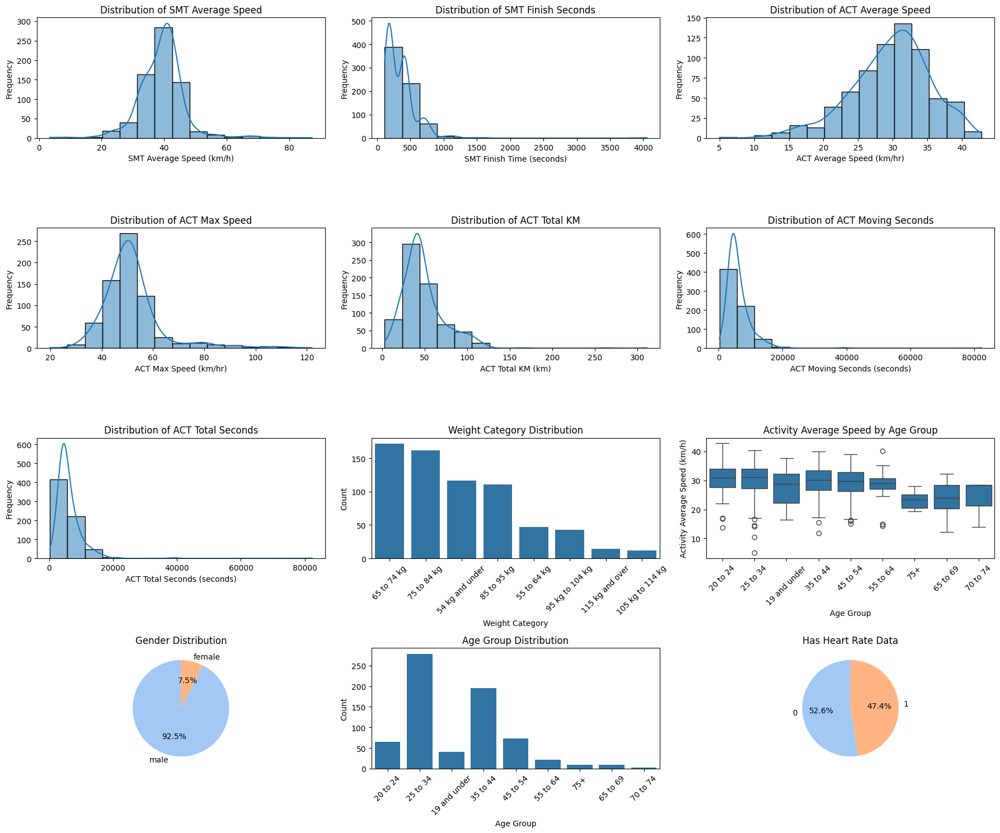

In [61]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set up visualizations with 3x3 layout to fit all histograms and plots
fig, axs = plt.subplots(4, 3, figsize=(18, 15))

# Histogram of SMT Average Speed
sns.histplot(top_10_percent_combined['smt_avg_spd'], bins=15, kde=True, ax=axs[0, 0])
axs[0, 0].set_title('Distribution of SMT Average Speed')
axs[0, 0].set_xlabel('SMT Average Speed (km/h)')
axs[0, 0].set_ylabel('Frequency')

# Histogram of SMT Finish Seconds
sns.histplot(top_10_percent_combined['smt_finish_seconds'], bins=15, kde=True, ax=axs[0, 1])
axs[0, 1].set_title('Distribution of SMT Finish Seconds')
axs[0, 1].set_xlabel('SMT Finish Time (seconds)')
axs[0, 1].set_ylabel('Frequency')

# Histogram of ACT Average Speed
sns.histplot(top_10_percent_combined['act_avg_spd'], bins=15, kde=True, ax=axs[0, 2])
axs[0, 2].set_title('Distribution of ACT Average Speed')
axs[0, 2].set_xlabel('ACT Average Speed (km/hr)')
axs[0, 2].set_ylabel('Frequency')

# Histogram of ACT Max Speed
sns.histplot(top_10_percent_combined['act_max_spd'], bins=15, kde=True, ax=axs[1, 0])
axs[1, 0].set_title('Distribution of ACT Max Speed')
axs[1, 0].set_xlabel('ACT Max Speed (km/hr)')
axs[1, 0].set_ylabel('Frequency')

# Histogram of ACT Total KM
sns.histplot(top_10_percent_combined['act_total_km'], bins=15, kde=True, ax=axs[1, 1])
axs[1, 1].set_title('Distribution of ACT Total KM')
axs[1, 1].set_xlabel('ACT Total KM (km)')
axs[1, 1].set_ylabel('Frequency')

# Histogram of ACT Moving Seconds
sns.histplot(top_10_percent_combined['act_moving_seconds'], bins=15, kde=True, ax=axs[1, 2])
axs[1, 2].set_title('Distribution of ACT Moving Seconds')
axs[1, 2].set_xlabel('ACT Moving Seconds (seconds)')
axs[1, 2].set_ylabel('Frequency')

# Histogram of ACT Total Seconds
sns.histplot(top_10_percent_combined['act_total_seconds'], bins=15, kde=True, ax=axs[2, 0])
axs[2, 0].set_title('Distribution of ACT Total Seconds')
axs[2, 0].set_xlabel('ACT Total Seconds (seconds)')
axs[2, 0].set_ylabel('Frequency')

# Distribution of Weight Categories
sns.countplot(x='user_weight_category', data=top_10_percent_combined,
              order=top_10_percent_combined['user_weight_category'].value_counts().index, ax=axs[2, 1])
axs[2, 1].set_title('Weight Category Distribution')
axs[2, 1].set_xlabel('Weight Category')
axs[2, 1].set_ylabel('Count')
axs[2, 1].tick_params(axis='x', rotation=45)

# Boxplot of Activity Average Speed by Age Group
sns.boxplot(x='user_age_group', y='act_avg_spd', data=top_10_percent_combined, ax=axs[2, 2])
axs[2, 2].tick_params(axis='x', rotation=45)
axs[2, 2].set_title('Activity Average Speed by Age Group')
axs[2, 2].set_xlabel('Age Group')
axs[2, 2].set_ylabel('Activity Average Speed (km/h)')

# Gender Distribution Pie Chart
gender_counts = top_10_percent_combined['gender'].value_counts()
axs[3, 0].pie(gender_counts, labels=gender_counts.index, autopct='%1.1f%%', startangle=90, colors=sns.color_palette("pastel"))
axs[3, 0].set_title('Gender Distribution')

# Age Group Distribution
sns.countplot(x='user_age_group', data=top_10_percent_combined, ax=axs[3, 1])
axs[3, 1].tick_params(axis='x', rotation=45)
axs[3, 1].set_title('Age Group Distribution')
axs[3, 1].set_xlabel('Age Group')
axs[3, 1].set_ylabel('Count')

# Has Heart Rate Data Distribution Pie Chart
hr_data_counts = top_10_percent_combined['has_hr_data'].value_counts()
axs[3, 2].pie(hr_data_counts, labels=hr_data_counts.index, autopct='%1.1f%%', startangle=90, colors=sns.color_palette("pastel"))
axs[3, 2].set_title('Has Heart Rate Data')

# Adjust layout for better fit
plt.tight_layout()
plt.show()


### Kesimpulan

Karakteristik performa dan fisik dari top 10% pemenang yang telah digabungkan menunjukkan pola sebagai berikut:

1. **Distribusi Umur dan Gender**:
   - **Kelompok Usia**: Mayoritas pemenang berada dalam kelompok usia **25 hingga 34 tahun**. Ini menunjukkan bahwa rentang usia ini memiliki performa terbaik dalam aktivitas tersebut.
   - **Gender**: Sebagian besar pemenang adalah **laki-laki**. Partisipasi perempuan dalam kelompok top 10% relatif lebih rendah.

2. **Kategori Berat Badan**:
   - **Kategori Berat**: Banyak pemenang berada dalam kategori berat **65 kg hingga 74 kg** dan **75 kg hingga 84 kg**. Ini menunjukkan bahwa berat badan dalam rentang ini mungkin memberikan keseimbangan optimal antara kekuatan dan kecepatan.
   - **Performa Berdasarkan Berat**: Pemenang dengan berat badan lebih ringan cenderung memiliki kecepatan rata-rata yang lebih tinggi, sementara yang lebih berat mungkin memiliki kekuatan tahan lama dalam jarak yang lebih panjang.

3. **Kecepatan dan Waktu Penyelesaian**:
   - **Kecepatan Rata-Rata SMT (smt_avg_spd)**: Pemenang top 10% memiliki kecepatan rata-rata sekitar **39 km/jam** atau lebih tinggi pada segmen SMT, menunjukkan tingkat performa yang tinggi.
   - **Waktu Penyelesaian SMT (smt_finish_seconds)**: Waktu penyelesaian mereka umumnya lebih cepat dibandingkan dengan peserta lain, mencerminkan efisiensi dan kecepatan dalam segmen tersebut.

4. **Aktivitas Keseluruhan**:
   - **Kecepatan Rata-Rata Aktivitas (act_avg_spd)**: Kecepatan rata-rata dalam seluruh aktivitas berkisar antara **32 km/jam hingga 36 km/jam**, menunjukkan konsistensi performa tinggi tidak hanya pada segmen SMT tetapi juga dalam keseluruhan aktivitas.
   - **Jarak Total Aktivitas (act_total_km)**: Pemenang top 10% sering menempuh jarak antara **60 km hingga 100 km**, menunjukkan tingkat ketahanan dan stamina yang baik.


5. **Data Denyut Jantung (HR Data)**:
   - **Penggunaan HR Monitor**: Hanya sekitar sedikit lebih dari setengah dari top 10% pemenang yang memiliki data denyut jantung yang terekam. Hal ini menunjukkan bahwa meskipun beberapa pemenang serius dalam memonitor performa mereka secara fisiologis, sebagiannya lagi tidak menggunakan Heart Rate monitor.


### Referensi

- [First Step in EDA: Descriptive Statistics Analysis](https://medium.com/analytics-vidhya/first-step-in-eda-descriptive-statistics-analysis-f49ca309da15)
- [Descriptive Statistics: Definition, Overview, Types, and Examples](https://www.investopedia.com/terms/d/descriptive_statistics.asp)


## Segmen mana yang paling sering diikuti oleh peserta dari kategori usia tertentu?

#### Frekuensi segment Berdasarkan Kategori Umur

In [62]:
segment_age_freq = df_clean.groupby(['user_age_group', 'smt_name']).size().unstack(fill_value=0)
segment_age_freq

smt_name,Al Fardoos to shellfish round about,Headquarters Business Park,King Street side,North Corniche,Obhur North Short,Oghor 2 SailsIsland,PRINCE SULTAN - ASSALAM TO FATIMA,S.Ubhur Alkurnaysh South Bound with detour,Starbucks to Majid
user_age_group,,,,,,,,,
19 and under,9,93,26,44,10,46,14,17,38
20 to 24,9,170,48,97,11,120,17,17,79
25 to 34,57,691,247,459,68,568,139,96,383
35 to 44,47,428,183,309,63,357,123,86,270
45 to 54,30,131,65,112,37,137,50,29,76
55 to 64,4,25,20,29,10,24,16,8,16
65 to 69,0,3,1,3,1,4,1,1,2
70 to 74,0,1,0,1,0,1,0,0,0
75+,1,3,2,2,1,3,1,1,1


#### Visualisasi Line Chart

In [63]:
alphabet_labels = [chr(97 + i).upper() for i in range(len(segment_age_freq.columns))]

mapping_table = dict(zip(alphabet_labels, segment_age_freq.columns))
mapping_df = pd.DataFrame(list(mapping_table.items()), columns=['Label', 'Nama Segmen'])
mapping_df


,Label,Nama Segmen
0,A,Al Fardoos to shellfish round about
1,B,Headquarters Business Park
2,C,King Street side
3,D,North Corniche
4,E,Obhur North Short
5,F,Oghor 2 SailsIsland
6,G,PRINCE SULTAN - ASSALAM TO FATIMA
7,H,S.Ubhur Alkurnaysh South Bound with detour
8,I,Starbucks to Majid


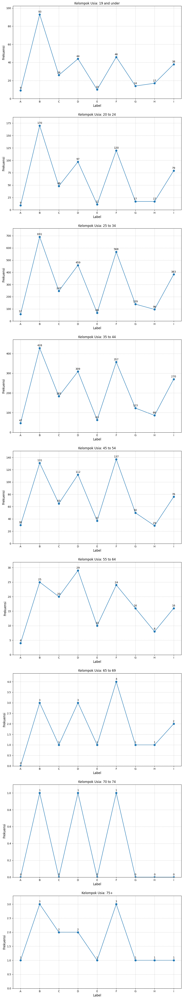

In [64]:
n_groups = len(segment_age_freq.index)

fig, axes = plt.subplots(n_groups, 1, figsize=(10, 6*n_groups))

for i, age_group in enumerate(segment_age_freq.index):
    ax = axes[i] if n_groups > 1 else axes

    ax.plot(alphabet_labels, segment_age_freq.loc[age_group], zorder=1)
    ax.scatter(alphabet_labels, segment_age_freq.loc[age_group], s=50, zorder=2)

    ax.set_title(f'Kelompok Usia: {age_group}', fontsize=12)
    ax.set_xlabel('Label', fontsize=12)
    ax.set_ylabel('Frekuensi', fontsize=12)

    ax.set_xticks(range(len(alphabet_labels)))
    ax.set_xticklabels(alphabet_labels, fontsize=10)
    ax.tick_params(axis='y', labelsize=10)
    ax.grid(True, linestyle='--', alpha=0.7)

    y_max = segment_age_freq.loc[age_group].max()
    ax.set_ylim(0, y_max + (y_max * 0.1))

    for x, y in zip(range(len(alphabet_labels)), segment_age_freq.loc[age_group]):
        ax.annotate(str(y), (x, y), textcoords="offset points", xytext=(0,7), ha='center')

plt.tight_layout()
plt.subplots_adjust(hspace=0.2)

#### Kesimpulan

Berdasarkan hasil analisis line chart di atas, dapat disimpulkan bahwa segmen **Headquarters Business Park** adalah segmen yang paling dominan dan menarik perhatian mayoritas kelompok usia, terutama pada kelompok usia `19 and under`, `20 to 24`, `25 to 34`, dan `35 to 44`, dengan frekuensi tertinggi masing-masing sebesar 93, 170, 691, dan 428. Hal ini menunjukkan bahwa segmen tersebut menjadi daya tarik utama bagi kelompok usia produktif dan menengah.

Segmen **Oghor 2 SailsIsland** juga memiliki daya tarik tersendiri, khususnya bagi kelompok usia `45 to 54` dengan frekuensi tertinggi sebesar 137 dan kelompok usia `65 to 69` dengan frekuensi tertinggi sebesar 4. Selain itu, segmen **North Corniche** menunjukkan daya tarik khusus pada kelompok usia `55 to 64` dengan frekuensi sebesar 29 peserta.

Kasus unik terlihat pada kelompok usia `70 to 74`, di mana tidak ada segmen yang secara dominan diikuti karena frekuensi tertinggi tersebar merata di tiga segmen, yaitu **Headquarters Business Park**, **North Corniche**, dan **Oghor 2 SailsIsland**, masing-masing dengan frekuensi 1 peserta. Hal ini menunjukkan tidak adanya preferensi segmen yang jelas pada kelompok usia ini.

Pada kelompok usia `75+`, segmen **Headquarters Business Park** dan **Oghor 2 SailsIsland** sama-sama memiliki frekuensi sebesar 3 peserta, menunjukkan bahwa kedua segmen ini masih relevan meskipun dengan daya tarik yang lebih rendah dibanding kelompok usia lainnya.

Secara keseluruhan, **Headquarters Business Park** dapat dianggap sebagai segmen utama yang paling menarik di berbagai kelompok usia, sedangkan **Oghor 2 SailsIsland** dan **North Corniche** menjadi segmen pelengkap yang relevan untuk kelompok usia tertentu. Preferensi segmen menunjukkan pola yang berbeda-beda sesuai dengan kelompok usia, dengan daya tarik segmen yang cenderung menurun pada usia yang lebih tua.

Referensi :
https://medium.com/@gozdemadendere/data-visualization-for-exploratory-data-analysis-eda-ddf850539575

## Segmen Apa yang Memiliki Leaderboard Perempuan dan Laki-Laki dengan Performa Paling Unggul?

#### Eksplorasi Awal

Pertama, saya akan mencoba untuk menggunakan statistik deskriptif dari atribut `smt_avg_speed`. Saya memilih atribut ini terlebih dahulu karena langsung mengukur performa peserta saat menyelesaikan segmen, jadi ini bisa menjadi indikator utama yang mencerminkan kinerja optimal di lintasan.  

In [65]:
df_eda = df_clean.copy()
df_eda.head()

,user_age_group,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data
0,25 to 34,2017-12-22,male,712,15.8,382,Headquarters Business Park,54 kg and under,Night Ride,13.6,34.9,19.24,5103,5103,0
1,25 to 34,2015-04-13,male,189,33.2,216,Oghor 2 SailsIsland,105 kg to 114 kg,Night Ride,21.5,43.2,23.47,3926,3926,0
2,25 to 34,2018-02-07,male,264,23.7,593,Starbucks to Majid,75 to 84 kg,Evening Ride,26.7,92.9,38.23,5152,5152,0
3,25 to 34,2018-08-24,male,50,33.4,817,Al Fardoos to shellfish round about,75 to 84 kg,Afternoon Ride,31.4,54.4,65.77,7548,7548,1
4,25 to 34,2020-03-06,female,19,21.3,284,Headquarters Business Park,54 kg and under,ثاني تمرين ١٠٠كم,19.9,43.2,96.53,17493,17493,0


In [66]:
smt_avg_spd_arr = df_eda["smt_avg_spd"].dropna()
stats = [
    ['Mean', np.mean(smt_avg_spd_arr)],
    ['Median', np.median(smt_avg_spd_arr)],
    ['Mode', scp.mode(smt_avg_spd_arr)[0]],
    ['Standard Deviation', np.std(smt_avg_spd_arr)],
    ['Variance', np.var(smt_avg_spd_arr)],
    ['Minimum', np.min(smt_avg_spd_arr)],
    ['Maximum', np.max(smt_avg_spd_arr)],
]
pd.DataFrame(stats, columns=['Measure', 'Value'])

,Measure,Value
0,Mean,26.809250
1,Median,26.500000
2,Mode,28.900000
3,Standard Deviation,8.447389
4,Variance,71.358376
5,Minimum,0.800000
6,Maximum,87.300000


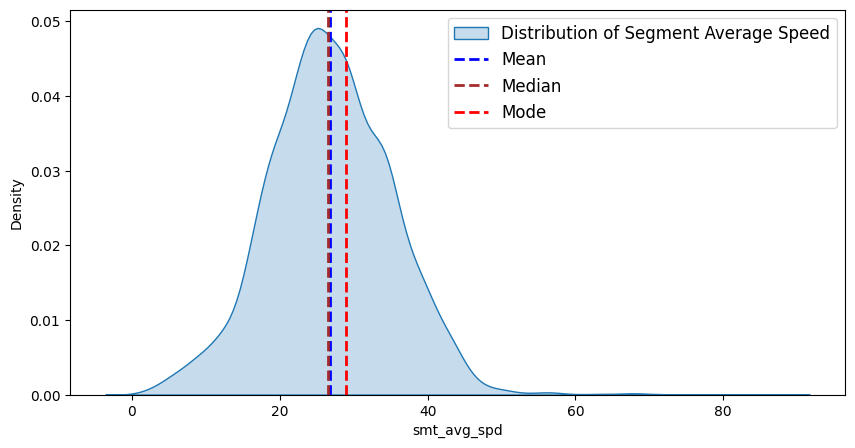

In [67]:
plt.figure(figsize=(10, 5))

# Plot KDE
sns.kdeplot(smt_avg_spd_arr, shade=True)

mean_val = np.mean(smt_avg_spd_arr)
median_val = np.median(smt_avg_spd_arr)
mode_val = scp.mode(smt_avg_spd_arr)[0]

plt.axvline(x=mean_val, color='blue', linestyle='--', linewidth=2, label='Mean')
plt.axvline(x=median_val, color='brown', linestyle='--', linewidth=2, label='Median')
plt.axvline(x=mode_val, color='red', linestyle='--', linewidth=2, label='Mode')

plt.legend(['Distribution of Segment Average Speed', 'Mean', 'Median', 'Mode'], fontsize=12)
plt.show()

**Penjelasan:**
- Dapat dilihat bahwa measure yang terbesar ke terkecil adalah Mode > Mean > Median.

- Rentang nilai maximum sebesar **87.3** dan minimum sebesar **0.8** menunjukkan bahwa data sangat bervariasi. Rentang ini mengindikasikan bahwa data berisikan outliers yang dapat memengaruhi distribusi data. Hal ini dapat dilihat dengan jelas menggunakan visualisasi box plot.

- Standar deviasi sebesar **8.45** menunjukkan bahwa data cukup tersebar dari rata-rata. Dikarenakan nilai median dan mean sangat memiliki nilai yang hampir mirip, dapat diartikan bahwa **distribusi data cenderung hampir normal**. Maka dari itu, kita dapat menggunakan **mean** dalam analisis ini karena masih bisa dianggap representatif.

Agar lebih jelas jika ingin melihat adanya outlier atau tidak, kita dapat menggunakan boxplot. Berikut adalah kodenya:

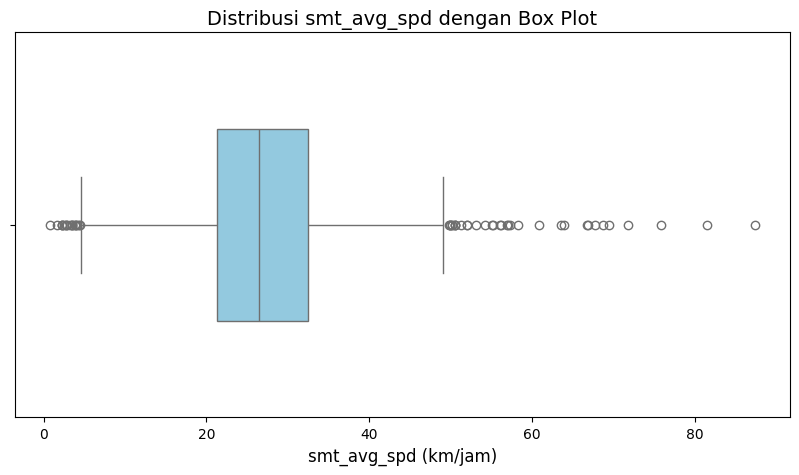

In [68]:
plt.figure(figsize=(10, 5))

# Plot box plot
sns.boxplot(x=smt_avg_spd_arr, color='skyblue', width=0.5)

plt.title("Distribusi smt_avg_spd dengan Box Plot", fontsize=14)
plt.xlabel("smt_avg_spd (km/jam)", fontsize=12)

# Tampilkan plot
plt.show()

**Penjelasan:**
- Dilihat pada gambar di atas, sudah dapat dipastikan bahwa atribut `smt_avg_spd` memiliki outliers yang dapat dilihat pada lingkaran kecil di sekitar kanan dan kiri.

- Outliers muncul karena adanya peserta yang melakukan aktivitas dengan kecepatan yang jauh lebih tinggi atau lebih rendah dibandingkan dengan mayoritas peserta lainnya.

- Maka dari itu, jika ingin menampilkan top segmen untuk female dan male menurut saya kurang cocok memakai box plot karena adanya outlier jadi lumayan susah untuk divisualisasikan.

Selain itu, waktu penyelesaian segmen atau `smt_finish_seconds` adalah salah satu indikator utama yang memengaruhi performa terbaik pada setiap segmen. Peserta dengan waktu penyelesaian yang lebih singkat biasanya memiliki performa yang lebih baik, karena waktu adalah salah satu metrik utama dalam menentukan peringkat leaderboard.

In [69]:
# Ambil data smt_finish_seconds yang bersih
smt_finish_seconds_arr = df_eda["smt_finish_seconds"].dropna()

# Hitung statistik
stats = [
    ['Mean', np.mean(smt_finish_seconds_arr)],
    ['Median', np.median(smt_finish_seconds_arr)],
    ['Mode', scp.mode(smt_finish_seconds_arr)[0]],
    ['Standard Deviation', np.std(smt_finish_seconds_arr)],
    ['Variance', np.var(smt_finish_seconds_arr)],
    ['Minimum', np.min(smt_finish_seconds_arr)],
    ['Maximum', np.max(smt_finish_seconds_arr)],
]

# Buat DataFrame untuk menampilkan statistik
pd.DataFrame(stats, columns=['Measure', 'Value'])

,Measure,Value
0,Mean,531.276224
1,Median,439.000000
2,Mode,209.000000
3,Standard Deviation,431.940557
4,Variance,186572.644934
5,Minimum,112.000000
6,Maximum,9224.000000


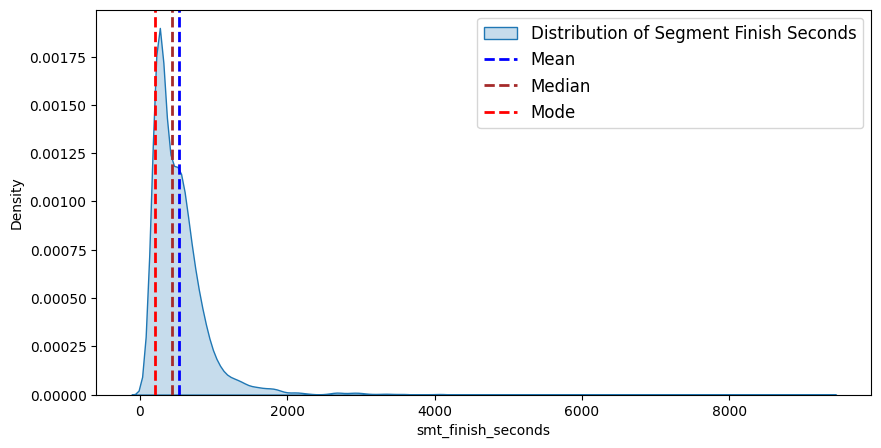

In [70]:
# Plot distribusi (KDE) dan statistik
plt.figure(figsize=(10, 5))

# Plot KDE
sns.kdeplot(smt_finish_seconds_arr, shade=True)

# Hitung nilai mean, median, dan mode
mean_val = np.mean(smt_finish_seconds_arr)
median_val = np.median(smt_finish_seconds_arr)
mode_val = scp.mode(smt_finish_seconds_arr)[0]

# Tambahkan garis mean, median, dan mode pada grafik
plt.axvline(x=mean_val, color='blue', linestyle='--', linewidth=2, label='Mean')
plt.axvline(x=median_val, color='brown', linestyle='--', linewidth=2, label='Median')
plt.axvline(x=mode_val, color='red', linestyle='--', linewidth=2, label='Mode')

# Tambahkan legenda
plt.legend(['Distribution of Segment Finish Seconds', 'Mean', 'Median', 'Mode'], fontsize=12)
plt.show()

**Penjelasan:**
- Dapat dilihat bahwa measure yang terbesar ke terkecil adalah Mean > Median > Mode.

- Rentang nilai maximum sebesar **9224** dan minimum sebesar **112** menunjukkan bahwa data sangat bervariasi. Rentang ini mengindikasikan bahwa data berisikan outliers yang dapat memengaruhi distribusi data.

- Standar deviasi sebesar **432.501** menunjukkan bahwa data cukup tersebar dari rata-rata.

- DIkarenakan distribusinya right-skewed (positive skewness), maka perlu hati-hati dalam menggunakan mean sebagai ukuran representatif. Hal ini dikarenakan, nilai ekstrem seperti outlier yang memengaruhi rata-rata. Maka dari itu, dalam kasus ini, kita bisa menggunakan **median** karena lebih stabil, representatif, dan lebih tahan terhadap outlier.

Selain itu, kita tidak lupa untuk menampilkan proporsi data `gender` menggunakan pie chart agar dapat mengetahui bagaimana distribusi gender pada dataset.

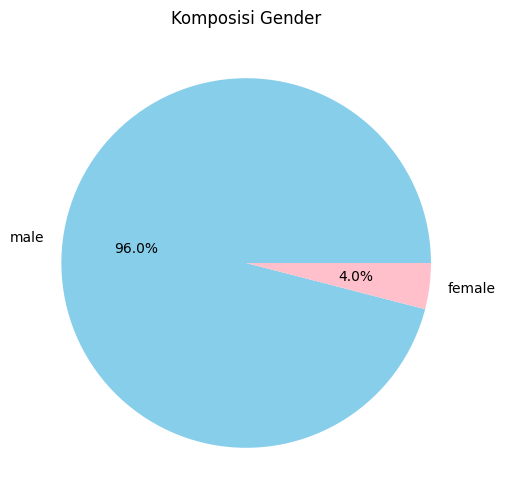

In [71]:
gender_counts = df_eda['gender'].value_counts()
plt.figure(figsize=(6, 6))
plt.pie(
    gender_counts,
    labels=gender_counts.index,
    autopct='%1.1f%%',
    colors=['skyblue', 'pink']
)
plt.title('Komposisi Gender')
plt.show()

**Penjelasan:**
- Mayoritas data berasal dari gender male sebanyak **96%** dan gender female sebanyak **4%**.
- Hal ini menunjukkan ketidakseimbangan data antara male dan female di dataset.

#### Korelasi Antar-Variabel

Kemudian, saya akan mengidentifikasi hubungan antar variabel, memprediksi perilaku data atau variabel, dan membuat keputusan yang lebih baik jika variabel-variabel tersebut saling berkaitan.

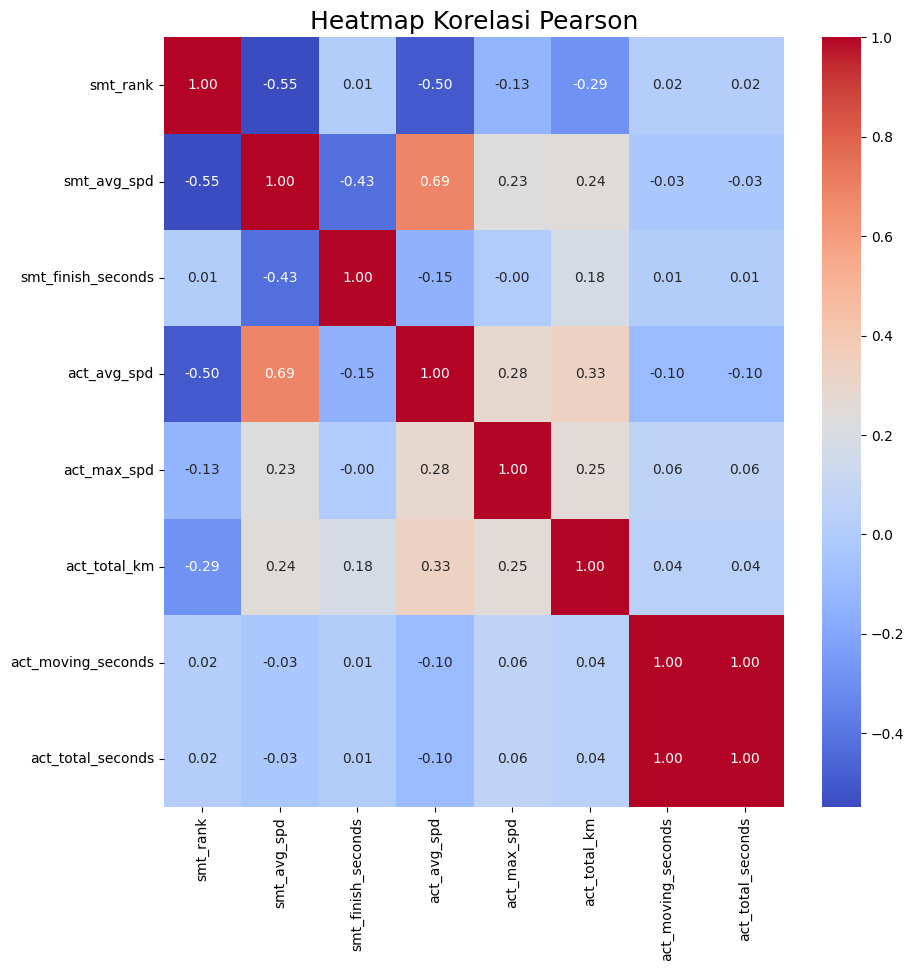

In [72]:
# Seleksi hanya kolom numerik untuk perhitungan korelasi Pearson
numeric_df = df_eda.select_dtypes(include=[np.number])

# Hilangkan kolom kategorikal yang bertipe numerik
numeric_df = numeric_df.drop(columns=['has_hr_data'])

# Hitung korelasi Pearson
correlation_matrix = numeric_df.corr(method='pearson')

# Seleksi hanya kolom numerik untuk perhitungan korelasi Pearson
numeric_df = df_eda.select_dtypes(include=[np.number])

plt.figure(figsize=(10, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', cbar=True)
plt.title("Heatmap Korelasi Pearson", fontsize=18)
plt.show()

**Penjelasan:**

Terlihat pada korelasi di atas bahwa:

**1. Korelasi Negatif**
- `smt_rank` dan `smt_avg_spd`: **-0.55** (artinya semakin tinggi kecepatan rata-rata segmen, semakin kecil atau lebih baik peringkatnya)

- `smt_avg_spd` dan `smt_finish_seconds`: **-0.43** (semakin tinggi kecepatan rata-rata segmen, semakin singkat waktu penyelesaian segmen)

**2. Korelasi Positif**
- `act_moving_seconds` dan `act_total_seconds`: **1.00** (korelasi sempurna, keduanya bergerak dalam arah yang sama, kemungkinan karena variabel yang saling terkait)

- `act_avg_spd` dan `smt_avg_spd`: **0.69** (artinya semakin tinggi kecepatan rata-rata aktivitas, semakin tinggi juga kecepatan rata-rata segmen yang dicapai)

Untuk mencari segmen mana yang terbaik, berikut adalah atribut yang saya pilih beserta alasannya:
- `smt_avg_spd`: memberi gambaran tentang seberapa cepat peserta menyelesaikan segmen.
- `smt_finish_seconds`: mengukur efisiensi peserta dalam menyelesaikan segmen, semakin cepat berarti semakin baik.
- `smt_rank`: menunjukkan peserta yang berada di posisi terbaik pada leaderboard.
- `gender`: membandingkan performa antara pria dan wanita.
- `smt_name`: untuk mengidentifikasi dan membandingkan performa antar-segmen.

Pemilihan atribut ini didukung oleh sumber dari STRAVA, yang menjelaskan bahwa leaderboard ditentukan berdasarkan kecepatan rata-rata (average speed), waktu (time), dan peringkat (rank).

##### `smt_avg_spd` vs `smt_finish_seconds`

Setelah memvisualisasikan korelasi antar atribut menggunakan heatmap, untuk memperjelas hubungan antara `smt_avg_spd` dan `smt_finish_seconds` berdasarkan `gender`, saya akan menggunakan scatter plot dengan linear regression terpisah untuk setiap gender.

Menggunakan jenis visualisasi ini bertujuan untuk menampilkan garis lurus yang menunjukkan pola hubungan antara dua variabel. Hal ini dapat membantu memahami seberapa kuat atau lemah hubungan dan mengetahui hubungan meningkat atau menurun.

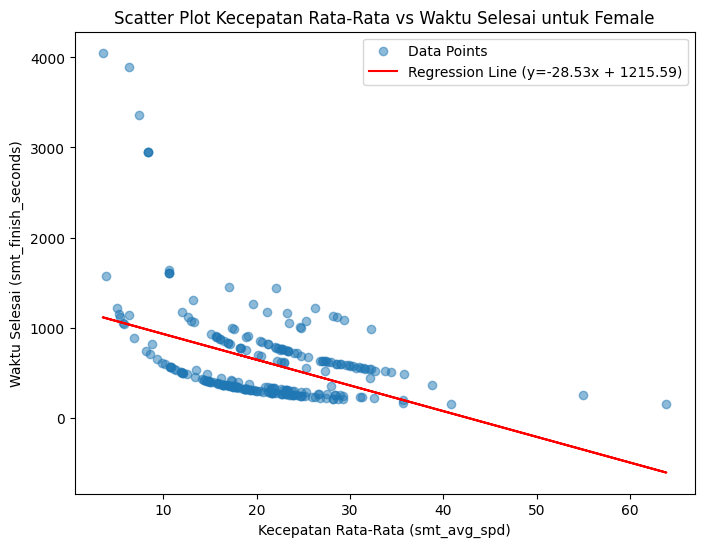

In [73]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Filter data untuk gender 'Female'
df_female = df_eda[df_eda['gender'] == 'female'][["smt_avg_spd", "smt_finish_seconds"]]

# Scatter plot untuk gender 'Female' saja
plt.figure(figsize=(8, 6))
plt.scatter(df_female["smt_avg_spd"], df_female["smt_finish_seconds"], alpha=0.5, label="Data Points")

# Perhitungan linear regression
x = df_female["smt_avg_spd"]
y = df_female["smt_finish_seconds"]
m, b = np.polyfit(x, y, 1)  # m = slope, b = intercept

# Plot regression line
plt.plot(x, m * x + b, color='red', label=f"Regression Line (y={m:.2f}x + {b:.2f})")

# Menambahkan label dan judul
plt.xlabel("Kecepatan Rata-Rata (smt_avg_spd)")
plt.ylabel("Waktu Selesai (smt_finish_seconds)")
plt.title("Scatter Plot Kecepatan Rata-Rata vs Waktu Selesai untuk Female")
plt.legend()
plt.show()


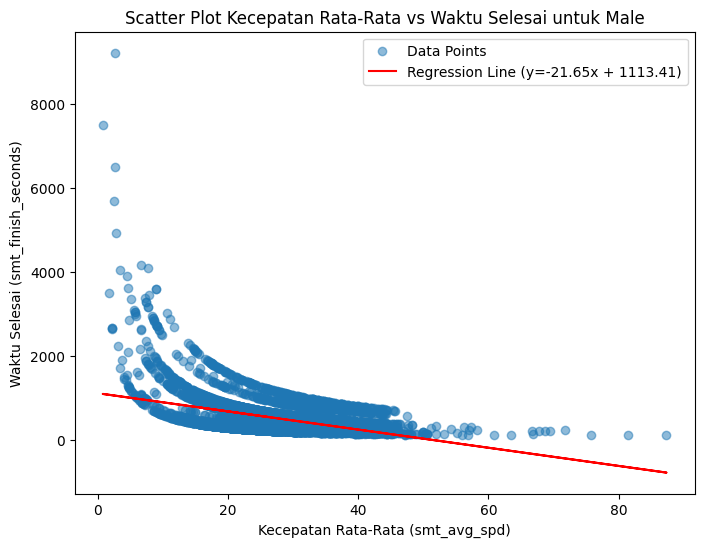

In [74]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Filter data untuk gender 'Male'
df_female = df_eda[df_eda['gender'] == 'male'][["smt_avg_spd", "smt_finish_seconds"]]

# Scatter plot untuk gender 'Male' saja
plt.figure(figsize=(8, 6))
plt.scatter(df_female["smt_avg_spd"], df_female["smt_finish_seconds"], alpha=0.5, label="Data Points")

# Perhitungan linear regression
x = df_female["smt_avg_spd"]
y = df_female["smt_finish_seconds"]
m, b = np.polyfit(x, y, 1)

# Plot regression line
plt.plot(x, m * x + b, color='red', label=f"Regression Line (y={m:.2f}x + {b:.2f})")

# Menambahkan label dan judul
plt.xlabel("Kecepatan Rata-Rata (smt_avg_spd)")
plt.ylabel("Waktu Selesai (smt_finish_seconds)")
plt.title("Scatter Plot Kecepatan Rata-Rata vs Waktu Selesai untuk Male")
plt.legend()
plt.show()


**Penjelasan:**

Dari kedua scatter plot di atas, berikut adalah insight yang didapat:

**1. Hubungan Kecepatan dan Waktu:**
- Kedua gender menunjukkan hubungan negatif antara kecepatan rata-rata dan waktu penyelesaian, di mana peningkatan kecepatan rata-rata berkontribusi pada pengurangan waktu penyelesaian segmen.
   
**2. Perbedaan Gender:**
- Peserta laki-laki memiliki persebaran data yang lebih luas dibandingkan perempuan, terutama pada kecepatan tinggi. Hal ini yang menunjukkan performa laki-laki cenderung lebih bervariasi.
- Garis regresi untuk perempuan memiliki slope yang lebih curam sekitar **-28.53** dibandingkan laki-laki sekitar **-21.55**. Hal ini menunjukkan bahwa kecepatan memiliki pengaruh yang lebih besar terhadap waktu penyelesaian untuk peserta perempuan.

**3. Tambahan:**
- Kemungkinan, adanya faktor lain yang dapat memengaruhi variasi dalam waktu penyelesaian.
- Perlunya perbandingan antar segmen untuk analisis lebih lanjut.

##### `smt_rank` vs `gender`

Selanjutnya, saya akan menganalisis distribusi peringkat berdasarkan `gender` untuk melihat apakah ada dominasi male atau female dalam leaderboard.

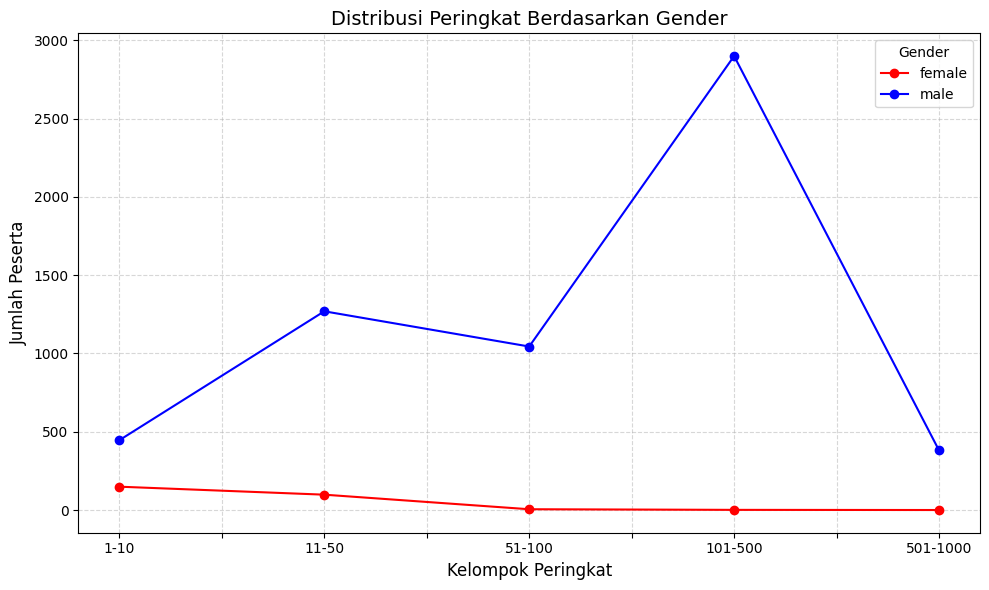

In [75]:
# Interval peringkat
df_eda['rank_group'] = pd.cut(
    df_eda['smt_rank'],
    bins=[0, 10, 50, 100, 500, 1000],
    labels=['1-10', '11-50', '51-100', '101-500', '501-1000']
)

# Kelompokkan berdasarkan gender dan interval peringkat
rank_group_gender = df_eda.groupby(['rank_group', 'gender']).size().unstack(fill_value=0)

# Plot line chart
ax = rank_group_gender.plot(
    kind='line',
    figsize=(10, 6),
    marker='o',
    color=['red', 'blue']
)

plt.title('Distribusi Peringkat Berdasarkan Gender', fontsize=14)
plt.xlabel('Kelompok Peringkat', fontsize=12)
plt.ylabel('Jumlah Peserta', fontsize=12)
plt.legend(title='Gender', fontsize=10)
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()  # Mengatur tata letak agar lebih rapi
plt.show()


**Penjelasan:**
- Dari visualisasi di atas, menunjukkan bahwa jumlah peserta male jauh lebih tinggi dibandingkan peserta female di hampir semua kelompok peringkat.
- Hal ini mengindikasikan bahwa peserta male lebih mendominasi leaderboard.

#### Visualisasi Kecepatan Rata-Rata Tiap Segmen

Selanjutnya, saya akan menunjukkan hasil analisis untuk tiap `gender` yang memiliki kecepatan rata-rata terbaik per-segmen.

In [76]:
# Mengelompokkan Data Berdasarkan Segmen dan Gender
gabung = df_eda.groupby(['smt_name', 'gender'])

# Menghitung Kecepatan Rata-Rata dan Maksimum serta Jumlah Percobaan Per-Segmen dan Gender
avg_speed = gabung['smt_avg_spd'].mean()
max_speed = gabung['smt_avg_spd'].max()
attempts = gabung['smt_avg_spd'].count()

# Menghitung Rata-Rata Waktu Selesai dan Waktu Terbaik Per-Segmen dan Gender
avg_time = gabung['smt_finish_seconds'].median()
best_time = gabung['smt_finish_seconds'].min()

# Menghitung Rank Terbaik Per-Segmen
best_rank = gabung['smt_rank'].min()

# Menggabungkan Hasil Perhitungan
analisis = pd.DataFrame({
    'avg_speed': avg_speed,
    'max_speed': max_speed,
    'attempts': attempts,
    'avg_time': avg_time,
    'best_time': best_time,
})

analisis = analisis.reset_index()

# Merapikan Kolom
analisis.columns = ['smt_name', 'gender', 'avg_speed', 'max_speed', 'attempts', 'avg_time', 'best_time']

# Display DataFrame
display(analisis)

,smt_name,gender,avg_speed,max_speed,attempts,avg_time,best_time
0,Al Fardoos to shellfish round about,female,24.300000,25.3,2,1124.0,1080
1,Al Fardoos to shellfish round about,male,34.210968,47.5,155,770.0,574
2,Headquarters Business Park,female,17.806250,40.8,112,341.0,148
3,Headquarters Business Park,male,22.674389,47.2,1433,269.0,128
4,King Street side,female,23.787500,32.7,16,633.5,520
5,King Street side,male,28.422222,71.8,576,603.0,237
6,North Corniche,female,25.339474,35.8,38,718.5,485
7,North Corniche,male,28.690275,57.3,1018,595.0,303
8,Obhur North Short,female,15.409091,24.8,11,1453.0,998
9,Obhur North Short,male,25.944737,39.0,190,876.0,633


Oleh karena itu, untuk menyimpulkan performa setiap segmen berdasarkan gender, lebih baik menggunakan visualisasi **line plot** yang memisahkan data berdasarkan gender (female dan male).

**Line plot** dipilih karena mampu memberikan gambaran yang jelas tentang tren rata-rata kecepatan (average speed) pada setiap segmen. Dengan menggunakan **line plot**, perbedaan dan pola performa antara kedua gender dapat terlihat dengan lebih terstruktur, terutama ketika data memiliki variasi yang signifikan. Selain itu, tampilan titik-titik yang dihubungkan oleh garis membantu memvisualisasikan perubahan atau pola sehingga lebih mudah untuk memahami performa masing-masing gender pada setiap segmen.

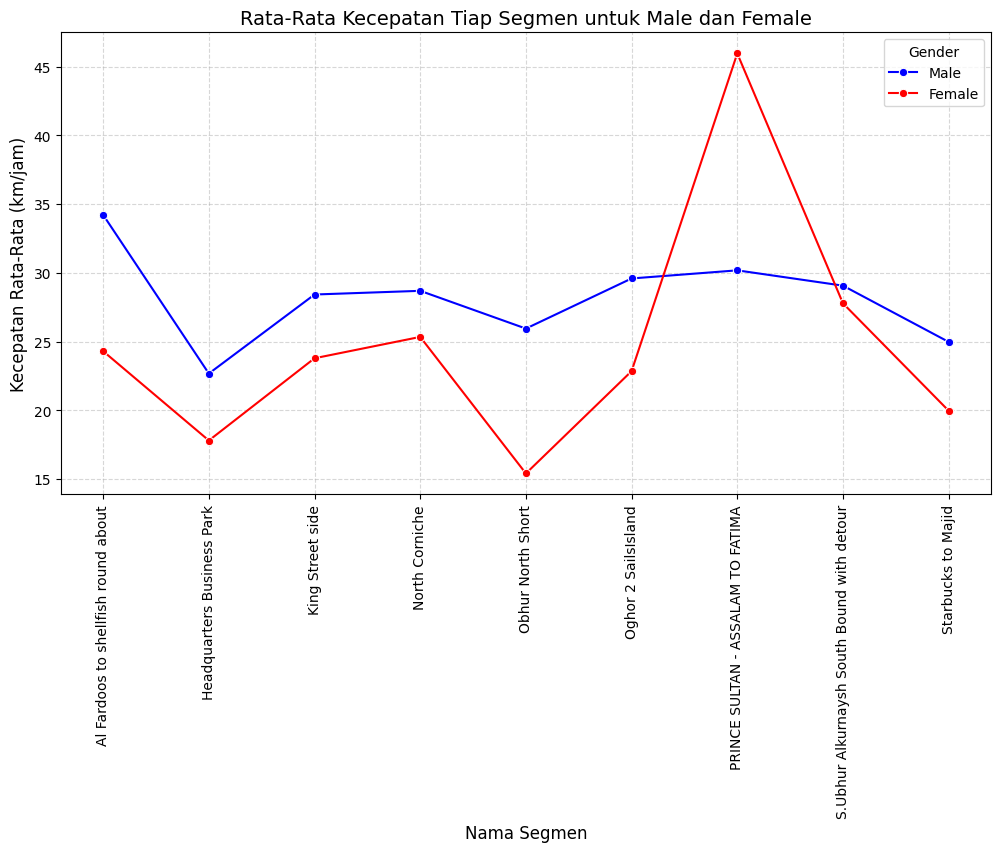

In [77]:
plt.figure(figsize=(12, 6))

# Mengambil data untuk laki-laki dan perempuan
male_data = analisis[analisis['gender'] == 'male']
female_data = analisis[analisis['gender'] == 'female']

# Plot untuk laki-laki
sns.lineplot(data=male_data, x='smt_name', y='avg_speed', color='blue', marker='o', label='Male')

# Plot untuk perempuan
sns.lineplot(data=female_data, x='smt_name', y='avg_speed', color='red', marker='o', label='Female')

# Menambahkan label dan judul
plt.title('Rata-Rata Kecepatan Tiap Segmen untuk Male dan Female', fontsize=14)
plt.xlabel('Nama Segmen', fontsize=12)
plt.ylabel('Kecepatan Rata-Rata (km/jam)', fontsize=12)
plt.xticks(rotation=90)
plt.grid(True, linestyle='--', alpha=0.5)
plt.legend(title='Gender')

# Menampilkan plot
plt.show()


**Penjelasan:**

**1. Performa Gender di Setiap Segmen**
- Male secara konsisten memiliki kecepatan rata-rata lebih tinggi dibandingkan female di hampir semua segmen.
- Hal ini menunjukkan bahwa dalam hal kecepatan rata-rata, male memiliki performa yang lebih baik dibandingkan female pada sebagian besar segmen.

**2. Segmen dengan Performa Tertinggi**
- Segmen **"PRINCE SULTAN - ASSALAM TO FATIMA"** memiliki kecepatan rata-rata tertinggi untuk female.
- Segmen **"Al Fardoos to shellfish round about"** memiliki kecepatan rata-rata tertinggi untuk male.

#### Visualisasi Waktu Rata-Rata Tiap Segmen

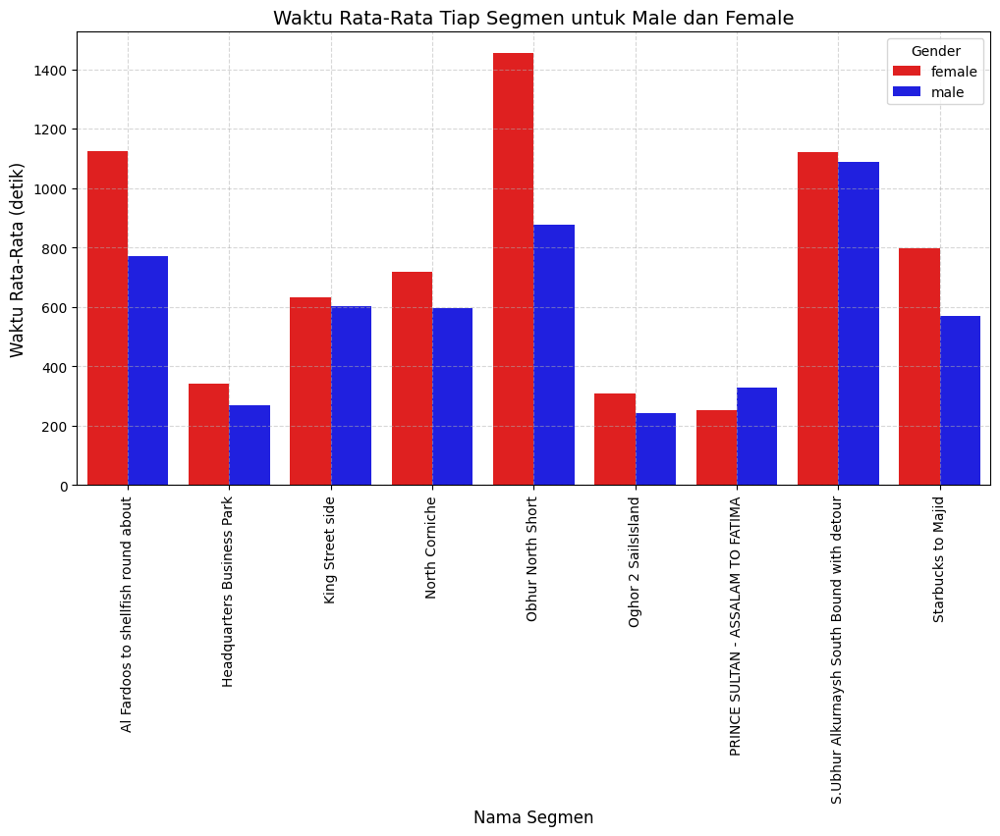

In [78]:
plt.figure(figsize=(12, 6))

# Membuat bar plot
sns.barplot(
    data=analisis,
    x='smt_name',
    y='avg_time',
    hue='gender',
    palette={'male': 'blue', 'female': 'red'}
)

# Menambahkan label dan judul
plt.title('Waktu Rata-Rata Tiap Segmen untuk Male dan Female', fontsize=14)
plt.xlabel('Nama Segmen', fontsize=12)
plt.ylabel('Waktu Rata-Rata (detik)', fontsize=12)
plt.xticks(rotation=90)
plt.legend(title='Gender')
plt.grid(True, linestyle='--', alpha=0.5)
plt.show()


**Penjelasan:**

**1. Best TIme:**
- Segmen **"PRINCE SULTAN - ASSALAM TO FATIMA"** memiliki waktu tempuh rata-rata terkecil untuk female.
- Segmen **"Oghor 2 SailsIsland"** memiliki waktu tempuh rata-rata terkecil untuk male.

**2. Performa:**
- Untuk tiap segmen, waktu tempuh rata-rata male lebih cepat dibandingkan female.
- Hal ini mengindikasikan bahwa peserta male memiliki performa yang lebih unggul dibandingkan female.

#### Visualisasi Performa Terbaik Tiap Segmen

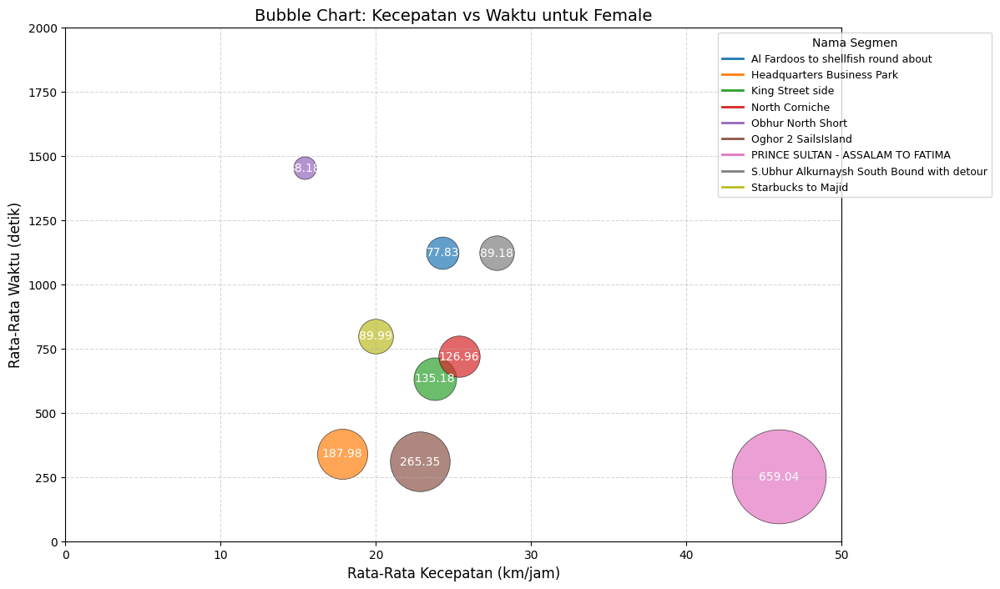

In [79]:
from matplotlib.lines import Line2D
# Warna unik untuk setiap segmen
colors = plt.cm.tab10(range(len(female_data['smt_name'].unique())))

plt.figure(figsize=(12, 8))

# Membuat scatter plot (bubble chart)
for i, (name, group) in enumerate(female_data.groupby('smt_name')):
    # Mengonversi waktu rata-rata dari detik ke jam
    group['avg_time_hours'] = group['avg_time'] / 3600

    # Menghitung efisiensi (kecepatan rata-rata dibagi waktu rata-rata dalam jam)
    group['efficiency'] = group['avg_speed'] / group['avg_time_hours']

    # Ukuran bubble sesuai dengan kecepatan dan waktu rata-rata
    bubble_size = group['efficiency'] * 10

    # Membuat scatter plot untuk setiap segmen
    scatter = plt.scatter(
        group['avg_speed'],
        group['avg_time'],
        s=bubble_size,
        color=[colors[i]],
        alpha=0.7,
        edgecolors='black',
        linewidth=0.5,
        label=name
    )

    # Menambahkan angka efisiensi ke dalam bubble
    for j, (x, y, efficiency) in enumerate(zip(group['avg_speed'], group['avg_time'], group['efficiency'])):
        plt.text(x, y, f'{efficiency:.2f}', ha='center', va='center', fontsize=10, color='white')

# Menambahkan label dan judul
plt.title('Bubble Chart: Kecepatan vs Waktu untuk Female', fontsize=14)
plt.xlabel('Rata-Rata Kecepatan (km/jam)', fontsize=12)
plt.ylabel('Rata-Rata Waktu (detik)', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.5)

# Membuat legend manual dengan garis
legend_elements = [
    Line2D([0], [0], color=colors[i], lw=2, label=name)
    for i, name in enumerate(female_data['smt_name'].unique())
]

plt.xlim(0, 50)
plt.ylim(0, 2000)

# Menambahkan legend
plt.legend(handles=legend_elements, loc='upper right', fontsize=9, title='Nama Segmen', bbox_to_anchor=(1.2, 1))
plt.show()


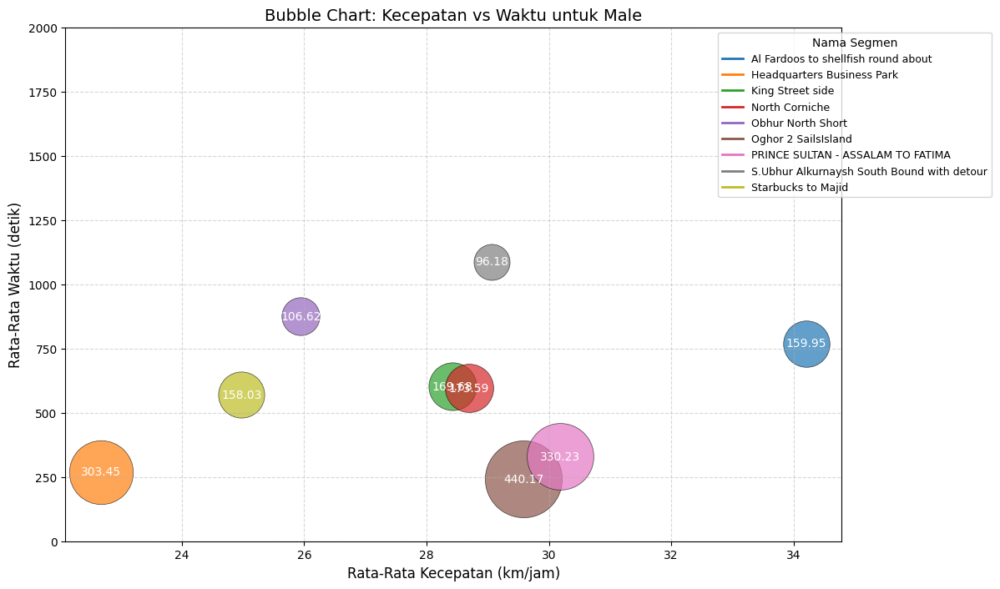

In [80]:
from matplotlib.lines import Line2D
# Warna unik untuk setiap segmen
colors = plt.cm.tab10(range(len(male_data['smt_name'].unique())))

plt.figure(figsize=(12, 8))

# Membuat scatter plot (bubble chart)
for i, (name, group) in enumerate(male_data.groupby('smt_name')):
    # Mengonversi waktu rata-rata dari detik ke jam
    group['avg_time_hours'] = group['avg_time'] / 3600

    # Menghitung efisiensi (kecepatan rata-rata dibagi waktu rata-rata dalam jam)
    group['efficiency'] = group['avg_speed'] / group['avg_time_hours']

    # Ukuran bubble sesuai dengan efisiensi
    bubble_size = group['efficiency'] * 10

    # Membuat scatter plot untuk setiap segmen
    scatter = plt.scatter(
        group['avg_speed'],
        group['avg_time'],
        s=bubble_size,
        color=[colors[i]],
        alpha=0.7,
        edgecolors='black',
        linewidth=0.5,
        label=name
    )

    # Menambahkan angka efisiensi ke dalam bubble
    for j, (x, y, efficiency) in enumerate(zip(group['avg_speed'], group['avg_time'], group['efficiency'])):
        plt.text(x, y, f'{efficiency:.2f}', ha='center', va='center', fontsize=10, color='white')

# Menambahkan label dan judul
plt.title('Bubble Chart: Kecepatan vs Waktu untuk Male', fontsize=14)
plt.xlabel('Rata-Rata Kecepatan (km/jam)', fontsize=12)
plt.ylabel('Rata-Rata Waktu (detik)', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.5)

# Membuat legend manual dengan garis
legend_elements = [
    Line2D([0], [0], color=colors[i], lw=2, label=name)
    for i, name in enumerate(male_data['smt_name'].unique())
]

plt.ylim(0, 2000)

# Menambahkan legend
plt.legend(handles=legend_elements, loc='upper right', fontsize=9, title='Nama Segmen', bbox_to_anchor=(1.2, 1))
plt.show()


**Penjelasan:**
- **"Prince Sultan - Assalam to Fatima"** adalah segmen yang terbaik untuk kategori Female, karena memiliki performa yang terlihat menonjol dan tertinggi dibandingkan segmen lainnya.

- **"Oghor 2 SailsIsland"** menjadi pilihan terbaik untuk kategori male, karena memiliki efisiensi (rata-rata waktu dikit dan rata-rata kecepatan terbesar) dibandingkan segmen lainnya.

#### Visualisasi Segmen Terbaik untuk Kedua Gender

Setelah sudah didapati hasil visualisasi tersebut, kemudian saya akan menggabungkan performa laki-laki dan perempuan sehingga didapati 1 nama segmen dengan performa terbaik untuk keduanya.

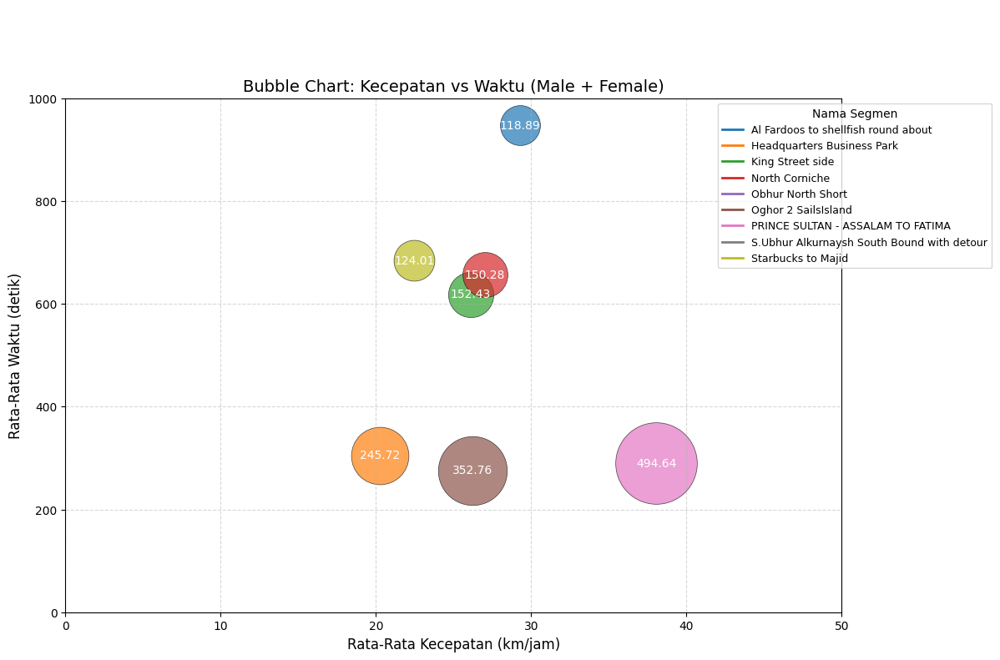

In [81]:
from matplotlib.lines import Line2D
import pandas as pd
import matplotlib.pyplot as plt

# Menggabungkan data male dan female
male_data['gender'] = 'Male'
female_data['gender'] = 'Female'
combined_data = pd.concat([male_data, female_data])

# Menghitung kolom 'efficiency' (kecepatan dibagi dengan waktu dalam jam)
combined_data['avg_time_hours'] = combined_data['avg_time'] / 3600
combined_data['efficiency'] = combined_data['avg_speed'] / combined_data['avg_time_hours']

# Rata-rata untuk setiap segmen
combined_group = combined_data.groupby('smt_name').agg(
    avg_speed=('avg_speed', 'mean'),
    avg_time=('avg_time', 'median'),
    efficiency=('efficiency', 'mean')
).reset_index()

# Warna
colors = plt.cm.tab10(range(len(combined_group['smt_name'].unique())))

plt.figure(figsize=(12, 8))

# Membuat scatter plot (bubble chart) untuk data gabungan
for i, (name, group) in enumerate(combined_group.groupby('smt_name')):
    bubble_size = group['efficiency'] * 10

    # Membuat scatter plot untuk setiap segmen
    scatter = plt.scatter(
        group['avg_speed'],
        group['avg_time'],
        s=bubble_size,
        color=[colors[i]], \
        alpha=0.7,
        edgecolors='black',
        linewidth=0.5,
        label=name
    )

    # Menambahkan angka efisiensi ke dalam bubble
    for j, (x, y, efficiency) in enumerate(zip(group['avg_speed'], group['avg_time'], group['efficiency'])):
        plt.text(x, y, f'{efficiency:.2f}', ha='center', va='center', fontsize=10, color='white')

# Menambahkan label dan judul
plt.title('Bubble Chart: Kecepatan vs Waktu (Male + Female)', fontsize=14)
plt.xlabel('Rata-Rata Kecepatan (km/jam)', fontsize=12)
plt.ylabel('Rata-Rata Waktu (detik)', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.5)

legend_elements = [
    Line2D([0], [0], color=colors[i], lw=2, label=name)
    for i, name in enumerate(combined_group['smt_name'].unique())
]

# Menambahkan legend
plt.legend(handles=legend_elements, loc='upper right', fontsize=9, title='Nama Segmen', bbox_to_anchor=(1.2, 1))
plt.xlim(0, 50)
plt.ylim(0, 1000)

plt.show()


**Penjelasan:**
- **"Segmen Prince Sultan - Assalam to Fatima"** adalah yang paling baik untuk kedua gender (Male dan Female). Hal ini didasarkan pada kinerja rata-rata kecepatan dan waktu yang terlihat optimal dibandingkan segmen lainnya.

#### Kesimpulan

Maka dari itu, berikut adalah kumpulan insight yang didapat:

**1. Segmen dengan Performa Paling Unggul untuk Perempuan:**
- Segmen **"PRINCE SULTAN - ASSALAM TO FATIMA"** menunjukkan kecepatan rata-rata tertinggi dan waktu penyelesaian yang terbaik untuk peserta perempuan.

**2. Segmen dengan Performa Paling Unggul untuk Laki-Laki:**
- Segmen **"Oghor 2 SailsIsland"** menunjukkan kombinasi waktu tempuh yang relatif kecil dengan kecepatan rata-rata yang konsisten lebih tinggi. Hal ini menunjukkan bahwa segmen ini mendukung performa optimal bagi laki-laki.

**3. Pengaruh Performa Tinggi di Segmen Tertentu:**
- **Waktu Tempuh**: Semakin tinggi performa (kecepatan rata-rata), semakin cepat waktu penyelesaian segmen. Hal ini terlihat dari korelasi negatif antara `smt_avg_spd` dan `smt_finish_seconds`.
- **Peringkat Leaderboard**: Tingginya kecepatan rata-rata di segmen-segmen tertentu membantu peserta mendapatkan posisi lebih tinggi di leaderboard, seperti yang terlihat dari korelasi negatif antara `smt_avg_spd` dan `smt_rank`.
- **Gender**: Peserta laki-laki cenderung mendominasi leaderboard karena variasi performa yang lebih luas, tetapi perempuan memiliki keunggulan khusus di segmen tertentu seperti **"PRINCE SULTAN - ASSALAM TO FATIMA"**.

**4. Kesimpulan Akhir:**
- Untuk laki-laki, segmen **"Oghor 2 SailsIsland"** adalah pilihan terbaik berdasarkan efisiensi dan performa yang tinggi.
- Untuk perempuan, segmen **"PRINCE SULTAN - ASSALAM TO FATIMA"** adalah segmen yang paling optimal dalam hal kecepatan rata-rata dan waktu penyelesaian.
- Untuk kedua gender, segmen **"Segmen Prince Sultan - Assalam to Fatima"** adalah yang paling baik.

Secara keseluruhan, kedua gender menunjukkan keunggulan performa di segmen yang berbeda, menunjukkan bahwa leaderboard sangat dipengaruhi oleh karakteristik spesifik segmen dan kekuatan individu gender di masing-masing segmen.

**Referensi:**
- https://www.atlassian.com/data/charts/bar-chart-complete-guide#:~:text=When%20you%20should%20use%20a,groups%20compare%20against%20the%20others.

- https://medium.com/swlh/all-about-the-pearson-correlation-coefficient-in-data-science-84d7cb771db0

- https://support.strava.com/hc/en-us/articles/360030851772-Segment-Leaderboard-Filters

- https://www.cueinsights.com/need-gap-analysis/

## Apakah peserta dari kategori berat badan tertentu memiliki kecenderungan lebih besar untuk mendominasi segmen tertentu (lebih banyak peserta dari kategori tersebut di peringkat 10%)?

### Mengelompokan data sesuai dengan nama lintasan

In [82]:
# Kelompokkan dan sort berdasarkan kolom yang diinginkan
df_sorted = df.sort_values(['smt_rank']).groupby(['smt_name'])

# Nampilin data yang sudah sorted berdasarkan smt_rank perkelompok smt_name, gender, dan user_age_group
for group_name, group_data in df_sorted:
    print(f"Group: {group_name}")
    display(group_data)


Group: ('Al Fardoos to shellfish round about',)


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
3125,35 to 44,639,2017-12-08,male,1,47.5,574,Al Fardoos to shellfish round about,65 to 74 kg,Morning Ride,29.7,52.9,101.13,12265,12265,0,1781
1383,25 to 34,610,2018-07-27,female,1,25.3,1080,Al Fardoos to shellfish round about,65 to 74 kg,Morning Ride,23.5,33.5,100.06,15342,15342,1,1780
2474,20 to 24,1053,2018-07-27,female,1,23.3,1168,Al Fardoos to shellfish round about,65 to 74 kg,Morning Ride,22.2,37.1,101.26,16425,16425,0,1705
5804,19 and under,13,2019-11-01,male,1,40.6,671,Al Fardoos to shellfish round about,65 to 74 kg,Morning Ride,36.4,58.3,54.02,5339,5339,1,1686
1040,20 to 24,2,2019-09-27,male,1,43.9,621,Al Fardoos to shellfish round about,65 to 74 kg,Morning Ride,30.7,52.2,64.03,7511,7511,0,1695
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
250,25 to 34,494,2017-11-14,male,70,23.2,1175,Al Fardoos to shellfish round about,54 kg and under,تمرين اليوم,19.2,38.2,34.89,6550,6550,0,1775
2363,25 to 34,1071,2019-12-13,male,71,20.6,1323,Al Fardoos to shellfish round about,54 kg and under,Morning Ride,18.5,39.2,95.00,18495,18495,0,1776
1649,25 to 34,413,2018-11-22,male,72,19.9,1372,Al Fardoos to shellfish round about,54 kg and under,3rd Jeddah challenge round 1,20.2,43.6,63.28,11253,11253,0,1777
3358,25 to 34,200,2017-03-24,male,73,15.8,1724,Al Fardoos to shellfish round about,85 to 95 kg,Mezo,26.6,42.8,83.46,11313,11313,0,1778


Group: ('Headquarters Business Park',)


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
2966,70 to 74,2253,2018-05-03,male,1,17.7,342,Headquarters Business Park,54 kg and under,Afternoon Ride,14.0,34.2,14.84,3805,3805,0,7860
2599,25 to 34,608,2019-01-13,female,1,35.7,169,Headquarters Business Park,54 kg and under,Afternoon Ride,24.4,40.0,24.43,3611,3611,1,7070
4390,35 to 44,923,2019-08-07,female,1,28.2,214,Headquarters Business Park,65 to 74 kg,Morning Ride,21.2,32.0,17.80,3029,3029,1,7628
3717,20 to 24,1053,2018-11-14,female,1,27.4,220,Headquarters Business Park,65 to 74 kg,Two Amigas Morning Ride,27.4,39.2,30.13,3955,3955,0,6250
4240,75+,1049,2019-09-03,male,1,35.5,170,Headquarters Business Park,85 to 95 kg,Ride 4 d health,19.3,46.8,35.51,6609,6609,0,7861
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2855,25 to 34,2031,2019-11-28,male,801,3.5,1710,Headquarters Business Park,54 kg and under,Afternoon Ride,15.8,38.5,67.87,15444,15444,0,7065
3893,25 to 34,2032,2018-04-06,male,802,2.3,2647,Headquarters Business Park,65 to 74 kg,مسار الواجه البحريه جده دراجتي السعوديه,10.7,40.0,9.45,3176,3176,0,7066
2948,25 to 34,383,2018-01-24,male,803,2.3,2669,Headquarters Business Park,115 kg and over,Evening Ride,16.8,41.8,30.40,6534,6534,0,7067
5398,25 to 34,1300,2019-01-18,male,804,1.7,3498,Headquarters Business Park,54 kg and under,Morning Ride,18.9,39.6,36.58,6975,6975,0,7068


Group: ('King Street side',)


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
2489,25 to 34,610,2018-12-26,female,1,32.7,520,King Street side,65 to 74 kg,Morning Ride,31.5,38.5,30.22,3456,3456,1,2277
2308,19 and under,21,2018-12-26,male,1,43.4,392,King Street side,55 to 64 kg,Evening ride,26.3,50.4,57.90,7921,7921,0,1890
261,45 to 54,1028,2020-01-10,female,1,10.6,1602,King Street side,85 to 95 kg,Brave Cyclists 15 - 100km challenge,16.1,30.6,97.44,21761,21761,0,2598
4292,35 to 44,614,2020-02-14,female,1,28.6,596,King Street side,55 to 64 kg,Morning Ride,27.5,35.3,55.05,7204,7204,1,2507
4703,55 to 64,937,2017-02-08,male,1,40.3,422,King Street side,75 to 84 kg,Evening Ride strong head winds,31.4,50.0,46.72,5360,5360,1,2599
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2999,25 to 34,443,2014-04-02,male,288,11.8,1445,King Street side,54 kg and under,يوم التوحد و تمرين في جدة,19.2,55.1,37.12,6951,6951,0,2269
4147,25 to 34,528,2014-04-02,male,289,11.7,1451,King Street side,95 kg to 104 kg,Afternoon Ride,16.9,47.5,48.09,10250,10250,0,2270
1058,25 to 34,1212,2018-04-28,male,290,11.6,1469,King Street side,85 to 95 kg,Home to Obhur and back!,17.2,39.2,53.27,11175,11175,0,2271
182,25 to 34,1214,2017-03-30,male,292,10.0,1707,King Street side,NaN,Afternoon Ride,0.5,88.9,197.10,1513793,1513793,0,2273


Group: ('North Corniche',)


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
5172,45 to 54,958,2019-02-11,male,1,48.3,359,North Corniche,85 to 95 kg,Monday evening windy ride,34.7,52.2,41.90,4344,4344,0,5750
5358,55 to 64,937,2018-01-01,male,1,43.4,400,North Corniche,75 to 84 kg,Solo training Evening Ride,30.7,47.5,19.28,2259,2259,1,5898
1701,20 to 24,58,2018-12-02,male,1,47.6,365,North Corniche,NaN,Evening Ride,39.0,50.8,37.71,3480,3480,1,4679
599,70 to 74,1622,2016-12-05,male,1,33.8,514,North Corniche,54 kg and under,Night Ride,28.4,49.0,9.71,1230,1230,0,5935
6074,35 to 44,1583,2019-07-19,female,1,30.3,573,North Corniche,NaN,Evening Ride,24.0,37.1,15.52,2324,2324,0,5739
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
142,25 to 34,588,2019-07-07,male,534,10.6,1644,North Corniche,54 kg and under,Evening Ride,13.5,50.0,60.84,16226,16226,0,5329
3454,25 to 34,1508,2018-04-04,male,535,10.4,1674,North Corniche,54 kg and under,Evening Ride,15.3,28.1,21.85,5135,5135,0,5330
3472,25 to 34,1625,2017-01-07,male,536,9.7,1782,North Corniche,95 kg to 104 kg,Morning Ride,15.2,33.5,32.34,7680,7680,0,5331
246,25 to 34,1511,2016-05-23,male,538,6.6,2627,North Corniche,85 to 95 kg,Evening Ride,23.7,39.6,70.22,10676,10676,0,5333


Group: ('Obhur North Short',)


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
2329,35 to 44,639,2018-02-17,male,1,37.6,658,Obhur North Short,65 to 74 kg,Morning Ride,27.4,50.0,100.91,13267,13267,1,1541
6271,75+,1049,2019-06-18,male,1,28.5,867,Obhur North Short,85 to 95 kg,Morning Ride,20.5,40.3,60.17,10586,10586,0,1685
3654,20 to 24,51,2016-08-19,male,1,37.5,659,Obhur North Short,65 to 74 kg,Morning Ride,34.9,50.8,69.15,7138,7138,1,1442
1480,35 to 44,923,2019-09-13,female,1,21.1,1174,Obhur North Short,65 to 74 kg,My 1st ever Century Ride,22.3,33.5,100.60,16206,16206,1,1621
2934,20 to 24,1053,2018-07-27,female,1,24.6,1005,Obhur North Short,65 to 74 kg,Morning Ride,22.2,37.1,101.26,16425,16425,0,1455
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1324,35 to 44,686,2017-07-28,male,74,8.6,2858,Obhur North Short,75 to 84 kg,Afternoon Ride,18.9,59.8,49.56,9464,9464,0,1614
5450,25 to 34,532,2020-02-14,male,75,7.8,3177,Obhur North Short,75 to 84 kg,Morning Ride,15.7,59.8,69.64,15931,15931,0,1531
1537,25 to 34,311,2020-02-14,male,76,7.3,3370,Obhur North Short,75 to 84 kg,رحلة خليج سلمان بقيادة الرحالة محمد فقية,16.3,36.7,88.48,19484,19484,1,1532
5056,35 to 44,666,2020-02-14,male,79,7.5,3286,Obhur North Short,115 kg and over,Morning Ride,17.9,38.9,140.97,28277,28277,0,1619


Group: ('Oghor 2 SailsIsland',)


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
3951,35 to 44,923,2018-12-14,female,1,28.4,253,Oghor 2 SailsIsland,65 to 74 kg,Morning Ride,22.5,31.3,50.40,8050,8050,1,4403
3372,20 to 24,58,2018-12-02,male,1,47.8,150,Oghor 2 SailsIsland,NaN,Evening Ride,39.0,50.8,37.71,3480,3480,1,3137
3666,45 to 54,1614,2020-03-07,female,1,24.7,290,Oghor 2 SailsIsland,55 to 64 kg,Corniche lazy saturday 7th march,16.3,32.0,33.92,7482,7482,0,4576
4706,25 to 34,404,2019-12-20,male,1,60.8,118,Oghor 2 SailsIsland,95 kg to 104 kg,Morning Ride,26.3,72.7,24.14,3305,3305,0,3280
5171,55 to 64,937,2017-05-03,male,1,45.4,158,Oghor 2 SailsIsland,75 to 84 kg,Evening Ride with JC,28.5,54.4,32.40,4096,4096,1,4580
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2982,25 to 34,1508,2018-04-04,male,612,7.3,988,Oghor 2 SailsIsland,54 kg and under,Evening Ride,15.3,28.1,21.85,5135,5135,0,3940
1885,25 to 34,1509,2016-05-27,male,614,6.7,1078,Oghor 2 SailsIsland,54 kg and under,Evening Ride,15.1,61.9,36.61,8726,8726,0,3942
6202,25 to 34,594,2019-04-17,male,615,6.6,1091,Oghor 2 SailsIsland,54 kg and under,Evening Ride,17.3,40.7,29.39,6110,6110,0,3943
803,25 to 34,1510,2018-03-20,male,616,4.6,1557,Oghor 2 SailsIsland,75 to 84 kg,Afternoon Ride,15.3,31.0,15.75,3717,3717,0,3944


Group: ('PRINCE SULTAN - ASSALAM TO FATIMA',)


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
4803,55 to 64,1041,2017-11-28,male,1,40.7,240,PRINCE SULTAN - ASSALAM TO FATIMA,85 to 95 kg,Evening Ride,33.3,44.6,39.93,4324,4324,1,3057
4541,25 to 34,397,2018-02-16,male,1,87.3,112,PRINCE SULTAN - ASSALAM TO FATIMA,85 to 95 kg,Evening Ride,17.6,108.0,20.57,4197,4197,0,2667
3235,20 to 24,137,2019-01-05,male,1,81.4,120,PRINCE SULTAN - ASSALAM TO FATIMA,54 kg and under,Morning Ride,27.3,94.3,31.02,4095,4095,0,2643
2111,75+,1049,2019-06-09,male,1,36.2,270,PRINCE SULTAN - ASSALAM TO FATIMA,85 to 95 kg,Morning Ride,20.4,52.9,53.85,9508,9508,0,3075
184,35 to 44,1339,2017-05-29,female,1,63.9,153,PRINCE SULTAN - ASSALAM TO FATIMA,54 kg and under,Night Ride,17.9,72.4,25.14,5070,5070,0,2984
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
817,25 to 34,1318,2018-05-03,male,163,14.9,655,PRINCE SULTAN - ASSALAM TO FATIMA,54 kg and under,Evening Ride,16.4,40.3,60.20,13217,13217,0,2829
3854,25 to 34,356,2016-07-23,male,164,13.5,722,PRINCE SULTAN - ASSALAM TO FATIMA,75 to 84 kg,Morning Ride تمرين مع دراج الحجاز,23.0,33.5,24.15,3782,3782,0,2830
5409,25 to 34,503,2017-01-10,male,165,13.0,750,PRINCE SULTAN - ASSALAM TO FATIMA,75 to 84 kg,West Sky Ride 1,15.2,41.4,21.94,5183,5183,0,2831
5270,25 to 34,456,2018-05-05,male,166,8.6,1137,PRINCE SULTAN - ASSALAM TO FATIMA,54 kg and under,Evening Ride,16.9,34.9,47.42,10112,10112,0,2832


Group: ('S.Ubhur Alkurnaysh South Bound with detour',)


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
2015,19 and under,6,2017-12-04,male,1,41.1,776,S.Ubhur Alkurnaysh South Bound with detour,54 kg and under,Evening Ride,32.2,46.4,49.92,5581,5581,0,1104
3011,25 to 34,158,2016-12-16,male,1,45.5,700,S.Ubhur Alkurnaysh South Bound with detour,85 to 95 kg,Morning Ride,34.6,54.4,85.00,8854,8854,1,1143
3375,75+,1049,2019-11-20,male,1,39.9,798,S.Ubhur Alkurnaysh South Bound with detour,85 to 95 kg,Nov.20th 2019,21.0,48.6,72.14,12373,12373,0,1428
2287,55 to 64,940,2017-12-08,male,1,45.4,702,S.Ubhur Alkurnaysh South Bound with detour,55 to 64 kg,Morning Ride,27.0,59.4,76.46,10212,10212,1,1413
2596,35 to 44,639,2016-12-16,male,1,45.6,698,S.Ubhur Alkurnaysh South Bound with detour,65 to 74 kg,Morning Ride,31.7,52.9,83.60,9504,9504,1,1264
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1462,25 to 34,228,2019-11-29,male,113,14.6,2189,S.Ubhur Alkurnaysh South Bound with detour,75 to 84 kg,Morning Ride,28.0,43.6,100.13,12878,12878,1,1255
5423,25 to 34,529,2017-11-19,male,114,14.2,2251,S.Ubhur Alkurnaysh South Bound with detour,54 kg and under,Afternoon Ride,19.1,34.9,23.54,4430,4430,0,1256
2792,25 to 34,306,2019-05-27,male,115,13.9,2300,S.Ubhur Alkurnaysh South Bound with detour,75 to 84 kg,Evening Ride,22.1,34.9,106.43,17322,17322,1,1257
1270,25 to 34,585,2019-07-02,male,116,11.8,2699,S.Ubhur Alkurnaysh South Bound with detour,65 to 74 kg,Night Ride,17.5,38.5,81.26,16732,16732,0,1258


Group: ('Starbucks to Majid',)


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
3760,65 to 69,1047,2018-05-07,male,1,28.7,490,Starbucks to Majid,75 to 84 kg,Monday Solo Ride,28.4,38.9,102.57,12988,12988,1,1100
3870,35 to 44,922,2018-05-09,female,1,38.8,363,Starbucks to Majid,54 kg and under,Evening Ride,18.7,78.8,31.84,6114,6114,0,961
4573,19 and under,47,2018-09-15,female,1,25.3,556,Starbucks to Majid,54 kg and under,من أرهب التمارين,17.7,31.3,54.53,11094,11094,0,46
2432,35 to 44,631,2019-09-30,male,1,68.7,205,Starbucks to Majid,54 kg and under,تمرين مع دراج جده,32.4,110.9,50.52,5606,5606,0,643
2025,25 to 34,146,2019-05-08,male,1,69.4,203,Starbucks to Majid,105 kg to 114 kg,Night Ride,28.8,105.5,28.01,3504,3504,0,152
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4545,25 to 34,602,2019-02-10,male,463,8.1,1741,Starbucks to Majid,54 kg and under,Afternoon Ride,15.5,38.9,26.09,6052,6052,0,614
2431,25 to 34,603,2019-01-23,male,464,7.8,1802,Starbucks to Majid,54 kg and under,تمرين ممتع من ابحر,18.8,30.6,43.16,8268,8268,0,615
5599,25 to 34,604,2017-08-18,male,465,7.8,1812,Starbucks to Majid,85 to 95 kg,Evening Ride,23.6,46.8,23.98,3659,3659,0,616
1770,25 to 34,605,2018-11-01,male,466,7.5,1881,Starbucks to Majid,NaN,Evening Ride,15.2,36.0,24.38,5790,5790,0,617


### Menampilkan data peringkat 10% dari tiap data group

In [83]:
import math

for group_name, group_data in df_sorted:
    top_10_group_data = group_data.head(math.ceil(len(group_data) * 0.1))
    print(f"Group: {group_name}")
    display(top_10_group_data)

Group: ('Al Fardoos to shellfish round about',)


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
3125,35 to 44,639,2017-12-08,male,1,47.5,574,Al Fardoos to shellfish round about,65 to 74 kg,Morning Ride,29.7,52.9,101.13,12265,12265,0,1781
1383,25 to 34,610,2018-07-27,female,1,25.3,1080,Al Fardoos to shellfish round about,65 to 74 kg,Morning Ride,23.5,33.5,100.06,15342,15342,1,1780
2474,20 to 24,1053,2018-07-27,female,1,23.3,1168,Al Fardoos to shellfish round about,65 to 74 kg,Morning Ride,22.2,37.1,101.26,16425,16425,0,1705
5804,19 and under,13,2019-11-01,male,1,40.6,671,Al Fardoos to shellfish round about,65 to 74 kg,Morning Ride,36.4,58.3,54.02,5339,5339,1,1686
1040,20 to 24,2,2019-09-27,male,1,43.9,621,Al Fardoos to shellfish round about,65 to 74 kg,Morning Ride,30.7,52.2,64.03,7511,7511,0,1695
2836,75+,1049,2019-08-02,male,1,40.1,680,Al Fardoos to shellfish round about,85 to 95 kg,August 2nd 2019,28.1,53.6,85.89,11000,11000,0,1889
6006,25 to 34,157,2019-09-27,male,2,44.1,618,Al Fardoos to shellfish round about,95 kg to 104 kg,Morning Ride,32.4,55.1,74.53,8289,8289,1,1707
5634,19 and under,46,2018-02-03,male,2,40.5,674,Al Fardoos to shellfish round about,75 to 84 kg,Afternoon Ride,26.6,51.8,50.55,6843,6843,1,1687
5918,20 to 24,51,2016-01-01,male,2,40.9,666,Al Fardoos to shellfish round about,65 to 74 kg,Morning Ride,33.1,48.2,115.49,12561,12561,0,1696
1047,55 to 64,940,2018-04-27,male,2,43.6,625,Al Fardoos to shellfish round about,55 to 64 kg,Morning Ride,29.5,56.5,38.51,4704,4704,1,1881


Group: ('Headquarters Business Park',)


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
2966,70 to 74,2253,2018-05-03,male,1,17.7,342,Headquarters Business Park,54 kg and under,Afternoon Ride,14.0,34.2,14.84,3805,3805,0,7860
2599,25 to 34,608,2019-01-13,female,1,35.7,169,Headquarters Business Park,54 kg and under,Afternoon Ride,24.4,40.0,24.43,3611,3611,1,7070
4390,35 to 44,923,2019-08-07,female,1,28.2,214,Headquarters Business Park,65 to 74 kg,Morning Ride,21.2,32.0,17.80,3029,3029,1,7628
3717,20 to 24,1053,2018-11-14,female,1,27.4,220,Headquarters Business Park,65 to 74 kg,Two Amigas Morning Ride,27.4,39.2,30.13,3955,3955,0,6250
4240,75+,1049,2019-09-03,male,1,35.5,170,Headquarters Business Park,85 to 95 kg,Ride 4 d health,19.3,46.8,35.51,6609,6609,0,7861
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1138,45 to 54,1022,2018-08-25,male,16,31.9,189,Headquarters Business Park,75 to 84 kg,Morning Ride,17.6,38.2,38.30,7829,7829,1,7674
4340,35 to 44,355,2019-04-19,male,16,36.1,167,Headquarters Business Park,85 to 95 kg,Afternoon Ride,38.7,64.1,49.84,4635,4635,1,7142
2479,19 and under,18,2019-11-16,male,16,28.1,215,Headquarters Business Park,65 to 74 kg,Morning Ride,23.9,43.6,50.45,7596,7596,0,5955
5379,25 to 34,2038,2018-11-28,female,16,22.6,267,Headquarters Business Park,54 kg and under,Night Ride,17.3,34.2,23.65,4910,4910,0,7085


Group: ('King Street side',)


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
2489,25 to 34,610,2018-12-26,female,1,32.7,520,King Street side,65 to 74 kg,Morning Ride,31.5,38.5,30.22,3456,3456,1,2277
2308,19 and under,21,2018-12-26,male,1,43.4,392,King Street side,55 to 64 kg,Evening ride,26.3,50.4,57.90,7921,7921,0,1890
261,45 to 54,1028,2020-01-10,female,1,10.6,1602,King Street side,85 to 95 kg,Brave Cyclists 15 - 100km challenge,16.1,30.6,97.44,21761,21761,0,2598
4292,35 to 44,614,2020-02-14,female,1,28.6,596,King Street side,55 to 64 kg,Morning Ride,27.5,35.3,55.05,7204,7204,1,2507
4703,55 to 64,937,2017-02-08,male,1,40.3,422,King Street side,75 to 84 kg,Evening Ride strong head winds,31.4,50.0,46.72,5360,5360,1,2599
6187,20 to 24,1053,2018-12-26,female,1,31.6,538,King Street side,65 to 74 kg,Morning Ride,30.8,37.1,32.67,3821,3821,0,1981
1329,65 to 69,1277,2020-03-04,male,1,71.8,237,King Street side,75 to 84 kg,Fahrt am Morgen,20.4,82.8,91.99,16223,16223,0,2622
228,19 and under,47,2018-12-14,female,1,22.5,756,King Street side,54 kg and under,Morning Ride,22.1,35.6,43.63,7104,7104,0,1919
5765,25 to 34,318,2019-01-27,male,1,46.0,370,King Street side,75 to 84 kg,Morning Ride,26.3,57.2,31.84,4352,4352,1,1982
4491,75+,1049,2019-10-14,male,1,33.4,510,King Street side,85 to 95 kg,Ride 4 d health,25.4,51.1,71.57,10147,10147,0,2624


Group: ('North Corniche',)


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
5172,45 to 54,958,2019-02-11,male,1,48.3,359,North Corniche,85 to 95 kg,Monday evening windy ride,34.7,52.2,41.90,4344,4344,0,5750
5358,55 to 64,937,2018-01-01,male,1,43.4,400,North Corniche,75 to 84 kg,Solo training Evening Ride,30.7,47.5,19.28,2259,2259,1,5898
1701,20 to 24,58,2018-12-02,male,1,47.6,365,North Corniche,NaN,Evening Ride,39.0,50.8,37.71,3480,3480,1,4679
599,70 to 74,1622,2016-12-05,male,1,33.8,514,North Corniche,54 kg and under,Night Ride,28.4,49.0,9.71,1230,1230,0,5935
6074,35 to 44,1583,2019-07-19,female,1,30.3,573,North Corniche,NaN,Evening Ride,24.0,37.1,15.52,2324,2324,0,5739
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
641,25 to 34,417,2017-08-02,male,15,42.4,409,North Corniche,105 kg to 114 kg,Night Ride,31.0,52.6,40.70,4729,4729,1,4810
585,20 to 24,3,2020-03-07,male,15,36.2,479,North Corniche,65 to 74 kg,Morning Ride winking face flexed biceps person...,29.1,42.1,65.12,8063,8063,1,4693
4402,35 to 44,651,2018-11-28,male,15,42.4,409,North Corniche,65 to 74 kg,Night Ride,39.1,52.9,20.69,1906,1906,0,5370
3274,25 to 34,620,2019-06-15,female,15,22.3,778,North Corniche,55 to 64 kg,Evening Ride,16.0,29.2,50.68,11398,11398,0,5349


Group: ('Obhur North Short',)


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
2329,35 to 44,639,2018-02-17,male,1,37.6,658,Obhur North Short,65 to 74 kg,Morning Ride,27.4,50.0,100.91,13267,13267,1,1541
6271,75+,1049,2019-06-18,male,1,28.5,867,Obhur North Short,85 to 95 kg,Morning Ride,20.5,40.3,60.17,10586,10586,0,1685
3654,20 to 24,51,2016-08-19,male,1,37.5,659,Obhur North Short,65 to 74 kg,Morning Ride,34.9,50.8,69.15,7138,7138,1,1442
1480,35 to 44,923,2019-09-13,female,1,21.1,1174,Obhur North Short,65 to 74 kg,My 1st ever Century Ride,22.3,33.5,100.60,16206,16206,1,1621
2934,20 to 24,1053,2018-07-27,female,1,24.6,1005,Obhur North Short,65 to 74 kg,Morning Ride,22.2,37.1,101.26,16425,16425,0,1455
1245,65 to 69,1047,2018-04-28,male,1,33.4,740,Obhur North Short,75 to 84 kg,Saturday Spin with Patrice,32.2,41.8,101.09,11287,11287,1,1684
2798,25 to 34,214,2014-10-24,male,1,38.1,649,Obhur North Short,75 to 84 kg,Bike. Jeddah-North Obhur. Ritmo alegre. Grupet...,32.2,53.3,104.27,11653,11653,0,1457
4068,19 and under,49,2020-01-10,female,1,17.0,1453,Obhur North Short,54 kg and under,Afternoon Ride,17.3,46.1,102.65,21341,21341,0,1441
4607,25 to 34,186,2017-01-20,male,2,37.9,652,Obhur North Short,54 kg and under,Morning Ride,34.0,49.0,105.09,11119,11119,1,1458
1515,20 to 24,1054,2019-09-13,female,2,7.4,3356,Obhur North Short,54 kg and under,Evening Ride,17.7,33.1,100.05,20372,20372,0,1456


Group: ('Oghor 2 SailsIsland',)


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
3951,35 to 44,923,2018-12-14,female,1,28.4,253,Oghor 2 SailsIsland,65 to 74 kg,Morning Ride,22.5,31.3,50.40,8050,8050,1,4403
3372,20 to 24,58,2018-12-02,male,1,47.8,150,Oghor 2 SailsIsland,NaN,Evening Ride,39.0,50.8,37.71,3480,3480,1,3137
3666,45 to 54,1614,2020-03-07,female,1,24.7,290,Oghor 2 SailsIsland,55 to 64 kg,Corniche lazy saturday 7th march,16.3,32.0,33.92,7482,7482,0,4576
4706,25 to 34,404,2019-12-20,male,1,60.8,118,Oghor 2 SailsIsland,95 kg to 104 kg,Morning Ride,26.3,72.7,24.14,3305,3305,0,3280
5171,55 to 64,937,2017-05-03,male,1,45.4,158,Oghor 2 SailsIsland,75 to 84 kg,Evening Ride with JC,28.5,54.4,32.40,4096,4096,1,4580
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6284,19 and under,18,2019-10-30,male,17,35.5,202,Oghor 2 SailsIsland,65 to 74 kg,Evening Ride,25.4,45.0,52.48,7449,7449,0,3092
5898,45 to 54,997,2019-08-16,male,17,40.5,177,Oghor 2 SailsIsland,85 to 95 kg,Morning Ride تمرين خفيف استعادة لياقة,29.1,52.9,57.40,7093,7093,1,4433
3843,45 to 54,946,2015-12-11,male,17,40.5,177,Oghor 2 SailsIsland,65 to 74 kg,Sortie à vélo matinale,32.3,47.2,105.11,11718,11718,0,4431
4266,19 and under,23,2019-05-08,male,18,34.0,211,Oghor 2 SailsIsland,55 to 64 kg,ثاني نص، تمرين جميل flexed biceps: light skin ...,27.5,44.3,31.40,4106,4106,0,3093


Group: ('PRINCE SULTAN - ASSALAM TO FATIMA',)


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
4803,55 to 64,1041,2017-11-28,male,1,40.7,240,PRINCE SULTAN - ASSALAM TO FATIMA,85 to 95 kg,Evening Ride,33.3,44.6,39.93,4324,4324,1,3057
4541,25 to 34,397,2018-02-16,male,1,87.3,112,PRINCE SULTAN - ASSALAM TO FATIMA,85 to 95 kg,Evening Ride,17.6,108.0,20.57,4197,4197,0,2667
3235,20 to 24,137,2019-01-05,male,1,81.4,120,PRINCE SULTAN - ASSALAM TO FATIMA,54 kg and under,Morning Ride,27.3,94.3,31.02,4095,4095,0,2643
2111,75+,1049,2019-06-09,male,1,36.2,270,PRINCE SULTAN - ASSALAM TO FATIMA,85 to 95 kg,Morning Ride,20.4,52.9,53.85,9508,9508,0,3075
184,35 to 44,1339,2017-05-29,female,1,63.9,153,PRINCE SULTAN - ASSALAM TO FATIMA,54 kg and under,Night Ride,17.9,72.4,25.14,5070,5070,0,2984
2042,45 to 54,1124,2018-08-07,male,1,66.9,146,PRINCE SULTAN - ASSALAM TO FATIMA,54 kg and under,Evening Ride,24.2,80.6,92.43,13775,13775,0,2985
1652,65 to 69,1047,2018-05-30,male,1,38.2,256,PRINCE SULTAN - ASSALAM TO FATIMA,75 to 84 kg,Wednesday Ramadan Ride Solo,29.8,40.0,74.75,9021,9021,1,3074
4901,45 to 54,1350,2019-07-12,female,1,28.0,349,PRINCE SULTAN - ASSALAM TO FATIMA,75 to 84 kg,Morning Ride,24.7,46.8,71.20,10385,10385,0,3056
4979,19 and under,17,2019-01-01,male,1,40.4,242,PRINCE SULTAN - ASSALAM TO FATIMA,54 kg and under,Night Ride,29.1,52.2,23.97,2968,2968,1,2626
2742,35 to 44,216,2019-02-02,male,1,75.8,129,PRINCE SULTAN - ASSALAM TO FATIMA,75 to 84 kg,Morning Ride,35.4,98.3,78.00,7926,7926,1,2834


Group: ('S.Ubhur Alkurnaysh South Bound with detour',)


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
2015,19 and under,6,2017-12-04,male,1,41.1,776,S.Ubhur Alkurnaysh South Bound with detour,54 kg and under,Evening Ride,32.2,46.4,49.92,5581,5581,0,1104
3011,25 to 34,158,2016-12-16,male,1,45.5,700,S.Ubhur Alkurnaysh South Bound with detour,85 to 95 kg,Morning Ride,34.6,54.4,85.00,8854,8854,1,1143
3375,75+,1049,2019-11-20,male,1,39.9,798,S.Ubhur Alkurnaysh South Bound with detour,85 to 95 kg,Nov.20th 2019,21.0,48.6,72.14,12373,12373,0,1428
2287,55 to 64,940,2017-12-08,male,1,45.4,702,S.Ubhur Alkurnaysh South Bound with detour,55 to 64 kg,Morning Ride,27.0,59.4,76.46,10212,10212,1,1413
2596,35 to 44,639,2016-12-16,male,1,45.6,698,S.Ubhur Alkurnaysh South Bound with detour,65 to 74 kg,Morning Ride,31.7,52.9,83.60,9504,9504,1,1264
5086,20 to 24,1053,2019-01-04,female,1,29.4,1083,S.Ubhur Alkurnaysh South Bound with detour,65 to 74 kg,Morning Ride,26.2,39.2,60.79,8355,8355,0,1141
5581,20 to 24,2,2020-01-03,male,1,43.9,726,S.Ubhur Alkurnaysh South Bound with detour,65 to 74 kg,Morning Ride,34.3,59.0,65.31,6862,6862,1,1122
5971,45 to 54,958,2019-12-13,male,1,44.4,718,S.Ubhur Alkurnaysh South Bound with detour,85 to 95 kg,Morning Ride,31.1,55.1,80.52,9325,9325,1,1369
1094,35 to 44,926,2017-12-08,female,1,28.6,1114,S.Ubhur Alkurnaysh South Bound with detour,75 to 84 kg,Bravo Bravo Jeddah,20.2,35.6,34.27,6115,6115,0,1366
954,19 and under,47,2018-12-14,female,1,26.2,1217,S.Ubhur Alkurnaysh South Bound with detour,54 kg and under,Morning Ride,22.1,35.6,43.63,7104,7104,0,1121


Group: ('Starbucks to Majid',)


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
3760,65 to 69,1047,2018-05-07,male,1,28.7,490,Starbucks to Majid,75 to 84 kg,Monday Solo Ride,28.4,38.9,102.57,12988,12988,1,1100
3870,35 to 44,922,2018-05-09,female,1,38.8,363,Starbucks to Majid,54 kg and under,Evening Ride,18.7,78.8,31.84,6114,6114,0,961
4573,19 and under,47,2018-09-15,female,1,25.3,556,Starbucks to Majid,54 kg and under,من أرهب التمارين,17.7,31.3,54.53,11094,11094,0,46
2432,35 to 44,631,2019-09-30,male,1,68.7,205,Starbucks to Majid,54 kg and under,تمرين مع دراج جده,32.4,110.9,50.52,5606,5606,0,643
2025,25 to 34,146,2019-05-08,male,1,69.4,203,Starbucks to Majid,105 kg to 114 kg,Night Ride,28.8,105.5,28.01,3504,3504,0,152
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1665,20 to 24,61,2017-04-06,male,13,30.8,457,Starbucks to Majid,85 to 95 kg,MidNight Ride,27.9,40.7,17.51,2258,2258,0,62
478,35 to 44,641,2014-12-01,male,13,38.7,364,Starbucks to Majid,65 to 74 kg,SS+Threshold,34.2,46.4,57.80,6079,6079,1,655
4756,25 to 34,158,2017-12-06,male,13,41.8,337,Starbucks to Majid,85 to 95 kg,Evening Ride,31.7,52.9,81.27,9243,9243,1,164
1197,19 and under,13,2017-09-12,male,13,28.4,496,Starbucks to Majid,65 to 74 kg,Evening Ride,28.5,46.1,39.08,4932,4932,0,12


### Menampilkan pesebaran `user_weight_category` dari tiap data group

Group: ('Al Fardoos to shellfish round about',)


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
3125,35 to 44,639,2017-12-08,male,1,47.5,574,Al Fardoos to shellfish round about,65 to 74 kg,Morning Ride,29.7,52.9,101.13,12265,12265,0,1781
1383,25 to 34,610,2018-07-27,female,1,25.3,1080,Al Fardoos to shellfish round about,65 to 74 kg,Morning Ride,23.5,33.5,100.06,15342,15342,1,1780
2474,20 to 24,1053,2018-07-27,female,1,23.3,1168,Al Fardoos to shellfish round about,65 to 74 kg,Morning Ride,22.2,37.1,101.26,16425,16425,0,1705
5804,19 and under,13,2019-11-01,male,1,40.6,671,Al Fardoos to shellfish round about,65 to 74 kg,Morning Ride,36.4,58.3,54.02,5339,5339,1,1686
1040,20 to 24,2,2019-09-27,male,1,43.9,621,Al Fardoos to shellfish round about,65 to 74 kg,Morning Ride,30.7,52.2,64.03,7511,7511,0,1695
2836,75+,1049,2019-08-02,male,1,40.1,680,Al Fardoos to shellfish round about,85 to 95 kg,August 2nd 2019,28.1,53.6,85.89,11000,11000,0,1889
6006,25 to 34,157,2019-09-27,male,2,44.1,618,Al Fardoos to shellfish round about,95 kg to 104 kg,Morning Ride,32.4,55.1,74.53,8289,8289,1,1707
5634,19 and under,46,2018-02-03,male,2,40.5,674,Al Fardoos to shellfish round about,75 to 84 kg,Afternoon Ride,26.6,51.8,50.55,6843,6843,1,1687
5918,20 to 24,51,2016-01-01,male,2,40.9,666,Al Fardoos to shellfish round about,65 to 74 kg,Morning Ride,33.1,48.2,115.49,12561,12561,0,1696
1047,55 to 64,940,2018-04-27,male,2,43.6,625,Al Fardoos to shellfish round about,55 to 64 kg,Morning Ride,29.5,56.5,38.51,4704,4704,1,1881


user_weight_category
54 kg and under     1
55 to 64 kg         4
65 to 74 kg         6
75 to 84 kg         1
85 to 95 kg         2
95 kg to 104 kg     1
105 kg to 114 kg    0
115 kg and over     0
Name: count, dtype: int64


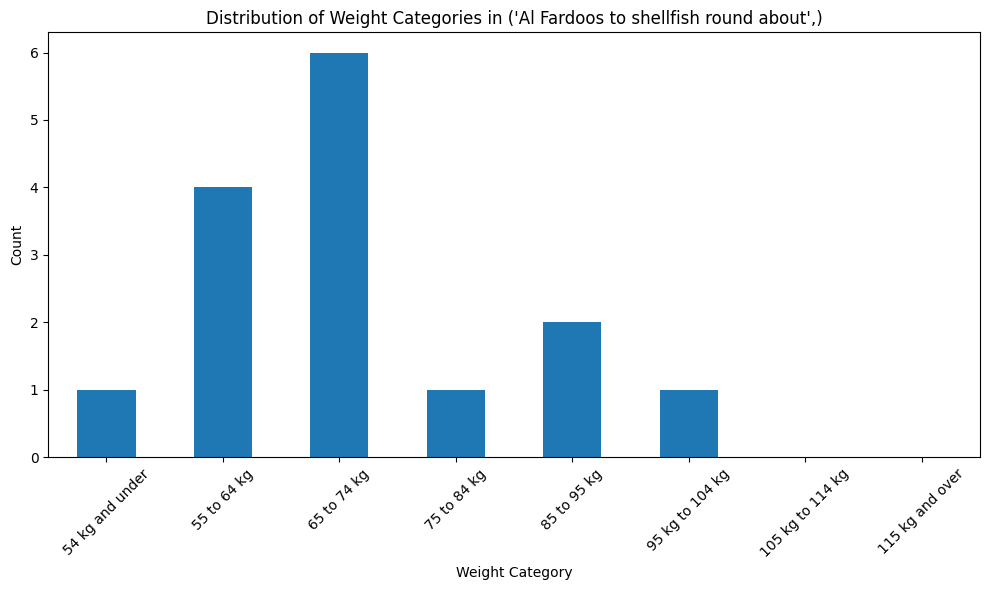

Group: ('Headquarters Business Park',)


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
2966,70 to 74,2253,2018-05-03,male,1,17.7,342,Headquarters Business Park,54 kg and under,Afternoon Ride,14.0,34.2,14.84,3805,3805,0,7860
2599,25 to 34,608,2019-01-13,female,1,35.7,169,Headquarters Business Park,54 kg and under,Afternoon Ride,24.4,40.0,24.43,3611,3611,1,7070
4390,35 to 44,923,2019-08-07,female,1,28.2,214,Headquarters Business Park,65 to 74 kg,Morning Ride,21.2,32.0,17.80,3029,3029,1,7628
3717,20 to 24,1053,2018-11-14,female,1,27.4,220,Headquarters Business Park,65 to 74 kg,Two Amigas Morning Ride,27.4,39.2,30.13,3955,3955,0,6250
4240,75+,1049,2019-09-03,male,1,35.5,170,Headquarters Business Park,85 to 95 kg,Ride 4 d health,19.3,46.8,35.51,6609,6609,0,7861
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1138,45 to 54,1022,2018-08-25,male,16,31.9,189,Headquarters Business Park,75 to 84 kg,Morning Ride,17.6,38.2,38.30,7829,7829,1,7674
4340,35 to 44,355,2019-04-19,male,16,36.1,167,Headquarters Business Park,85 to 95 kg,Afternoon Ride,38.7,64.1,49.84,4635,4635,1,7142
2479,19 and under,18,2019-11-16,male,16,28.1,215,Headquarters Business Park,65 to 74 kg,Morning Ride,23.9,43.6,50.45,7596,7596,0,5955
5379,25 to 34,2038,2018-11-28,female,16,22.6,267,Headquarters Business Park,54 kg and under,Night Ride,17.3,34.2,23.65,4910,4910,0,7085


user_weight_category
54 kg and under     60
55 to 64 kg         13
65 to 74 kg         32
75 to 84 kg         22
85 to 95 kg         13
95 kg to 104 kg      5
105 kg to 114 kg     2
115 kg and over      4
Name: count, dtype: int64


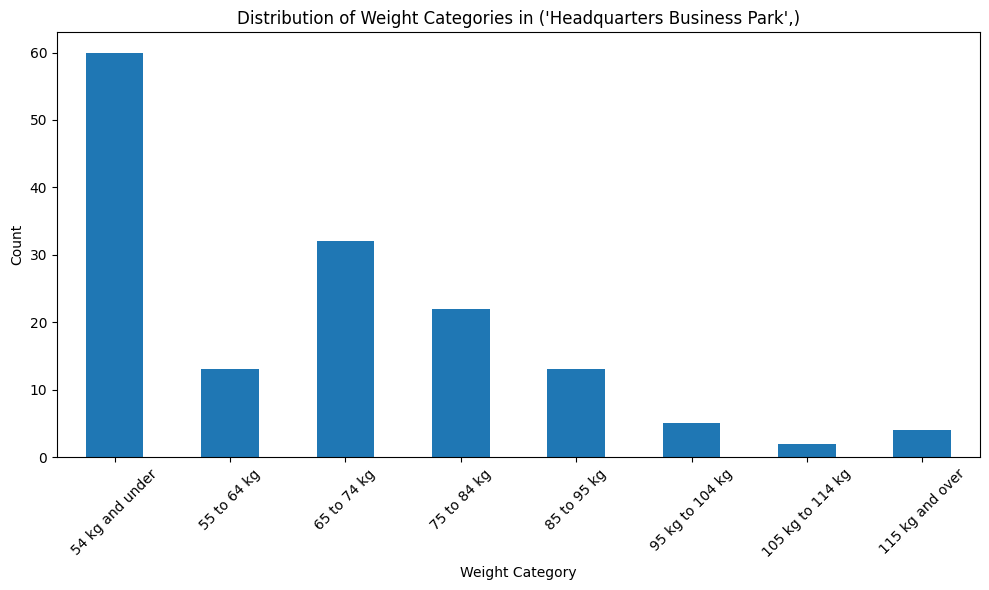

Group: ('King Street side',)


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
2489,25 to 34,610,2018-12-26,female,1,32.7,520,King Street side,65 to 74 kg,Morning Ride,31.5,38.5,30.22,3456,3456,1,2277
2308,19 and under,21,2018-12-26,male,1,43.4,392,King Street side,55 to 64 kg,Evening ride,26.3,50.4,57.90,7921,7921,0,1890
261,45 to 54,1028,2020-01-10,female,1,10.6,1602,King Street side,85 to 95 kg,Brave Cyclists 15 - 100km challenge,16.1,30.6,97.44,21761,21761,0,2598
4292,35 to 44,614,2020-02-14,female,1,28.6,596,King Street side,55 to 64 kg,Morning Ride,27.5,35.3,55.05,7204,7204,1,2507
4703,55 to 64,937,2017-02-08,male,1,40.3,422,King Street side,75 to 84 kg,Evening Ride strong head winds,31.4,50.0,46.72,5360,5360,1,2599
6187,20 to 24,1053,2018-12-26,female,1,31.6,538,King Street side,65 to 74 kg,Morning Ride,30.8,37.1,32.67,3821,3821,0,1981
1329,65 to 69,1277,2020-03-04,male,1,71.8,237,King Street side,75 to 84 kg,Fahrt am Morgen,20.4,82.8,91.99,16223,16223,0,2622
228,19 and under,47,2018-12-14,female,1,22.5,756,King Street side,54 kg and under,Morning Ride,22.1,35.6,43.63,7104,7104,0,1919
5765,25 to 34,318,2019-01-27,male,1,46.0,370,King Street side,75 to 84 kg,Morning Ride,26.3,57.2,31.84,4352,4352,1,1982
4491,75+,1049,2019-10-14,male,1,33.4,510,King Street side,85 to 95 kg,Ride 4 d health,25.4,51.1,71.57,10147,10147,0,2624


user_weight_category
54 kg and under     12
55 to 64 kg          5
65 to 74 kg         17
75 to 84 kg         14
85 to 95 kg          9
95 kg to 104 kg      1
105 kg to 114 kg     0
115 kg and over      1
Name: count, dtype: int64


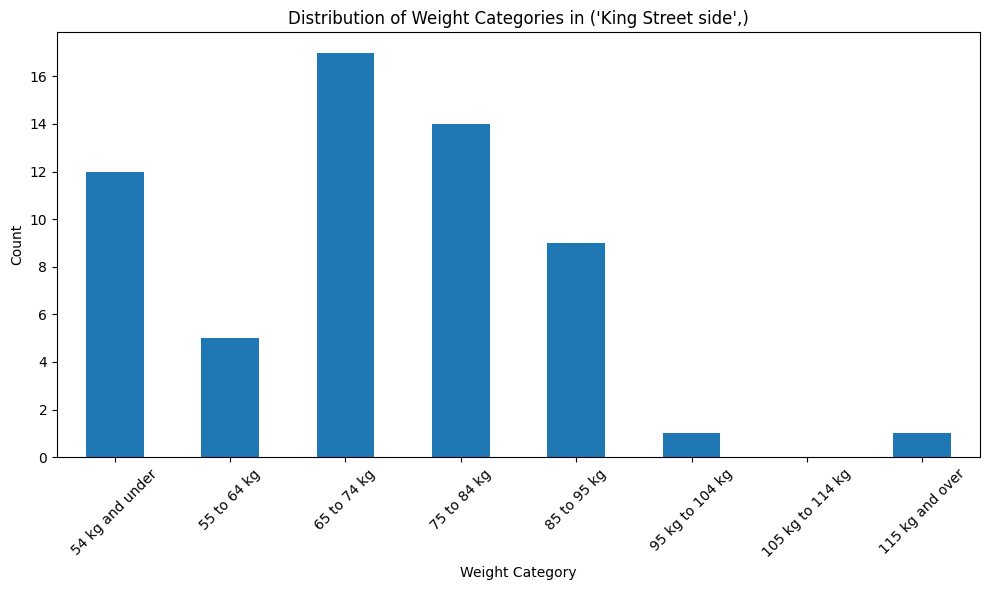

Group: ('North Corniche',)


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
5172,45 to 54,958,2019-02-11,male,1,48.3,359,North Corniche,85 to 95 kg,Monday evening windy ride,34.7,52.2,41.90,4344,4344,0,5750
5358,55 to 64,937,2018-01-01,male,1,43.4,400,North Corniche,75 to 84 kg,Solo training Evening Ride,30.7,47.5,19.28,2259,2259,1,5898
1701,20 to 24,58,2018-12-02,male,1,47.6,365,North Corniche,NaN,Evening Ride,39.0,50.8,37.71,3480,3480,1,4679
599,70 to 74,1622,2016-12-05,male,1,33.8,514,North Corniche,54 kg and under,Night Ride,28.4,49.0,9.71,1230,1230,0,5935
6074,35 to 44,1583,2019-07-19,female,1,30.3,573,North Corniche,NaN,Evening Ride,24.0,37.1,15.52,2324,2324,0,5739
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
641,25 to 34,417,2017-08-02,male,15,42.4,409,North Corniche,105 kg to 114 kg,Night Ride,31.0,52.6,40.70,4729,4729,1,4810
585,20 to 24,3,2020-03-07,male,15,36.2,479,North Corniche,65 to 74 kg,Morning Ride winking face flexed biceps person...,29.1,42.1,65.12,8063,8063,1,4693
4402,35 to 44,651,2018-11-28,male,15,42.4,409,North Corniche,65 to 74 kg,Night Ride,39.1,52.9,20.69,1906,1906,0,5370
3274,25 to 34,620,2019-06-15,female,15,22.3,778,North Corniche,55 to 64 kg,Evening Ride,16.0,29.2,50.68,11398,11398,0,5349


user_weight_category
54 kg and under     29
55 to 64 kg         13
65 to 74 kg         21
75 to 84 kg         19
85 to 95 kg         14
95 kg to 104 kg      3
105 kg to 114 kg     1
115 kg and over      1
Name: count, dtype: int64


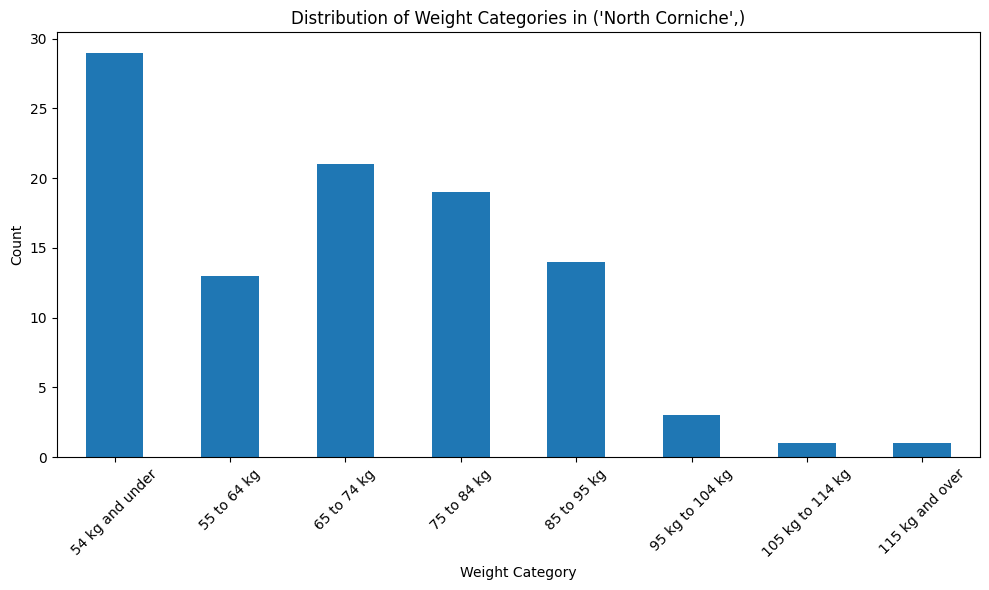

Group: ('Obhur North Short',)


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
2329,35 to 44,639,2018-02-17,male,1,37.6,658,Obhur North Short,65 to 74 kg,Morning Ride,27.4,50.0,100.91,13267,13267,1,1541
6271,75+,1049,2019-06-18,male,1,28.5,867,Obhur North Short,85 to 95 kg,Morning Ride,20.5,40.3,60.17,10586,10586,0,1685
3654,20 to 24,51,2016-08-19,male,1,37.5,659,Obhur North Short,65 to 74 kg,Morning Ride,34.9,50.8,69.15,7138,7138,1,1442
1480,35 to 44,923,2019-09-13,female,1,21.1,1174,Obhur North Short,65 to 74 kg,My 1st ever Century Ride,22.3,33.5,100.60,16206,16206,1,1621
2934,20 to 24,1053,2018-07-27,female,1,24.6,1005,Obhur North Short,65 to 74 kg,Morning Ride,22.2,37.1,101.26,16425,16425,0,1455
1245,65 to 69,1047,2018-04-28,male,1,33.4,740,Obhur North Short,75 to 84 kg,Saturday Spin with Patrice,32.2,41.8,101.09,11287,11287,1,1684
2798,25 to 34,214,2014-10-24,male,1,38.1,649,Obhur North Short,75 to 84 kg,Bike. Jeddah-North Obhur. Ritmo alegre. Grupet...,32.2,53.3,104.27,11653,11653,0,1457
4068,19 and under,49,2020-01-10,female,1,17.0,1453,Obhur North Short,54 kg and under,Afternoon Ride,17.3,46.1,102.65,21341,21341,0,1441
4607,25 to 34,186,2017-01-20,male,2,37.9,652,Obhur North Short,54 kg and under,Morning Ride,34.0,49.0,105.09,11119,11119,1,1458
1515,20 to 24,1054,2019-09-13,female,2,7.4,3356,Obhur North Short,54 kg and under,Evening Ride,17.7,33.1,100.05,20372,20372,0,1456


user_weight_category
54 kg and under     5
55 to 64 kg         3
65 to 74 kg         8
75 to 84 kg         4
85 to 95 kg         1
95 kg to 104 kg     0
105 kg to 114 kg    0
115 kg and over     0
Name: count, dtype: int64


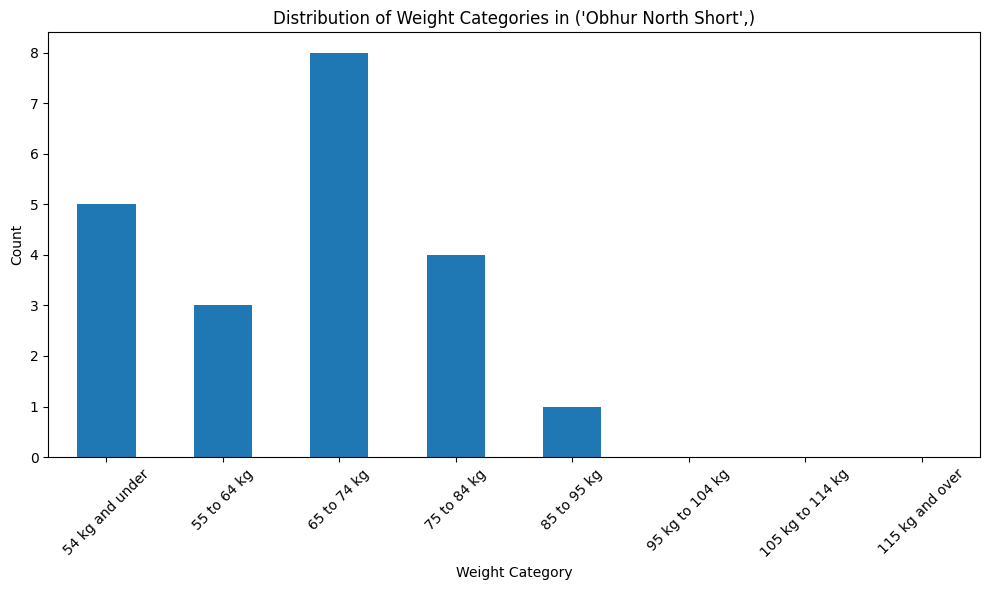

Group: ('Oghor 2 SailsIsland',)


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
3951,35 to 44,923,2018-12-14,female,1,28.4,253,Oghor 2 SailsIsland,65 to 74 kg,Morning Ride,22.5,31.3,50.40,8050,8050,1,4403
3372,20 to 24,58,2018-12-02,male,1,47.8,150,Oghor 2 SailsIsland,NaN,Evening Ride,39.0,50.8,37.71,3480,3480,1,3137
3666,45 to 54,1614,2020-03-07,female,1,24.7,290,Oghor 2 SailsIsland,55 to 64 kg,Corniche lazy saturday 7th march,16.3,32.0,33.92,7482,7482,0,4576
4706,25 to 34,404,2019-12-20,male,1,60.8,118,Oghor 2 SailsIsland,95 kg to 104 kg,Morning Ride,26.3,72.7,24.14,3305,3305,0,3280
5171,55 to 64,937,2017-05-03,male,1,45.4,158,Oghor 2 SailsIsland,75 to 84 kg,Evening Ride with JC,28.5,54.4,32.40,4096,4096,1,4580
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6284,19 and under,18,2019-10-30,male,17,35.5,202,Oghor 2 SailsIsland,65 to 74 kg,Evening Ride,25.4,45.0,52.48,7449,7449,0,3092
5898,45 to 54,997,2019-08-16,male,17,40.5,177,Oghor 2 SailsIsland,85 to 95 kg,Morning Ride تمرين خفيف استعادة لياقة,29.1,52.9,57.40,7093,7093,1,4433
3843,45 to 54,946,2015-12-11,male,17,40.5,177,Oghor 2 SailsIsland,65 to 74 kg,Sortie à vélo matinale,32.3,47.2,105.11,11718,11718,0,4431
4266,19 and under,23,2019-05-08,male,18,34.0,211,Oghor 2 SailsIsland,55 to 64 kg,ثاني نص، تمرين جميل flexed biceps: light skin ...,27.5,44.3,31.40,4106,4106,0,3093


user_weight_category
54 kg and under     35
55 to 64 kg         12
65 to 74 kg         21
75 to 84 kg         26
85 to 95 kg         14
95 kg to 104 kg      9
105 kg to 114 kg     1
115 kg and over      4
Name: count, dtype: int64


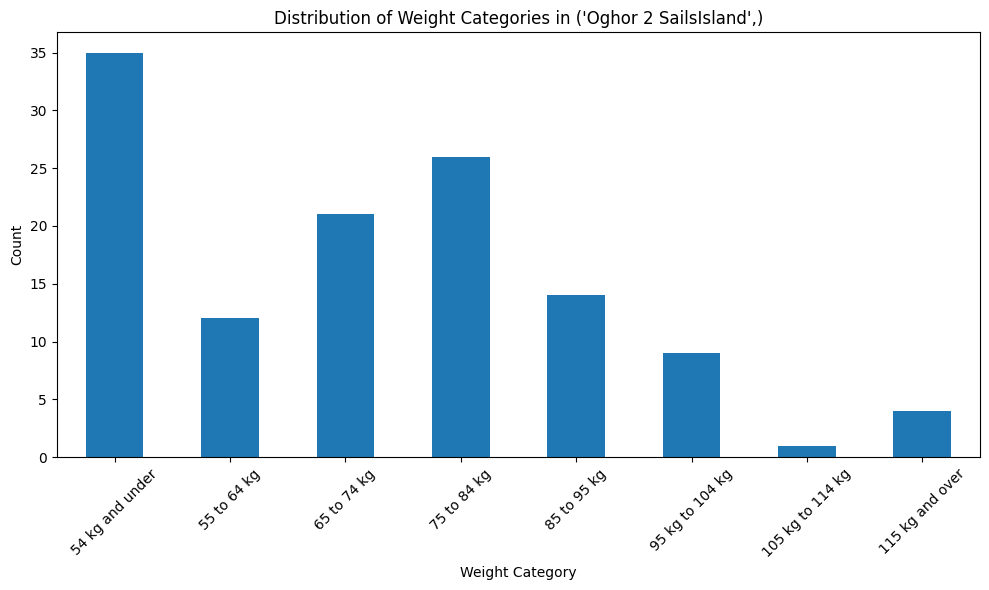

Group: ('PRINCE SULTAN - ASSALAM TO FATIMA',)


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
4803,55 to 64,1041,2017-11-28,male,1,40.7,240,PRINCE SULTAN - ASSALAM TO FATIMA,85 to 95 kg,Evening Ride,33.3,44.6,39.93,4324,4324,1,3057
4541,25 to 34,397,2018-02-16,male,1,87.3,112,PRINCE SULTAN - ASSALAM TO FATIMA,85 to 95 kg,Evening Ride,17.6,108.0,20.57,4197,4197,0,2667
3235,20 to 24,137,2019-01-05,male,1,81.4,120,PRINCE SULTAN - ASSALAM TO FATIMA,54 kg and under,Morning Ride,27.3,94.3,31.02,4095,4095,0,2643
2111,75+,1049,2019-06-09,male,1,36.2,270,PRINCE SULTAN - ASSALAM TO FATIMA,85 to 95 kg,Morning Ride,20.4,52.9,53.85,9508,9508,0,3075
184,35 to 44,1339,2017-05-29,female,1,63.9,153,PRINCE SULTAN - ASSALAM TO FATIMA,54 kg and under,Night Ride,17.9,72.4,25.14,5070,5070,0,2984
2042,45 to 54,1124,2018-08-07,male,1,66.9,146,PRINCE SULTAN - ASSALAM TO FATIMA,54 kg and under,Evening Ride,24.2,80.6,92.43,13775,13775,0,2985
1652,65 to 69,1047,2018-05-30,male,1,38.2,256,PRINCE SULTAN - ASSALAM TO FATIMA,75 to 84 kg,Wednesday Ramadan Ride Solo,29.8,40.0,74.75,9021,9021,1,3074
4901,45 to 54,1350,2019-07-12,female,1,28.0,349,PRINCE SULTAN - ASSALAM TO FATIMA,75 to 84 kg,Morning Ride,24.7,46.8,71.20,10385,10385,0,3056
4979,19 and under,17,2019-01-01,male,1,40.4,242,PRINCE SULTAN - ASSALAM TO FATIMA,54 kg and under,Night Ride,29.1,52.2,23.97,2968,2968,1,2626
2742,35 to 44,216,2019-02-02,male,1,75.8,129,PRINCE SULTAN - ASSALAM TO FATIMA,75 to 84 kg,Morning Ride,35.4,98.3,78.00,7926,7926,1,2834


user_weight_category
54 kg and under     7
55 to 64 kg         2
65 to 74 kg         8
75 to 84 kg         7
85 to 95 kg         8
95 kg to 104 kg     3
105 kg to 114 kg    1
115 kg and over     0
Name: count, dtype: int64


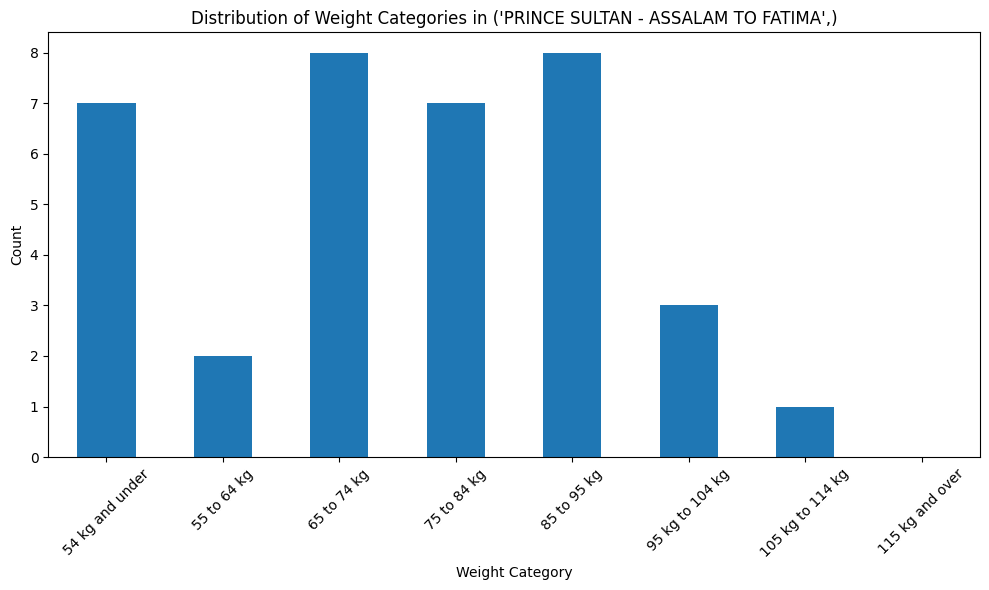

Group: ('S.Ubhur Alkurnaysh South Bound with detour',)


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
2015,19 and under,6,2017-12-04,male,1,41.1,776,S.Ubhur Alkurnaysh South Bound with detour,54 kg and under,Evening Ride,32.2,46.4,49.92,5581,5581,0,1104
3011,25 to 34,158,2016-12-16,male,1,45.5,700,S.Ubhur Alkurnaysh South Bound with detour,85 to 95 kg,Morning Ride,34.6,54.4,85.00,8854,8854,1,1143
3375,75+,1049,2019-11-20,male,1,39.9,798,S.Ubhur Alkurnaysh South Bound with detour,85 to 95 kg,Nov.20th 2019,21.0,48.6,72.14,12373,12373,0,1428
2287,55 to 64,940,2017-12-08,male,1,45.4,702,S.Ubhur Alkurnaysh South Bound with detour,55 to 64 kg,Morning Ride,27.0,59.4,76.46,10212,10212,1,1413
2596,35 to 44,639,2016-12-16,male,1,45.6,698,S.Ubhur Alkurnaysh South Bound with detour,65 to 74 kg,Morning Ride,31.7,52.9,83.60,9504,9504,1,1264
5086,20 to 24,1053,2019-01-04,female,1,29.4,1083,S.Ubhur Alkurnaysh South Bound with detour,65 to 74 kg,Morning Ride,26.2,39.2,60.79,8355,8355,0,1141
5581,20 to 24,2,2020-01-03,male,1,43.9,726,S.Ubhur Alkurnaysh South Bound with detour,65 to 74 kg,Morning Ride,34.3,59.0,65.31,6862,6862,1,1122
5971,45 to 54,958,2019-12-13,male,1,44.4,718,S.Ubhur Alkurnaysh South Bound with detour,85 to 95 kg,Morning Ride,31.1,55.1,80.52,9325,9325,1,1369
1094,35 to 44,926,2017-12-08,female,1,28.6,1114,S.Ubhur Alkurnaysh South Bound with detour,75 to 84 kg,Bravo Bravo Jeddah,20.2,35.6,34.27,6115,6115,0,1366
954,19 and under,47,2018-12-14,female,1,26.2,1217,S.Ubhur Alkurnaysh South Bound with detour,54 kg and under,Morning Ride,22.1,35.6,43.63,7104,7104,0,1121


user_weight_category
54 kg and under     9
55 to 64 kg         2
65 to 74 kg         8
75 to 84 kg         4
85 to 95 kg         3
95 kg to 104 kg     0
105 kg to 114 kg    0
115 kg and over     0
Name: count, dtype: int64


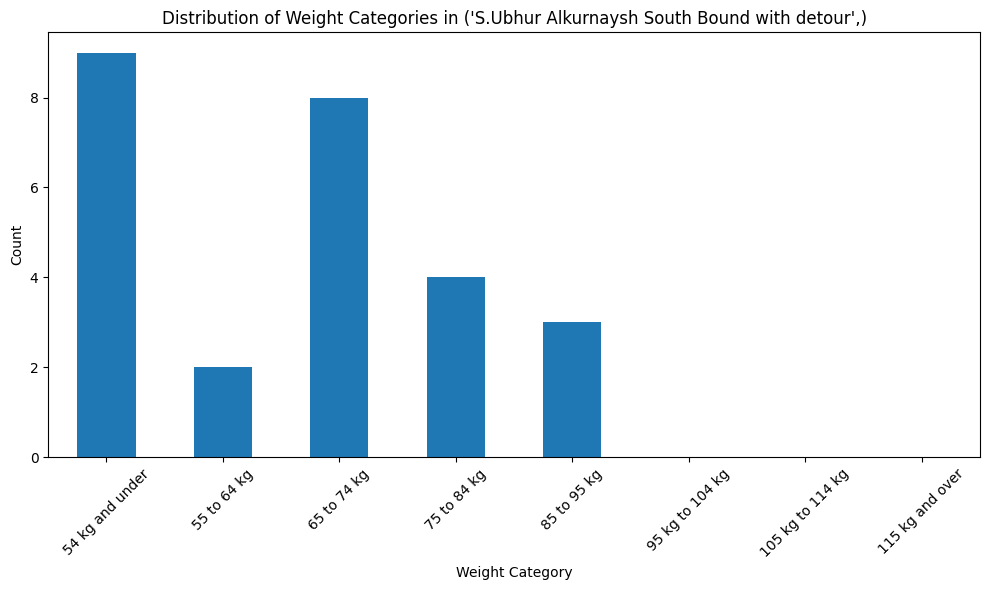

Group: ('Starbucks to Majid',)


,user_age_group,user_id,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,id
3760,65 to 69,1047,2018-05-07,male,1,28.7,490,Starbucks to Majid,75 to 84 kg,Monday Solo Ride,28.4,38.9,102.57,12988,12988,1,1100
3870,35 to 44,922,2018-05-09,female,1,38.8,363,Starbucks to Majid,54 kg and under,Evening Ride,18.7,78.8,31.84,6114,6114,0,961
4573,19 and under,47,2018-09-15,female,1,25.3,556,Starbucks to Majid,54 kg and under,من أرهب التمارين,17.7,31.3,54.53,11094,11094,0,46
2432,35 to 44,631,2019-09-30,male,1,68.7,205,Starbucks to Majid,54 kg and under,تمرين مع دراج جده,32.4,110.9,50.52,5606,5606,0,643
2025,25 to 34,146,2019-05-08,male,1,69.4,203,Starbucks to Majid,105 kg to 114 kg,Night Ride,28.8,105.5,28.01,3504,3504,0,152
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1665,20 to 24,61,2017-04-06,male,13,30.8,457,Starbucks to Majid,85 to 95 kg,MidNight Ride,27.9,40.7,17.51,2258,2258,0,62
478,35 to 44,641,2014-12-01,male,13,38.7,364,Starbucks to Majid,65 to 74 kg,SS+Threshold,34.2,46.4,57.80,6079,6079,1,655
4756,25 to 34,158,2017-12-06,male,13,41.8,337,Starbucks to Majid,85 to 95 kg,Evening Ride,31.7,52.9,81.27,9243,9243,1,164
1197,19 and under,13,2017-09-12,male,13,28.4,496,Starbucks to Majid,65 to 74 kg,Evening Ride,28.5,46.1,39.08,4932,4932,0,12


user_weight_category
54 kg and under     37
55 to 64 kg          5
65 to 74 kg         15
75 to 84 kg          9
85 to 95 kg         12
95 kg to 104 kg      4
105 kg to 114 kg     1
115 kg and over      2
Name: count, dtype: int64


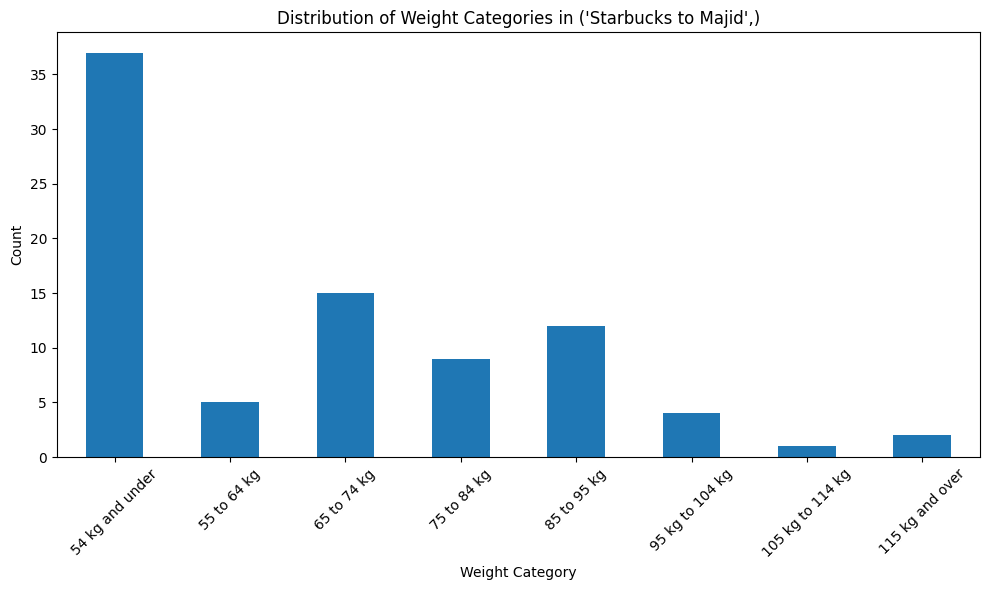

In [84]:
# Tetapkan urutan kategori untuk 'user_weight_category'
category_order = [
    '54 kg and under', '55 to 64 kg', '65 to 74 kg', '75 to 84 kg',
    '85 to 95 kg', '95 kg to 104 kg', '105 kg to 114 kg', '115 kg and over'
]


# Loop untuk menghasilkan grafik distribusi setiap grup berdasarkan hanya 10 teratas
for group_name, group_data in df_sorted:
    # Ambil hanya 10 data teratas dari grup
    top_10_group_data = group_data.head(math.ceil(len(group_data) * 0.1))

    print(f"Group: {group_name}")
    display(top_10_group_data)

    # Distribusi kategori berat badan untuk 10 data teratas grup saat ini
    weight_distribution = top_10_group_data['user_weight_category'].value_counts().reindex(category_order, fill_value=0)
    print(weight_distribution)

    # Visualisasi distribusi
    plt.figure(figsize=(10, 6))
    weight_distribution.plot(kind='bar', title=f'Distribution of Weight Categories in {group_name}')
    plt.xlabel('Weight Category')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

### Kesimpulan

Berdasarkan grafik distribusi yang Anda unggah, berikut adalah **kesimpulan** utama:

1. **Dominasi Kategori Berat Badan:**
   - **"54 kg and under"** adalah kategori yang mendominasi di banyak lokasi, terutama di lokasi dengan jumlah peserta yang besar seperti **Headquarters Business Park**, **Oghor 2 SailsIsland**, dan **North Corniche**.
   - Kategori **"75 to 84 kg"** juga signifikan di banyak lokasi dan sering menjadi kategori kedua terbanyak.

2. **Distribusi Lokasi Tertentu:**
   - Lokasi dengan jumlah peserta lebih kecil, seperti **Obhur North Short**, cenderung memiliki distribusi yang lebih merata di antara kategori berat badan.
   - Lokasi dengan peserta lebih besar, seperti **Headquarters Business Park** dan **Oghor 2 SailsIsland**, menunjukkan dominasi kategori tertentu seperti **"54 kg and under"**.

3. **Kategori Berat Badan dengan Peserta Sedikit:**
   - Kategori **"105 kg to 114 kg"** dan **"115 kg and over"** memiliki jumlah peserta paling sedikit di hampir semua lokasi, menunjukkan bahwa peserta dengan berat badan tinggi jarang ditemukan.

4. **Variasi Lokasi:**
   - Lokasi seperti **Al Fardoos to shellfish round about** menunjukkan distribusi yang relatif seimbang di beberapa kategori, tetapi tetap didominasi oleh **"75 to 84 kg"**.
   - Lokasi seperti **S.Ubhur Alkurnaysh South Bound with detour** memiliki jumlah peserta yang relatif sedikit, tetapi tren distribusi tetap serupa dengan lokasi lain.

# **== Modelling ==**

# **Klasifikasi**

> Memprediksi gender dari orang yang mengikuti *event*

## Decision Tree

#### Load Data

In [85]:
df_dt = df_clean.copy()
df_dt.head()

,user_age_group,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data
0,25 to 34,2017-12-22,male,712,15.8,382,Headquarters Business Park,54 kg and under,Night Ride,13.6,34.9,19.24,5103,5103,0
1,25 to 34,2015-04-13,male,189,33.2,216,Oghor 2 SailsIsland,105 kg to 114 kg,Night Ride,21.5,43.2,23.47,3926,3926,0
2,25 to 34,2018-02-07,male,264,23.7,593,Starbucks to Majid,75 to 84 kg,Evening Ride,26.7,92.9,38.23,5152,5152,0
3,25 to 34,2018-08-24,male,50,33.4,817,Al Fardoos to shellfish round about,75 to 84 kg,Afternoon Ride,31.4,54.4,65.77,7548,7548,1
4,25 to 34,2020-03-06,female,19,21.3,284,Headquarters Business Park,54 kg and under,ثاني تمرين ١٠٠كم,19.9,43.2,96.53,17493,17493,0


In [86]:
df_dt['gender'] = df_dt['gender'].map({'female': 1, 'male':2})
df_dt.head()

,user_age_group,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data
0,25 to 34,2017-12-22,2,712,15.8,382,Headquarters Business Park,54 kg and under,Night Ride,13.6,34.9,19.24,5103,5103,0
1,25 to 34,2015-04-13,2,189,33.2,216,Oghor 2 SailsIsland,105 kg to 114 kg,Night Ride,21.5,43.2,23.47,3926,3926,0
2,25 to 34,2018-02-07,2,264,23.7,593,Starbucks to Majid,75 to 84 kg,Evening Ride,26.7,92.9,38.23,5152,5152,0
3,25 to 34,2018-08-24,2,50,33.4,817,Al Fardoos to shellfish round about,75 to 84 kg,Afternoon Ride,31.4,54.4,65.77,7548,7548,1
4,25 to 34,2020-03-06,1,19,21.3,284,Headquarters Business Park,54 kg and under,ثاني تمرين ١٠٠كم,19.9,43.2,96.53,17493,17493,0


#### Encode data

In [87]:
unique_summary = {
    "Attribute": [],
    "Unique Count": [],
    "Unique Values": []
}

for column in ["user_age_group", "attempt_date", "smt_name","user_weight_category", "act_title"]:
    unique_values = df_dt[column].unique()
    unique_summary["Attribute"].append(column)
    unique_summary["Unique Count"].append(len(unique_values))
    unique_summary["Unique Values"].append(unique_values)

unique_summary_df = pd.DataFrame(unique_summary)
unique_summary_df

,Attribute,Unique Count,Unique Values
0,user_age_group,9,"[25 to 34, 19 and under, 35 to 44, 55 to 64, 4..."
1,attempt_date,1457,"[2017-12-22, 2015-04-13, 2018-02-07, 2018-08-2..."
2,smt_name,9,"[Headquarters Business Park, Oghor 2 SailsIsla..."
3,user_weight_category,8,"[54 kg and under, 105 kg to 114 kg, 75 to 84 k..."
4,act_title,1051,"[Night Ride, Evening Ride, Afternoon Ride, ثان..."


Preprocessing dengan membuat kolom `user_age_group`, `user_weight_category`, `smt_name` menjadi numerikal dengan ketentuan berikut:

i. User age Group
* 19 and under -> 0
* 20 to 24 -> 1
* 25 to 34 -> 2
* 35 to 44 -> 3
* 45 to 54 -> 4
* 55 to 64 -> 5
* 65 to 69 -> 6
* 70 to 74 -> 7
* 75+ -> 8

ii. User weight category
* 54 kg and under -> 0
* 55 kg to 64 kg -> 1
* 65 kg to 74 kg -> 2
* 75 kg to 84 kg -> 3
* 85 kg to 95 kg -> 4
* 95 kg to 104 kg -> 5
* 105 kg to 114 kg -> 6
* 115 kg and over -> 7


In [88]:
# Mapping untuk User Age Group
age_mapping = {
    '19 and under': 0,
    '20 to 24': 1,
    '25 to 34': 2,
    '35 to 44': 3,
    '45 to 54': 4,
    '55 to 64': 5,
    '65 to 69': 6,
    '70 to 74': 7,
    '75+': 8
}

df_dt['user_age_group'] = df_dt['user_age_group'].map(age_mapping)
df_dt.head()

,user_age_group,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data
0,2,2017-12-22,2,712,15.8,382,Headquarters Business Park,54 kg and under,Night Ride,13.6,34.9,19.24,5103,5103,0
1,2,2015-04-13,2,189,33.2,216,Oghor 2 SailsIsland,105 kg to 114 kg,Night Ride,21.5,43.2,23.47,3926,3926,0
2,2,2018-02-07,2,264,23.7,593,Starbucks to Majid,75 to 84 kg,Evening Ride,26.7,92.9,38.23,5152,5152,0
3,2,2018-08-24,2,50,33.4,817,Al Fardoos to shellfish round about,75 to 84 kg,Afternoon Ride,31.4,54.4,65.77,7548,7548,1
4,2,2020-03-06,1,19,21.3,284,Headquarters Business Park,54 kg and under,ثاني تمرين ١٠٠كم,19.9,43.2,96.53,17493,17493,0


In [89]:
# Mapping untuk User Weight Category
mapping = {
    '54 kg and under': 0,
    '55 to 64 kg': 1,
    '65 to 74 kg': 2,
    '75 to 84 kg': 3,
    '85 to 95 kg': 4,
    '95 kg to 104 kg': 5,
    '105 kg to 114 kg': 6,
    '115 kg and over': 7
}

df_dt['user_weight_category'] = df_dt['user_weight_category'].map(mapping)
df_dt

,user_age_group,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data
0,2,2017-12-22,2,712,15.8,382,Headquarters Business Park,0,Night Ride,13.6,34.9,19.24,5103,5103,0
1,2,2015-04-13,2,189,33.2,216,Oghor 2 SailsIsland,6,Night Ride,21.5,43.2,23.47,3926,3926,0
2,2,2018-02-07,2,264,23.7,593,Starbucks to Majid,3,Evening Ride,26.7,92.9,38.23,5152,5152,0
3,2,2018-08-24,2,50,33.4,817,Al Fardoos to shellfish round about,3,Afternoon Ride,31.4,54.4,65.77,7548,7548,1
4,2,2020-03-06,1,19,21.3,284,Headquarters Business Park,0,ثاني تمرين ١٠٠كم,19.9,43.2,96.53,17493,17493,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6287,2,2018-07-16,2,431,22.3,778,North Corniche,0,Night Ride,17.9,96.5,41.93,8446,8446,0
6288,3,2018-11-21,2,34,38.9,446,North Corniche,4,تمرين جده ١٣/٣/٤٠,34.5,52.2,48.13,5026,5026,1
6289,3,2013-08-11,2,218,22.1,637,Starbucks to Majid,3,Night Ride,17.6,40.7,50.64,10374,10374,0
6290,3,2015-04-24,2,477,12.4,485,Headquarters Business Park,4,Morning Ride,14.5,34.9,40.93,10158,10158,0


In [90]:
df_dt = pd.get_dummies(df_dt, columns=['smt_name'])
df_dt.head()

,user_age_group,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,user_weight_category,act_title,act_avg_spd,act_max_spd,...,has_hr_data,smt_name_Al Fardoos to shellfish round about,smt_name_Headquarters Business Park,smt_name_King Street side,smt_name_North Corniche,smt_name_Obhur North Short,smt_name_Oghor 2 SailsIsland,smt_name_PRINCE SULTAN - ASSALAM TO FATIMA,smt_name_S.Ubhur Alkurnaysh South Bound with detour,smt_name_Starbucks to Majid
0,2,2017-12-22,2,712,15.8,382,0,Night Ride,13.6,34.9,...,0,False,True,False,False,False,False,False,False,False
1,2,2015-04-13,2,189,33.2,216,6,Night Ride,21.5,43.2,...,0,False,False,False,False,False,True,False,False,False
2,2,2018-02-07,2,264,23.7,593,3,Evening Ride,26.7,92.9,...,0,False,False,False,False,False,False,False,False,True
3,2,2018-08-24,2,50,33.4,817,3,Afternoon Ride,31.4,54.4,...,1,True,False,False,False,False,False,False,False,False
4,2,2020-03-06,1,19,21.3,284,0,ثاني تمرين ١٠٠كم,19.9,43.2,...,0,False,True,False,False,False,False,False,False,False


In [91]:
# Frequency Encoding untuk act_title
freq_map = df_dt['act_title'].value_counts(normalize=True)
df_dt['act_title'] = df_dt['act_title'].map(freq_map)
df_dt.head()

,user_age_group,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,user_weight_category,act_title,act_avg_spd,act_max_spd,...,has_hr_data,smt_name_Al Fardoos to shellfish round about,smt_name_Headquarters Business Park,smt_name_King Street side,smt_name_North Corniche,smt_name_Obhur North Short,smt_name_Oghor 2 SailsIsland,smt_name_PRINCE SULTAN - ASSALAM TO FATIMA,smt_name_S.Ubhur Alkurnaysh South Bound with detour,smt_name_Starbucks to Majid
0,2,2017-12-22,2,712,15.8,382,0,0.132072,13.6,34.9,...,0,False,True,False,False,False,False,False,False,False
1,2,2015-04-13,2,189,33.2,216,6,0.132072,21.5,43.2,...,0,False,False,False,False,False,True,False,False,False
2,2,2018-02-07,2,264,23.7,593,3,0.281310,26.7,92.9,...,0,False,False,False,False,False,False,False,False,True
3,2,2018-08-24,2,50,33.4,817,3,0.092498,31.4,54.4,...,1,True,False,False,False,False,False,False,False,False
4,2,2020-03-06,1,19,21.3,284,0,0.000477,19.9,43.2,...,0,False,True,False,False,False,False,False,False,False


In [92]:
#encoding attempt_date
df_dt['attempt_date'] = pd.to_datetime(df_dt['attempt_date'])

df_dt['attempt_year'] = df_dt['attempt_date'].dt.year
df_dt['attempt_month'] = df_dt['attempt_date'].dt.month
df_dt['attempt_day'] = df_dt['attempt_date'].dt.day

df_dt = df_dt.drop('attempt_date', axis=1)
df_dt.head()

,user_age_group,gender,smt_rank,smt_avg_spd,smt_finish_seconds,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,...,smt_name_King Street side,smt_name_North Corniche,smt_name_Obhur North Short,smt_name_Oghor 2 SailsIsland,smt_name_PRINCE SULTAN - ASSALAM TO FATIMA,smt_name_S.Ubhur Alkurnaysh South Bound with detour,smt_name_Starbucks to Majid,attempt_year,attempt_month,attempt_day
0,2,2,712,15.8,382,0,0.132072,13.6,34.9,19.24,...,False,False,False,False,False,False,False,2017,12,22
1,2,2,189,33.2,216,6,0.132072,21.5,43.2,23.47,...,False,False,False,True,False,False,False,2015,4,13
2,2,2,264,23.7,593,3,0.281310,26.7,92.9,38.23,...,False,False,False,False,False,False,True,2018,2,7
3,2,2,50,33.4,817,3,0.092498,31.4,54.4,65.77,...,False,False,False,False,False,False,False,2018,8,24
4,2,1,19,21.3,284,0,0.000477,19.9,43.2,96.53,...,False,False,False,False,False,False,False,2020,3,6


Encoding setiap data yang digunakan telah dipilih dengan mempertimbangkan sifat dan kebutuhan analisis dari setiap atribut. Untuk kolom `user_age_group` dan `user_weight_category`, mapping dipilih karena kedua kolom ini memiliki nilai kategorikal yang bersifat ordinal, di mana terdapat urutan logis antar kategori, seperti usia atau kelompok berat badan. Mapping membantu mengonversi kategori tersebut menjadi angka yang merepresentasikan hubungan hierarkis. Sementara itu, kolom `smt_name` menggunakan one-hot encoding karena kategorinya bersifat nominal, tanpa hubungan ordinal. Teknik ini memastikan bahwa setiap kategori diperlakukan setara oleh model tanpa asumsi hubungan, sekaligus menjaga interpretasi data tetap sederhana karena jumlah kategorinya relatif kecil.

Untuk kolom `act_title`, frequency encoding dipilih karena kolom ini memiliki banyak kategori unik, yang akan menyebabkan lonjakan jumlah fitur jika menggunakan one-hot encoding. Dengan mengganti kategori dengan frekuensi kemunculannya, model dapat menangkap pentingnya suatu kategori berdasarkan distribusinya, tanpa menambah dimensi data secara signifikan. Terakhir, pada kolom `attempt_date`, data waktu diolah dengan memisahkannya menjadi atribut tahun, bulan, dan hari. Hal ini memungkinkan model untuk mengenali pola temporal yang tidak akan terlihat jika data tetap dalam format datetime.

Proses encoding berdasarkan source dibawah ini:
* https://www.geeksforgeeks.org/ml-one-hot-encoding/#what-is-one-hot-encoding
* https://stats.stackexchange.com/questions/311494/best-practice-for-encoding-datetime-in-machine-learning
* https://sagarikakathuria29.medium.com/understanding-the-difference-between-target-encoding-and-frequency-encoding-1d9bd264b8e


#### Proses Modelling

In [93]:
X = df_dt.drop(columns=['gender'])
y = df_dt['gender']

In [94]:
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

In [95]:
X_train.head()

,user_age_group,smt_rank,smt_avg_spd,smt_finish_seconds,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,...,smt_name_King Street side,smt_name_North Corniche,smt_name_Obhur North Short,smt_name_Oghor 2 SailsIsland,smt_name_PRINCE SULTAN - ASSALAM TO FATIMA,smt_name_S.Ubhur Alkurnaysh South Bound with detour,smt_name_Starbucks to Majid,attempt_year,attempt_month,attempt_day
2689,3,12,37.0,163,2,0.000159,39.6,65.5,48.65,4424,...,False,False,False,False,False,False,False,2019,4,19
291,2,213,32.2,223,0,0.092498,24.9,99.0,73.08,10547,...,False,False,False,True,False,False,False,2019,2,15
5115,4,78,18.5,918,3,0.281310,16.0,23.0,14.08,3174,...,True,False,False,False,False,False,False,2017,9,26
3236,2,709,15.9,379,2,0.281310,14.6,37.1,7.78,1914,...,False,False,False,False,False,False,False,2019,10,3
3322,1,156,16.9,357,0,0.132072,21.8,96.5,18.98,3139,...,False,False,False,False,False,False,False,2019,4,12


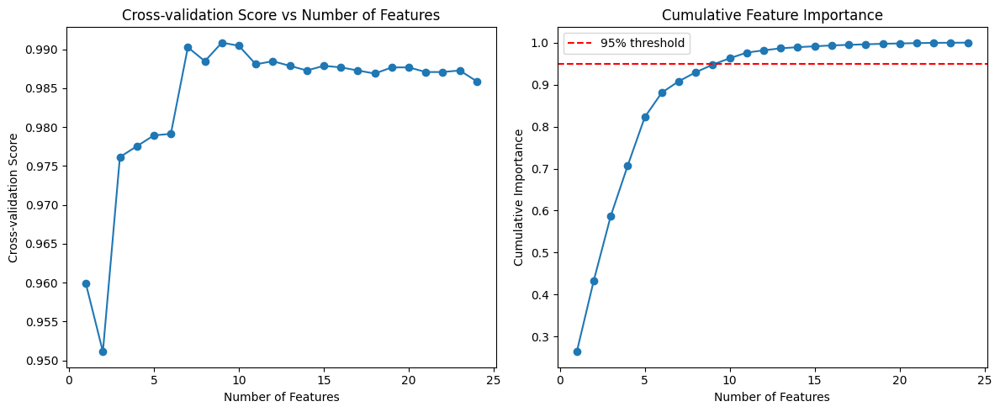

Optimal k based on CV score: 9
Optimal k based on 95% importance: 10
Maximum CV score: 0.991

Feature Importance Ranking:
                                              Feature       Score
1                                            smt_rank  185.329845
4                                user_weight_category  119.352278
2                                         smt_avg_spd  108.012704
21                                       attempt_year   84.415463
6                                         act_avg_spd   80.752706
13                smt_name_Headquarters Business Park   41.025530
0                                      user_age_group   19.024687
8                                        act_total_km   15.071157
3                                  smt_finish_seconds   12.794276
18         smt_name_PRINCE SULTAN - ASSALAM TO FATIMA   10.630587
7                                         act_max_spd    9.482825
17                       smt_name_Oghor 2 SailsIsland    3.769421
14                  

In [96]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.tree import DecisionTreeClassifier
import matplotlib.pyplot as plt
import seaborn as sns


# 3. Mencari k optimal
def find_optimal_k(X_train_scaled, y_train, max_features=None):
    if max_features is None:
        max_features = X_train_scaled.shape[1]

    k_range = range(1, max_features + 1)
    scores = []
    cv_scores = []

    for k in k_range:
        # Seleksi fitur
        selector = SelectKBest(score_func=f_classif, k=k)
        X_selected = selector.fit_transform(X_train_scaled, y_train)

        # Evaluasi dengan cross validation
        clf = DecisionTreeClassifier(random_state=42)
        cv_score = cross_val_score(clf, X_selected, y_train, cv=5).mean()
        cv_scores.append(cv_score)

        # Simpan f-scores
        scores.append(selector.scores_)

    # Plot hasil
    plt.figure(figsize=(12, 5))

    # Plot 1: CV Scores
    plt.subplot(1, 2, 1)
    plt.plot(k_range, cv_scores, marker='o')
    plt.xlabel('Number of Features')
    plt.ylabel('Cross-validation Score')
    plt.title('Cross-validation Score vs Number of Features')

    # Plot 2: Cumulative Feature Importance
    plt.subplot(1, 2, 2)
    cumulative_importance = np.cumsum(np.sort(scores[0])[::-1]) / np.sum(scores[0])
    plt.plot(k_range, cumulative_importance, marker='o')
    plt.axhline(y=0.95, color='r', linestyle='--', label='95% threshold')
    plt.xlabel('Number of Features')
    plt.ylabel('Cumulative Importance')
    plt.title('Cumulative Feature Importance')
    plt.legend()

    plt.tight_layout()
    plt.show()

    # Temukan k optimal
    k_optimal_cv = k_range[np.argmax(cv_scores)]
    k_optimal_95 = np.where(cumulative_importance >= 0.95)[0][0] + 1

    print(f"Optimal k based on CV score: {k_optimal_cv}")
    print(f"Optimal k based on 95% importance: {k_optimal_95}")
    print(f"Maximum CV score: {max(cv_scores):.3f}")

    # Feature importance ranking
    selector = SelectKBest(score_func=f_classif, k='all')
    selector.fit(X_train_scaled, y_train)
    feature_scores = pd.DataFrame({
        'Feature': X_train.columns,
        'Score': selector.scores_
    }).sort_values('Score', ascending=False)

    print("\nFeature Importance Ranking:")
    print(feature_scores)

    return k_optimal_cv, feature_scores

# Jalankan fungsi
k_optimal, feature_scores = find_optimal_k(X_train, y_train)


Pada tahap ini, **Feature selection** dilakukan untuk meningkatkan performa model prediktif dengan memilih fitur-fitur yang paling relevan, menghilangkan fitur yang redundan atau tidak signifikan, dan menyederhanakan struktur model. Terlihat bahwa, model mencapai performa optimal dengan menggunakan 9 fitur berdasarkan CV score. Seperti yang terlihat pada grafik cross-validation score, Penambahan fitur setelah jumlah tersebut tidak memberikan kontribusi berarti bahkan cenderung menurunkan performa. Selain itu, proses feature selection membantu mengurangi waktu komputasi, menjadikan pelatihan dan prediksi lebih efisien tanpa mengorbankan akurasi model. Grafik cumulative feature importance juga menunjukkan bahwa fitur tambahan setelah kontribusi kumulatif 95% cenderung hanya menambah noise daripada informasi yang relevan, sehingga risiko overfitting dapat diminimalkan.

Selain meningkatkan efisiensi, feature selection memberikan interpretabilitas yang lebih baik terhadap model. Fitur dengan skor tinggi, seperti 'smt_rank,' 'user_weight_category,' dan 'smt_avg_spd,' menunjukkan pengaruh signifikan terhadap hasil prediksi. Sementara itu, fitur dengan skor rendah dapat diabaikan tanpa mengurangi performa model. Pendekatan ini tidak hanya menyederhanakan model, tetapi juga memastikan bahwa fitur-fitur yang digunakan benar-benar relevan. Dengan demikian, penggunaan feature selection memungkinkan pembuatan model yang lebih sederhana, efisien, dan robust, sekaligus memastikan akurasi dan daya prediksi yang tinggi.

Referensi:   
* https://www.heavy.ai/technical-glossary/feature-selection#:~:text=Feature%20selection%20is%20the%20process,of%20datasets%20continue%20to%20grow.

In [97]:
class_counts = df_dt['gender'].value_counts()
imbalance_ratio = class_counts.min() / class_counts.max()

print(f"Rasio kelas minoritas terhadap mayoritas: {imbalance_ratio:.2f}")

Rasio kelas minoritas terhadap mayoritas: 0.04


Dataset ini memiliki proporsi 0.04, yang menunjukkan bahwa kelas minoritas hanya sekitar 4% dari total dataset. Berdasarkan aturan umum, dataset dianggap imbalanced jika kelas minoritas kurang dari 10-20%, dan proporsi sebesar 0.04 berada jauh di bawah ambang batas tersebut. Ketidakseimbangan ini menyebabkan sebagian besar data didominasi oleh kelas mayoritas, sehingga dapat menyebabkan prioritas lebih tinggi pada kelas mayoritas dan mengabaikan kelas minoritas dalam proses klasifikasi.

Referensi:
* https://datascience.stackexchange.com/questions/122571/determining-whether-a-dataset-is-imbalanced-or-not

In [98]:
# Setelah mendapatkan k optimal, buat pipeline
from sklearn.pipeline import Pipeline
from imblearn.pipeline import Pipeline as ImblearnPipeline
from imblearn.over_sampling import ADASYN

# Pipeline dengan k optimal
pipeline = ImblearnPipeline([
    ('scaler', StandardScaler()),
    ('selector', SelectKBest(f_classif, k=k_optimal)),
    ('sampler', ADASYN(random_state=42)),
    ('classifier', DecisionTreeClassifier(random_state=42))
])

pipeline

Pipeline(steps=[('scaler', StandardScaler()), ('selector', SelectKBest(k=9)),
                ('sampler', ADASYN(random_state=42)),
                ('classifier', DecisionTreeClassifier(random_state=42))])

In [99]:
pipeline.fit(X_train, y_train)
y_pred = pipeline.predict(X_val)

Pipeline di gunakan melalui pendekatan berikut yaitu **StandardScaler**, **Feature Selection**, **ADASYN**, dan **Decision Tree Classifier**.
* **StandardScaler** digunakan untuk menstandardisasi data agar memiliki mean 0 dan variance 1, yang membantu model dalam mengelola variabilitas antar fitur. Meskipun sensitif terhadap outlier, pada **Decision Tree**, normalisasi tidak terlalu berpengaruh karena model ini tidak bergantung pada jarak antar data poin.
* **Feature Selection** dengan menggunakan **SelectKBest** dan **f_classif** membantu memilih fitur yang paling relevan untuk target, mengurangi kompleksitas model dan risiko overfitting dengan mempertahankan hanya fitur yang paling informatif.

* **ADASYN** diterapkan untuk menangani ketidakseimbangan kelas dengan cara menggenerasi data sintetis dari kelas minoritas, yang memberikan model lebih banyak informasi untuk belajar. Teknik ini  dipilih karena dataset ini memiliki proporsi kelas minoritas yang rendah yaitu 4%.

* **Decision Tree Classifier** dipilih karena kemampuannya  untuk menangkap hubungan non-linear antar fitur dan target, serta mudah dipahami dan diinterpretasikan.

Referensi:  
* https://medium.com/@onersarpnalcin/standardscaler-vs-minmaxscaler-vs-robustscaler-which-one-to-use-for-your-next-ml-project-ae5b44f571b9
* https://medium.com/@penpencil.blr/data-imbalance-how-is-adasyn-different-from-smote-f4eba54867ab
* https://medium.com/@penpencil.blr/data-imbalance-how-is-adasyn-different-from-smote-f4eba54867ab

#### Hasil Evaluasi Model

In [ ]:
from sklearn.metrics import precision_score,recall_score, classification_report,accuracy_score, f1_score


def evaluate_classifier_performance(prediction, y_test):
    # Informasi evaluasi secara compact
    print("Hasil Evaluasi berdasarkan classification report \n\n%s\n" % (classification_report(y_test, prediction,zero_division=0)))
    print()
    print("Confusion Matrix")
    print()
    y_actual = pd.Series(np.array(y_test), name = "actual")
    y_pred = pd.Series(np.array(prediction), name = "prediction")
    df_confusion = pd.crosstab(y_actual, y_pred)
    display(df_confusion)
    print()
    print()

    print("Berikut adalah informasi lengkap tentang performa model : ")
    print('Accuracy Average:', accuracy_score(y_test, prediction))
    print('F1 Macro Average:', f1_score(y_test, prediction, average='macro'))
    print('F1 Micro Average:', f1_score(y_test, prediction, average='micro'))
    print('Precision Macro Average:', precision_score(y_test, prediction, average='macro',zero_division=0))
    print('Precision Micro Average:', precision_score(y_test, prediction, average='micro',zero_division=0))
    print('Recall Macro Average:', recall_score(y_test, prediction, average='macro',zero_division=0))
    print('Recall Micro Average:', recall_score(y_test, prediction, average='micro',zero_division=0))
    print()

evaluate_classifier_performance(y_pred,y_val)

Hasil Evaluasi berdasarkan classification report 

              precision    recall  f1-score   support

           1       0.89      0.96      0.92        51
           2       1.00      1.00      1.00      1208

    accuracy                           0.99      1259
   macro avg       0.94      0.98      0.96      1259
weighted avg       0.99      0.99      0.99      1259



Confusion Matrix



prediction,1,2
actual,,
1,49,2
2,6,1202




Berikut adalah informasi lengkap tentang performa model : 
Accuracy Average: 0.9936457505957109
F1 Macro Average: 0.9606057761506931
F1 Micro Average: 0.9936457505957109
Precision Macro Average: 0.9446239806704924
Precision Micro Average: 0.9936457505957109
Recall Macro Average: 0.9779087131541359
Recall Micro Average: 0.9936457505957109



#### Test Data

##### Load and Process data

In [ ]:
test_data = pd.read_csv("https://drive.google.com/uc?id=1qPBRTfLz4wPgirhCcROaicQk0SDfeH9C")

id_test = test_data['id'].copy()
test_data.drop(["id", "user_id"], axis=1, inplace=True)

##### Check missing values

In [ ]:
# Cek missing values awal
print("Missing values before:")
print(test_data.isnull().sum())

Missing values before:
user_age_group           0
attempt_date             0
smt_rank                 0
smt_avg_spd              0
smt_finish_seconds       0
smt_name                 0
user_weight_category    36
act_title                0
act_avg_spd              0
act_max_spd              0
act_total_km             0
act_moving_seconds       0
act_total_seconds        0
has_hr_data              0
dtype: int64


In [ ]:
mode_value = test_data['user_weight_category'].mode()[0]
test_data['user_weight_category'] = test_data['user_weight_category'].fillna(mode_value)


##### Encode data

In [ ]:
# 1. Mapping User Age Group
age_mapping = {
    '19 and under': 0,
    '20 to 24': 1,
    '25 to 34': 2,
    '35 to 44': 3,
    '45 to 54': 4,
    '55 to 64': 5,
    '65 to 69': 6,
    '70 to 74': 7,
    '75+': 8
}
test_data['user_age_group'] = test_data['user_age_group'].map(age_mapping)
test_data.head()

,user_age_group,attempt_date,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data
0,2,2018-03-12,112,28.9,487,Starbucks to Majid,75 to 84 kg,Mittagsradfahrt,25.5,45.7,50.39,7128,7128,0
1,3,2016-11-02,190,20.3,840,King Street side,85 to 95 kg,Evening Ride,19.9,37.8,35.00,6338,6338,0
2,3,2018-06-22,55,23.1,1180,Al Fardoos to shellfish round about,65 to 74 kg,Morning Ride,24.0,81.0,108.01,16202,16202,0
3,3,2015-01-31,222,21.9,643,Starbucks to Majid,75 to 84 kg,Morning Ride,20.7,36.0,21.79,3787,3787,0
4,3,2014-10-21,278,22.7,266,Headquarters Business Park,65 to 74 kg,تمرين مع أحمد سعيد,23.8,43.9,31.05,4699,4699,0


In [ ]:
# 2. Mapping User Weight Category
weight_mapping = {
    '54 kg and under': 0,
    '55 to 64 kg': 1,
    '65 to 74 kg': 2,
    '75 to 84 kg': 3,
    '85 to 95 kg': 4,
    '95 kg to 104 kg': 5,
    '105 kg to 114 kg': 6,
    '115 kg and over': 7
}
test_data['user_weight_category'] = test_data['user_weight_category'].map(weight_mapping)

In [ ]:
# mapping = {
#     'Starbucks to Majid': 0,
#     'King Street side': 1,
#     'Al Fardoos to shellfish round about': 2,
#     'Headquarters Business Park': 3,
#     'PRINCE SULTAN - ASSALAM TO FATIMA': 4,
#     'Oghor 2 SailsIsland': 5,
#     'Obhur North Short': 6,
#     'North Corniche': 7,
#     'S.Ubhur Alkurnaysh South Bound with detour': 8
# }

# test_data['smt_name'] = test_data['smt_name'].map(mapping)

test_data = pd.get_dummies(test_data, columns=['smt_name'])
test_data.head()

,user_age_group,attempt_date,smt_rank,smt_avg_spd,smt_finish_seconds,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,...,has_hr_data,smt_name_Al Fardoos to shellfish round about,smt_name_Headquarters Business Park,smt_name_King Street side,smt_name_North Corniche,smt_name_Obhur North Short,smt_name_Oghor 2 SailsIsland,smt_name_PRINCE SULTAN - ASSALAM TO FATIMA,smt_name_S.Ubhur Alkurnaysh South Bound with detour,smt_name_Starbucks to Majid
0,2,2018-03-12,112,28.9,487,3,Mittagsradfahrt,25.5,45.7,50.39,...,0,False,False,False,False,False,False,False,False,True
1,3,2016-11-02,190,20.3,840,4,Evening Ride,19.9,37.8,35.00,...,0,False,False,True,False,False,False,False,False,False
2,3,2018-06-22,55,23.1,1180,2,Morning Ride,24.0,81.0,108.01,...,0,True,False,False,False,False,False,False,False,False
3,3,2015-01-31,222,21.9,643,3,Morning Ride,20.7,36.0,21.79,...,0,False,False,False,False,False,False,False,False,True
4,3,2014-10-21,278,22.7,266,2,تمرين مع أحمد سعيد,23.8,43.9,31.05,...,0,False,True,False,False,False,False,False,False,False


In [ ]:
# 4. Frequency Encoding untuk act_title
freq_map = test_data['act_title'].value_counts(normalize=True)
test_data['act_title'] = test_data['act_title'].map(freq_map)

In [ ]:
# 5. Encoding attempt_date
test_data['attempt_date'] = pd.to_datetime(test_data['attempt_date'])
test_data['attempt_year'] = test_data['attempt_date'].dt.year
test_data['attempt_month'] = test_data['attempt_date'].dt.month
test_data['attempt_day'] = test_data['attempt_date'].dt.day
test_data = test_data.drop('attempt_date', axis=1)

In [ ]:
test_data.isnull().sum()

,0
user_age_group,0
smt_rank,0
smt_avg_spd,0
smt_finish_seconds,0
user_weight_category,0
act_title,0
act_avg_spd,0
act_max_spd,0
act_total_km,0
act_moving_seconds,0


##### Predict data test

In [ ]:
test_predictions = pipeline.predict(test_data)

#Buat file submission

submission = pd.DataFrame({
'id': id_test,  # Gunakan id yang sudah disimpan
'gender': test_predictions
})

#Simpan ke CSV

submission.to_csv('submission.csv', index=False)
submission.head()

,id,gender
0,265,2
1,2473,2
2,1835,2
3,865,2
4,7404,2


## Random Forest

#### Load Data

In [100]:
df_rf = df_clean.copy()
df_rf

,user_age_group,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data
0,25 to 34,2017-12-22,male,712,15.8,382,Headquarters Business Park,54 kg and under,Night Ride,13.6,34.9,19.24,5103,5103,0
1,25 to 34,2015-04-13,male,189,33.2,216,Oghor 2 SailsIsland,105 kg to 114 kg,Night Ride,21.5,43.2,23.47,3926,3926,0
2,25 to 34,2018-02-07,male,264,23.7,593,Starbucks to Majid,75 to 84 kg,Evening Ride,26.7,92.9,38.23,5152,5152,0
3,25 to 34,2018-08-24,male,50,33.4,817,Al Fardoos to shellfish round about,75 to 84 kg,Afternoon Ride,31.4,54.4,65.77,7548,7548,1
4,25 to 34,2020-03-06,female,19,21.3,284,Headquarters Business Park,54 kg and under,ثاني تمرين ١٠٠كم,19.9,43.2,96.53,17493,17493,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6287,25 to 34,2018-07-16,male,431,22.3,778,North Corniche,54 kg and under,Night Ride,17.9,96.5,41.93,8446,8446,0
6288,35 to 44,2018-11-21,male,34,38.9,446,North Corniche,85 to 95 kg,تمرين جده ١٣/٣/٤٠,34.5,52.2,48.13,5026,5026,1
6289,35 to 44,2013-08-11,male,218,22.1,637,Starbucks to Majid,75 to 84 kg,Night Ride,17.6,40.7,50.64,10374,10374,0
6290,35 to 44,2015-04-24,male,477,12.4,485,Headquarters Business Park,85 to 95 kg,Morning Ride,14.5,34.9,40.93,10158,10158,0


#### Preprocessing

In [101]:
df_rf['gender'] = df_rf['gender'].map({'female': 1, 'male':2})
df_rf

,user_age_group,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data
0,25 to 34,2017-12-22,2,712,15.8,382,Headquarters Business Park,54 kg and under,Night Ride,13.6,34.9,19.24,5103,5103,0
1,25 to 34,2015-04-13,2,189,33.2,216,Oghor 2 SailsIsland,105 kg to 114 kg,Night Ride,21.5,43.2,23.47,3926,3926,0
2,25 to 34,2018-02-07,2,264,23.7,593,Starbucks to Majid,75 to 84 kg,Evening Ride,26.7,92.9,38.23,5152,5152,0
3,25 to 34,2018-08-24,2,50,33.4,817,Al Fardoos to shellfish round about,75 to 84 kg,Afternoon Ride,31.4,54.4,65.77,7548,7548,1
4,25 to 34,2020-03-06,1,19,21.3,284,Headquarters Business Park,54 kg and under,ثاني تمرين ١٠٠كم,19.9,43.2,96.53,17493,17493,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6287,25 to 34,2018-07-16,2,431,22.3,778,North Corniche,54 kg and under,Night Ride,17.9,96.5,41.93,8446,8446,0
6288,35 to 44,2018-11-21,2,34,38.9,446,North Corniche,85 to 95 kg,تمرين جده ١٣/٣/٤٠,34.5,52.2,48.13,5026,5026,1
6289,35 to 44,2013-08-11,2,218,22.1,637,Starbucks to Majid,75 to 84 kg,Night Ride,17.6,40.7,50.64,10374,10374,0
6290,35 to 44,2015-04-24,2,477,12.4,485,Headquarters Business Park,85 to 95 kg,Morning Ride,14.5,34.9,40.93,10158,10158,0


In [102]:
unique_summary = {
    "Attribute": [],
    "Unique Count": [],
    "Unique Values": []
}

for column in ["user_age_group", "attempt_date", "smt_name", "user_weight_category", "act_title"]:
    unique_values = df_rf[column].unique()
    unique_summary["Attribute"].append(column)
    unique_summary["Unique Count"].append(len(unique_values))
    unique_summary["Unique Values"].append(unique_values)

unique_summary_df = pd.DataFrame(unique_summary)
unique_summary_df

,Attribute,Unique Count,Unique Values
0,user_age_group,9,"[25 to 34, 19 and under, 35 to 44, 55 to 64, 4..."
1,attempt_date,1457,"[2017-12-22, 2015-04-13, 2018-02-07, 2018-08-2..."
2,smt_name,9,"[Headquarters Business Park, Oghor 2 SailsIsla..."
3,user_weight_category,8,"[54 kg and under, 105 kg to 114 kg, 75 to 84 k..."
4,act_title,1051,"[Night Ride, Evening Ride, Afternoon Ride, ثان..."


Preprocessing dengan membuat kolom `user_age_group`, `user_weight_category`, `smt_name` menjadi numerikal dengan ketentuan berikut:

i. User age Group
* 19 and under -> 0
* 20 to 24 -> 1
* 25 to 34 -> 2
* 35 to 44 -> 3
* 45 to 54 -> 4
* 55 to 64 -> 5
* 65 to 69 -> 6
* 70 to 74 -> 7
* 75+ -> 8

ii. User weight category
* 54 kg and under -> 0
* 55 kg to 64 kg -> 1
* 65 kg to 74 kg -> 2
* 75 kg to 84 kg -> 3
* 85 kg to 95 kg -> 4
* 95 kg to 104 kg -> 5
* 105 kg to 114 kg -> 6
* 115 kg and over -> 7

iii. smt_name<br>
* Menggunakan *One-Hot Encoding*

In [103]:
# Mapping untuk User Age Group
age_mapping = {
    '19 and under': 0,
    '20 to 24': 1,
    '25 to 34': 2,
    '35 to 44': 3,
    '45 to 54': 4,
    '55 to 64': 5,
    '65 to 69': 6,
    '70 to 74': 7,
    '75+': 8
}

df_rf['user_age_group'] = df_rf['user_age_group'].map(age_mapping)
df_rf

,user_age_group,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data
0,2,2017-12-22,2,712,15.8,382,Headquarters Business Park,54 kg and under,Night Ride,13.6,34.9,19.24,5103,5103,0
1,2,2015-04-13,2,189,33.2,216,Oghor 2 SailsIsland,105 kg to 114 kg,Night Ride,21.5,43.2,23.47,3926,3926,0
2,2,2018-02-07,2,264,23.7,593,Starbucks to Majid,75 to 84 kg,Evening Ride,26.7,92.9,38.23,5152,5152,0
3,2,2018-08-24,2,50,33.4,817,Al Fardoos to shellfish round about,75 to 84 kg,Afternoon Ride,31.4,54.4,65.77,7548,7548,1
4,2,2020-03-06,1,19,21.3,284,Headquarters Business Park,54 kg and under,ثاني تمرين ١٠٠كم,19.9,43.2,96.53,17493,17493,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6287,2,2018-07-16,2,431,22.3,778,North Corniche,54 kg and under,Night Ride,17.9,96.5,41.93,8446,8446,0
6288,3,2018-11-21,2,34,38.9,446,North Corniche,85 to 95 kg,تمرين جده ١٣/٣/٤٠,34.5,52.2,48.13,5026,5026,1
6289,3,2013-08-11,2,218,22.1,637,Starbucks to Majid,75 to 84 kg,Night Ride,17.6,40.7,50.64,10374,10374,0
6290,3,2015-04-24,2,477,12.4,485,Headquarters Business Park,85 to 95 kg,Morning Ride,14.5,34.9,40.93,10158,10158,0


In [104]:
# Mapping untuk User Weight Category
mapping = {
    '54 kg and under': 0,
    '55 to 64 kg': 1,
    '65 to 74 kg': 2,
    '75 to 84 kg': 3,
    '85 to 95 kg': 4,
    '95 kg to 104 kg': 5,
    '105 kg to 114 kg': 6,
    '115 kg and over': 7
}

df_rf['user_weight_category'] = df_rf['user_weight_category'].map(mapping)
df_rf

,user_age_group,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data
0,2,2017-12-22,2,712,15.8,382,Headquarters Business Park,0,Night Ride,13.6,34.9,19.24,5103,5103,0
1,2,2015-04-13,2,189,33.2,216,Oghor 2 SailsIsland,6,Night Ride,21.5,43.2,23.47,3926,3926,0
2,2,2018-02-07,2,264,23.7,593,Starbucks to Majid,3,Evening Ride,26.7,92.9,38.23,5152,5152,0
3,2,2018-08-24,2,50,33.4,817,Al Fardoos to shellfish round about,3,Afternoon Ride,31.4,54.4,65.77,7548,7548,1
4,2,2020-03-06,1,19,21.3,284,Headquarters Business Park,0,ثاني تمرين ١٠٠كم,19.9,43.2,96.53,17493,17493,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6287,2,2018-07-16,2,431,22.3,778,North Corniche,0,Night Ride,17.9,96.5,41.93,8446,8446,0
6288,3,2018-11-21,2,34,38.9,446,North Corniche,4,تمرين جده ١٣/٣/٤٠,34.5,52.2,48.13,5026,5026,1
6289,3,2013-08-11,2,218,22.1,637,Starbucks to Majid,3,Night Ride,17.6,40.7,50.64,10374,10374,0
6290,3,2015-04-24,2,477,12.4,485,Headquarters Business Park,4,Morning Ride,14.5,34.9,40.93,10158,10158,0


In [105]:
# One-Hot Encoding untuk Segment Name
df_rf = pd.get_dummies(df_rf, columns=['smt_name'], drop_first=False)
df_rf.head()

,user_age_group,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,user_weight_category,act_title,act_avg_spd,act_max_spd,...,has_hr_data,smt_name_Al Fardoos to shellfish round about,smt_name_Headquarters Business Park,smt_name_King Street side,smt_name_North Corniche,smt_name_Obhur North Short,smt_name_Oghor 2 SailsIsland,smt_name_PRINCE SULTAN - ASSALAM TO FATIMA,smt_name_S.Ubhur Alkurnaysh South Bound with detour,smt_name_Starbucks to Majid
0,2,2017-12-22,2,712,15.8,382,0,Night Ride,13.6,34.9,...,0,False,True,False,False,False,False,False,False,False
1,2,2015-04-13,2,189,33.2,216,6,Night Ride,21.5,43.2,...,0,False,False,False,False,False,True,False,False,False
2,2,2018-02-07,2,264,23.7,593,3,Evening Ride,26.7,92.9,...,0,False,False,False,False,False,False,False,False,True
3,2,2018-08-24,2,50,33.4,817,3,Afternoon Ride,31.4,54.4,...,1,True,False,False,False,False,False,False,False,False
4,2,2020-03-06,1,19,21.3,284,0,ثاني تمرين ١٠٠كم,19.9,43.2,...,0,False,True,False,False,False,False,False,False,False


In [106]:
# Frequency Encoding untuk act_title
freq_map = df_rf['act_title'].value_counts(normalize=True)
df_rf['act_title'] = df_rf['act_title'].map(freq_map)
df_rf

,user_age_group,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,user_weight_category,act_title,act_avg_spd,act_max_spd,...,has_hr_data,smt_name_Al Fardoos to shellfish round about,smt_name_Headquarters Business Park,smt_name_King Street side,smt_name_North Corniche,smt_name_Obhur North Short,smt_name_Oghor 2 SailsIsland,smt_name_PRINCE SULTAN - ASSALAM TO FATIMA,smt_name_S.Ubhur Alkurnaysh South Bound with detour,smt_name_Starbucks to Majid
0,2,2017-12-22,2,712,15.8,382,0,0.132072,13.6,34.9,...,0,False,True,False,False,False,False,False,False,False
1,2,2015-04-13,2,189,33.2,216,6,0.132072,21.5,43.2,...,0,False,False,False,False,False,True,False,False,False
2,2,2018-02-07,2,264,23.7,593,3,0.281310,26.7,92.9,...,0,False,False,False,False,False,False,False,False,True
3,2,2018-08-24,2,50,33.4,817,3,0.092498,31.4,54.4,...,1,True,False,False,False,False,False,False,False,False
4,2,2020-03-06,1,19,21.3,284,0,0.000477,19.9,43.2,...,0,False,True,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6287,2,2018-07-16,2,431,22.3,778,0,0.132072,17.9,96.5,...,0,False,False,False,True,False,False,False,False,False
6288,3,2018-11-21,2,34,38.9,446,4,0.000318,34.5,52.2,...,1,False,False,False,True,False,False,False,False,False
6289,3,2013-08-11,2,218,22.1,637,3,0.132072,17.6,40.7,...,0,False,False,False,False,False,False,False,False,True
6290,3,2015-04-24,2,477,12.4,485,4,0.233153,14.5,34.9,...,0,False,True,False,False,False,False,False,False,False


In [107]:
# Encoding attempt_date
df_rf['attempt_date'] = pd.to_datetime(df_rf['attempt_date'])

df_rf['attempt_year'] = df_rf['attempt_date'].dt.year
df_rf['attempt_month'] = df_rf['attempt_date'].dt.month
df_rf['attempt_day'] = df_rf['attempt_date'].dt.day

df_rf = df_rf.drop('attempt_date', axis=1)
df_rf

,user_age_group,gender,smt_rank,smt_avg_spd,smt_finish_seconds,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,...,smt_name_King Street side,smt_name_North Corniche,smt_name_Obhur North Short,smt_name_Oghor 2 SailsIsland,smt_name_PRINCE SULTAN - ASSALAM TO FATIMA,smt_name_S.Ubhur Alkurnaysh South Bound with detour,smt_name_Starbucks to Majid,attempt_year,attempt_month,attempt_day
0,2,2,712,15.8,382,0,0.132072,13.6,34.9,19.24,...,False,False,False,False,False,False,False,2017,12,22
1,2,2,189,33.2,216,6,0.132072,21.5,43.2,23.47,...,False,False,False,True,False,False,False,2015,4,13
2,2,2,264,23.7,593,3,0.281310,26.7,92.9,38.23,...,False,False,False,False,False,False,True,2018,2,7
3,2,2,50,33.4,817,3,0.092498,31.4,54.4,65.77,...,False,False,False,False,False,False,False,2018,8,24
4,2,1,19,21.3,284,0,0.000477,19.9,43.2,96.53,...,False,False,False,False,False,False,False,2020,3,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6287,2,2,431,22.3,778,0,0.132072,17.9,96.5,41.93,...,False,True,False,False,False,False,False,2018,7,16
6288,3,2,34,38.9,446,4,0.000318,34.5,52.2,48.13,...,False,True,False,False,False,False,False,2018,11,21
6289,3,2,218,22.1,637,3,0.132072,17.6,40.7,50.64,...,False,False,False,False,False,False,True,2013,8,11
6290,3,2,477,12.4,485,4,0.233153,14.5,34.9,40.93,...,False,False,False,False,False,False,False,2015,4,24


#### Proses Modelling

In [ ]:
X = df_rf.drop(columns=['gender'])
y = df_rf['gender']

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.3, stratify=y, random_state=42)

##### *Scaling* Data

In [ ]:
from sklearn.preprocessing import StandardScaler, RobustScaler

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_val)

##### Melihat *feature importance*

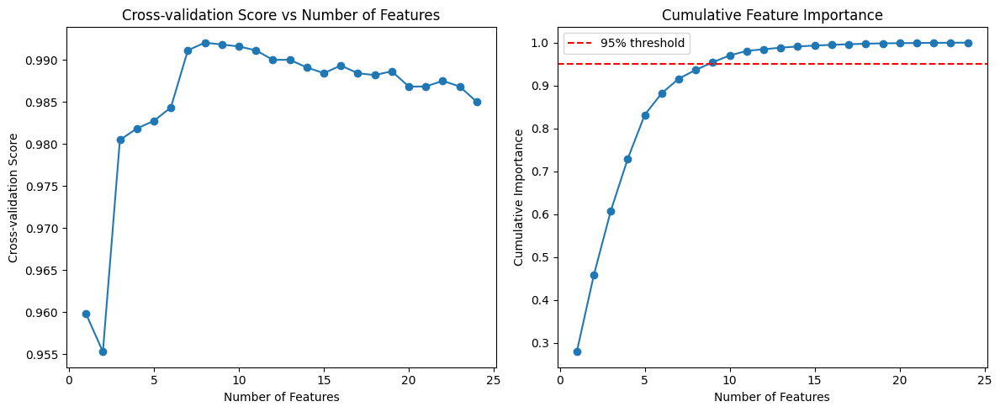

Optimal k based on CV score: 8
Optimal k based on 95% importance: 9
Maximum CV score: 0.992

Feature Importance Ranking:
                                              Feature       Score
1                                            smt_rank  162.666316
4                                user_weight_category  104.131997
2                                         smt_avg_spd   87.694102
21                                       attempt_year   71.036565
6                                         act_avg_spd   59.759770
13                smt_name_Headquarters Business Park   29.457332
0                                      user_age_group   19.711867
3                                  smt_finish_seconds   11.978274
8                                        act_total_km   10.423123
18         smt_name_PRINCE SULTAN - ASSALAM TO FATIMA    9.198917
7                                         act_max_spd    6.209231
17                       smt_name_Oghor 2 SailsIsland    2.288354
14                   

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.ensemble import RandomForestClassifier
import matplotlib.pyplot as plt
import seaborn as sns


# Cari k optimal
def find_optimal_k(X_train_scaled, y_train, max_features=None):
    if max_features is None:
        max_features = X_train_scaled.shape[1]

    k_range = range(1, max_features + 1)
    scores = []
    cv_scores = []

    for k in k_range:
        # Feature selection
        selector = SelectKBest(score_func=f_classif, k=k)
        X_selected = selector.fit_transform(X_train_scaled, y_train)

        # Evaluasi dengan cross validation
        clf = RandomForestClassifier(random_state=42, n_jobs=-1)
        cv_score = cross_val_score(clf, X_selected, y_train, cv=5).mean()
        cv_scores.append(cv_score)

        scores.append(selector.scores_)

    # Plot hasil
    plt.figure(figsize=(12, 5))

    # Plot 1: CV Scores
    plt.subplot(1, 2, 1)
    plt.plot(k_range, cv_scores, marker='o')
    plt.xlabel('Number of Features')
    plt.ylabel('Cross-validation Score')
    plt.title('Cross-validation Score vs Number of Features')

    # Plot 2: Cumulative Feature Importance
    plt.subplot(1, 2, 2)
    cumulative_importance = np.cumsum(np.sort(scores[0])[::-1]) / np.sum(scores[0])
    plt.plot(k_range, cumulative_importance, marker='o')
    plt.axhline(y=0.95, color='r', linestyle='--', label='95% threshold')
    plt.xlabel('Number of Features')
    plt.ylabel('Cumulative Importance')
    plt.title('Cumulative Feature Importance')
    plt.legend()

    plt.tight_layout()
    plt.show()

    # Menemukan k yang paling optimal
    k_optimal_cv = k_range[np.argmax(cv_scores)]
    k_optimal_95 = np.where(cumulative_importance >= 0.95)[0][0] + 1

    print(f"Optimal k based on CV score: {k_optimal_cv}")
    print(f"Optimal k based on 95% importance: {k_optimal_95}")
    print(f"Maximum CV score: {max(cv_scores):.3f}")

    # Feature importance ranking
    selector = SelectKBest(score_func=f_classif, k='all')
    selector.fit(X_train_scaled, y_train)
    feature_scores = pd.DataFrame({
        'Feature': X_train.columns,
        'Score': selector.scores_
    }).sort_values('Score', ascending=False)

    print("\nFeature Importance Ranking:")
    print(feature_scores)

    return k_optimal_cv, feature_scores

k_optimal, feature_scores = find_optimal_k(X_train_scaled, y_train)


##### *Handle Imbalanced Data*

In [ ]:
# Periksa imbalanced data
class_counts = df_rf['gender'].value_counts()
imbalance_ratio = class_counts.min() / class_counts.max()

print(f"Rasio kelas minoritas terhadap mayoritas: {imbalance_ratio:.2f}")

Rasio kelas minoritas terhadap mayoritas: 0.04


Karena rasio sangat jauh dari 1, maka datanya bisa dianggap *imbalanced*.

In [ ]:
# Setelah mendapatkan k optimal, buat pipeline
from sklearn.pipeline import Pipeline
from imblearn.pipeline import Pipeline as ImblearnPipeline
from imblearn.over_sampling import ADASYN

# Pipeline dengan k optimal
pipeline = ImblearnPipeline([
    ('scaler', StandardScaler()),
    ('selector', SelectKBest(f_classif, k=k_optimal)),
    ('sampler', ADASYN(random_state=42)),
    ('classifier', RandomForestClassifier(random_state=42, n_jobs=-1))
])

pipeline

Pipeline(steps=[('scaler', StandardScaler()), ('selector', SelectKBest(k=8)),
                ('sampler', ADASYN(random_state=42)),
                ('classifier',
                 RandomForestClassifier(n_jobs=-1, random_state=42))])

##### *Fit Pipeline*

In [ ]:
# Fit dan evaluasi pipeline
pipeline.fit(X_train, y_train)
y_pred = pipeline.predict(X_val)

#### Hasil Evaluasi Model

In [ ]:
from sklearn.metrics import precision_score,recall_score, classification_report,accuracy_score, f1_score


def evaluate_classifier_performance(prediction, y_test):
    # Informasi evaluasi secara compact
    print("Hasil Evaluasi berdasarkan classification report \n\n%s\n" % (classification_report(y_test, prediction,zero_division=0)))
    print()
    print("Confusion Matrix")
    print()
    y_actual = pd.Series(np.array(y_test), name = "actual")
    y_pred = pd.Series(np.array(prediction), name = "prediction")
    df_confusion = pd.crosstab(y_actual, y_pred)
    display(df_confusion)
    print()
    print()

    print("Berikut adalah informasi lengkap tentang performa model : ")
    print('Accuracy Average:', accuracy_score(y_test, prediction))
    print('F1 Macro Average:', f1_score(y_test, prediction, average='macro'))
    print('F1 Micro Average:', f1_score(y_test, prediction, average='micro'))
    print('Precision Macro Average:', precision_score(y_test, prediction, average='macro',zero_division=0))
    print('Precision Micro Average:', precision_score(y_test, prediction, average='micro',zero_division=0))
    print('Recall Macro Average:', recall_score(y_test, prediction, average='macro',zero_division=0))
    print('Recall Micro Average:', recall_score(y_test, prediction, average='micro',zero_division=0))
    print()

evaluate_classifier_performance(y_pred,y_val)

Hasil Evaluasi berdasarkan classification report 

              precision    recall  f1-score   support

           1       0.95      0.92      0.93        76
           2       1.00      1.00      1.00      1812

    accuracy                           0.99      1888
   macro avg       0.97      0.96      0.97      1888
weighted avg       0.99      0.99      0.99      1888



Confusion Matrix



prediction,1,2
actual,,
1,70,6
2,4,1808




Berikut adalah informasi lengkap tentang performa model : 
Accuracy Average: 0.9947033898305084
F1 Macro Average: 0.9652877367163082
F1 Micro Average: 0.9947033898305084
Precision Macro Average: 0.9713191692243511
Precision Micro Average: 0.9947033898305084
Recall Macro Average: 0.9594225630300918
Recall Micro Average: 0.9947033898305084



#### Test Data

##### *Load and Process data*

In [ ]:
test_data = pd.read_csv("https://drive.google.com/uc?id=1qPBRTfLz4wPgirhCcROaicQk0SDfeH9C")

id_test = test_data['id'].copy()
test_data.drop(["id", "user_id"], axis=1, inplace=True)

##### Periksa *Missing Values*

In [ ]:
# Cek missing values awal
print("Missing values before:")
print(test_data.isnull().sum())

Missing values before:
user_age_group           0
attempt_date             0
smt_rank                 0
smt_avg_spd              0
smt_finish_seconds       0
smt_name                 0
user_weight_category    36
act_title                0
act_avg_spd              0
act_max_spd              0
act_total_km             0
act_moving_seconds       0
act_total_seconds        0
has_hr_data              0
dtype: int64


In [ ]:
mode_value = test_data['user_weight_category'].mode()[0]
test_data['user_weight_category'] = test_data['user_weight_category'].fillna(mode_value)

##### *Data Encoding*

In [ ]:
# 1. Mapping User Age Group
age_mapping = {
    '19 and under': 0,
    '20 to 24': 1,
    '25 to 34': 2,
    '35 to 44': 3,
    '45 to 54': 4,
    '55 to 64': 5,
    '65 to 69': 6,
    '70 to 74': 7,
    '75+': 8
}
test_data['user_age_group'] = test_data['user_age_group'].map(age_mapping)
test_data.head()

,user_age_group,attempt_date,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data
0,2,2018-03-12,112,28.9,487,Starbucks to Majid,75 to 84 kg,Mittagsradfahrt,25.5,45.7,50.39,7128,7128,0
1,3,2016-11-02,190,20.3,840,King Street side,85 to 95 kg,Evening Ride,19.9,37.8,35.00,6338,6338,0
2,3,2018-06-22,55,23.1,1180,Al Fardoos to shellfish round about,65 to 74 kg,Morning Ride,24.0,81.0,108.01,16202,16202,0
3,3,2015-01-31,222,21.9,643,Starbucks to Majid,75 to 84 kg,Morning Ride,20.7,36.0,21.79,3787,3787,0
4,3,2014-10-21,278,22.7,266,Headquarters Business Park,65 to 74 kg,تمرين مع أحمد سعيد,23.8,43.9,31.05,4699,4699,0


In [ ]:
# 2. Mapping User Weight Category
weight_mapping = {
    '54 kg and under': 0,
    '55 to 64 kg': 1,
    '65 to 74 kg': 2,
    '75 to 84 kg': 3,
    '85 to 95 kg': 4,
    '95 kg to 104 kg': 5,
    '105 kg to 114 kg': 6,
    '115 kg and over': 7
}
test_data['user_weight_category'] = test_data['user_weight_category'].map(weight_mapping)
test_data

In [ ]:
# 3. Mapping Segment Name
test_data = pd.get_dummies(test_data, columns=['smt_name'], drop_first=False)
test_data

,user_age_group,attempt_date,smt_rank,smt_avg_spd,smt_finish_seconds,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,...,has_hr_data,smt_name_Al Fardoos to shellfish round about,smt_name_Headquarters Business Park,smt_name_King Street side,smt_name_North Corniche,smt_name_Obhur North Short,smt_name_Oghor 2 SailsIsland,smt_name_PRINCE SULTAN - ASSALAM TO FATIMA,smt_name_S.Ubhur Alkurnaysh South Bound with detour,smt_name_Starbucks to Majid
0,2,2018-03-12,112,28.9,487,3,Mittagsradfahrt,25.5,45.7,50.39,...,0,False,False,False,False,False,False,False,False,True
1,3,2016-11-02,190,20.3,840,4,Evening Ride,19.9,37.8,35.00,...,0,False,False,True,False,False,False,False,False,False
2,3,2018-06-22,55,23.1,1180,2,Morning Ride,24.0,81.0,108.01,...,0,True,False,False,False,False,False,False,False,False
3,3,2015-01-31,222,21.9,643,3,Morning Ride,20.7,36.0,21.79,...,0,False,False,False,False,False,False,False,False,True
4,3,2014-10-21,278,22.7,266,2,تمرين مع أحمد سعيد,23.8,43.9,31.05,...,0,False,True,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
781,4,2018-09-06,85,19.3,728,2,Morning Ride,24.4,35.6,74.71,...,0,False,False,False,False,False,False,False,False,True
782,2,2020-03-14,43,41.2,174,0,Afternoon Ride,25.5,51.1,63.13,...,0,False,False,False,False,False,True,False,False,False
783,3,2014-02-24,297,23.8,730,6,Evening Ride,19.3,32.4,21.32,...,0,False,False,False,True,False,False,False,False,False
784,0,2015-12-30,56,8.1,883,2,Evening Ride,18.1,41.8,17.95,...,0,False,False,False,False,False,True,False,False,False


In [ ]:
# 4. Frequency Encoding untuk act_title
freq_map = test_data['act_title'].value_counts(normalize=True)
test_data['act_title'] = test_data['act_title'].map(freq_map)
test_data

,user_age_group,attempt_date,smt_rank,smt_avg_spd,smt_finish_seconds,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,...,has_hr_data,smt_name_Al Fardoos to shellfish round about,smt_name_Headquarters Business Park,smt_name_King Street side,smt_name_North Corniche,smt_name_Obhur North Short,smt_name_Oghor 2 SailsIsland,smt_name_PRINCE SULTAN - ASSALAM TO FATIMA,smt_name_S.Ubhur Alkurnaysh South Bound with detour,smt_name_Starbucks to Majid
0,2,2018-03-12,112,28.9,487,3,0.002545,25.5,45.7,50.39,...,0,False,False,False,False,False,False,False,False,True
1,3,2016-11-02,190,20.3,840,4,0.291349,19.9,37.8,35.00,...,0,False,False,True,False,False,False,False,False,False
2,3,2018-06-22,55,23.1,1180,2,0.256997,24.0,81.0,108.01,...,0,True,False,False,False,False,False,False,False,False
3,3,2015-01-31,222,21.9,643,3,0.256997,20.7,36.0,21.79,...,0,False,False,False,False,False,False,False,False,True
4,3,2014-10-21,278,22.7,266,2,0.001272,23.8,43.9,31.05,...,0,False,True,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
781,4,2018-09-06,85,19.3,728,2,0.256997,24.4,35.6,74.71,...,0,False,False,False,False,False,False,False,False,True
782,2,2020-03-14,43,41.2,174,0,0.081425,25.5,51.1,63.13,...,0,False,False,False,False,False,True,False,False,False
783,3,2014-02-24,297,23.8,730,6,0.291349,19.3,32.4,21.32,...,0,False,False,False,True,False,False,False,False,False
784,0,2015-12-30,56,8.1,883,2,0.291349,18.1,41.8,17.95,...,0,False,False,False,False,False,True,False,False,False


In [ ]:
# 5. Encoding attempt_date
test_data['attempt_date'] = pd.to_datetime(test_data['attempt_date'])
test_data['attempt_year'] = test_data['attempt_date'].dt.year
test_data['attempt_month'] = test_data['attempt_date'].dt.month
test_data['attempt_day'] = test_data['attempt_date'].dt.day
test_data = test_data.drop('attempt_date', axis=1)
test_data

,user_age_group,smt_rank,smt_avg_spd,smt_finish_seconds,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,...,smt_name_King Street side,smt_name_North Corniche,smt_name_Obhur North Short,smt_name_Oghor 2 SailsIsland,smt_name_PRINCE SULTAN - ASSALAM TO FATIMA,smt_name_S.Ubhur Alkurnaysh South Bound with detour,smt_name_Starbucks to Majid,attempt_year,attempt_month,attempt_day
0,2,112,28.9,487,3,0.002545,25.5,45.7,50.39,7128,...,False,False,False,False,False,False,True,2018,3,12
1,3,190,20.3,840,4,0.291349,19.9,37.8,35.00,6338,...,True,False,False,False,False,False,False,2016,11,2
2,3,55,23.1,1180,2,0.256997,24.0,81.0,108.01,16202,...,False,False,False,False,False,False,False,2018,6,22
3,3,222,21.9,643,3,0.256997,20.7,36.0,21.79,3787,...,False,False,False,False,False,False,True,2015,1,31
4,3,278,22.7,266,2,0.001272,23.8,43.9,31.05,4699,...,False,False,False,False,False,False,False,2014,10,21
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
781,4,85,19.3,728,2,0.256997,24.4,35.6,74.71,11025,...,False,False,False,False,False,False,True,2018,9,6
782,2,43,41.2,174,0,0.081425,25.5,51.1,63.13,8925,...,False,False,False,True,False,False,False,2020,3,14
783,3,297,23.8,730,6,0.291349,19.3,32.4,21.32,3971,...,False,True,False,False,False,False,False,2014,2,24
784,0,56,8.1,883,2,0.291349,18.1,41.8,17.95,3562,...,False,False,False,True,False,False,False,2015,12,30


In [ ]:
test_data.isnull().sum()

,0
user_age_group,0
smt_rank,0
smt_avg_spd,0
smt_finish_seconds,0
user_weight_category,0
act_title,0
act_avg_spd,0
act_max_spd,0
act_total_km,0
act_moving_seconds,0


##### *Predict data test*

In [ ]:
test_predictions = pipeline.predict(test_data)

# Membuat file untuk submission kaggle
submission = pd.DataFrame({
'id': id_test,  # Gunakan id yang sudah disimpan
'gender': test_predictions
})

submission.to_csv('CSL_Submission_RF.csv', index=False)
submission

,id,gender
0,265,2
1,2473,2
2,1835,2
3,865,2
4,7404,2
...,...,...
781,1055,2
782,3322,2
783,5652,2
784,3131,2


## Random Forest with Hypertuning

#### Proses modelling

In [ ]:
df_rf_tuning = df_rf.copy()
df_rf_tuning

,user_age_group,gender,smt_rank,smt_avg_spd,smt_finish_seconds,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,...,smt_name_King Street side,smt_name_North Corniche,smt_name_Obhur North Short,smt_name_Oghor 2 SailsIsland,smt_name_PRINCE SULTAN - ASSALAM TO FATIMA,smt_name_S.Ubhur Alkurnaysh South Bound with detour,smt_name_Starbucks to Majid,attempt_year,attempt_month,attempt_day
0,2,2,712,15.8,382,0,0.132072,13.6,34.9,19.24,...,False,False,False,False,False,False,False,2017,12,22
1,2,2,189,33.2,216,6,0.132072,21.5,43.2,23.47,...,False,False,False,True,False,False,False,2015,4,13
2,2,2,264,23.7,593,3,0.281310,26.7,92.9,38.23,...,False,False,False,False,False,False,True,2018,2,7
3,2,2,50,33.4,817,3,0.092498,31.4,54.4,65.77,...,False,False,False,False,False,False,False,2018,8,24
4,2,1,19,21.3,284,0,0.000477,19.9,43.2,96.53,...,False,False,False,False,False,False,False,2020,3,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6287,2,2,431,22.3,778,0,0.132072,17.9,96.5,41.93,...,False,True,False,False,False,False,False,2018,7,16
6288,3,2,34,38.9,446,4,0.000318,34.5,52.2,48.13,...,False,True,False,False,False,False,False,2018,11,21
6289,3,2,218,22.1,637,3,0.132072,17.6,40.7,50.64,...,False,False,False,False,False,False,True,2013,8,11
6290,3,2,477,12.4,485,4,0.233153,14.5,34.9,40.93,...,False,False,False,False,False,False,False,2015,4,24


In [ ]:
X = df_rf_tuning.drop(columns=['gender'])
y = df_rf_tuning['gender']

In [ ]:
X_tuning_train, X_tuning_val, y_tuning_train, y_tuning_val = train_test_split(X, y, test_size=0.3, stratify=y, random_state=42)

##### *Scaling* Data

In [ ]:
scaler =  StandardScaler()
X_tuning_train_scaled = scaler.fit_transform(X_tuning_train)
X_tuning_val_scaled = scaler.transform(X_tuning_val)

##### Melihat *Feature Importance*

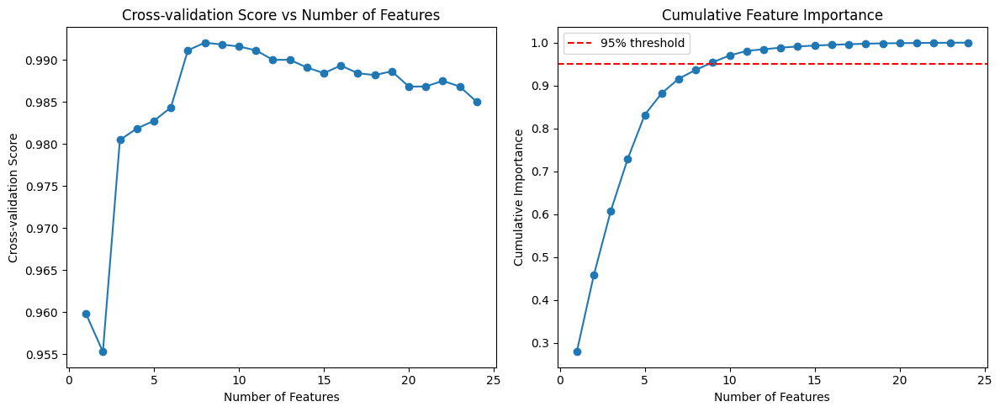

Optimal k based on CV score: 8
Optimal k based on 95% importance: 9
Maximum CV score: 0.992

Feature Importance Ranking:
                                              Feature       Score
1                                            smt_rank  162.666316
4                                user_weight_category  104.131997
2                                         smt_avg_spd   87.694102
21                                       attempt_year   71.036565
6                                         act_avg_spd   59.759770
13                smt_name_Headquarters Business Park   29.457332
0                                      user_age_group   19.711867
3                                  smt_finish_seconds   11.978274
8                                        act_total_km   10.423123
18         smt_name_PRINCE SULTAN - ASSALAM TO FATIMA    9.198917
7                                         act_max_spd    6.209231
17                       smt_name_Oghor 2 SailsIsland    2.288354
14                   

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.ensemble import RandomForestClassifier
import matplotlib.pyplot as plt
import seaborn as sns


# Cari k optimal
def find_optimal_k(X_train_scaled, y_train, max_features=None):
    if max_features is None:
        max_features = X_train_scaled.shape[1]

    k_range = range(1, max_features + 1)
    scores = []
    cv_scores = []

    for k in k_range:
        # Feature selection
        selector = SelectKBest(score_func=f_classif, k=k)
        X_selected = selector.fit_transform(X_train_scaled, y_train)

        # Evaluasi dengan cross validation
        clf = RandomForestClassifier(random_state=42, n_jobs=-1)
        cv_score = cross_val_score(clf, X_selected, y_train, cv=5).mean()
        cv_scores.append(cv_score)

        scores.append(selector.scores_)

    # Plot hasil
    plt.figure(figsize=(12, 5))

    # Plot 1: CV Scores
    plt.subplot(1, 2, 1)
    plt.plot(k_range, cv_scores, marker='o')
    plt.xlabel('Number of Features')
    plt.ylabel('Cross-validation Score')
    plt.title('Cross-validation Score vs Number of Features')

    # Plot 2: Cumulative Feature Importance
    plt.subplot(1, 2, 2)
    cumulative_importance = np.cumsum(np.sort(scores[0])[::-1]) / np.sum(scores[0])
    plt.plot(k_range, cumulative_importance, marker='o')
    plt.axhline(y=0.95, color='r', linestyle='--', label='95% threshold')
    plt.xlabel('Number of Features')
    plt.ylabel('Cumulative Importance')
    plt.title('Cumulative Feature Importance')
    plt.legend()

    plt.tight_layout()
    plt.show()

    # Menemukan k yang paling optimal
    k_optimal_cv = k_range[np.argmax(cv_scores)]
    k_optimal_95 = np.where(cumulative_importance >= 0.95)[0][0] + 1

    print(f"Optimal k based on CV score: {k_optimal_cv}")
    print(f"Optimal k based on 95% importance: {k_optimal_95}")
    print(f"Maximum CV score: {max(cv_scores):.3f}")

    # Feature importance ranking
    selector = SelectKBest(score_func=f_classif, k='all')
    selector.fit(X_train_scaled, y_train)
    feature_scores = pd.DataFrame({
        'Feature': X_train.columns,
        'Score': selector.scores_
    }).sort_values('Score', ascending=False)

    print("\nFeature Importance Ranking:")
    print(feature_scores)

    return k_optimal_cv, feature_scores

k_optimal, feature_scores = find_optimal_k(X_tuning_train_scaled, y_tuning_train)

##### *Handle Imbalanced Data*

In [ ]:
# Periksa imbalanced data
class_counts = df_rf_tuning['gender'].value_counts()
imbalance_ratio = class_counts.min() / class_counts.max()

print(f"Rasio kelas minoritas terhadap mayoritas: {imbalance_ratio:.2f}")

Rasio kelas minoritas terhadap mayoritas: 0.04


##### Proses *Hyperparameter tuning*

In [ ]:
from sklearn.model_selection import GridSearchCV

param_grid = {
    'classifier__max_depth': range(5, 45, 2),
    'classifier__min_samples_split': [3, 7, 12],
    'classifier__min_samples_leaf': [1, 2],
    'classifier__criterion': ['gini', 'entropy'],
    'classifier__class_weight': ['balanced']
}

In [ ]:
from imblearn.over_sampling import ADASYN

pipeline = ImblearnPipeline([
    ('scaler', StandardScaler()),
    ('selector', SelectKBest(f_classif, k=k_optimal)),
    ('sampler', ADASYN(random_state=42)),
    ('classifier', RandomForestClassifier(random_state=42, n_jobs=-1))
])
pipeline

Pipeline(steps=[('scaler', StandardScaler()), ('selector', SelectKBest(k=8)),
                ('sampler', ADASYN(random_state=42)),
                ('classifier',
                 RandomForestClassifier(n_jobs=-1, random_state=42))])

In [ ]:
from sklearn.model_selection import GridSearchCV

grid_search = GridSearchCV(pipeline, param_grid, cv=5, scoring='f1', n_jobs=-1, verbose=1)
grid_search.fit(X_tuning_train, y_tuning_train)

Fitting 5 folds for each of 240 candidates, totalling 1200 fits


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('selector', SelectKBest(k=8)),
                                       ('sampler', ADASYN(random_state=42)),
                                       ('classifier',
                                        RandomForestClassifier(n_jobs=-1,
                                                               random_state=42))]),
             n_jobs=-1,
             param_grid={'classifier__class_weight': ['balanced'],
                         'classifier__criterion': ['gini', 'entropy'],
                         'classifier__max_depth': range(5, 45, 2),
                         'classifier__min_samples_leaf': [1, 2],
                         'classifier__min_samples_split': [3, 7, 12]},
             scoring='f1', verbose=1)

In [ ]:
print("Best parameters found: ", grid_search.best_params_)
print("Best cross-validation score: {:.2f}".format(grid_search.best_score_))

Best parameters found:  {'classifier__class_weight': 'balanced', 'classifier__criterion': 'gini', 'classifier__max_depth': 15, 'classifier__min_samples_leaf': 1, 'classifier__min_samples_split': 3}
Best cross-validation score: 0.90


In [ ]:
best_pipeline = grid_search.best_estimator_
y_tuning_pred = best_pipeline.predict(X_tuning_val)

#### Evaluasi *Performance*

In [ ]:
evaluate_classifier_performance(y_tuning_pred,y_tuning_val)

Hasil Evaluasi berdasarkan classification report 

              precision    recall  f1-score   support

           1       0.92      0.92      0.92        76
           2       1.00      1.00      1.00      1812

    accuracy                           0.99      1888
   macro avg       0.96      0.96      0.96      1888
weighted avg       0.99      0.99      0.99      1888



Confusion Matrix



prediction,1,2
actual,,
1,70,6
2,6,1806




Berikut adalah informasi lengkap tentang performa model : 
Accuracy Average: 0.9936440677966102
F1 Macro Average: 0.9588706866504009
F1 Micro Average: 0.9936440677966102
Precision Macro Average: 0.9588706866504009
Precision Micro Average: 0.9936440677966102
Recall Macro Average: 0.9588706866504009
Recall Micro Average: 0.9936440677966102



#### Test Data

##### *Load and Process data*

In [ ]:
test_data_hyp = pd.read_csv("https://drive.google.com/uc?id=1qPBRTfLz4wPgirhCcROaicQk0SDfeH9C")

id_test = test_data_hyp['id'].copy()
test_data_hyp.drop(["id", "user_id"], axis=1, inplace=True)

##### Periksa *Missing Values*

In [ ]:
# Cek missing values awal
print("Missing values before:")
print(test_data_hyp.isnull().sum())

Missing values before:
user_age_group           0
attempt_date             0
smt_rank                 0
smt_avg_spd              0
smt_finish_seconds       0
smt_name                 0
user_weight_category    36
act_title                0
act_avg_spd              0
act_max_spd              0
act_total_km             0
act_moving_seconds       0
act_total_seconds        0
has_hr_data              0
dtype: int64


In [ ]:
mode_value = test_data_hyp['user_weight_category'].mode()[0]
test_data_hyp['user_weight_category'] = test_data_hyp['user_weight_category'].fillna(mode_value)

##### *Data Encoding*

In [ ]:
# Mapping User Age Group
age_mapping = {
    '19 and under': 0,
    '20 to 24': 1,
    '25 to 34': 2,
    '35 to 44': 3,
    '45 to 54': 4,
    '55 to 64': 5,
    '65 to 69': 6,
    '70 to 74': 7,
    '75+': 8
}
test_data_hyp['user_age_group'] = test_data_hyp['user_age_group'].map(age_mapping)
test_data_hyp

,user_age_group,attempt_date,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data
0,2,2018-03-12,112,28.9,487,Starbucks to Majid,75 to 84 kg,Mittagsradfahrt,25.5,45.7,50.39,7128,7128,0
1,3,2016-11-02,190,20.3,840,King Street side,85 to 95 kg,Evening Ride,19.9,37.8,35.00,6338,6338,0
2,3,2018-06-22,55,23.1,1180,Al Fardoos to shellfish round about,65 to 74 kg,Morning Ride,24.0,81.0,108.01,16202,16202,0
3,3,2015-01-31,222,21.9,643,Starbucks to Majid,75 to 84 kg,Morning Ride,20.7,36.0,21.79,3787,3787,0
4,3,2014-10-21,278,22.7,266,Headquarters Business Park,65 to 74 kg,تمرين مع أحمد سعيد,23.8,43.9,31.05,4699,4699,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
781,4,2018-09-06,85,19.3,728,Starbucks to Majid,65 to 74 kg,Morning Ride,24.4,35.6,74.71,11025,11025,0
782,2,2020-03-14,43,41.2,174,Oghor 2 SailsIsland,54 kg and under,Afternoon Ride,25.5,51.1,63.13,8925,8925,0
783,3,2014-02-24,297,23.8,730,North Corniche,105 kg to 114 kg,Evening Ride,19.3,32.4,21.32,3971,3971,0
784,0,2015-12-30,56,8.1,883,Oghor 2 SailsIsland,65 to 74 kg,Evening Ride,18.1,41.8,17.95,3562,3562,0


In [ ]:
# Mapping User Weight Category
weight_mapping = {
    '54 kg and under': 0,
    '55 to 64 kg': 1,
    '65 to 74 kg': 2,
    '75 to 84 kg': 3,
    '85 to 95 kg': 4,
    '95 kg to 104 kg': 5,
    '105 kg to 114 kg': 6,
    '115 kg and over': 7
}
test_data_hyp['user_weight_category'] = test_data_hyp['user_weight_category'].map(weight_mapping)
test_data_hyp

,user_age_group,attempt_date,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data
0,2,2018-03-12,112,28.9,487,Starbucks to Majid,3,Mittagsradfahrt,25.5,45.7,50.39,7128,7128,0
1,3,2016-11-02,190,20.3,840,King Street side,4,Evening Ride,19.9,37.8,35.00,6338,6338,0
2,3,2018-06-22,55,23.1,1180,Al Fardoos to shellfish round about,2,Morning Ride,24.0,81.0,108.01,16202,16202,0
3,3,2015-01-31,222,21.9,643,Starbucks to Majid,3,Morning Ride,20.7,36.0,21.79,3787,3787,0
4,3,2014-10-21,278,22.7,266,Headquarters Business Park,2,تمرين مع أحمد سعيد,23.8,43.9,31.05,4699,4699,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
781,4,2018-09-06,85,19.3,728,Starbucks to Majid,2,Morning Ride,24.4,35.6,74.71,11025,11025,0
782,2,2020-03-14,43,41.2,174,Oghor 2 SailsIsland,0,Afternoon Ride,25.5,51.1,63.13,8925,8925,0
783,3,2014-02-24,297,23.8,730,North Corniche,6,Evening Ride,19.3,32.4,21.32,3971,3971,0
784,0,2015-12-30,56,8.1,883,Oghor 2 SailsIsland,2,Evening Ride,18.1,41.8,17.95,3562,3562,0


In [ ]:
# Mapping Segment Name
test_data_hyp = pd.get_dummies(test_data_hyp, columns=['smt_name'], drop_first=False)
test_data_hyp

,user_age_group,attempt_date,smt_rank,smt_avg_spd,smt_finish_seconds,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,...,has_hr_data,smt_name_Al Fardoos to shellfish round about,smt_name_Headquarters Business Park,smt_name_King Street side,smt_name_North Corniche,smt_name_Obhur North Short,smt_name_Oghor 2 SailsIsland,smt_name_PRINCE SULTAN - ASSALAM TO FATIMA,smt_name_S.Ubhur Alkurnaysh South Bound with detour,smt_name_Starbucks to Majid
0,2,2018-03-12,112,28.9,487,3,Mittagsradfahrt,25.5,45.7,50.39,...,0,False,False,False,False,False,False,False,False,True
1,3,2016-11-02,190,20.3,840,4,Evening Ride,19.9,37.8,35.00,...,0,False,False,True,False,False,False,False,False,False
2,3,2018-06-22,55,23.1,1180,2,Morning Ride,24.0,81.0,108.01,...,0,True,False,False,False,False,False,False,False,False
3,3,2015-01-31,222,21.9,643,3,Morning Ride,20.7,36.0,21.79,...,0,False,False,False,False,False,False,False,False,True
4,3,2014-10-21,278,22.7,266,2,تمرين مع أحمد سعيد,23.8,43.9,31.05,...,0,False,True,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
781,4,2018-09-06,85,19.3,728,2,Morning Ride,24.4,35.6,74.71,...,0,False,False,False,False,False,False,False,False,True
782,2,2020-03-14,43,41.2,174,0,Afternoon Ride,25.5,51.1,63.13,...,0,False,False,False,False,False,True,False,False,False
783,3,2014-02-24,297,23.8,730,6,Evening Ride,19.3,32.4,21.32,...,0,False,False,False,True,False,False,False,False,False
784,0,2015-12-30,56,8.1,883,2,Evening Ride,18.1,41.8,17.95,...,0,False,False,False,False,False,True,False,False,False


In [ ]:
# Frequency Encoding untuk act_title
freq_map = test_data_hyp['act_title'].value_counts(normalize=True)
test_data_hyp['act_title'] = test_data_hyp['act_title'].map(freq_map)
test_data_hyp

,user_age_group,smt_rank,smt_avg_spd,smt_finish_seconds,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,...,smt_name_King Street side,smt_name_North Corniche,smt_name_Obhur North Short,smt_name_Oghor 2 SailsIsland,smt_name_PRINCE SULTAN - ASSALAM TO FATIMA,smt_name_S.Ubhur Alkurnaysh South Bound with detour,smt_name_Starbucks to Majid,attempt_year,attempt_month,attempt_day
0,2,112,28.9,487,3,0.002545,25.5,45.7,50.39,7128,...,False,False,False,False,False,False,True,2018,3,12
1,3,190,20.3,840,4,0.291349,19.9,37.8,35.00,6338,...,True,False,False,False,False,False,False,2016,11,2
2,3,55,23.1,1180,2,0.256997,24.0,81.0,108.01,16202,...,False,False,False,False,False,False,False,2018,6,22
3,3,222,21.9,643,3,0.256997,20.7,36.0,21.79,3787,...,False,False,False,False,False,False,True,2015,1,31
4,3,278,22.7,266,2,0.001272,23.8,43.9,31.05,4699,...,False,False,False,False,False,False,False,2014,10,21
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
781,4,85,19.3,728,2,0.256997,24.4,35.6,74.71,11025,...,False,False,False,False,False,False,True,2018,9,6
782,2,43,41.2,174,0,0.081425,25.5,51.1,63.13,8925,...,False,False,False,True,False,False,False,2020,3,14
783,3,297,23.8,730,6,0.291349,19.3,32.4,21.32,3971,...,False,True,False,False,False,False,False,2014,2,24
784,0,56,8.1,883,2,0.291349,18.1,41.8,17.95,3562,...,False,False,False,True,False,False,False,2015,12,30


In [ ]:
# Encoding attempt_date
test_data_hyp['attempt_date'] = pd.to_datetime(test_data_hyp['attempt_date'])
test_data_hyp['attempt_year'] = test_data_hyp['attempt_date'].dt.year
test_data_hyp['attempt_month'] = test_data_hyp['attempt_date'].dt.month
test_data_hyp['attempt_day'] = test_data_hyp['attempt_date'].dt.day
test_data_hyp = test_data_hyp.drop('attempt_date', axis=1)
test_data_hyp

,user_age_group,smt_rank,smt_avg_spd,smt_finish_seconds,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,...,smt_name_King Street side,smt_name_North Corniche,smt_name_Obhur North Short,smt_name_Oghor 2 SailsIsland,smt_name_PRINCE SULTAN - ASSALAM TO FATIMA,smt_name_S.Ubhur Alkurnaysh South Bound with detour,smt_name_Starbucks to Majid,attempt_year,attempt_month,attempt_day
0,2,112,28.9,487,3,Mittagsradfahrt,25.5,45.7,50.39,7128,...,False,False,False,False,False,False,True,2018,3,12
1,3,190,20.3,840,4,Evening Ride,19.9,37.8,35.00,6338,...,True,False,False,False,False,False,False,2016,11,2
2,3,55,23.1,1180,2,Morning Ride,24.0,81.0,108.01,16202,...,False,False,False,False,False,False,False,2018,6,22
3,3,222,21.9,643,3,Morning Ride,20.7,36.0,21.79,3787,...,False,False,False,False,False,False,True,2015,1,31
4,3,278,22.7,266,2,تمرين مع أحمد سعيد,23.8,43.9,31.05,4699,...,False,False,False,False,False,False,False,2014,10,21
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
781,4,85,19.3,728,2,Morning Ride,24.4,35.6,74.71,11025,...,False,False,False,False,False,False,True,2018,9,6
782,2,43,41.2,174,0,Afternoon Ride,25.5,51.1,63.13,8925,...,False,False,False,True,False,False,False,2020,3,14
783,3,297,23.8,730,6,Evening Ride,19.3,32.4,21.32,3971,...,False,True,False,False,False,False,False,2014,2,24
784,0,56,8.1,883,2,Evening Ride,18.1,41.8,17.95,3562,...,False,False,False,True,False,False,False,2015,12,30


In [ ]:
test_data_hyp.isnull().sum()

,0
user_age_group,0
smt_rank,0
smt_avg_spd,0
smt_finish_seconds,0
user_weight_category,0
act_title,0
act_avg_spd,0
act_max_spd,0
act_total_km,0
act_moving_seconds,0


##### *Predict data test*

In [ ]:
test_hyp_predictions = best_pipeline.predict(test_data_hyp)

# Membuat file untuk submission kaggle
submission = pd.DataFrame({
'id': id_test,  # Gunakan id yang sudah disimpan
'gender': test_hyp_predictions
})

submission.to_csv('CSL_Submission_RF-Tuning.csv', index=False)
submission

,id,gender
0,265,2
1,2473,2
2,1835,2
3,865,2
4,7404,2
...,...,...
781,1055,2
782,3322,2
783,5652,2
784,3131,2


## Softmax Regression

### Proses Modeling


In [ ]:
df_sr = df_dt.copy()
df_sr

,user_age_group,gender,smt_rank,smt_avg_spd,smt_finish_seconds,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,...,smt_name_King Street side,smt_name_North Corniche,smt_name_Obhur North Short,smt_name_Oghor 2 SailsIsland,smt_name_PRINCE SULTAN - ASSALAM TO FATIMA,smt_name_S.Ubhur Alkurnaysh South Bound with detour,smt_name_Starbucks to Majid,attempt_year,attempt_month,attempt_day
0,2,2,712,15.8,382,0,0.132072,13.6,34.9,19.24,...,False,False,False,False,False,False,False,2017,12,22
1,2,2,189,33.2,216,6,0.132072,21.5,43.2,23.47,...,False,False,False,True,False,False,False,2015,4,13
2,2,2,264,23.7,593,3,0.281310,26.7,92.9,38.23,...,False,False,False,False,False,False,True,2018,2,7
3,2,2,50,33.4,817,3,0.092498,31.4,54.4,65.77,...,False,False,False,False,False,False,False,2018,8,24
4,2,1,19,21.3,284,0,0.000477,19.9,43.2,96.53,...,False,False,False,False,False,False,False,2020,3,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6287,2,2,431,22.3,778,0,0.132072,17.9,96.5,41.93,...,False,True,False,False,False,False,False,2018,7,16
6288,3,2,34,38.9,446,4,0.000318,34.5,52.2,48.13,...,False,True,False,False,False,False,False,2018,11,21
6289,3,2,218,22.1,637,3,0.132072,17.6,40.7,50.64,...,False,False,False,False,False,False,True,2013,8,11
6290,3,2,477,12.4,485,4,0.233153,14.5,34.9,40.93,...,False,False,False,False,False,False,False,2015,4,24


In [ ]:
X_sr = df_sr.drop(columns=['gender'])
y_sr = df_sr['gender']

In [ ]:
from sklearn.model_selection import train_test_split

X_sr_train, X_sr_test, y_sr_train, y_sr_test = train_test_split(X_sr, y_sr, test_size=0.3, stratify=y_nn, random_state=42)

In [ ]:
from sklearn.preprocessing import StandardScaler, RobustScaler

scaler = RobustScaler()
scaler.fit(df_sr[X_sr.columns])

X_sr_train = scaler.transform(X_sr_train)
X_sr_test = scaler.transform(X_sr_test)

**RobustScaler** digunakan karena kemampuannya untuk menangani outliers dalam data. Sehingga scaler ini cocok karena `act_total_seconds` dan `act_moving_seconds` memiliki outlier yang cukup besar Scaler ini menggunakan median dan interquartile range (IQR) untuk menskalakan data, sehingga lebih tahan terhadap pengaruh nilai ekstrem dibandingkan scaler lain seperti **StandardScaler** atau **MinMaxScaler** yang menggunakan mean dan standar deviasi. RobustScaler sangat cocok untuk data dengan distribusi yang skewed atau mengandung outliers, karena outliers tidak akan mendistorsi skala fitur secara signifikan.

In [ ]:
from sklearn.linear_model import LogisticRegression

softmax = LogisticRegression(multi_class='multinomial')

In [ ]:
softmax.fit(X_sr_train, y_sr_train)
y_sr_pred = softmax.predict(X_sr_test)

### Evaluasi Model

In [ ]:
evaluate_classifier_performance(y_sr_pred,y_sr_test)

Hasil Evaluasi berdasarkan classification report 

              precision    recall  f1-score   support

           1       0.93      0.75      0.83        76
           2       0.99      1.00      0.99      1812

    accuracy                           0.99      1888
   macro avg       0.96      0.87      0.91      1888
weighted avg       0.99      0.99      0.99      1888



Confusion Matrix



prediction,1,2
actual,,
1,57,19
2,4,1808




Berikut adalah informasi lengkap tentang performa model : 
Accuracy Average: 0.9878177966101694
F1 Macro Average: 0.9128981853119992
F1 Micro Average: 0.9878177966101694
Precision Macro Average: 0.9620133336922483
Precision Micro Average: 0.9878177966101694
Recall Macro Average: 0.8738962472406181
Recall Micro Average: 0.9878177966101694



### Test Data

#### Load and Process Data

In [ ]:
test_data_sr = pd.read_csv("https://drive.google.com/uc?id=1qPBRTfLz4wPgirhCcROaicQk0SDfeH9C")

id_test = test_data_sr['id'].copy()
test_data_sr.drop(["id", "user_id"], axis=1, inplace=True)

#### Check Missing Values

In [ ]:
# Cek missing values awal
print("Missing values before:")
print(test_data_sr.isnull().sum())

Missing values before:
user_age_group           0
attempt_date             0
smt_rank                 0
smt_avg_spd              0
smt_finish_seconds       0
smt_name                 0
user_weight_category    36
act_title                0
act_avg_spd              0
act_max_spd              0
act_total_km             0
act_moving_seconds       0
act_total_seconds        0
has_hr_data              0
dtype: int64


#### Encode Data

In [ ]:
mode_value = test_data_sr['user_weight_category'].mode()[0]
test_data_sr['user_weight_category'] = test_data_sr['user_weight_category'].fillna(mode_value)

In [ ]:
# 1. Mapping User Age Group
age_mapping = {
    '19 and under': 0,
    '20 to 24': 1,
    '25 to 34': 2,
    '35 to 44': 3,
    '45 to 54': 4,
    '55 to 64': 5,
    '65 to 69': 6,
    '70 to 74': 7,
    '75+': 8
}
test_data_sr['user_age_group'] = test_data_sr['user_age_group'].map(age_mapping)
test_data_sr.head()

,user_age_group,attempt_date,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data
0,2,2018-03-12,112,28.9,487,Starbucks to Majid,75 to 84 kg,Mittagsradfahrt,25.5,45.7,50.39,7128,7128,0
1,3,2016-11-02,190,20.3,840,King Street side,85 to 95 kg,Evening Ride,19.9,37.8,35.00,6338,6338,0
2,3,2018-06-22,55,23.1,1180,Al Fardoos to shellfish round about,65 to 74 kg,Morning Ride,24.0,81.0,108.01,16202,16202,0
3,3,2015-01-31,222,21.9,643,Starbucks to Majid,75 to 84 kg,Morning Ride,20.7,36.0,21.79,3787,3787,0
4,3,2014-10-21,278,22.7,266,Headquarters Business Park,65 to 74 kg,تمرين مع أحمد سعيد,23.8,43.9,31.05,4699,4699,0


In [ ]:
# 2. Mapping User Weight Category
weight_mapping = {
    '54 kg and under': 0,
    '55 to 64 kg': 1,
    '65 to 74 kg': 2,
    '75 to 84 kg': 3,
    '85 to 95 kg': 4,
    '95 kg to 104 kg': 5,
    '105 kg to 114 kg': 6,
    '115 kg and over': 7
}
test_data_sr['user_weight_category'] = test_data_sr['user_weight_category'].map(weight_mapping)

In [ ]:
test_data_sr = pd.get_dummies(test_data_sr, columns=['smt_name'])
test_data_sr.head()

,user_age_group,attempt_date,smt_rank,smt_avg_spd,smt_finish_seconds,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,...,has_hr_data,smt_name_Al Fardoos to shellfish round about,smt_name_Headquarters Business Park,smt_name_King Street side,smt_name_North Corniche,smt_name_Obhur North Short,smt_name_Oghor 2 SailsIsland,smt_name_PRINCE SULTAN - ASSALAM TO FATIMA,smt_name_S.Ubhur Alkurnaysh South Bound with detour,smt_name_Starbucks to Majid
0,2,2018-03-12,112,28.9,487,3,Mittagsradfahrt,25.5,45.7,50.39,...,0,False,False,False,False,False,False,False,False,True
1,3,2016-11-02,190,20.3,840,4,Evening Ride,19.9,37.8,35.00,...,0,False,False,True,False,False,False,False,False,False
2,3,2018-06-22,55,23.1,1180,2,Morning Ride,24.0,81.0,108.01,...,0,True,False,False,False,False,False,False,False,False
3,3,2015-01-31,222,21.9,643,3,Morning Ride,20.7,36.0,21.79,...,0,False,False,False,False,False,False,False,False,True
4,3,2014-10-21,278,22.7,266,2,تمرين مع أحمد سعيد,23.8,43.9,31.05,...,0,False,True,False,False,False,False,False,False,False


In [ ]:
# 4. Frequency Encoding untuk act_title
freq_map = test_data_sr['act_title'].value_counts(normalize=True)
test_data_sr['act_title'] = test_data_sr['act_title'].map(freq_map)

In [ ]:
# 5. Encoding attempt_date
test_data_sr['attempt_date'] = pd.to_datetime(test_data_sr['attempt_date'])
test_data_sr['attempt_year'] = test_data_sr['attempt_date'].dt.year
test_data_sr['attempt_month'] = test_data_sr['attempt_date'].dt.month
test_data_sr['attempt_day'] = test_data_sr['attempt_date'].dt.day
test_data_sr = test_data_sr.drop('attempt_date', axis=1)

In [ ]:
test_data_sr.isnull().sum()

,0
user_age_group,0
smt_rank,0
smt_avg_spd,0
smt_finish_seconds,0
user_weight_category,0
act_title,0
act_avg_spd,0
act_max_spd,0
act_total_km,0
act_moving_seconds,0


#### Predict Data Test

In [ ]:
test_sr_predictions = softmax.predict(test_data_sr)

submission = pd.DataFrame({
'id': id_test,
'gender': test_sr_predictions
})

submission.to_csv('submission_sr.csv', index=False)
submission.head()

,id,gender
0,265,2
1,2473,2
2,1835,2
3,865,2
4,7404,2


## Neural Network

### Proses Modeling

In [ ]:
df_nn = df_sr.copy()
df_nn

,user_age_group,gender,smt_rank,smt_avg_spd,smt_finish_seconds,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,...,smt_name_King Street side,smt_name_North Corniche,smt_name_Obhur North Short,smt_name_Oghor 2 SailsIsland,smt_name_PRINCE SULTAN - ASSALAM TO FATIMA,smt_name_S.Ubhur Alkurnaysh South Bound with detour,smt_name_Starbucks to Majid,attempt_year,attempt_month,attempt_day
0,2,2,712,15.8,382,0,0.132072,13.6,34.9,19.24,...,False,False,False,False,False,False,False,2017,12,22
1,2,2,189,33.2,216,6,0.132072,21.5,43.2,23.47,...,False,False,False,True,False,False,False,2015,4,13
2,2,2,264,23.7,593,3,0.281310,26.7,92.9,38.23,...,False,False,False,False,False,False,True,2018,2,7
3,2,2,50,33.4,817,3,0.092498,31.4,54.4,65.77,...,False,False,False,False,False,False,False,2018,8,24
4,2,1,19,21.3,284,0,0.000477,19.9,43.2,96.53,...,False,False,False,False,False,False,False,2020,3,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6287,2,2,431,22.3,778,0,0.132072,17.9,96.5,41.93,...,False,True,False,False,False,False,False,2018,7,16
6288,3,2,34,38.9,446,4,0.000318,34.5,52.2,48.13,...,False,True,False,False,False,False,False,2018,11,21
6289,3,2,218,22.1,637,3,0.132072,17.6,40.7,50.64,...,False,False,False,False,False,False,True,2013,8,11
6290,3,2,477,12.4,485,4,0.233153,14.5,34.9,40.93,...,False,False,False,False,False,False,False,2015,4,24


In [ ]:
X_nn = df_nn.drop(columns=['gender'])
y_nn = df_nn['gender']

In [ ]:
X_nn_train, X_nn_test, y_nn_train, y_nn_test = train_test_split(X_nn, y_nn, test_size=0.3, stratify=y_nn, random_state=42)

In [ ]:
print(df_nn['gender'].value_counts())

gender
2    6039
1     253
Name: count, dtype: int64


Hasil evaluasi menunjukkan bahwa kolom gender memiliki distribusi yang sangat tidak seimbang:

Distribusi Gender:

2 (male): 6039 data
1 (female): 253 data
Ini berarti 97.3% dari data adalah male, dan hanya 2.7% adalah female. Sehingga perlu dilakukan **Oversampling**

In [ ]:
from imblearn.over_sampling import SMOTE

# Oversampling menggunakan SMOTE
smote = SMOTE(random_state=42)
X_nn_train_resampled, y_nn_train_resampled = smote.fit_resample(X_nn_train, y_nn_train)

In [ ]:
print(y_nn_train_resampled.value_counts())

gender
2    4227
1    4227
Name: count, dtype: int64


Hasil ini menunjukkan bahwa setelah menerapkan SMOTE (Synthetic Minority Oversampling Technique), data yang awalnya imbalanced kini telah seimbang:

Distribusi Data Setelah Oversampling:

2 (male): 4227 sampel.
1 (female): 4227 sampel.

In [ ]:
scaler = StandardScaler()
X_nn_train_resampled = scaler.fit_transform(X_nn_train_resampled)
X_nn_test = scaler.transform(X_nn_test)

In [ ]:
from sklearn.neural_network import MLPClassifier

# Definisi MLPClassifier class
mlp_classifier = MLPClassifier(
    alpha=1e-5,
    hidden_layer_sizes=(30,10),
    solver='adam',
    random_state=42,
    activation='relu'
)

In [ ]:
# Latih model
mlp_classifier.fit(X_nn_train_resampled, y_nn_train_resampled)

# Evaluasi model
y_nn_pred = mlp_classifier.predict(X_nn_test)


### Evaluasi Model

In [ ]:
evaluate_classifier_performance(y_nn_pred,y_nn_test)

Hasil Evaluasi berdasarkan classification report 

              precision    recall  f1-score   support

           1       0.95      0.91      0.93        76
           2       1.00      1.00      1.00      1812

    accuracy                           0.99      1888
   macro avg       0.97      0.95      0.96      1888
weighted avg       0.99      0.99      0.99      1888



Confusion Matrix



prediction,1,2
actual,,
1,69,7
2,4,1808




Berikut adalah informasi lengkap tentang performa model : 
Accuracy Average: 0.9941737288135594
F1 Macro Average: 0.9615708435799364
F1 Micro Average: 0.9941737288135594
Precision Macro Average: 0.97067436507038
Precision Micro Average: 0.9941737288135594
Recall Macro Average: 0.9528436156616708
Recall Micro Average: 0.9941737288135594



### Test Data

#### Load and Process Data

In [ ]:
test_data_nn = pd.read_csv("https://drive.google.com/uc?id=1qPBRTfLz4wPgirhCcROaicQk0SDfeH9C")

id_test = test_data_nn['id'].copy()
test_data_nn.drop(["id", "user_id"], axis=1, inplace=True)

#### Check Missing Values

In [ ]:
# Cek missing values awal
print("Missing values before:")
print(test_data_nn.isnull().sum())

Missing values before:
user_age_group           0
attempt_date             0
smt_rank                 0
smt_avg_spd              0
smt_finish_seconds       0
smt_name                 0
user_weight_category    36
act_title                0
act_avg_spd              0
act_max_spd              0
act_total_km             0
act_moving_seconds       0
act_total_seconds        0
has_hr_data              0
dtype: int64


#### Encode Data

In [ ]:
mode_value = test_data_nn['user_weight_category'].mode()[0]
test_data_nn['user_weight_category'] = test_data_nn['user_weight_category'].fillna(mode_value)

In [ ]:
# 1. Mapping User Age Group
age_mapping = {
    '19 and under': 0,
    '20 to 24': 1,
    '25 to 34': 2,
    '35 to 44': 3,
    '45 to 54': 4,
    '55 to 64': 5,
    '65 to 69': 6,
    '70 to 74': 7,
    '75+': 8
}
test_data_nn['user_age_group'] = test_data_nn['user_age_group'].map(age_mapping)
test_data_nn.head()

,user_age_group,attempt_date,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data
0,2,2018-03-12,112,28.9,487,Starbucks to Majid,75 to 84 kg,Mittagsradfahrt,25.5,45.7,50.39,7128,7128,0
1,3,2016-11-02,190,20.3,840,King Street side,85 to 95 kg,Evening Ride,19.9,37.8,35.00,6338,6338,0
2,3,2018-06-22,55,23.1,1180,Al Fardoos to shellfish round about,65 to 74 kg,Morning Ride,24.0,81.0,108.01,16202,16202,0
3,3,2015-01-31,222,21.9,643,Starbucks to Majid,75 to 84 kg,Morning Ride,20.7,36.0,21.79,3787,3787,0
4,3,2014-10-21,278,22.7,266,Headquarters Business Park,65 to 74 kg,تمرين مع أحمد سعيد,23.8,43.9,31.05,4699,4699,0


In [ ]:
# 2. Mapping User Weight Category
weight_mapping = {
    '54 kg and under': 0,
    '55 to 64 kg': 1,
    '65 to 74 kg': 2,
    '75 to 84 kg': 3,
    '85 to 95 kg': 4,
    '95 kg to 104 kg': 5,
    '105 kg to 114 kg': 6,
    '115 kg and over': 7
}
test_data_nn['user_weight_category'] = test_data_nn['user_weight_category'].map(weight_mapping)

In [ ]:
test_data_nn = pd.get_dummies(test_data_nn, columns=['smt_name'])
test_data_nn.head()

,user_age_group,attempt_date,smt_rank,smt_avg_spd,smt_finish_seconds,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,...,has_hr_data,smt_name_Al Fardoos to shellfish round about,smt_name_Headquarters Business Park,smt_name_King Street side,smt_name_North Corniche,smt_name_Obhur North Short,smt_name_Oghor 2 SailsIsland,smt_name_PRINCE SULTAN - ASSALAM TO FATIMA,smt_name_S.Ubhur Alkurnaysh South Bound with detour,smt_name_Starbucks to Majid
0,2,2018-03-12,112,28.9,487,3,Mittagsradfahrt,25.5,45.7,50.39,...,0,False,False,False,False,False,False,False,False,True
1,3,2016-11-02,190,20.3,840,4,Evening Ride,19.9,37.8,35.00,...,0,False,False,True,False,False,False,False,False,False
2,3,2018-06-22,55,23.1,1180,2,Morning Ride,24.0,81.0,108.01,...,0,True,False,False,False,False,False,False,False,False
3,3,2015-01-31,222,21.9,643,3,Morning Ride,20.7,36.0,21.79,...,0,False,False,False,False,False,False,False,False,True
4,3,2014-10-21,278,22.7,266,2,تمرين مع أحمد سعيد,23.8,43.9,31.05,...,0,False,True,False,False,False,False,False,False,False


In [ ]:
# 4. Frequency Encoding untuk act_title
freq_map = test_data_nn['act_title'].value_counts(normalize=True)
test_data_nn['act_title'] = test_data_nn['act_title'].map(freq_map)

In [ ]:
# 5. Encoding attempt_date
test_data_nn['attempt_date'] = pd.to_datetime(test_data_nn['attempt_date'])
test_data_nn['attempt_year'] = test_data_nn['attempt_date'].dt.year
test_data_nn['attempt_month'] = test_data_nn['attempt_date'].dt.month
test_data_nn['attempt_day'] = test_data_nn['attempt_date'].dt.day
test_data_nn = test_data_nn.drop('attempt_date', axis=1)

In [ ]:
test_data_nn.isnull().sum()

,0
user_age_group,0
smt_rank,0
smt_avg_spd,0
smt_finish_seconds,0
user_weight_category,0
act_title,0
act_avg_spd,0
act_max_spd,0
act_total_km,0
act_moving_seconds,0


#### Predict Data Test

In [ ]:
test_nn_predictions = mlp_classifier.predict(test_data_nn)

# Membuat file untuk submission kaggle
submission = pd.DataFrame({
'id': id_test,  # Gunakan id yang sudah disimpan
'gender': test_predictions
})

submission.to_csv('CSL_Submission_NN.csv', index=False)
submission

,id,gender
0,265,2
1,2473,2
2,1835,2
3,865,2
4,7404,2
...,...,...
781,1055,2
782,3322,2
783,5652,2
784,3131,2


## Decision Tree with Hypertuning

#### Proses modelling

In [ ]:
df_dt_hyp = df_dt.copy()
df_dt_hyp.head()

,user_age_group,gender,smt_rank,smt_avg_spd,smt_finish_seconds,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,...,smt_name_King Street side,smt_name_North Corniche,smt_name_Obhur North Short,smt_name_Oghor 2 SailsIsland,smt_name_PRINCE SULTAN - ASSALAM TO FATIMA,smt_name_S.Ubhur Alkurnaysh South Bound with detour,smt_name_Starbucks to Majid,attempt_year,attempt_month,attempt_day
0,2,2,712,15.8,382,0,0.132072,13.6,34.9,19.24,...,False,False,False,False,False,False,False,2017,12,22
1,2,2,189,33.2,216,6,0.132072,21.5,43.2,23.47,...,False,False,False,True,False,False,False,2015,4,13
2,2,2,264,23.7,593,3,0.281310,26.7,92.9,38.23,...,False,False,False,False,False,False,True,2018,2,7
3,2,2,50,33.4,817,3,0.092498,31.4,54.4,65.77,...,False,False,False,False,False,False,False,2018,8,24
4,2,1,19,21.3,284,0,0.000477,19.9,43.2,96.53,...,False,False,False,False,False,False,False,2020,3,6


In [ ]:
X = df_dt_hyp.drop(columns=['gender'])
y = df_dt_hyp['gender']

In [ ]:
X_hyp_train, X_hyp_val, y_hyp_train, y_hyp_val = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

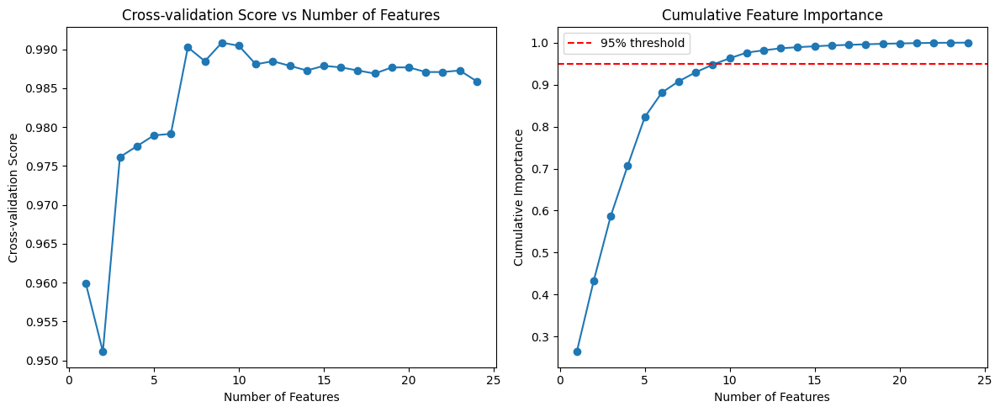

Optimal k based on CV score: 9
Optimal k based on 95% importance: 10
Maximum CV score: 0.991

Feature Importance Ranking:
                                              Feature       Score
1                                            smt_rank  185.329845
4                                user_weight_category  119.352278
2                                         smt_avg_spd  108.012704
21                                       attempt_year   84.415463
6                                         act_avg_spd   80.752706
13                smt_name_Headquarters Business Park   41.025530
0                                      user_age_group   19.024687
8                                        act_total_km   15.071157
3                                  smt_finish_seconds   12.794276
18         smt_name_PRINCE SULTAN - ASSALAM TO FATIMA   10.630587
7                                         act_max_spd    9.482825
17                       smt_name_Oghor 2 SailsIsland    3.769421
14                  

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.tree import DecisionTreeClassifier
import matplotlib.pyplot as plt
import seaborn as sns


# 3. Mencari k optimal
def find_optimal_k(X_train_scaled, y_train, max_features=None):
    if max_features is None:
        max_features = X_train_scaled.shape[1]

    k_range = range(1, max_features + 1)
    scores = []
    cv_scores = []

    for k in k_range:
        # Seleksi fitur
        selector = SelectKBest(score_func=f_classif, k=k)
        X_selected = selector.fit_transform(X_train_scaled, y_train)

        # Evaluasi dengan cross validation
        clf = DecisionTreeClassifier(random_state=42)
        cv_score = cross_val_score(clf, X_selected, y_train, cv=5).mean()
        cv_scores.append(cv_score)

        # Simpan f-scores
        scores.append(selector.scores_)

    # Plot hasil
    plt.figure(figsize=(12, 5))

    # Plot 1: CV Scores
    plt.subplot(1, 2, 1)
    plt.plot(k_range, cv_scores, marker='o')
    plt.xlabel('Number of Features')
    plt.ylabel('Cross-validation Score')
    plt.title('Cross-validation Score vs Number of Features')

    # Plot 2: Cumulative Feature Importance
    plt.subplot(1, 2, 2)
    cumulative_importance = np.cumsum(np.sort(scores[0])[::-1]) / np.sum(scores[0])
    plt.plot(k_range, cumulative_importance, marker='o')
    plt.axhline(y=0.95, color='r', linestyle='--', label='95% threshold')
    plt.xlabel('Number of Features')
    plt.ylabel('Cumulative Importance')
    plt.title('Cumulative Feature Importance')
    plt.legend()

    plt.tight_layout()
    plt.show()

    # Temukan k optimal
    k_optimal_cv = k_range[np.argmax(cv_scores)]
    k_optimal_95 = np.where(cumulative_importance >= 0.95)[0][0] + 1

    print(f"Optimal k based on CV score: {k_optimal_cv}")
    print(f"Optimal k based on 95% importance: {k_optimal_95}")
    print(f"Maximum CV score: {max(cv_scores):.3f}")

    # Feature importance ranking
    selector = SelectKBest(score_func=f_classif, k='all')
    selector.fit(X_train_scaled, y_train)
    feature_scores = pd.DataFrame({
        'Feature': X_train.columns,
        'Score': selector.scores_
    }).sort_values('Score', ascending=False)

    print("\nFeature Importance Ranking:")
    print(feature_scores)

    return k_optimal_cv, feature_scores

# Jalankan fungsi
k_optimal, feature_scores = find_optimal_k(X_hyp_train, y_hyp_train)


In [ ]:
k_optimal

9

Pada tahap ini, **Feature selection** dilakukan untuk meningkatkan performa model prediktif dengan memilih fitur-fitur yang paling relevan, menghilangkan fitur yang redundan atau tidak signifikan, dan menyederhanakan struktur model. Terlihat bahwa, model mencapai performa optimal dengan menggunakan 9 fitur berdasarkan CV score. Seperti yang terlihat pada grafik cross-validation score, Penambahan fitur setelah jumlah tersebut tidak memberikan kontribusi berarti bahkan cenderung menurunkan performa. Selain itu, proses feature selection membantu mengurangi waktu komputasi, menjadikan pelatihan dan prediksi lebih efisien tanpa mengorbankan akurasi model. Grafik cumulative feature importance juga menunjukkan bahwa fitur tambahan setelah kontribusi kumulatif 95% cenderung hanya menambah noise daripada informasi yang relevan, sehingga risiko overfitting dapat diminimalkan.

Selain meningkatkan efisiensi, feature selection memberikan interpretabilitas yang lebih baik terhadap model. Fitur dengan skor tinggi, seperti 'smt_rank,' 'user_weight_category,' dan 'smt_avg_spd,' menunjukkan pengaruh signifikan terhadap hasil prediksi. Sementara itu, fitur dengan skor rendah dapat diabaikan tanpa mengurangi performa model. Pendekatan ini tidak hanya menyederhanakan model, tetapi juga memastikan bahwa fitur-fitur yang digunakan benar-benar relevan. Dengan demikian, penggunaan feature selection memungkinkan pembuatan model yang lebih sederhana, efisien, dan robust, sekaligus memastikan akurasi dan daya prediksi yang tinggi.

Referensi:   
* https://www.heavy.ai/technical-glossary/feature-selection#:~:text=Feature%20selection%20is%20the%20process,of%20datasets%20continue%20to%20grow.

In [ ]:
# mengecheck imbalanced data
class_counts = df_dt_hyp['gender'].value_counts()
imbalance_ratio = class_counts.min() / class_counts.max()

print(f"Rasio kelas minoritas terhadap mayoritas: {imbalance_ratio:.2f}")

Rasio kelas minoritas terhadap mayoritas: 0.04


Dataset ini memiliki proporsi 0.04, yang menunjukkan bahwa kelas minoritas hanya sekitar 4% dari total dataset. Berdasarkan aturan umum, dataset dianggap imbalanced jika kelas minoritas kurang dari 10-20%, dan proporsi sebesar 0.04 berada jauh di bawah ambang batas tersebut. Ketidakseimbangan ini menyebabkan sebagian besar data didominasi oleh kelas mayoritas, sehingga dapat menyebabkan prioritas lebih tinggi pada kelas mayoritas dan mengabaikan kelas minoritas dalam proses klasifikasi.

Referensi:
* https://datascience.stackexchange.com/questions/122571/determining-whether-a-dataset-is-imbalanced-or-not

##### proses Hyperparameter tuning

In [ ]:
from sklearn.model_selection import GridSearchCV

param_grid = {
    'classifier__max_depth': range(5, 45, 2),
    'classifier__min_samples_split': [2, 5, 10],
    'classifier__min_samples_leaf': [1, 2],
    'classifier__criterion': ['gini', 'entropy'],
    'classifier__class_weight': ['balanced']
}

In [ ]:
from imblearn.over_sampling import ADASYN
pipeline = ImblearnPipeline([
    ('scaler', StandardScaler()),
    ('selector', SelectKBest(f_classif, k=k_optimal)),
    ('sampler', ADASYN(random_state=42)),
    ('classifier', DecisionTreeClassifier(random_state=42))
])
pipeline

Pipeline(steps=[('scaler', StandardScaler()), ('selector', SelectKBest(k=9)),
                ('sampler', ADASYN(random_state=42)),
                ('classifier', DecisionTreeClassifier(random_state=42))])

In [ ]:
from sklearn.model_selection import GridSearchCV

grid_search = GridSearchCV(pipeline, param_grid, cv=5, scoring='f1', n_jobs=-1, verbose=1)
grid_search.fit(X_hyp_train, y_hyp_train)

Fitting 5 folds for each of 240 candidates, totalling 1200 fits


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('selector', SelectKBest(k=9)),
                                       ('sampler', ADASYN(random_state=42)),
                                       ('classifier',
                                        DecisionTreeClassifier(random_state=42))]),
             n_jobs=-1,
             param_grid={'classifier__class_weight': ['balanced'],
                         'classifier__criterion': ['gini', 'entropy'],
                         'classifier__max_depth': range(5, 45, 2),
                         'classifier__min_samples_leaf': [1, 2],
                         'classifier__min_samples_split': [2, 5, 10]},
             scoring='f1', verbose=1)

In [ ]:
print("Best parameters found: ", grid_search.best_params_)
print("Best cross-validation score: {:.2f}".format(grid_search.best_score_))

Best parameters found:  {'classifier__class_weight': 'balanced', 'classifier__criterion': 'gini', 'classifier__max_depth': 13, 'classifier__min_samples_leaf': 1, 'classifier__min_samples_split': 2}
Best cross-validation score: 0.89


Pada pipeline ini, untuk meningkatkan performa Decision Tree Classifier, dilakukan hyperparameter tuning menggunakan GridSearchCV dengan mengatur beberapa hyperparameter, seperti max_depth, min_samples_split, min_samples_leaf, criterion, dan class_weight. Tujuan dari tuning ini adalah untuk mencari kombinasi hyperparameter yang optimal, yang dapat meningkatkan kemampuan model dalam mengatasi ketidakseimbangan kelas dan menghasilkan model yang lebih baik dalam memprediksi data.

Namun, meskipun dilakukan tuning, hasil yang diperoleh menunjukkan bahwa best cross-validation score yang didapat setelah tuning hanya sebesar 0.89. Hasil ini ternyata lebih buruk dibandingkan dengan model Decision Tree yang tidak menggunakan hyperparameter tuning, yang memiliki performa f1-score lebih baik. Hal ini mungkin disebabkan oleh banyaknya variasi dalam data yang menyebabkan tuning menjadi kurang efektif, atau kombinasi hyperparameter yang dihasilkan kurang sesuai untuk karakteristik dataset yang digunakan.

Referensi:  
* https://www.geeksforgeeks.org/how-to-tune-a-decision-tree-in-hyperparameter-tuning/


In [ ]:
best_pipeline = grid_search.best_estimator_
y_hyp_pred = best_pipeline.predict(X_hyp_val)

##### Evaluasi performance

In [ ]:
evaluate_classifier_performance(y_hyp_pred,y_hyp_val)

Hasil Evaluasi berdasarkan classification report 

              precision    recall  f1-score   support

           1       0.91      0.94      0.92        51
           2       1.00      1.00      1.00      1208

    accuracy                           0.99      1259
   macro avg       0.95      0.97      0.96      1259
weighted avg       0.99      0.99      0.99      1259



Confusion Matrix



prediction,1,2
actual,,
1,48,3
2,5,1203




Berikut adalah informasi lengkap tentang performa model : 
Accuracy Average: 0.9936457505957109
F1 Macro Average: 0.9598814607099612
F1 Micro Average: 0.9936457505957109
Precision Macro Average: 0.9515864075847179
Precision Micro Average: 0.9936457505957109
Recall Macro Average: 0.9685186988702765
Recall Micro Average: 0.9936457505957109



#### Test data

##### Load and Process data

In [ ]:
test_data_hyp = pd.read_csv("https://drive.google.com/uc?id=1qPBRTfLz4wPgirhCcROaicQk0SDfeH9C")

id_test = test_data_hyp['id'].copy()
test_data_hyp.drop(["id", "user_id"], axis=1, inplace=True)

##### Check missing Values

In [ ]:
# Cek missing values awal
print("Missing values before:")
print(test_data_hyp.isnull().sum())

Missing values before:
user_age_group           0
attempt_date             0
smt_rank                 0
smt_avg_spd              0
smt_finish_seconds       0
smt_name                 0
user_weight_category    36
act_title                0
act_avg_spd              0
act_max_spd              0
act_total_km             0
act_moving_seconds       0
act_total_seconds        0
has_hr_data              0
dtype: int64


In [ ]:
mode_value = test_data_hyp['user_weight_category'].mode()[0]
test_data_hyp['user_weight_category'] = test_data_hyp['user_weight_category'].fillna(mode_value)

##### Encode data

In [ ]:
# 1. Mapping User Age Group
age_mapping = {
    '19 and under': 0,
    '20 to 24': 1,
    '25 to 34': 2,
    '35 to 44': 3,
    '45 to 54': 4,
    '55 to 64': 5,
    '65 to 69': 6,
    '70 to 74': 7,
    '75+': 8
}
test_data_hyp['user_age_group'] = test_data_hyp['user_age_group'].map(age_mapping)
test_data_hyp.head()

,user_age_group,attempt_date,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data
0,2,2018-03-12,112,28.9,487,Starbucks to Majid,75 to 84 kg,Mittagsradfahrt,25.5,45.7,50.39,7128,7128,0
1,3,2016-11-02,190,20.3,840,King Street side,85 to 95 kg,Evening Ride,19.9,37.8,35.00,6338,6338,0
2,3,2018-06-22,55,23.1,1180,Al Fardoos to shellfish round about,65 to 74 kg,Morning Ride,24.0,81.0,108.01,16202,16202,0
3,3,2015-01-31,222,21.9,643,Starbucks to Majid,75 to 84 kg,Morning Ride,20.7,36.0,21.79,3787,3787,0
4,3,2014-10-21,278,22.7,266,Headquarters Business Park,65 to 74 kg,تمرين مع أحمد سعيد,23.8,43.9,31.05,4699,4699,0


In [ ]:
# 2. Mapping User Weight Category
weight_mapping = {
    '54 kg and under': 0,
    '55 to 64 kg': 1,
    '65 to 74 kg': 2,
    '75 to 84 kg': 3,
    '85 to 95 kg': 4,
    '95 kg to 104 kg': 5,
    '105 kg to 114 kg': 6,
    '115 kg and over': 7
}
test_data_hyp['user_weight_category'] = test_data_hyp['user_weight_category'].map(weight_mapping)

In [ ]:
test_data_hyp = pd.get_dummies(test_data_hyp, columns=['smt_name'])
test_data_hyp.head()

,user_age_group,attempt_date,smt_rank,smt_avg_spd,smt_finish_seconds,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,...,has_hr_data,smt_name_Al Fardoos to shellfish round about,smt_name_Headquarters Business Park,smt_name_King Street side,smt_name_North Corniche,smt_name_Obhur North Short,smt_name_Oghor 2 SailsIsland,smt_name_PRINCE SULTAN - ASSALAM TO FATIMA,smt_name_S.Ubhur Alkurnaysh South Bound with detour,smt_name_Starbucks to Majid
0,2,2018-03-12,112,28.9,487,3,Mittagsradfahrt,25.5,45.7,50.39,...,0,False,False,False,False,False,False,False,False,True
1,3,2016-11-02,190,20.3,840,4,Evening Ride,19.9,37.8,35.00,...,0,False,False,True,False,False,False,False,False,False
2,3,2018-06-22,55,23.1,1180,2,Morning Ride,24.0,81.0,108.01,...,0,True,False,False,False,False,False,False,False,False
3,3,2015-01-31,222,21.9,643,3,Morning Ride,20.7,36.0,21.79,...,0,False,False,False,False,False,False,False,False,True
4,3,2014-10-21,278,22.7,266,2,تمرين مع أحمد سعيد,23.8,43.9,31.05,...,0,False,True,False,False,False,False,False,False,False


In [ ]:
# 4. Frequency Encoding untuk act_title
freq_map = test_data_hyp['act_title'].value_counts(normalize=True)
test_data_hyp['act_title'] = test_data_hyp['act_title'].map(freq_map)

In [ ]:
# 5. Encoding attempt_date
test_data_hyp['attempt_date'] = pd.to_datetime(test_data_hyp['attempt_date'])
test_data_hyp['attempt_year'] = test_data_hyp['attempt_date'].dt.year
test_data_hyp['attempt_month'] = test_data_hyp['attempt_date'].dt.month
test_data_hyp['attempt_day'] = test_data_hyp['attempt_date'].dt.day
test_data_hyp = test_data_hyp.drop('attempt_date', axis=1)

In [ ]:
test_data_hyp.isnull().sum()

,0
user_age_group,0
smt_rank,0
smt_avg_spd,0
smt_finish_seconds,0
user_weight_category,0
act_title,0
act_avg_spd,0
act_max_spd,0
act_total_km,0
act_moving_seconds,0


##### Predict data test

In [ ]:
test_hyp_predictions = best_pipeline.predict(test_data_hyp)

submission = pd.DataFrame({
'id': id_test,
'gender': test_hyp_predictions
})

submission.to_csv('submission_hyp.csv', index=False)
submission.head()

,id,gender
0,265,2
1,2473,2
2,1835,2
3,865,2
4,7404,2


## XGBoost Classifier with Hypertuning

#### Load Data

In [ ]:
df_xg = df_clean.copy()
df_xg.head()

,user_age_group,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data
0,25 to 34,2017-12-22,male,712,15.8,382,Headquarters Business Park,54 kg and under,Night Ride,13.6,34.9,19.24,5103,5103,0
1,25 to 34,2015-04-13,male,189,33.2,216,Oghor 2 SailsIsland,105 kg to 114 kg,Night Ride,21.5,43.2,23.47,3926,3926,0
2,25 to 34,2018-02-07,male,264,23.7,593,Starbucks to Majid,75 to 84 kg,Evening Ride,26.7,92.9,38.23,5152,5152,0
3,25 to 34,2018-08-24,male,50,33.4,817,Al Fardoos to shellfish round about,75 to 84 kg,Afternoon Ride,31.4,54.4,65.77,7548,7548,1
4,25 to 34,2020-03-06,female,19,21.3,284,Headquarters Business Park,54 kg and under,ثاني تمرين ١٠٠كم,19.9,43.2,96.53,17493,17493,0


#### Encode Data

Mencari fitur kategorikal per-kolom untuk di encode.

In [ ]:
# Mencari Tiap Nilai Unik Per Kolom
for column in df_xg.select_dtypes(include=['object', 'category']).columns:
    unique_vals = df_xg[column].unique()
    print(f"Unique values in '{column}': {unique_vals}\n")

Unique values in 'user_age_group': ['25 to 34' '19 and under' '35 to 44' '55 to 64' '45 to 54' '20 to 24'
 '65 to 69' '75+' '70 to 74']

Unique values in 'attempt_date': ['2017-12-22' '2015-04-13' '2018-02-07' ... '2016-04-21' '2019-08-31'
 '2019-04-25']

Unique values in 'gender': ['male' 'female']

Unique values in 'smt_name': ['Headquarters Business Park' 'Oghor 2 SailsIsland' 'Starbucks to Majid'
 'Al Fardoos to shellfish round about' 'North Corniche' 'King Street side'
 'S.Ubhur Alkurnaysh South Bound with detour' 'Obhur North Short'
 'PRINCE SULTAN - ASSALAM TO FATIMA']

Unique values in 'user_weight_category': ['54 kg and under' '105 kg to 114 kg' '75 to 84 kg' '65 to 74 kg'
 '115 kg and over' '85 to 95 kg' '95 kg to 104 kg' '55 to 64 kg']

Unique values in 'act_title': ['Night Ride' 'Evening Ride' 'Afternoon Ride' ...
 'Evening Ride مسائي للوحوش' 'Evening Ride With Jeddah Cyclists '
 'Nice Relaxed Ride next the Red Sea']



In [ ]:
# Mapping

# XGBoost hanya mengharapkan label target 0 dan 1 untuk klasifikasi biner
gender_mapper = {'female': 1, 'male': 0 }
df_xg['gender'] = df_xg['gender'].map(gender_mapper)

seg_mapper = {
    'Starbucks to Majid': 0,
    'King Street side': 1,
    'Al Fardoos to shellfish round about': 2,
    'Headquarters Business Park': 3,
    'PRINCE SULTAN - ASSALAM TO FATIMA': 4,
    'Oghor 2 SailsIsland': 5,
    'Obhur North Short': 6,
    'North Corniche': 7,
    'S.Ubhur Alkurnaysh South Bound with detour': 8
}
df_xg['smt_name'] = df_xg['smt_name'].map(seg_mapper)


# Frequency Encoding
frequency_encoding_act = df_xg['act_title'].value_counts(normalize=True)
df_xg['act_title'] = df_xg['act_title'].map(frequency_encoding_act)

# Time-Based Encoding
df_xg['attempt_date'] = pd.to_datetime(df_xg['attempt_date'])
df_xg['attempt_year'] = df_xg['attempt_date'].dt.year
df_xg['attempt_month'] = df_xg['attempt_date'].dt.month
df_xg['attempt_day'] = df_xg['attempt_date'].dt.day
df_xg = df_xg.drop('attempt_date', axis=1)

# Ordinal Encoding
weight_mapper = {
    '54 kg and under': 0,
    '55 to 64 kg': 1,
    '65 to 74 kg': 2,
    '75 to 84 kg': 3,
    '85 to 95 kg': 4,
    '95 kg to 104 kg': 5,
    '105 kg to 114 kg': 6,
    '115 kg and over': 7
}
df_xg['user_weight_category'] = df_xg['user_weight_category'].map(weight_mapper)

age_mapper = {
    '19 and under': 0,
    '20 to 24': 1,
    '25 to 34': 2,
    '35 to 44': 3,
    '45 to 54': 4,
    '55 to 64': 5,
    '65 to 69': 6,
    '70 to 74': 7,
    '75+': 8
}
df_xg['user_age_group'] = df_xg['user_age_group'].map(age_mapper)

# Menampilan Data
df_xg.head()

,user_age_group,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,attempt_year,attempt_month,attempt_day
0,2,0,712,15.8,382,3,0,0.132072,13.6,34.9,19.24,5103,5103,0,2017,12,22
1,2,0,189,33.2,216,5,6,0.132072,21.5,43.2,23.47,3926,3926,0,2015,4,13
2,2,0,264,23.7,593,0,3,0.281310,26.7,92.9,38.23,5152,5152,0,2018,2,7
3,2,0,50,33.4,817,2,3,0.092498,31.4,54.4,65.77,7548,7548,1,2018,8,24
4,2,1,19,21.3,284,3,0,0.000477,19.9,43.2,96.53,17493,17493,0,2020,3,6


**Penjelasan:**
- Mapping: data kategorikal yang disesuaikan semau kita tanpa ada urutan.
- Frequency encoding: karena ada banyak kategori yg tidak pakai urutan
- Ordinal encoding: kategorikal tapi berurutan
- Time-based encoding: mengubah informasi waktu (seperti tanggal, bulan, tahun, waktu dalam sehari, dll.) menjadi fitur numerik

Sebenarnya di sini, saya ingin menggunakan One-Hot Encoding untuk `smt_name`. Akan tetapi, encoding ini dapat meningkatkan dimensi data secara signifikan sehingga dapat menyebabkan seperti overfitting atau kompleksitas yang tinggi.

**Sumber:**
- https://letsdatascience.com/frequency-encoding/
- https://medium.com/@WojtekFulmyk/ordinal-encoding-a-brief-explanation-a29cf374dbc1

#### Proses Modelling

In [ ]:
# Memisahkan Fitur dan Target
X = df_xg.drop(columns=['gender']).to_numpy()
y = df_xg['gender'].to_numpy()

In [ ]:
from sklearn.model_selection import train_test_split
# Split Data Train dan Test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

Cek keseimbangan data train.

In [ ]:
# Periksa distribusi kelas
print("Distribusi Kelas dalam Data Train:")
print(pd.Series(y_train).value_counts())


Distribusi Kelas dalam Data Train:
0    4831
1     202
Name: count, dtype: int64


**Penjelasan:**
- Dapat dilihat data tidak seimbang. Maka dari itu, kita dapat menggunakan ADASYN.
- ADASYN (Adaptive Synthetic Sampling) yaitu teknik data balancing dengan oversampling untuk meningkatkan jumlah data pada kelas minoritas dengan menghasilkan sampel sintetik.

**Sumber:**
- https://imbalanced-learn.org/stable/references/generated/imblearn.over_sampling.ADASYN.html

In [ ]:
from imblearn.pipeline import Pipeline
from imblearn.over_sampling import ADASYN
from xgboost import XGBClassifier

# Membuat pipeline untuk XGBoost Classifier
pipeline = Pipeline([
    ('adasyn', ADASYN(random_state=42)),
    ('xgb', XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42))
])

**Penjelasan:**
- Saya menggunakan pipeline di sini untuk menggabungkan langkah-langkah preprocessing seperti oversampling dengan ADASYN dan pelatihan model XGBoost Classifier.
- Pipeline ini dapat memastikan kedua komponen yang ada di atas dapat diterapkan secara berurutan dan otomatis sehingga kualitas data juga semakin meningkat.

**Sumber:**
- https://aws.amazon.com/id/what-is/data-pipeline/

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import classification_report, f1_score
from sklearn.pipeline import Pipeline
from xgboost import XGBClassifier

param_grid = {
    'xgb__n_estimators': [100, 200, 300],
    'xgb__max_depth': [3, 5, 7],
    'xgb__learning_rate': [0.01, 0.1, 0.3],
    'xgb__subsample': [0.8, 1.0],
    'xgb__colsample_bytree': [0.8, 1.0],
}



Untuk tiap parameter saya menggunakan nilai yang sering atau biasa digunakan. Berikut adalah penjelasan singkatnya:
- xgb__n_estimators: jumlah pohon keputusan yang digunakan di model.
- xgb__max_depth: kedalaman maksimum setiap pohon yang mengontrol kompleksitas pohon.
- xgb__learning_rate: kecepatan pembelajaran untuk atur berapa besar pembaruan model tiap iterasi.
- xgb__subsample: proporsi data untuk bangun setiap pohon.
- xgb__colsample_bytree: proporsi fitur yang dipilih untuk tiap pohon.

**Sumber:**
- https://medium.com/@rithpansanga/optimizing-xgboost-a-guide-to-hyperparameter-tuning-77b6e48e289d

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, f1_score
from xgboost import XGBClassifier

# GridSearchCV untuk hyperparameter tuning
grid_search = GridSearchCV(
    estimator=pipeline,
    param_grid=param_grid,
    scoring='f1_macro',
    cv=3,
    verbose=1,
    n_jobs=-1
)


In [ ]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, classification_report

# Fit model ke data training yang sudah diresample
grid_search.fit(X_train, y_train)

# Menampilkan hasil hyperparameter terbaik
print("Best Parameters:", grid_search.best_params_)
print("Best F1 Macro Score on Training Set:", grid_search.best_score_)

# Evaluasi pada data testing
best_model = grid_search.best_estimator_.named_steps['xgb']
y_pred = best_model.predict(X_test)

print("Classification Report on Test Set:")
print(classification_report(y_test, y_pred))

# Menghitung F1 Macro, F1 Micro, Precision, Recall, dan Accuracy
accuracy = accuracy_score(y_test, y_pred)
f1_macro = f1_score(y_test, y_pred, average='macro')
f1_micro = f1_score(y_test, y_pred, average='micro')
precision_macro = precision_score(y_test, y_pred, average='macro')
precision_micro = precision_score(y_test, y_pred, average='micro')
recall_macro = recall_score(y_test, y_pred, average='macro')
recall_micro = recall_score(y_test, y_pred, average='micro')

# Menampilkan hasil evaluasi
print("Accuracy on Test Set:", accuracy)
print("F1 Macro Score on Test Set:", f1_macro)
print("F1 Micro Score on Test Set:", f1_micro)
print("Precision Macro Score on Test Set:", precision_macro)
print("Precision Micro Score on Test Set:", precision_micro)
print("Recall Macro Score on Test Set:", recall_macro)
print("Recall Micro Score on Test Set:", recall_micro)

Fitting 3 folds for each of 108 candidates, totalling 324 fits
Best Parameters: {'xgb__colsample_bytree': 0.8, 'xgb__learning_rate': 0.3, 'xgb__max_depth': 3, 'xgb__n_estimators': 300, 'xgb__subsample': 1.0}
Best F1 Macro Score on Training Set: 0.9799792406508644
Classification Report on Test Set:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1208
           1       0.93      0.98      0.95        51

    accuracy                           1.00      1259
   macro avg       0.96      0.99      0.98      1259
weighted avg       1.00      1.00      1.00      1259

Accuracy on Test Set: 0.9960285941223193
F1 Macro Score on Test Set: 0.9751544214867878
F1 Micro Score on Test Set: 0.9960285941223193
Precision Macro Score on Test Set: 0.9625480252036269
Precision Micro Score on Test Set: 0.9960285941223193
Recall Macro Score on Test Set: 0.9885404492922997
Recall Micro Score on Test Set: 0.9960285941223193


#### Predict Data Test

In [ ]:
test_data = pd.read_csv("https://drive.google.com/uc?id=1qPBRTfLz4wPgirhCcROaicQk0SDfeH9C")

id_test = test_data['id'].copy()
test_data.drop(["id", "user_id"], axis=1, inplace=True)

In [ ]:
# Cek missing values awal
print("Missing values before:")
print(test_data.isnull().sum())

Missing values before:
user_age_group           0
attempt_date             0
smt_rank                 0
smt_avg_spd              0
smt_finish_seconds       0
smt_name                 0
user_weight_category    36
act_title                0
act_avg_spd              0
act_max_spd              0
act_total_km             0
act_moving_seconds       0
act_total_seconds        0
has_hr_data              0
dtype: int64


In [ ]:
isi_modus = test_data['user_weight_category'].mode()[0]
test_data['user_weight_category'] = test_data['user_weight_category'].fillna(isi_modus)

In [ ]:
# Mapping
age_mapping = {
    '19 and under': 0,
    '20 to 24': 1,
    '25 to 34': 2,
    '35 to 44': 3,
    '45 to 54': 4,
    '55 to 64': 5,
    '65 to 69': 6,
    '70 to 74': 7,
    '75+': 8
}
test_data['user_age_group'] = test_data['user_age_group'].map(age_mapping)


weight_mapping = {
    '54 kg and under': 0,
    '55 to 64 kg': 1,
    '65 to 74 kg': 2,
    '75 to 84 kg': 3,
    '85 to 95 kg': 4,
    '95 kg to 104 kg': 5,
    '105 kg to 114 kg': 6,
    '115 kg and over': 7
}
test_data['user_weight_category'] = test_data['user_weight_category'].map(weight_mapping)

mapping = {
    'Starbucks to Majid': 0,
    'King Street side': 1,
    'Al Fardoos to shellfish round about': 2,
    'Headquarters Business Park': 3,
    'PRINCE SULTAN - ASSALAM TO FATIMA': 4,
    'Oghor 2 SailsIsland': 5,
    'Obhur North Short': 6,
    'North Corniche': 7,
    'S.Ubhur Alkurnaysh South Bound with detour': 8
}

test_data['smt_name'] = test_data['smt_name'].map(mapping)

# Frequency encoding
freq_map = test_data['act_title'].value_counts(normalize=True)
test_data['act_title'] = test_data['act_title'].map(freq_map)

# Encoding attempt_date
test_data['attempt_date'] = pd.to_datetime(test_data['attempt_date'])
test_data['attempt_year'] = test_data['attempt_date'].dt.year
test_data['attempt_month'] = test_data['attempt_date'].dt.month
test_data['attempt_day'] = test_data['attempt_date'].dt.day
test_data = test_data.drop('attempt_date', axis=1)

In [ ]:
test_data.isnull().sum()

,0
user_age_group,0
smt_rank,0
smt_avg_spd,0
smt_finish_seconds,0
smt_name,0
user_weight_category,0
act_title,0
act_avg_spd,0
act_max_spd,0
act_total_km,0


In [ ]:
test_predictions = best_model.predict(test_data)

mapping = {0: 2, 1: 1}  # 0 (male) -> 2, 1 (female) -> 1
test_predictions_mapped = pd.Series(test_predictions).map(mapping)

submission = pd.DataFrame({
'id': id_test,  # Gunakan id yang sudah disimpan
'gender': test_predictions_mapped
})

#Simpan ke CSV

submission.to_csv('submission.csv', index=False)
submission.head()

,id,gender
0,265,2
1,2473,2
2,1835,2
3,865,2
4,7404,2


# **Regresi**

> Memprediksi jumlah detik yang dibutuhkan untuk menyelesaikan lintasan di suatu *segment*

## Linear Regression

#### Proses *Modelling*

In [126]:
df_linreg = df_rf.copy()
df_linreg

,user_age_group,gender,smt_rank,smt_avg_spd,smt_finish_seconds,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,...,smt_name_King Street side,smt_name_North Corniche,smt_name_Obhur North Short,smt_name_Oghor 2 SailsIsland,smt_name_PRINCE SULTAN - ASSALAM TO FATIMA,smt_name_S.Ubhur Alkurnaysh South Bound with detour,smt_name_Starbucks to Majid,attempt_year,attempt_month,attempt_day
0,2,2,712,15.8,382,0,0.132072,13.6,34.9,19.24,...,False,False,False,False,False,False,False,2017,12,22
1,2,2,189,33.2,216,6,0.132072,21.5,43.2,23.47,...,False,False,False,True,False,False,False,2015,4,13
2,2,2,264,23.7,593,3,0.281310,26.7,92.9,38.23,...,False,False,False,False,False,False,True,2018,2,7
3,2,2,50,33.4,817,3,0.092498,31.4,54.4,65.77,...,False,False,False,False,False,False,False,2018,8,24
4,2,1,19,21.3,284,0,0.000477,19.9,43.2,96.53,...,False,False,False,False,False,False,False,2020,3,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6287,2,2,431,22.3,778,0,0.132072,17.9,96.5,41.93,...,False,True,False,False,False,False,False,2018,7,16
6288,3,2,34,38.9,446,4,0.000318,34.5,52.2,48.13,...,False,True,False,False,False,False,False,2018,11,21
6289,3,2,218,22.1,637,3,0.132072,17.6,40.7,50.64,...,False,False,False,False,False,False,True,2013,8,11
6290,3,2,477,12.4,485,4,0.233153,14.5,34.9,40.93,...,False,False,False,False,False,False,False,2015,4,24


##### *Handle Outliers*

In [127]:
def hitung_outlier(df) :
    outliers_dict = {}
    outliers_percentage_dict = {}

    numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']

    for col in df.select_dtypes(include=numerics) :
        q1 = np.percentile(df[col], 25)
        q3 = np.percentile(df[col], 75)
        iqr = q3 - q1
        outliers = df[col][
            (df[col] > q3 + 1.5 * iqr) |
            (df[col] < q1 - 1.5 * iqr)
        ]
        outliers_dict[col] = len(outliers)
        outliers_percentage_dict[col] = (len(outliers) / len(df)) * 100

    outliers_values = tuple(outliers_dict.values())
    outliers_percentage_values = tuple(outliers_percentage_dict.values())

    outliers_df = pd.DataFrame([outliers_values, outliers_percentage_values],
                            columns=list(outliers_dict.keys()),
                            index=['Outliers count', 'Outliers percentage (%)'])
    display(outliers_df)

In [128]:
# Periksa outlier
hitung_outlier(df_linreg)

,user_age_group,gender,smt_rank,smt_avg_spd,smt_finish_seconds,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,attempt_year,attempt_month,attempt_day
Outliers count,483.000000,253.000000,163.000000,53.000000,288.000000,0.0,0.0,94.000000,375.000000,308.000000,296.000000,296.000000,1236.000000,91.000000,0.0,0.0
Outliers percentage (%),7.676414,4.020979,2.590591,0.842339,4.577241,0.0,0.0,1.493961,5.959949,4.895105,4.704387,4.704387,19.643992,1.446281,0.0,0.0


<Axes: >

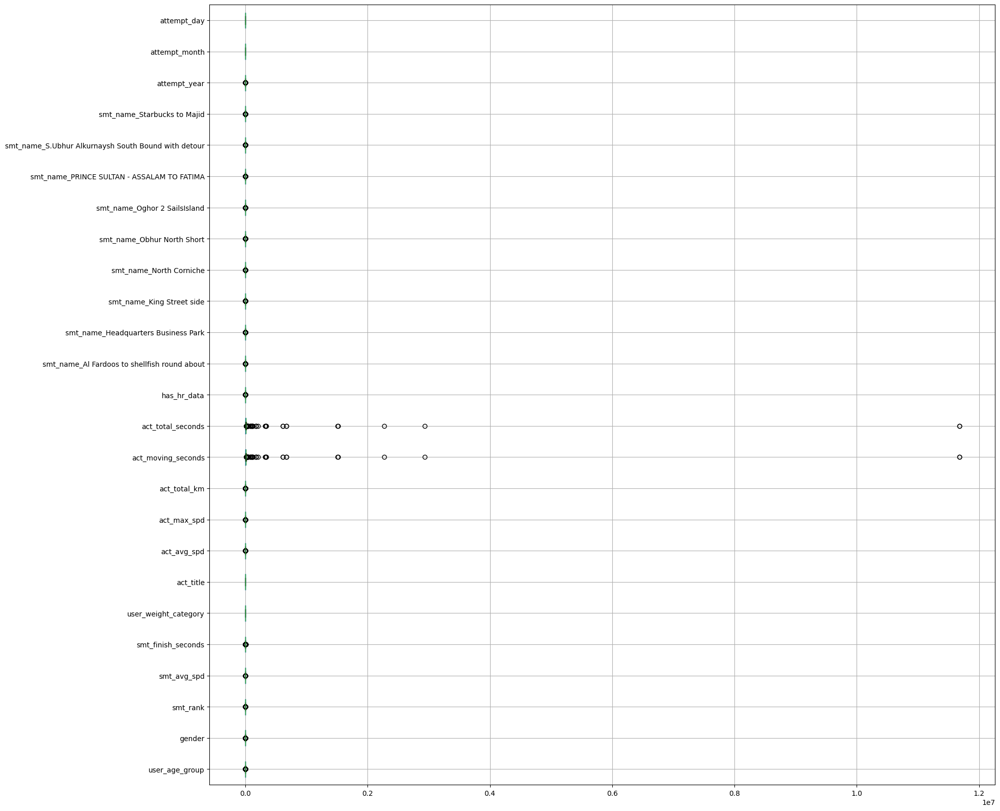

In [129]:
df_linreg.boxplot(vert=False, figsize=(20,20))

In [130]:
# Hapus outlier yang tak wajar
def hapus_outliers_tertinggi(df, col, percentage=25):
    q1 = np.percentile(df[col], 25)
    q3 = np.percentile(df[col], 75)
    iqr = q3 - q1

    outliers = df[col] > (q3 + 1.5 * iqr)
    outliers_index = df[outliers].index

    # Ambil 25% nilai tertinggi di antara outliers
    outliers_values = df.loc[outliers_index, col].sort_values(ascending=False)
    n_remove = int(len(outliers_values) * (percentage / 100))
    to_remove = outliers_values.head(n_remove).index

    return df.drop(index=to_remove)

df_linreg = hapus_outliers_tertinggi(df_linreg, 'act_total_seconds', percentage=25)
df_linreg = hapus_outliers_tertinggi(df_linreg, 'act_moving_seconds', percentage=25)
df_linreg = hapus_outliers_tertinggi(df_linreg, 'smt_finish_seconds', percentage=25)
df_linreg = hapus_outliers_tertinggi(df_linreg, 'act_max_spd', percentage=25)

In [131]:
# Periksa outlier
hitung_outlier(df_linreg)

,user_age_group,gender,smt_rank,smt_avg_spd,smt_finish_seconds,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,attempt_year,attempt_month,attempt_day
Outliers count,452.000000,238.000000,154.000000,39.000000,203.000000,0.0,0.0,63.000000,276.000000,230.000000,188.00000,188.00000,1216.000000,85.000000,0.0,0.0
Outliers percentage (%),7.514547,3.956775,2.560266,0.648379,3.374896,0.0,0.0,1.047382,4.588529,3.823774,3.12552,3.12552,20.216126,1.413134,0.0,0.0


<Axes: >

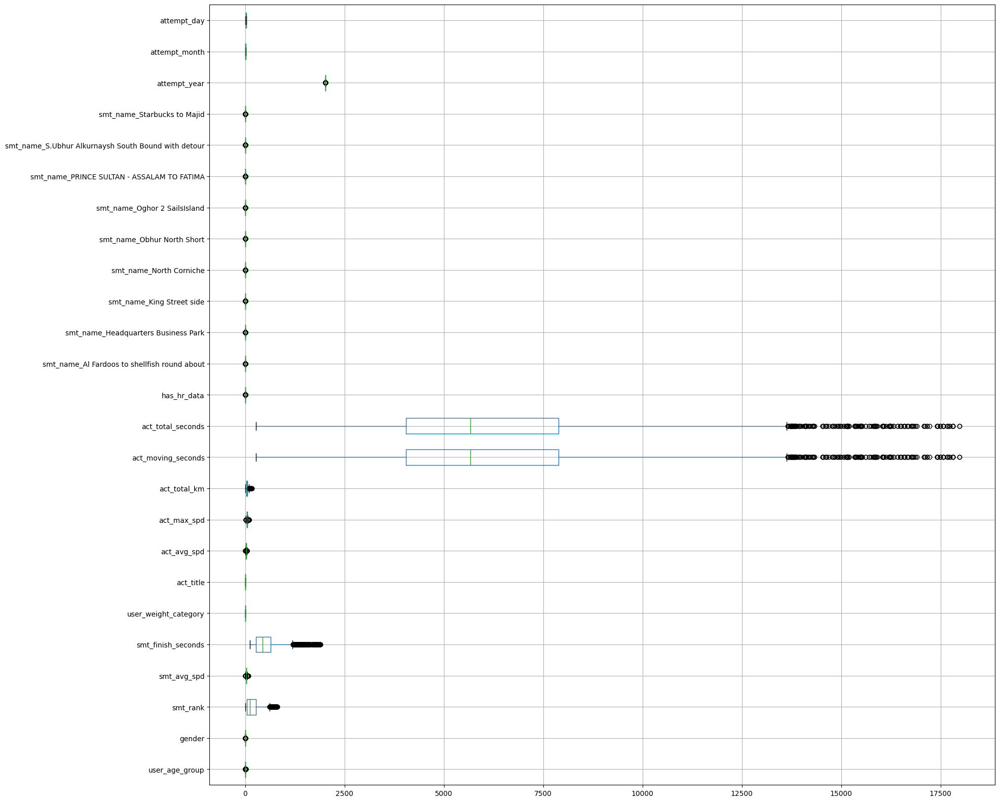

In [132]:
df_linreg.boxplot(vert=False, figsize=(20,20))

##### Persiapan *Modelling*

In [133]:
# Drop target feature
X_linreg = df_linreg.drop(columns=['smt_finish_seconds'])
y_linreg = df_linreg['smt_finish_seconds']

In [134]:
from sklearn.model_selection import train_test_split

# Split dataset
X_train_linreg, X_test_linreg, y_train_linreg, y_test_linreg = train_test_split(X_linreg, y_linreg, test_size=0.3, random_state=42)

##### Standarisasi

Saya memilih untuk menggunakan `RobustScaler` karena metode ini efektif mengurangi pengaruh *outliers* dengan menskalakan data berdasarkan median dan rentang interkuartil. Pendekatan ini memastikan bahwa fitur memiliki skala yang konsisten tanpa dipengaruhi secara signifikan oleh nilai yang jauh dari kebanyakan data, sehingga model regresi linear dapat bekerja lebih baik dan memberikan hasil yang lebih stabil.

In [135]:
from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler

# Melakukan standarisasi (pake RobustScaler)
scaler = RobustScaler()

X_train_linreg[X_train_linreg.columns] = scaler.fit_transform(X_train_linreg) # Standarisasi data training
X_test_linreg[X_test_linreg.columns]  = scaler.transform(X_test_linreg) # Standarisasi data testing

##### *Training* Model

In [136]:
from sklearn.linear_model import LinearRegression

linreg = LinearRegression()
linreg.fit(X_train_linreg, y_train_linreg)

y_pred_linreg = linreg.predict(X_test_linreg)
y_pred_linreg

array([297.88709477, 377.54508659, 414.73743894, ..., 326.62513183,
       362.04821687, 398.66135911])

In [137]:
X_train_linreg

,user_age_group,gender,smt_rank,smt_avg_spd,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,...,smt_name_King Street side,smt_name_North Corniche,smt_name_Obhur North Short,smt_name_Oghor 2 SailsIsland,smt_name_PRINCE SULTAN - ASSALAM TO FATIMA,smt_name_S.Ubhur Alkurnaysh South Bound with detour,smt_name_Starbucks to Majid,attempt_year,attempt_month,attempt_day
3407,0.0,0.0,-0.195652,0.990991,0.00,0.172061,0.802632,0.400000,0.600071,0.287936,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.5,-0.571429,0.6875
45,-2.0,0.0,-0.400000,0.585586,-0.25,0.000000,1.592105,1.156522,1.321435,0.536793,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.428571,-0.6875
1325,0.0,0.0,1.495652,-1.432432,0.25,-0.832482,-0.513158,-0.286957,1.284852,2.251078,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.142857,0.4375
1151,1.0,0.0,0.573913,0.018018,0.25,-0.831914,-0.131579,-0.252174,-0.263719,-0.198798,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.571429,0.6250
1523,1.0,0.0,-0.260870,0.918919,1.25,-0.502555,0.815789,0.086957,-0.107086,-0.376291,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.857143,-0.1250
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3941,1.0,0.0,-0.404348,1.063063,1.25,0.000000,0.631579,0.626087,0.698810,0.471180,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.5,0.714286,0.2500
5437,0.0,0.0,0.013043,0.738739,0.25,0.172061,0.276316,0.339130,0.165690,0.108090,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.5,0.000000,0.2500
5474,2.0,0.0,-0.386957,0.243243,1.00,0.000000,0.381579,0.121739,0.259101,0.157234,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.5,0.428571,-0.8125
5644,-2.0,0.0,-0.434783,0.981982,-0.50,0.172061,0.921053,1.060870,0.558871,0.199582,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.5,0.714286,0.6875


##### Evaluasi Model

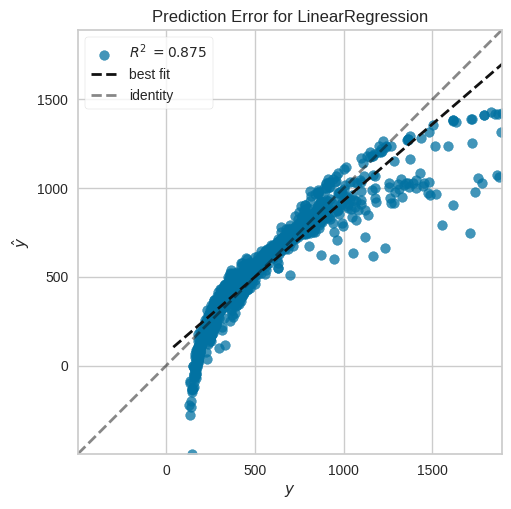

<Axes: title={'center': 'Prediction Error for LinearRegression'}, xlabel='$y$', ylabel='$\\hat{y}$'>

In [138]:
from yellowbrick.regressor import PredictionError, ResidualsPlot

# Visualisasi
visualizer = PredictionError(linreg)

visualizer.fit(X_train_linreg, y_train_linreg)
visualizer.score(X_test_linreg, y_test_linreg)
visualizer.show()

Dari visualisasi tersebut, dapat dilihat bahwa model memiliki performa yang cukup baik dengan R² = 0.875. Namun, masih terdapat penyimpangan pada nilai-nilai target yang lebih tinggi, di mana prediksi cenderung kurang akurat. *Garis identity* menunjukkan bahwa prediksi secara umum mengikuti pola target, tetapi deviasi pada ujung kurva mengindikasikan bahwa model linier mungkin kurang fleksibel untuk menangkap kompleksitas hubungan antara fitur dan jumlah detik yang dibutuhkan untuk menyelesaikan lintasan pada segmen tertentu.

In [139]:
from sklearn.metrics import r2_score,mean_absolute_error, mean_squared_error

# Menghitung metrik evaluasi
mae = mean_absolute_error(y_test_linreg, y_pred_linreg)
mse = mean_squared_error(y_test_linreg, y_pred_linreg)
rmse = np.sqrt(mse)
r2 = r2_score(y_test_linreg, y_pred_linreg)

# Menampilkan hasil
print(f"Mean Absolute Error (MAE): {mae:.4f}")
print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")
print(f"R-squared (R²): {r2:.4f}")

Mean Absolute Error (MAE): 65.0244
Mean Squared Error (MSE): 11505.0933
Root Mean Squared Error (RMSE): 107.2618
R-squared (R²): 0.8745


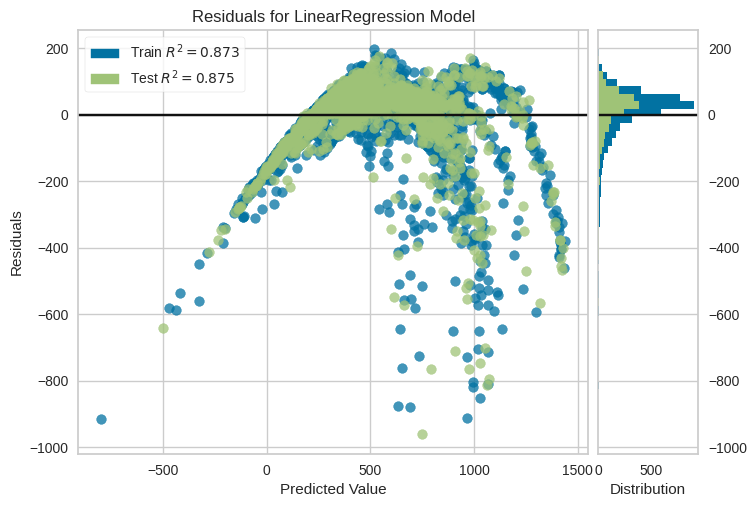

<Axes: title={'center': 'Residuals for LinearRegression Model'}, xlabel='Predicted Value', ylabel='Residuals'>

In [140]:
# Visualisasi menggunakan residual plot
visualizer = ResidualsPlot(linreg)

visualizer.fit(X_train_linreg, y_train_linreg)
visualizer.score(X_test_linreg, y_test_linreg)
visualizer.show()

Grafik residual untuk Linear regression menunjukkan pola penyebaran yang tidak sepenuhnya acak di sekitar garis nol, dengan sebagian besar residual terkonsentrasi di dekat nol tetapi membentuk pola melengkung yang mengindikasikan hubungan *non-linear* yang tidak ditangkap model. Nilai R² untuk data *training* (0,873) dan *testing* (0,875) sangat konsisten, menunjukkan performa model yang serupa pada kedua *dataset*. Namun, pola residual dan beberapa outlier besar mengindikasikan bahwa model belum sepenuhnya mampu menangkap kompleksitas hubungan antara fitur dan target.

*Cross validation*

In [141]:
from sklearn.model_selection import cross_val_score, KFold

kf = KFold(n_splits=5, shuffle=True, random_state=42)
scores = cross_val_score(linreg, X_train_linreg, y_train_linreg, cv=kf, scoring='r2')

print('Cross-validation scores:')
for i, score in enumerate(scores, start=1):
    print(f"Iterasi {i} = {score:.4f}")

print('')
print('Mean cross-validation score:', scores.mean())

Cross-validation scores:
Iterasi 1 = 0.8345
Iterasi 2 = 0.8830
Iterasi 3 = 0.8730
Iterasi 4 = 0.8730
Iterasi 5 = 0.8871

Mean cross-validation score: 0.8701159841607945


##### Fitur yang paling berpengaruh

In [142]:
# Mendapatkan koefisien dari model yang sudah dilatih
coefficients = linreg.coef_

feature_importance = pd.DataFrame({
    'Feature': X_train_linreg.columns,
    'Coefficient': coefficients
})

# Mengurutkan fitur berdasarkan nilai absolut koefisien
feature_importance['Abs_Coefficient'] = feature_importance['Coefficient'].abs()
feature_importance = feature_importance.sort_values(by='Abs_Coefficient', ascending=False)

print("Fitur yang paling berpengaruh terhadap prediksi:")
print(feature_importance)

Fitur yang paling berpengaruh terhadap prediksi:
                                              Feature  Coefficient  \
19  smt_name_S.Ubhur Alkurnaysh South Bound with d...   522.832281   
13                smt_name_Headquarters Business Park  -453.499228   
17                       smt_name_Oghor 2 SailsIsland  -338.276365   
12       smt_name_Al Fardoos to shellfish round about   315.958599   
16                         smt_name_Obhur North Short   270.829605   
3                                         smt_avg_spd  -260.432140   
18         smt_name_PRINCE SULTAN - ASSALAM TO FATIMA  -251.234890   
20                        smt_name_Starbucks to Majid   -98.828815   
8                                        act_total_km   -79.968607   
6                                         act_avg_spd    42.966108   
9                                  act_moving_seconds    34.421486   
10                                  act_total_seconds    34.421486   
15                            smt_name_No

#### *Test* Data

##### *Load and Process data*

In [143]:
test_data_linreg = pd.read_csv("https://drive.google.com/uc?id=1aKPCzUk-U1mOvYiMxuUfa_M2TDu_TMXq")

id_test = test_data_linreg['id'].copy()
test_data_linreg.drop(["id", "user_id"], axis=1, inplace=True)

##### Periksa *Missing Values*

In [144]:
# Cek missing values awal
print("Missing values before:")
print(test_data_linreg.isnull().sum())

Missing values before:
user_age_group           0
attempt_date             0
smt_rank                 0
smt_avg_spd              0
smt_name                 0
user_weight_category    39
act_title                0
act_avg_spd              0
act_max_spd              0
act_total_km             0
act_moving_seconds       0
act_total_seconds        0
has_hr_data              0
gender                   0
dtype: int64


In [145]:
mode_value = test_data_linreg['user_weight_category'].mode()[0]
test_data_linreg['user_weight_category'] = test_data_linreg['user_weight_category'].fillna(mode_value)

##### *Data Encoding*

In [ ]:
# Mapping User Age Group
age_mapping = {
    '19 and under': 0,
    '20 to 24': 1,
    '25 to 34': 2,
    '35 to 44': 3,
    '45 to 54': 4,
    '55 to 64': 5,
    '65 to 69': 6,
    '70 to 74': 7,
    '75+': 8
}
test_data_linreg['user_age_group'] = test_data_linreg['user_age_group'].map(age_mapping)
test_data_linreg

,user_age_group,attempt_date,smt_rank,smt_avg_spd,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,gender
0,2,2018-07-15,33,36.9,PRINCE SULTAN - ASSALAM TO FATIMA,65 to 74 kg,Night Ride,34.6,50.8,41.61,4326,4326,0,male
1,2,2018-01-03,181,26.2,Starbucks to Majid,75 to 84 kg,احلى تمرين مع دراج جدة two hearts person bikin...,25.4,40.3,45.37,6427,6427,0,male
2,2,2019-07-19,3,56.0,Oghor 2 SailsIsland,54 kg and under,Afternoon Ride,22.6,85.3,78.45,12507,12507,0,male
3,4,2018-06-22,142,11.1,North Corniche,75 to 84 kg,Morning Ride,12.1,16.9,21.01,6254,6254,0,male
4,3,2018-08-29,216,22.2,Starbucks to Majid,85 to 95 kg,تمرين جميل مع دراج جدة red heart,21.9,45.7,57.15,9398,9398,0,male
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
782,2,2018-05-17,60,32.3,PRINCE SULTAN - ASSALAM TO FATIMA,54 kg and under,Morning Ride,22.1,48.6,50.06,8151,8151,0,male
783,3,2018-07-16,221,24.0,Headquarters Business Park,75 to 84 kg,Evening Ride,22.0,41.0,56.15,9187,9187,0,male
784,3,2015-12-07,401,18.4,Oghor 2 SailsIsland,75 to 84 kg,وتلوموني بجدة قطعت احلا مسافة ع اجمل شاطئ بالش...,16.4,41.4,45.38,9959,9959,0,male
785,2,2017-05-10,184,32.1,North Corniche,85 to 95 kg,Evening Ride,26.0,38.9,35.48,4913,4913,0,male


In [ ]:
# Mapping Gender
gender_mapping = {
    'male': 2,
    'female': 1
}
test_data_linreg['gender'] = test_data_linreg['gender'].map(gender_mapping)
test_data_linreg

,user_age_group,attempt_date,smt_rank,smt_avg_spd,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,gender
0,2,2018-07-15,33,36.9,PRINCE SULTAN - ASSALAM TO FATIMA,65 to 74 kg,Night Ride,34.6,50.8,41.61,4326,4326,0,2
1,2,2018-01-03,181,26.2,Starbucks to Majid,75 to 84 kg,احلى تمرين مع دراج جدة two hearts person bikin...,25.4,40.3,45.37,6427,6427,0,2
2,2,2019-07-19,3,56.0,Oghor 2 SailsIsland,54 kg and under,Afternoon Ride,22.6,85.3,78.45,12507,12507,0,2
3,4,2018-06-22,142,11.1,North Corniche,75 to 84 kg,Morning Ride,12.1,16.9,21.01,6254,6254,0,2
4,3,2018-08-29,216,22.2,Starbucks to Majid,85 to 95 kg,تمرين جميل مع دراج جدة red heart,21.9,45.7,57.15,9398,9398,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
782,2,2018-05-17,60,32.3,PRINCE SULTAN - ASSALAM TO FATIMA,54 kg and under,Morning Ride,22.1,48.6,50.06,8151,8151,0,2
783,3,2018-07-16,221,24.0,Headquarters Business Park,75 to 84 kg,Evening Ride,22.0,41.0,56.15,9187,9187,0,2
784,3,2015-12-07,401,18.4,Oghor 2 SailsIsland,75 to 84 kg,وتلوموني بجدة قطعت احلا مسافة ع اجمل شاطئ بالش...,16.4,41.4,45.38,9959,9959,0,2
785,2,2017-05-10,184,32.1,North Corniche,85 to 95 kg,Evening Ride,26.0,38.9,35.48,4913,4913,0,2


In [ ]:
# Mapping User Weight Category
weight_mapping = {
    '54 kg and under': 0,
    '55 to 64 kg': 1,
    '65 to 74 kg': 2,
    '75 to 84 kg': 3,
    '85 to 95 kg': 4,
    '95 kg to 104 kg': 5,
    '105 kg to 114 kg': 6,
    '115 kg and over': 7
}
test_data_linreg['user_weight_category'] = test_data_linreg['user_weight_category'].map(weight_mapping)
test_data_linreg

,user_age_group,attempt_date,smt_rank,smt_avg_spd,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,gender
0,2,2018-07-15,33,36.9,PRINCE SULTAN - ASSALAM TO FATIMA,2,Night Ride,34.6,50.8,41.61,4326,4326,0,2
1,2,2018-01-03,181,26.2,Starbucks to Majid,3,احلى تمرين مع دراج جدة two hearts person bikin...,25.4,40.3,45.37,6427,6427,0,2
2,2,2019-07-19,3,56.0,Oghor 2 SailsIsland,0,Afternoon Ride,22.6,85.3,78.45,12507,12507,0,2
3,4,2018-06-22,142,11.1,North Corniche,3,Morning Ride,12.1,16.9,21.01,6254,6254,0,2
4,3,2018-08-29,216,22.2,Starbucks to Majid,4,تمرين جميل مع دراج جدة red heart,21.9,45.7,57.15,9398,9398,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
782,2,2018-05-17,60,32.3,PRINCE SULTAN - ASSALAM TO FATIMA,0,Morning Ride,22.1,48.6,50.06,8151,8151,0,2
783,3,2018-07-16,221,24.0,Headquarters Business Park,3,Evening Ride,22.0,41.0,56.15,9187,9187,0,2
784,3,2015-12-07,401,18.4,Oghor 2 SailsIsland,3,وتلوموني بجدة قطعت احلا مسافة ع اجمل شاطئ بالش...,16.4,41.4,45.38,9959,9959,0,2
785,2,2017-05-10,184,32.1,North Corniche,4,Evening Ride,26.0,38.9,35.48,4913,4913,0,2


In [ ]:
# Mapping Segment Name
test_data_linreg = pd.get_dummies(test_data_linreg, columns=['smt_name'], drop_first=False)
test_data_linreg

,user_age_group,attempt_date,smt_rank,smt_avg_spd,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,...,gender,smt_name_Al Fardoos to shellfish round about,smt_name_Headquarters Business Park,smt_name_King Street side,smt_name_North Corniche,smt_name_Obhur North Short,smt_name_Oghor 2 SailsIsland,smt_name_PRINCE SULTAN - ASSALAM TO FATIMA,smt_name_S.Ubhur Alkurnaysh South Bound with detour,smt_name_Starbucks to Majid
0,2,2018-07-15,33,36.9,2,Night Ride,34.6,50.8,41.61,4326,...,2,False,False,False,False,False,False,True,False,False
1,2,2018-01-03,181,26.2,3,احلى تمرين مع دراج جدة two hearts person bikin...,25.4,40.3,45.37,6427,...,2,False,False,False,False,False,False,False,False,True
2,2,2019-07-19,3,56.0,0,Afternoon Ride,22.6,85.3,78.45,12507,...,2,False,False,False,False,False,True,False,False,False
3,4,2018-06-22,142,11.1,3,Morning Ride,12.1,16.9,21.01,6254,...,2,False,False,False,True,False,False,False,False,False
4,3,2018-08-29,216,22.2,4,تمرين جميل مع دراج جدة red heart,21.9,45.7,57.15,9398,...,2,False,False,False,False,False,False,False,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
782,2,2018-05-17,60,32.3,0,Morning Ride,22.1,48.6,50.06,8151,...,2,False,False,False,False,False,False,True,False,False
783,3,2018-07-16,221,24.0,3,Evening Ride,22.0,41.0,56.15,9187,...,2,False,True,False,False,False,False,False,False,False
784,3,2015-12-07,401,18.4,3,وتلوموني بجدة قطعت احلا مسافة ع اجمل شاطئ بالش...,16.4,41.4,45.38,9959,...,2,False,False,False,False,False,True,False,False,False
785,2,2017-05-10,184,32.1,4,Evening Ride,26.0,38.9,35.48,4913,...,2,False,False,False,True,False,False,False,False,False


In [ ]:
# Frequency Encoding untuk act_title
freq_map = test_data_linreg['act_title'].value_counts(normalize=True)
test_data_linreg['act_title'] = test_data_linreg['act_title'].map(freq_map)
test_data_linreg

,user_age_group,attempt_date,smt_rank,smt_avg_spd,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,...,gender,smt_name_Al Fardoos to shellfish round about,smt_name_Headquarters Business Park,smt_name_King Street side,smt_name_North Corniche,smt_name_Obhur North Short,smt_name_Oghor 2 SailsIsland,smt_name_PRINCE SULTAN - ASSALAM TO FATIMA,smt_name_S.Ubhur Alkurnaysh South Bound with detour,smt_name_Starbucks to Majid
0,2,2018-07-15,33,36.9,2,0.149936,34.6,50.8,41.61,4326,...,2,False,False,False,False,False,False,True,False,False
1,2,2018-01-03,181,26.2,3,0.002541,25.4,40.3,45.37,6427,...,2,False,False,False,False,False,False,False,False,True
2,2,2019-07-19,3,56.0,0,0.094028,22.6,85.3,78.45,12507,...,2,False,False,False,False,False,True,False,False,False
3,4,2018-06-22,142,11.1,3,0.213469,12.1,16.9,21.01,6254,...,2,False,False,False,True,False,False,False,False,False
4,3,2018-08-29,216,22.2,4,0.001271,21.9,45.7,57.15,9398,...,2,False,False,False,False,False,False,False,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
782,2,2018-05-17,60,32.3,0,0.213469,22.1,48.6,50.06,8151,...,2,False,False,False,False,False,False,True,False,False
783,3,2018-07-16,221,24.0,3,0.287166,22.0,41.0,56.15,9187,...,2,False,True,False,False,False,False,False,False,False
784,3,2015-12-07,401,18.4,3,0.001271,16.4,41.4,45.38,9959,...,2,False,False,False,False,False,True,False,False,False
785,2,2017-05-10,184,32.1,4,0.287166,26.0,38.9,35.48,4913,...,2,False,False,False,True,False,False,False,False,False


In [ ]:
# Encoding attempt_date
test_data_linreg['attempt_date'] = pd.to_datetime(test_data_linreg['attempt_date'])
test_data_linreg['attempt_year'] = test_data_linreg['attempt_date'].dt.year
test_data_linreg['attempt_month'] = test_data_linreg['attempt_date'].dt.month
test_data_linreg['attempt_day'] = test_data_linreg['attempt_date'].dt.day

test_data_linreg = test_data_linreg.drop('attempt_date', axis=1)
test_data_linreg

,user_age_group,smt_rank,smt_avg_spd,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,...,smt_name_King Street side,smt_name_North Corniche,smt_name_Obhur North Short,smt_name_Oghor 2 SailsIsland,smt_name_PRINCE SULTAN - ASSALAM TO FATIMA,smt_name_S.Ubhur Alkurnaysh South Bound with detour,smt_name_Starbucks to Majid,attempt_year,attempt_month,attempt_day
0,2,33,36.9,2,0.149936,34.6,50.8,41.61,4326,4326,...,False,False,False,False,True,False,False,2018,7,15
1,2,181,26.2,3,0.002541,25.4,40.3,45.37,6427,6427,...,False,False,False,False,False,False,True,2018,1,3
2,2,3,56.0,0,0.094028,22.6,85.3,78.45,12507,12507,...,False,False,False,True,False,False,False,2019,7,19
3,4,142,11.1,3,0.213469,12.1,16.9,21.01,6254,6254,...,False,True,False,False,False,False,False,2018,6,22
4,3,216,22.2,4,0.001271,21.9,45.7,57.15,9398,9398,...,False,False,False,False,False,False,True,2018,8,29
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
782,2,60,32.3,0,0.213469,22.1,48.6,50.06,8151,8151,...,False,False,False,False,True,False,False,2018,5,17
783,3,221,24.0,3,0.287166,22.0,41.0,56.15,9187,9187,...,False,False,False,False,False,False,False,2018,7,16
784,3,401,18.4,3,0.001271,16.4,41.4,45.38,9959,9959,...,False,False,False,True,False,False,False,2015,12,7
785,2,184,32.1,4,0.287166,26.0,38.9,35.48,4913,4913,...,False,True,False,False,False,False,False,2017,5,10


In [ ]:
# Mengatur ulang urutan kolom fitur agar bisa di-predict
columns = list(test_data_linreg.columns)

columns.remove('gender')
columns.insert(1, 'gender')

test_data_linreg = test_data_linreg[columns]

In [ ]:
test_data_linreg.isnull().sum()

,0
user_age_group,0
gender,0
smt_rank,0
smt_avg_spd,0
user_weight_category,0
act_title,0
act_avg_spd,0
act_max_spd,0
act_total_km,0
act_moving_seconds,0


##### Standarisasi

In [ ]:
# Melakukan standarisasi (pake RobustScaler)
scaler = RobustScaler()

test_data_linreg[test_data_linreg.columns] = scaler.fit_transform(test_data_linreg)
test_data_linreg

,user_age_group,gender,smt_rank,smt_avg_spd,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,...,smt_name_King Street side,smt_name_North Corniche,smt_name_Obhur North Short,smt_name_Oghor 2 SailsIsland,smt_name_PRINCE SULTAN - ASSALAM TO FATIMA,smt_name_S.Ubhur Alkurnaysh South Bound with detour,smt_name_Starbucks to Majid,attempt_year,attempt_month,attempt_day
0,0.0,0.0,-0.336207,0.986175,0.00,-0.227273,1.662162,0.776786,0.175295,-0.391163,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.142857,0.000000
1,0.0,0.0,0.301724,0.000000,0.25,-0.754545,0.418919,-0.160714,0.309532,0.178368,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,-0.714286,-0.857143
2,0.0,0.0,-0.465517,2.746544,-0.50,-0.427273,0.040541,3.857143,1.490539,1.826511,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.5,0.142857,0.285714
3,2.0,0.0,0.133621,-1.391705,0.25,0.000000,-1.378378,-2.250000,-0.560157,0.131472,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.500000
4,1.0,0.0,0.452586,-0.368664,0.50,-0.759091,-0.054054,0.321429,0.730096,0.983735,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.285714,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
782,0.0,0.0,-0.219828,0.562212,-0.50,0.000000,-0.027027,0.580357,0.476973,0.645703,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,-0.142857,0.142857
783,1.0,0.0,0.474138,-0.202765,0.25,0.263636,-0.040541,-0.098214,0.694395,0.926538,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.142857,0.071429
784,1.0,0.0,1.250000,-0.718894,0.25,-0.759091,-0.797297,-0.062500,0.309889,1.135809,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,-1.5,0.857143,-0.571429
785,0.0,0.0,0.314655,0.543779,0.50,0.263636,0.500000,-0.285714,-0.043556,-0.232041,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,-0.5,-0.142857,-0.357143


##### *Predict data test*

In [ ]:
test_linreg_predictions = linreg.predict(test_data_linreg)

# Membuat file untuk submission kaggle
submission = pd.DataFrame({
'id': id_test,  # Gunakan id yang sudah disimpan
'smt_finish_secondsr': test_linreg_predictions
})

submission.to_csv('CSL_Submission_LinReg.csv', index=False)
submission

,id,smt_finish_secondsr
0,2699,207.538326
1,332,573.476026
2,3282,-329.387118
3,5891,1039.806134
4,858,677.472555
...,...,...
782,2726,289.698037
783,7350,264.875925
784,4370,498.764233
785,4979,558.817313


## Lasso Regression

#### Proses *Modelling*

In [146]:
df_lasso = df_linreg.copy()
df_lasso

,user_age_group,gender,smt_rank,smt_avg_spd,smt_finish_seconds,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,...,smt_name_King Street side,smt_name_North Corniche,smt_name_Obhur North Short,smt_name_Oghor 2 SailsIsland,smt_name_PRINCE SULTAN - ASSALAM TO FATIMA,smt_name_S.Ubhur Alkurnaysh South Bound with detour,smt_name_Starbucks to Majid,attempt_year,attempt_month,attempt_day
0,2,2,712,15.8,382,0,0.132072,13.6,34.9,19.24,...,False,False,False,False,False,False,False,2017,12,22
1,2,2,189,33.2,216,6,0.132072,21.5,43.2,23.47,...,False,False,False,True,False,False,False,2015,4,13
2,2,2,264,23.7,593,3,0.281310,26.7,92.9,38.23,...,False,False,False,False,False,False,True,2018,2,7
3,2,2,50,33.4,817,3,0.092498,31.4,54.4,65.77,...,False,False,False,False,False,False,False,2018,8,24
4,2,1,19,21.3,284,0,0.000477,19.9,43.2,96.53,...,False,False,False,False,False,False,False,2020,3,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6286,2,2,396,24.2,718,0,0.000159,16.6,34.9,41.34,...,False,True,False,False,False,False,False,2017,11,11
6288,3,2,34,38.9,446,4,0.000318,34.5,52.2,48.13,...,False,True,False,False,False,False,False,2018,11,21
6289,3,2,218,22.1,637,3,0.132072,17.6,40.7,50.64,...,False,False,False,False,False,False,True,2013,8,11
6290,3,2,477,12.4,485,4,0.233153,14.5,34.9,40.93,...,False,False,False,False,False,False,False,2015,4,24


In [147]:
# Drop target feature
X_lasso = df_lasso.drop(columns=['smt_finish_seconds'])
y_lasso = df_lasso['smt_finish_seconds']

In [148]:
# Split dataset
X_train_lasso, X_test_lasso, y_train_lasso, y_test_lasso = train_test_split(X_lasso, y_lasso, test_size=0.3, random_state=42)

##### Standarisasi

Saya memilih untuk menggunakan `RobustScaler` karena metode ini mengurangi pengaruh *outliers* dengan menskalakan data berdasarkan median dan rentang interkuartil (IQR). Pendekatan ini memastikan bahwa skala fitur lebih stabil dan tidak terdistorsi oleh nilai yang jauh dari mayoritas data, sehingga model lasso regression dapat bekerja lebih efektif dan memberikan hasil yang lebih akurat.

In [149]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler

# Melakukan standarisasi (pake RobustScaler)
scaler = RobustScaler()

X_train_lasso[X_train_lasso.columns] = scaler.fit_transform(X_train_lasso) # Standarisasi data training
X_test_lasso[X_test_lasso.columns]  = scaler.transform(X_test_lasso) # Standarisasi data testing

##### *Training Model*

In [150]:
# List alpha
lasso_alphas = [0.005, 0.0125, 0.025, 0.05, 0.1, 0.25, 0.5, 1, 2.5, 5, 6.125, 7.5, 10]

In [151]:
from sklearn.linear_model import Lasso

# Model lasso regression
lasso_model_list = []
for alpha in lasso_alphas:
    lasso = Lasso(alpha=alpha)
    lasso.fit(X_train_lasso, y_train_lasso)
    lasso_model_list.append(lasso)

##### Evaluasi masing-masing model

In [152]:
def regression_metrics(y_test, prediction):
    MAE = mean_absolute_error(y_test, prediction)
    MSE = mean_squared_error(y_test, prediction)
    RMSE = np.sqrt(MSE)
    R_squared = r2_score(y_test, prediction)

    print('MAE: ' + str(MAE))
    print('MSE: ' + str(MSE))
    print('RMSE: ' + str(RMSE))
    print('R-squared (R²): ' + str(R_squared))

In [153]:
for alpha, model in zip(lasso_alphas, lasso_model_list):
    y_pred_lasso = model.predict(X_test_lasso)
    print(f'Model Lasso regression dengan alpha: {alpha}')
    regression_metrics(y_test_lasso, y_pred_lasso)
    print()

Model Lasso regression dengan alpha: 0.005
MAE: 65.0182530576914
MSE: 11505.520787013551
RMSE: 107.26379066121778
R-squared (R²): 0.8745137837297503

Model Lasso regression dengan alpha: 0.0125
MAE: 65.00900747000782
MSE: 11506.220114978802
RMSE: 107.26705046275302
R-squared (R²): 0.8745061564330885

Model Lasso regression dengan alpha: 0.025
MAE: 64.99396633109363
MSE: 11507.540537721996
RMSE: 107.27320512468151
R-squared (R²): 0.8744917550985476

Model Lasso regression dengan alpha: 0.05
MAE: 64.98038302076549
MSE: 11510.588180425235
RMSE: 107.28740923531164
R-squared (R²): 0.8744585156512898

Model Lasso regression dengan alpha: 0.1
MAE: 64.95498746612877
MSE: 11519.146043191686
RMSE: 107.32728470986157
R-squared (R²): 0.8743651783884401

Model Lasso regression dengan alpha: 0.25
MAE: 64.95142411737515
MSE: 11563.259954157715
RMSE: 107.53259949502623
R-squared (R²): 0.8738840452112041

Model Lasso regression dengan alpha: 0.5
MAE: 65.17948435898404
MSE: 11698.24094981901
RMSE: 108.1

##### Menggunakan model terbaik

In [154]:
# Model terbaik saat alpha = 0.005
selected_lasso = lasso_model_list[0]

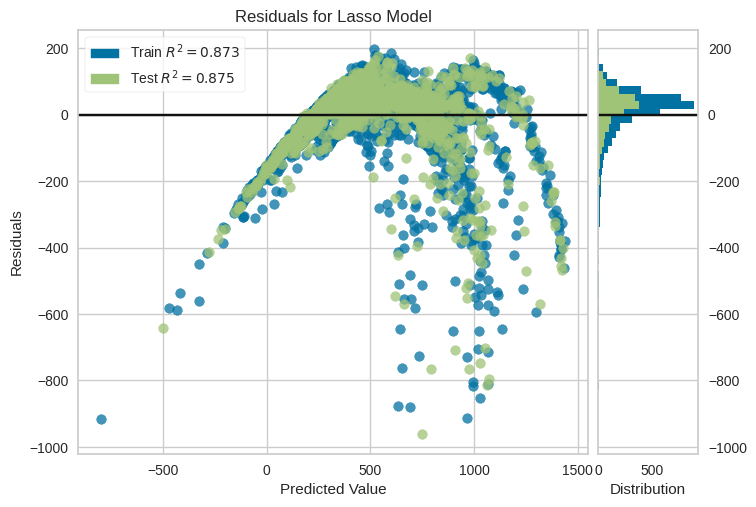

<Axes: title={'center': 'Residuals for Lasso Model'}, xlabel='Predicted Value', ylabel='Residuals'>

In [155]:
# Visualisasi menggunakan residual plot
visualizer = ResidualsPlot(selected_lasso)

visualizer.fit(X_train_lasso, y_train_lasso)
visualizer.score(X_test_lasso, y_test_lasso)
visualizer.show()

Grafik residual untuk Lasso regression menunjukkan pola penyebaran yang tidak sepenuhnya acak di sekitar garis nol, dengan sebagian besar residual terkonsentrasi di dekat nol tetapi membentuk pola melengkung yang mengindikasikan hubungan *non-linear* yang tidak ditangkap model. Nilai R² untuk data *training* (0,873) dan *testing* (0,875) sangat konsisten, menunjukkan performa model yang serupa pada kedua *dataset*. Namun, pola residual dan beberapa outlier besar mengindikasikan bahwa model belum sepenuhnya mampu menangkap kompleksitas hubungan antara fitur dan target.

Analisis hubungan perubahan nilai parameter *alpha*, parameter model, dan nilai R²

In [156]:
r_squared_list = []
parameter_model = []

for alpha, model in zip(lasso_alphas, lasso_model_list):
    y_pred_lasso = model.predict(X_test_lasso)
    R_squared = r2_score(y_test_lasso, y_pred_lasso)
    r_squared_list.append(R_squared)

    # Menyimpan parameter model
    coefficients = model.coef_
    intercept = model.intercept_
    parameter_model.append({
        'alpha': alpha,
        'coefficients': coefficients,
        'intercept': intercept
    })
    print()

# Menampilkan semua nilai R-squared yang disimpan
print("R-squared values untuk setiap alpha:")
for alpha, r2 in zip(lasso_alphas, r_squared_list):
    print(f'Alpha: {alpha}, R-squared (R²): {r2}')

# Menampilkan parameter model yang disimpan
print("\nParameter Model untuk setiap alpha:")
for params in parameter_model:
    print(f"Alpha: {params['alpha']}")
    print(f"Intercept: {params['intercept']}")
    print(f"Coefficients: {params['coefficients']}\n")














R-squared values untuk setiap alpha:
Alpha: 0.005, R-squared (R²): 0.8745137837297503
Alpha: 0.0125, R-squared (R²): 0.8745061564330885
Alpha: 0.025, R-squared (R²): 0.8744917550985476
Alpha: 0.05, R-squared (R²): 0.8744585156512898
Alpha: 0.1, R-squared (R²): 0.8743651783884401
Alpha: 0.25, R-squared (R²): 0.8738840452112041
Alpha: 0.5, R-squared (R²): 0.8724118602725575
Alpha: 1, R-squared (R²): 0.8697668459073078
Alpha: 2.5, R-squared (R²): 0.8584580005331213
Alpha: 5, R-squared (R²): 0.819306325763151
Alpha: 6.125, R-squared (R²): 0.7980329200635764
Alpha: 7.5, R-squared (R²): 0.7726450598687121
Alpha: 10, R-squared (R²): 0.7385184057556582

Parameter Model untuk setiap alpha:
Alpha: 0.005
Intercept: 583.3532010716932
Coefficients: [-1.40022868e+00  1.71606677e+01 -2.14639059e+01 -2.60388333e+02
  3.70361029e+00 -2.91320005e+00  4.27403703e+01  8.37293024e+00
 -7.93897360e+01  6.83825375e+01  5.47758645e-12  1.58661536e+01
  4.04297394e+02 -3.64771692e+02  9.06292697e+

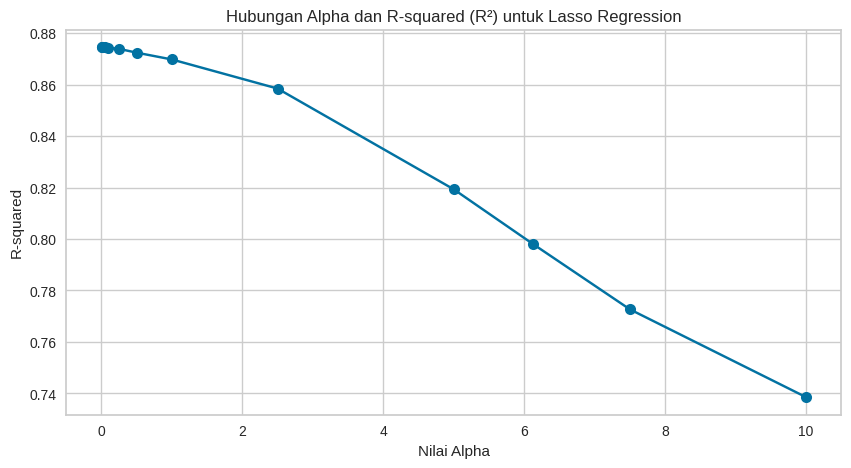

In [157]:
# Visualisasi hubungan Alpha dan R-squared
plt.figure(figsize=(10, 5))
plt.plot(lasso_alphas, r_squared_list, marker='o', color='b', linestyle='-', markersize=8)
plt.title('Hubungan Alpha dan R-squared (R²) untuk Lasso Regression')
plt.xlabel('Nilai Alpha')
plt.ylabel('R-squared')
plt.grid(True)
plt.show()

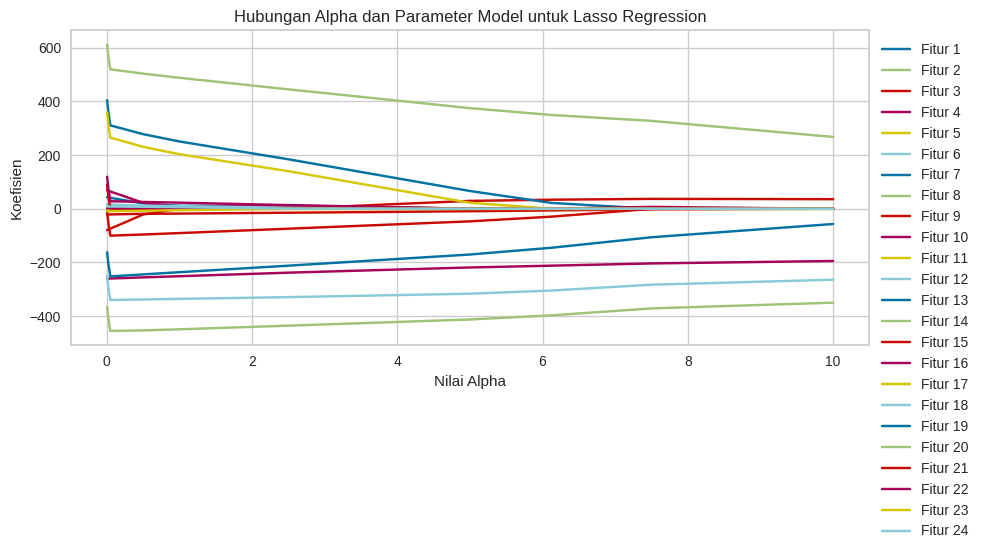

In [158]:
# Visualisasi hubungan Alpha dan Parameter Model
coefficients_array = np.array([model['coefficients'] for model in parameter_model])

plt.figure(figsize=(10, 5))
for i in range(coefficients_array.shape[1]):
    plt.plot(lasso_alphas, coefficients_array[:, i], label=f'Fitur {i+1}')

plt.title('Hubungan Alpha dan Parameter Model untuk Lasso Regression')
plt.xlabel('Nilai Alpha')
plt.ylabel('Koefisien')
plt.legend(loc='upper left', bbox_to_anchor=(1, 1), ncol=1, fontsize='small')
plt.grid(True)
plt.tight_layout()
plt.show()

Dalam Lasso regression, nilai parameter alpha menentukan seberapa kuat model melakukan regularisasi terhadap koefisien fitur. Semakin besar nilai alpha, maka semakin banyak koefisien yang diatur menjadi nol, sehingga menghasilkan model yang lebih sederhana dengan lebih sedikit fitur yang digunakan (hanya yang penting saja). Hal ini bisa membuat model lebih mudah dipahami dan mencegah *overfitting*, tetapi juga bisa menurunkan kemampuan model untuk menjelaskan variasi data. Hal tersebut bisa dilihat dari nilai R-squared yang lebih rendah.<br>
<br>

Sebaliknya, nilai alpha yang lebih kecil memungkinkan lebih banyak fitur berkontribusi pada model, sehingga bisa meningkatkan nilai R-squared karena model jadi bisa menjelaskan variansi pada variabel dependen dan melihat lebih banyak pola dalam data. Akan tetapi, resiko *overfitting* juga meningkat karena model jadi lebih kompleks.<br>

#### *Test* Data

##### *Load and Process data*

In [159]:
test_data_lasso = pd.read_csv("https://drive.google.com/uc?id=1aKPCzUk-U1mOvYiMxuUfa_M2TDu_TMXq")

id_test = test_data_lasso['id'].copy()
test_data_lasso.drop(["id", "user_id"], axis=1, inplace=True)

##### Periksa *Missing Values*

In [160]:
# Cek missing values awal
print("Missing values before:")
print(test_data_lasso.isnull().sum())

Missing values before:
user_age_group           0
attempt_date             0
smt_rank                 0
smt_avg_spd              0
smt_name                 0
user_weight_category    39
act_title                0
act_avg_spd              0
act_max_spd              0
act_total_km             0
act_moving_seconds       0
act_total_seconds        0
has_hr_data              0
gender                   0
dtype: int64


In [161]:
mode_value = test_data_lasso['user_weight_category'].mode()[0]
test_data_lasso['user_weight_category'] = test_data_lasso['user_weight_category'].fillna(mode_value)

##### *Data Encoding*

In [162]:
# Mapping User Age Group
age_mapping = {
    '19 and under': 0,
    '20 to 24': 1,
    '25 to 34': 2,
    '35 to 44': 3,
    '45 to 54': 4,
    '55 to 64': 5,
    '65 to 69': 6,
    '70 to 74': 7,
    '75+': 8
}
test_data_lasso['user_age_group'] = test_data_lasso['user_age_group'].map(age_mapping)
test_data_lasso

,user_age_group,attempt_date,smt_rank,smt_avg_spd,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,gender
0,2,2018-07-15,33,36.9,PRINCE SULTAN - ASSALAM TO FATIMA,65 to 74 kg,Night Ride,34.6,50.8,41.61,4326,4326,0,male
1,2,2018-01-03,181,26.2,Starbucks to Majid,75 to 84 kg,احلى تمرين مع دراج جدة two hearts person bikin...,25.4,40.3,45.37,6427,6427,0,male
2,2,2019-07-19,3,56.0,Oghor 2 SailsIsland,54 kg and under,Afternoon Ride,22.6,85.3,78.45,12507,12507,0,male
3,4,2018-06-22,142,11.1,North Corniche,75 to 84 kg,Morning Ride,12.1,16.9,21.01,6254,6254,0,male
4,3,2018-08-29,216,22.2,Starbucks to Majid,85 to 95 kg,تمرين جميل مع دراج جدة red heart,21.9,45.7,57.15,9398,9398,0,male
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
782,2,2018-05-17,60,32.3,PRINCE SULTAN - ASSALAM TO FATIMA,54 kg and under,Morning Ride,22.1,48.6,50.06,8151,8151,0,male
783,3,2018-07-16,221,24.0,Headquarters Business Park,75 to 84 kg,Evening Ride,22.0,41.0,56.15,9187,9187,0,male
784,3,2015-12-07,401,18.4,Oghor 2 SailsIsland,75 to 84 kg,وتلوموني بجدة قطعت احلا مسافة ع اجمل شاطئ بالش...,16.4,41.4,45.38,9959,9959,0,male
785,2,2017-05-10,184,32.1,North Corniche,85 to 95 kg,Evening Ride,26.0,38.9,35.48,4913,4913,0,male


In [163]:
# Mapping Gender
gender_mapping = {
    'male': 2,
    'female': 1
}
test_data_lasso['gender'] = test_data_lasso['gender'].map(gender_mapping)
test_data_lasso

,user_age_group,attempt_date,smt_rank,smt_avg_spd,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,gender
0,2,2018-07-15,33,36.9,PRINCE SULTAN - ASSALAM TO FATIMA,65 to 74 kg,Night Ride,34.6,50.8,41.61,4326,4326,0,2
1,2,2018-01-03,181,26.2,Starbucks to Majid,75 to 84 kg,احلى تمرين مع دراج جدة two hearts person bikin...,25.4,40.3,45.37,6427,6427,0,2
2,2,2019-07-19,3,56.0,Oghor 2 SailsIsland,54 kg and under,Afternoon Ride,22.6,85.3,78.45,12507,12507,0,2
3,4,2018-06-22,142,11.1,North Corniche,75 to 84 kg,Morning Ride,12.1,16.9,21.01,6254,6254,0,2
4,3,2018-08-29,216,22.2,Starbucks to Majid,85 to 95 kg,تمرين جميل مع دراج جدة red heart,21.9,45.7,57.15,9398,9398,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
782,2,2018-05-17,60,32.3,PRINCE SULTAN - ASSALAM TO FATIMA,54 kg and under,Morning Ride,22.1,48.6,50.06,8151,8151,0,2
783,3,2018-07-16,221,24.0,Headquarters Business Park,75 to 84 kg,Evening Ride,22.0,41.0,56.15,9187,9187,0,2
784,3,2015-12-07,401,18.4,Oghor 2 SailsIsland,75 to 84 kg,وتلوموني بجدة قطعت احلا مسافة ع اجمل شاطئ بالش...,16.4,41.4,45.38,9959,9959,0,2
785,2,2017-05-10,184,32.1,North Corniche,85 to 95 kg,Evening Ride,26.0,38.9,35.48,4913,4913,0,2


In [164]:
# Mapping User Weight Category
weight_mapping = {
    '54 kg and under': 0,
    '55 to 64 kg': 1,
    '65 to 74 kg': 2,
    '75 to 84 kg': 3,
    '85 to 95 kg': 4,
    '95 kg to 104 kg': 5,
    '105 kg to 114 kg': 6,
    '115 kg and over': 7
}
test_data_lasso['user_weight_category'] = test_data_lasso['user_weight_category'].map(weight_mapping)
test_data_lasso

,user_age_group,attempt_date,smt_rank,smt_avg_spd,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,gender
0,2,2018-07-15,33,36.9,PRINCE SULTAN - ASSALAM TO FATIMA,2,Night Ride,34.6,50.8,41.61,4326,4326,0,2
1,2,2018-01-03,181,26.2,Starbucks to Majid,3,احلى تمرين مع دراج جدة two hearts person bikin...,25.4,40.3,45.37,6427,6427,0,2
2,2,2019-07-19,3,56.0,Oghor 2 SailsIsland,0,Afternoon Ride,22.6,85.3,78.45,12507,12507,0,2
3,4,2018-06-22,142,11.1,North Corniche,3,Morning Ride,12.1,16.9,21.01,6254,6254,0,2
4,3,2018-08-29,216,22.2,Starbucks to Majid,4,تمرين جميل مع دراج جدة red heart,21.9,45.7,57.15,9398,9398,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
782,2,2018-05-17,60,32.3,PRINCE SULTAN - ASSALAM TO FATIMA,0,Morning Ride,22.1,48.6,50.06,8151,8151,0,2
783,3,2018-07-16,221,24.0,Headquarters Business Park,3,Evening Ride,22.0,41.0,56.15,9187,9187,0,2
784,3,2015-12-07,401,18.4,Oghor 2 SailsIsland,3,وتلوموني بجدة قطعت احلا مسافة ع اجمل شاطئ بالش...,16.4,41.4,45.38,9959,9959,0,2
785,2,2017-05-10,184,32.1,North Corniche,4,Evening Ride,26.0,38.9,35.48,4913,4913,0,2


In [165]:
# Mapping Segment Name
test_data_lasso = pd.get_dummies(test_data_lasso, columns=['smt_name'], drop_first=False)
test_data_lasso

,user_age_group,attempt_date,smt_rank,smt_avg_spd,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,...,gender,smt_name_Al Fardoos to shellfish round about,smt_name_Headquarters Business Park,smt_name_King Street side,smt_name_North Corniche,smt_name_Obhur North Short,smt_name_Oghor 2 SailsIsland,smt_name_PRINCE SULTAN - ASSALAM TO FATIMA,smt_name_S.Ubhur Alkurnaysh South Bound with detour,smt_name_Starbucks to Majid
0,2,2018-07-15,33,36.9,2,Night Ride,34.6,50.8,41.61,4326,...,2,False,False,False,False,False,False,True,False,False
1,2,2018-01-03,181,26.2,3,احلى تمرين مع دراج جدة two hearts person bikin...,25.4,40.3,45.37,6427,...,2,False,False,False,False,False,False,False,False,True
2,2,2019-07-19,3,56.0,0,Afternoon Ride,22.6,85.3,78.45,12507,...,2,False,False,False,False,False,True,False,False,False
3,4,2018-06-22,142,11.1,3,Morning Ride,12.1,16.9,21.01,6254,...,2,False,False,False,True,False,False,False,False,False
4,3,2018-08-29,216,22.2,4,تمرين جميل مع دراج جدة red heart,21.9,45.7,57.15,9398,...,2,False,False,False,False,False,False,False,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
782,2,2018-05-17,60,32.3,0,Morning Ride,22.1,48.6,50.06,8151,...,2,False,False,False,False,False,False,True,False,False
783,3,2018-07-16,221,24.0,3,Evening Ride,22.0,41.0,56.15,9187,...,2,False,True,False,False,False,False,False,False,False
784,3,2015-12-07,401,18.4,3,وتلوموني بجدة قطعت احلا مسافة ع اجمل شاطئ بالش...,16.4,41.4,45.38,9959,...,2,False,False,False,False,False,True,False,False,False
785,2,2017-05-10,184,32.1,4,Evening Ride,26.0,38.9,35.48,4913,...,2,False,False,False,True,False,False,False,False,False


In [166]:
# Frequency Encoding untuk act_title
freq_map = test_data_lasso['act_title'].value_counts(normalize=True)
test_data_lasso['act_title'] = test_data_lasso['act_title'].map(freq_map)
test_data_lasso

,user_age_group,attempt_date,smt_rank,smt_avg_spd,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,...,gender,smt_name_Al Fardoos to shellfish round about,smt_name_Headquarters Business Park,smt_name_King Street side,smt_name_North Corniche,smt_name_Obhur North Short,smt_name_Oghor 2 SailsIsland,smt_name_PRINCE SULTAN - ASSALAM TO FATIMA,smt_name_S.Ubhur Alkurnaysh South Bound with detour,smt_name_Starbucks to Majid
0,2,2018-07-15,33,36.9,2,0.149936,34.6,50.8,41.61,4326,...,2,False,False,False,False,False,False,True,False,False
1,2,2018-01-03,181,26.2,3,0.002541,25.4,40.3,45.37,6427,...,2,False,False,False,False,False,False,False,False,True
2,2,2019-07-19,3,56.0,0,0.094028,22.6,85.3,78.45,12507,...,2,False,False,False,False,False,True,False,False,False
3,4,2018-06-22,142,11.1,3,0.213469,12.1,16.9,21.01,6254,...,2,False,False,False,True,False,False,False,False,False
4,3,2018-08-29,216,22.2,4,0.001271,21.9,45.7,57.15,9398,...,2,False,False,False,False,False,False,False,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
782,2,2018-05-17,60,32.3,0,0.213469,22.1,48.6,50.06,8151,...,2,False,False,False,False,False,False,True,False,False
783,3,2018-07-16,221,24.0,3,0.287166,22.0,41.0,56.15,9187,...,2,False,True,False,False,False,False,False,False,False
784,3,2015-12-07,401,18.4,3,0.001271,16.4,41.4,45.38,9959,...,2,False,False,False,False,False,True,False,False,False
785,2,2017-05-10,184,32.1,4,0.287166,26.0,38.9,35.48,4913,...,2,False,False,False,True,False,False,False,False,False


In [167]:
# Encoding attempt_date
test_data_lasso['attempt_date'] = pd.to_datetime(test_data_lasso['attempt_date'])
test_data_lasso['attempt_year'] = test_data_lasso['attempt_date'].dt.year
test_data_lasso['attempt_month'] = test_data_lasso['attempt_date'].dt.month
test_data_lasso['attempt_day'] = test_data_lasso['attempt_date'].dt.day

test_data_lasso = test_data_lasso.drop('attempt_date', axis=1)
test_data_lasso

,user_age_group,smt_rank,smt_avg_spd,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,...,smt_name_King Street side,smt_name_North Corniche,smt_name_Obhur North Short,smt_name_Oghor 2 SailsIsland,smt_name_PRINCE SULTAN - ASSALAM TO FATIMA,smt_name_S.Ubhur Alkurnaysh South Bound with detour,smt_name_Starbucks to Majid,attempt_year,attempt_month,attempt_day
0,2,33,36.9,2,0.149936,34.6,50.8,41.61,4326,4326,...,False,False,False,False,True,False,False,2018,7,15
1,2,181,26.2,3,0.002541,25.4,40.3,45.37,6427,6427,...,False,False,False,False,False,False,True,2018,1,3
2,2,3,56.0,0,0.094028,22.6,85.3,78.45,12507,12507,...,False,False,False,True,False,False,False,2019,7,19
3,4,142,11.1,3,0.213469,12.1,16.9,21.01,6254,6254,...,False,True,False,False,False,False,False,2018,6,22
4,3,216,22.2,4,0.001271,21.9,45.7,57.15,9398,9398,...,False,False,False,False,False,False,True,2018,8,29
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
782,2,60,32.3,0,0.213469,22.1,48.6,50.06,8151,8151,...,False,False,False,False,True,False,False,2018,5,17
783,3,221,24.0,3,0.287166,22.0,41.0,56.15,9187,9187,...,False,False,False,False,False,False,False,2018,7,16
784,3,401,18.4,3,0.001271,16.4,41.4,45.38,9959,9959,...,False,False,False,True,False,False,False,2015,12,7
785,2,184,32.1,4,0.287166,26.0,38.9,35.48,4913,4913,...,False,True,False,False,False,False,False,2017,5,10


In [168]:
# Mengatur ulang urutan kolom fitur agar bisa di-predict
columns = list(test_data_lasso.columns)

columns.remove('gender')
columns.insert(1, 'gender')

test_data_lasso = test_data_lasso[columns]

In [169]:
test_data_lasso.isnull().sum()

,0
user_age_group,0
gender,0
smt_rank,0
smt_avg_spd,0
user_weight_category,0
act_title,0
act_avg_spd,0
act_max_spd,0
act_total_km,0
act_moving_seconds,0


In [170]:
# Melakukan standarisasi (pake RobustScaler)
scaler = RobustScaler()

test_data_lasso[test_data_lasso.columns] = scaler.fit_transform(test_data_lasso)
test_data_lasso

,user_age_group,gender,smt_rank,smt_avg_spd,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,...,smt_name_King Street side,smt_name_North Corniche,smt_name_Obhur North Short,smt_name_Oghor 2 SailsIsland,smt_name_PRINCE SULTAN - ASSALAM TO FATIMA,smt_name_S.Ubhur Alkurnaysh South Bound with detour,smt_name_Starbucks to Majid,attempt_year,attempt_month,attempt_day
0,0.0,0.0,-0.336207,0.986175,0.00,-0.227273,1.662162,0.776786,0.175295,-0.391163,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.142857,0.000000
1,0.0,0.0,0.301724,0.000000,0.25,-0.754545,0.418919,-0.160714,0.309532,0.178368,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,-0.714286,-0.857143
2,0.0,0.0,-0.465517,2.746544,-0.50,-0.427273,0.040541,3.857143,1.490539,1.826511,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.5,0.142857,0.285714
3,2.0,0.0,0.133621,-1.391705,0.25,0.000000,-1.378378,-2.250000,-0.560157,0.131472,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.500000
4,1.0,0.0,0.452586,-0.368664,0.50,-0.759091,-0.054054,0.321429,0.730096,0.983735,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.285714,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
782,0.0,0.0,-0.219828,0.562212,-0.50,0.000000,-0.027027,0.580357,0.476973,0.645703,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,-0.142857,0.142857
783,1.0,0.0,0.474138,-0.202765,0.25,0.263636,-0.040541,-0.098214,0.694395,0.926538,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.142857,0.071429
784,1.0,0.0,1.250000,-0.718894,0.25,-0.759091,-0.797297,-0.062500,0.309889,1.135809,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,-1.5,0.857143,-0.571429
785,0.0,0.0,0.314655,0.543779,0.50,0.263636,0.500000,-0.285714,-0.043556,-0.232041,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,-0.5,-0.142857,-0.357143


##### *Predict data test*

In [171]:
test_lasso_predictions = linreg.predict(test_data_lasso)

# Membuat file untuk submission kaggle
submission = pd.DataFrame({
'id': id_test,  # Gunakan id yang sudah disimpan
'smt_finish_secondsr': test_lasso_predictions
})

submission.to_csv('CSL_Submission_LassoReg.csv', index=False)
submission

,id,smt_finish_secondsr
0,2699,207.538326
1,332,573.476026
2,3282,-329.387118
3,5891,1039.806134
4,858,677.472555
...,...,...
782,2726,289.698037
783,7350,264.875925
784,4370,498.764233
785,4979,558.817313


## Ridge Regression

#### Load Data

In [ ]:
df_rg = df_clean.copy()
df_rg.head()

,user_age_group,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data
0,25 to 34,2017-12-22,male,712,15.8,382,Headquarters Business Park,54 kg and under,Night Ride,13.6,34.9,19.24,5103,5103,0
1,25 to 34,2015-04-13,male,189,33.2,216,Oghor 2 SailsIsland,105 kg to 114 kg,Night Ride,21.5,43.2,23.47,3926,3926,0
2,25 to 34,2018-02-07,male,264,23.7,593,Starbucks to Majid,75 to 84 kg,Evening Ride,26.7,92.9,38.23,5152,5152,0
3,25 to 34,2018-08-24,male,50,33.4,817,Al Fardoos to shellfish round about,75 to 84 kg,Afternoon Ride,31.4,54.4,65.77,7548,7548,1
4,25 to 34,2020-03-06,female,19,21.3,284,Headquarters Business Park,54 kg and under,ثاني تمرين ١٠٠كم,19.9,43.2,96.53,17493,17493,0


#### Check Missing Values

In [ ]:
df_rg.isnull().sum()

,0
user_age_group,0
attempt_date,0
gender,0
smt_rank,0
smt_avg_spd,0
smt_finish_seconds,0
smt_name,0
user_weight_category,0
act_title,0
act_avg_spd,0


#### Encode data

In [ ]:
df_rg = pd.get_dummies(df_rg, columns=['smt_name'])
df_rg.head()

,user_age_group,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,user_weight_category,act_title,act_avg_spd,act_max_spd,...,has_hr_data,smt_name_Al Fardoos to shellfish round about,smt_name_Headquarters Business Park,smt_name_King Street side,smt_name_North Corniche,smt_name_Obhur North Short,smt_name_Oghor 2 SailsIsland,smt_name_PRINCE SULTAN - ASSALAM TO FATIMA,smt_name_S.Ubhur Alkurnaysh South Bound with detour,smt_name_Starbucks to Majid
0,25 to 34,2017-12-22,male,712,15.8,382,54 kg and under,Night Ride,13.6,34.9,...,0,False,True,False,False,False,False,False,False,False
1,25 to 34,2015-04-13,male,189,33.2,216,105 kg to 114 kg,Night Ride,21.5,43.2,...,0,False,False,False,False,False,True,False,False,False
2,25 to 34,2018-02-07,male,264,23.7,593,75 to 84 kg,Evening Ride,26.7,92.9,...,0,False,False,False,False,False,False,False,False,True
3,25 to 34,2018-08-24,male,50,33.4,817,75 to 84 kg,Afternoon Ride,31.4,54.4,...,1,True,False,False,False,False,False,False,False,False
4,25 to 34,2020-03-06,female,19,21.3,284,54 kg and under,ثاني تمرين ١٠٠كم,19.9,43.2,...,0,False,True,False,False,False,False,False,False,False


In [ ]:
unique_summary = {
    "Attribute": [],
    "Unique Count": [],
    "Unique Values": []
}

for column in ["user_age_group", "attempt_date", "gender", "user_weight_category", "act_title"]:
    unique_values = df_rg[column].unique()
    unique_summary["Attribute"].append(column)
    unique_summary["Unique Count"].append(len(unique_values))
    unique_summary["Unique Values"].append(unique_values)

unique_summary_df = pd.DataFrame(unique_summary)
unique_summary_df

,Attribute,Unique Count,Unique Values
0,user_age_group,9,"[25 to 34, 19 and under, 35 to 44, 55 to 64, 4..."
1,attempt_date,1457,"[2017-12-22, 2015-04-13, 2018-02-07, 2018-08-2..."
2,gender,2,"[male, female]"
3,user_weight_category,8,"[54 kg and under, 105 kg to 114 kg, 75 to 84 k..."
4,act_title,1051,"[Night Ride, Evening Ride, Afternoon Ride, ثان..."


Preprocessing dengan membuat kolom `user_age_group`, `user_weight_category`, `smt_name` menjadi numerikal dengan ketentuan berikut:

i. User age Group
* 19 and under -> 0
* 20 to 24 -> 1
* 25 to 34 -> 2
* 35 to 44 -> 3
* 45 to 54 -> 4
* 55 to 64 -> 5
* 65 to 69 -> 6
* 70 to 74 -> 7
* 75+ -> 8

ii. User weight category
* 54 kg and under -> 0
* 55 kg to 64 kg -> 1
* 65 kg to 74 kg -> 2
* 75 kg to 84 kg -> 3
* 85 kg to 95 kg -> 4
* 95 kg to 104 kg -> 5
* 105 kg to 114 kg -> 6
* 115 kg and over -> 7

In [ ]:
age_mapping = {
    '19 and under': 0,
    '20 to 24': 1,
    '25 to 34': 2,
    '35 to 44': 3,
    '45 to 54': 4,
    '55 to 64': 5,
    '65 to 69': 6,
    '70 to 74': 7,
    '75+': 8
}

df_rg['user_age_group'] = df_rg['user_age_group'].map(age_mapping)
df_rg.head()

,user_age_group,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,user_weight_category,act_title,act_avg_spd,act_max_spd,...,has_hr_data,smt_name_Al Fardoos to shellfish round about,smt_name_Headquarters Business Park,smt_name_King Street side,smt_name_North Corniche,smt_name_Obhur North Short,smt_name_Oghor 2 SailsIsland,smt_name_PRINCE SULTAN - ASSALAM TO FATIMA,smt_name_S.Ubhur Alkurnaysh South Bound with detour,smt_name_Starbucks to Majid
0,2,2017-12-22,male,712,15.8,382,54 kg and under,Night Ride,13.6,34.9,...,0,False,True,False,False,False,False,False,False,False
1,2,2015-04-13,male,189,33.2,216,105 kg to 114 kg,Night Ride,21.5,43.2,...,0,False,False,False,False,False,True,False,False,False
2,2,2018-02-07,male,264,23.7,593,75 to 84 kg,Evening Ride,26.7,92.9,...,0,False,False,False,False,False,False,False,False,True
3,2,2018-08-24,male,50,33.4,817,75 to 84 kg,Afternoon Ride,31.4,54.4,...,1,True,False,False,False,False,False,False,False,False
4,2,2020-03-06,female,19,21.3,284,54 kg and under,ثاني تمرين ١٠٠كم,19.9,43.2,...,0,False,True,False,False,False,False,False,False,False


In [ ]:
mapping = {
    '54 kg and under': 0,
    '55 to 64 kg': 1,
    '65 to 74 kg': 2,
    '75 to 84 kg': 3,
    '85 to 95 kg': 4,
    '95 kg to 104 kg': 5,
    '105 kg to 114 kg': 6,
    '115 kg and over': 7
}

df_rg['user_weight_category'] = df_rg['user_weight_category'].map(mapping)
df_rg

,user_age_group,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,user_weight_category,act_title,act_avg_spd,act_max_spd,...,has_hr_data,smt_name_Al Fardoos to shellfish round about,smt_name_Headquarters Business Park,smt_name_King Street side,smt_name_North Corniche,smt_name_Obhur North Short,smt_name_Oghor 2 SailsIsland,smt_name_PRINCE SULTAN - ASSALAM TO FATIMA,smt_name_S.Ubhur Alkurnaysh South Bound with detour,smt_name_Starbucks to Majid
0,2,2017-12-22,male,712,15.8,382,0,Night Ride,13.6,34.9,...,0,False,True,False,False,False,False,False,False,False
1,2,2015-04-13,male,189,33.2,216,6,Night Ride,21.5,43.2,...,0,False,False,False,False,False,True,False,False,False
2,2,2018-02-07,male,264,23.7,593,3,Evening Ride,26.7,92.9,...,0,False,False,False,False,False,False,False,False,True
3,2,2018-08-24,male,50,33.4,817,3,Afternoon Ride,31.4,54.4,...,1,True,False,False,False,False,False,False,False,False
4,2,2020-03-06,female,19,21.3,284,0,ثاني تمرين ١٠٠كم,19.9,43.2,...,0,False,True,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6287,2,2018-07-16,male,431,22.3,778,0,Night Ride,17.9,96.5,...,0,False,False,False,True,False,False,False,False,False
6288,3,2018-11-21,male,34,38.9,446,4,تمرين جده ١٣/٣/٤٠,34.5,52.2,...,1,False,False,False,True,False,False,False,False,False
6289,3,2013-08-11,male,218,22.1,637,3,Night Ride,17.6,40.7,...,0,False,False,False,False,False,False,False,False,True
6290,3,2015-04-24,male,477,12.4,485,4,Morning Ride,14.5,34.9,...,0,False,True,False,False,False,False,False,False,False


In [ ]:
freq_map = df_rg['act_title'].value_counts(normalize=True)
df_rg['act_title'] = df_rg['act_title'].map(freq_map)
df_rg.head()

,user_age_group,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,user_weight_category,act_title,act_avg_spd,act_max_spd,...,has_hr_data,smt_name_Al Fardoos to shellfish round about,smt_name_Headquarters Business Park,smt_name_King Street side,smt_name_North Corniche,smt_name_Obhur North Short,smt_name_Oghor 2 SailsIsland,smt_name_PRINCE SULTAN - ASSALAM TO FATIMA,smt_name_S.Ubhur Alkurnaysh South Bound with detour,smt_name_Starbucks to Majid
0,2,2017-12-22,male,712,15.8,382,0,0.132072,13.6,34.9,...,0,False,True,False,False,False,False,False,False,False
1,2,2015-04-13,male,189,33.2,216,6,0.132072,21.5,43.2,...,0,False,False,False,False,False,True,False,False,False
2,2,2018-02-07,male,264,23.7,593,3,0.281310,26.7,92.9,...,0,False,False,False,False,False,False,False,False,True
3,2,2018-08-24,male,50,33.4,817,3,0.092498,31.4,54.4,...,1,True,False,False,False,False,False,False,False,False
4,2,2020-03-06,female,19,21.3,284,0,0.000477,19.9,43.2,...,0,False,True,False,False,False,False,False,False,False


In [ ]:
df_rg['attempt_date'] = pd.to_datetime(df_rg['attempt_date'])

df_rg['attempt_year'] = df_rg['attempt_date'].dt.year
df_rg['attempt_month'] = df_rg['attempt_date'].dt.month
df_rg['attempt_day'] = df_rg['attempt_date'].dt.day

df_rg = df_rg.drop('attempt_date', axis=1)
df_rg.head()

,user_age_group,gender,smt_rank,smt_avg_spd,smt_finish_seconds,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,...,smt_name_King Street side,smt_name_North Corniche,smt_name_Obhur North Short,smt_name_Oghor 2 SailsIsland,smt_name_PRINCE SULTAN - ASSALAM TO FATIMA,smt_name_S.Ubhur Alkurnaysh South Bound with detour,smt_name_Starbucks to Majid,attempt_year,attempt_month,attempt_day
0,2,male,712,15.8,382,0,0.132072,13.6,34.9,19.24,...,False,False,False,False,False,False,False,2017,12,22
1,2,male,189,33.2,216,6,0.132072,21.5,43.2,23.47,...,False,False,False,True,False,False,False,2015,4,13
2,2,male,264,23.7,593,3,0.281310,26.7,92.9,38.23,...,False,False,False,False,False,False,True,2018,2,7
3,2,male,50,33.4,817,3,0.092498,31.4,54.4,65.77,...,False,False,False,False,False,False,False,2018,8,24
4,2,female,19,21.3,284,0,0.000477,19.9,43.2,96.53,...,False,False,False,False,False,False,False,2020,3,6


In [ ]:
df_rg['gender'] = df_rg['gender'].map({'female': 1, 'male':2})
df_rg.head()

,user_age_group,gender,smt_rank,smt_avg_spd,smt_finish_seconds,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,...,smt_name_King Street side,smt_name_North Corniche,smt_name_Obhur North Short,smt_name_Oghor 2 SailsIsland,smt_name_PRINCE SULTAN - ASSALAM TO FATIMA,smt_name_S.Ubhur Alkurnaysh South Bound with detour,smt_name_Starbucks to Majid,attempt_year,attempt_month,attempt_day
0,2,2,712,15.8,382,0,0.132072,13.6,34.9,19.24,...,False,False,False,False,False,False,False,2017,12,22
1,2,2,189,33.2,216,6,0.132072,21.5,43.2,23.47,...,False,False,False,True,False,False,False,2015,4,13
2,2,2,264,23.7,593,3,0.281310,26.7,92.9,38.23,...,False,False,False,False,False,False,True,2018,2,7
3,2,2,50,33.4,817,3,0.092498,31.4,54.4,65.77,...,False,False,False,False,False,False,False,2018,8,24
4,2,1,19,21.3,284,0,0.000477,19.9,43.2,96.53,...,False,False,False,False,False,False,False,2020,3,6


Encoding setiap data yang digunakan telah dipilih dengan mempertimbangkan sifat dan kebutuhan analisis dari setiap atribut. Untuk kolom `user_age_group` dan `user_weight_category`, mapping dipilih karena kedua kolom ini memiliki nilai kategorikal yang bersifat ordinal, di mana terdapat urutan logis antar kategori, seperti usia atau kelompok berat badan. Mapping membantu mengonversi kategori tersebut menjadi angka yang merepresentasikan hubungan hierarkis. Sementara itu, kolom `smt_name` menggunakan one-hot encoding karena kategorinya bersifat nominal, tanpa hubungan ordinal. Teknik ini memastikan bahwa setiap kategori diperlakukan setara oleh model tanpa asumsi hubungan, sekaligus menjaga interpretasi data tetap sederhana karena jumlah kategorinya relatif kecil.

Untuk kolom `act_title`, frequency encoding dipilih karena kolom ini memiliki banyak kategori unik, yang akan menyebabkan lonjakan jumlah fitur jika menggunakan one-hot encoding. Dengan mengganti kategori dengan frekuensi kemunculannya, model dapat menangkap pentingnya suatu kategori berdasarkan distribusinya, tanpa menambah dimensi data secara signifikan. Terakhir, pada kolom `attempt_date`, data waktu diolah dengan memisahkannya menjadi atribut tahun, bulan, dan hari. Hal ini memungkinkan model untuk mengenali pola temporal yang tidak akan terlihat jika data tetap dalam format datetime.

Proses encoding berdasarkan source dibawah ini:
* https://www.geeksforgeeks.org/ml-one-hot-encoding/#what-is-one-hot-encoding
* https://stats.stackexchange.com/questions/311494/best-practice-for-encoding-datetime-in-machine-learning
* https://sagarikakathuria29.medium.com/understanding-the-difference-between-target-encoding-and-frequency-encoding-1d9bd264b8e


#### Proses Modelling

In [ ]:
X = df_rg.drop(columns=['smt_finish_seconds'])
y = df_rg['smt_finish_seconds']

In [ ]:
from sklearn.model_selection import train_test_split

X_rg_train, X_rg_val, y_rg_train, y_rg_val = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
from sklearn.linear_model import Ridge
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import SelectFromModel

pipeline_rr = Pipeline([
    ('scaler', MinMaxScaler()),
    ('ridge', Ridge(alpha=0.5, random_state=42))
])

In [ ]:
pipeline_rr.fit(X_rg_train, y_rg_train)

Pipeline(steps=[('scaler', MinMaxScaler()),
                ('ridge', Ridge(alpha=0.5, random_state=42))])

#### Evaluate Model

In [ ]:
y_pred = pipeline_rr.predict(X_rg_val)

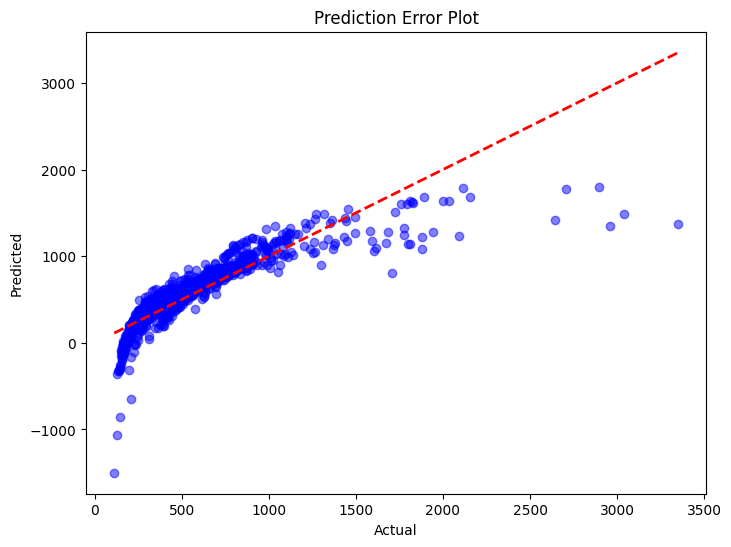

In [ ]:
plt.figure(figsize=(8, 6))
plt.scatter(y_rg_val, y_pred, alpha=0.5, color='blue')
plt.plot([y_rg_val.min(), y_rg_val.max()], [y_rg_val.min(), y_rg_val.max()], 'r--', lw=2)
plt.xlabel("Actual")
plt.ylabel("Predicted")
plt.title(f"Prediction Error Plot")
plt.show()

In [ ]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

mae = mean_absolute_error(y_rg_val, y_pred)
mse = mean_squared_error(y_rg_val, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_rg_val, y_pred)

print("Evaluation Metrics:")
print(f"MAE: {mae:.2f}")
print(f"MSE: {mse:.2f}")
print(f"RMSE: {rmse:.2f}")
print(f"R²: {r2:.4f}")

Evaluation Metrics:
MAE: 106.63
MSE: 33510.57
RMSE: 183.06
R²: 0.7500


Berdasarkan **prediction error plot** dan pipeline yang digunakan, berikut adalah analisis terkait pemilihan **MinMaxScaler** dan **Ridge Regression** dalam meningkatkan performa model:

1. Penggunaan **MinMaxScaler** dalam pipeline ini dipilih, karena data yang memiliki skala yang berbeda-beda. MinMaxScaler menormalkan fitur ke dalam rentang [0,1], yang memastikan bahwa semua fitur berkontribusi secara proporsional dalam pelatihan model. Hal ini sangat berguna ketika ada fitur dengan skala besar yang dapat mendominasi model. Dengan menormalkan fitur, model tidak akan terpengaruh oleh perbedaan skala antara fitur, sehingga setiap fitur memiliki pengaruh yang lebih seimbang. Oleh karena itu, menggunakan MinMaxScaler dipilih untuk menghindari bias yang dapat terjadi ketika fitur dengan skala yang lebih besar lebih mempengaruhi pembelajaran model.

2. **Ridge Regression** dipilih karena kemampuannya untuk menangani   
   **multikolinearitas** dan **overfitting**. Dengan menambahkan **regularisasi L2**, Ridge Regression menarik koefisien regresi menuju nol, yang mengurangi varians dan meningkatkan stabilitas model. Regularisasi ini juga membantu menghindari estimasi koefisien yang tidak stabil akibat kolinearitas antar fitur.

  Pemilihan **alpha=0.5** didasarkan pada hasil yang lebih optimal dibandingkan dengan alpha 0.1 dan 1. Nilai alpha ini memberikan keseimbangan yang lebih baik antara  **underfitting** dan **overfitting**, sehingga memungkinkan model untuk menangkap pola data lebih baik tanpa terlalu sensitif terhadap noise.

  
Berdasarkan nilai **R²**, model dengan MinMaxScaler dan Ridge Regression menunjukkan performa yang lebih baik dibandingkan menggunakan **StandardScaler** dan **RobustScaler**.

Referensi:  
* https://www.geeksforgeeks.org/what-is-ridge-regression/
* https://stackoverflow.com/questions/62178888/can-someone-explain-to-me-how-minmaxscaler-works

#### Predict data test

In [ ]:
df_test_rr = pd.read_csv("https://drive.google.com/uc?id=1ovJcICAqyP-O87bQulC8e8b6jcyrcsd6")

id_test = df_test_rr['id'].copy()
df_test_rr.drop(["id", "user_id"], axis=1, inplace=True)

##### Handle Missing Values

In [ ]:
# Cek missing values awal
print("Missing values before:")
print(df_test_rr.isnull().sum())

Missing values before:
user_age_group           0
attempt_date             0
smt_rank                 0
smt_avg_spd              0
smt_name                 0
user_weight_category    39
act_title                0
act_avg_spd              0
act_max_spd              0
act_total_km             0
act_moving_seconds       0
act_total_seconds        0
has_hr_data              0
gender                   0
dtype: int64


In [ ]:
mode_value = df_test_rr['user_weight_category'].mode()[0]
df_test_rr['user_weight_category'] = df_test_rr['user_weight_category'].fillna(mode_value)

##### Encode Data

In [ ]:
df_test_rr = pd.get_dummies(df_test_rr, columns=['smt_name'])
df_test_rr.head()

,user_age_group,attempt_date,smt_rank,smt_avg_spd,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,...,gender,smt_name_Al Fardoos to shellfish round about,smt_name_Headquarters Business Park,smt_name_King Street side,smt_name_North Corniche,smt_name_Obhur North Short,smt_name_Oghor 2 SailsIsland,smt_name_PRINCE SULTAN - ASSALAM TO FATIMA,smt_name_S.Ubhur Alkurnaysh South Bound with detour,smt_name_Starbucks to Majid
0,25 to 34,2018-07-15,33,36.9,65 to 74 kg,Night Ride,34.6,50.8,41.61,4326,...,male,False,False,False,False,False,False,True,False,False
1,25 to 34,2018-01-03,181,26.2,75 to 84 kg,احلى تمرين مع دراج جدة two hearts person bikin...,25.4,40.3,45.37,6427,...,male,False,False,False,False,False,False,False,False,True
2,25 to 34,2019-07-19,3,56.0,54 kg and under,Afternoon Ride,22.6,85.3,78.45,12507,...,male,False,False,False,False,False,True,False,False,False
3,45 to 54,2018-06-22,142,11.1,75 to 84 kg,Morning Ride,12.1,16.9,21.01,6254,...,male,False,False,False,True,False,False,False,False,False
4,35 to 44,2018-08-29,216,22.2,85 to 95 kg,تمرين جميل مع دراج جدة red heart,21.9,45.7,57.15,9398,...,male,False,False,False,False,False,False,False,False,True


In [ ]:
df_test_rr['gender'] = df_test_rr['gender'].map({'female': 1, 'male':2})
df_test_rr.head()

,user_age_group,attempt_date,smt_rank,smt_avg_spd,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,...,gender,smt_name_Al Fardoos to shellfish round about,smt_name_Headquarters Business Park,smt_name_King Street side,smt_name_North Corniche,smt_name_Obhur North Short,smt_name_Oghor 2 SailsIsland,smt_name_PRINCE SULTAN - ASSALAM TO FATIMA,smt_name_S.Ubhur Alkurnaysh South Bound with detour,smt_name_Starbucks to Majid
0,25 to 34,2018-07-15,33,36.9,65 to 74 kg,Night Ride,34.6,50.8,41.61,4326,...,2,False,False,False,False,False,False,True,False,False
1,25 to 34,2018-01-03,181,26.2,75 to 84 kg,احلى تمرين مع دراج جدة two hearts person bikin...,25.4,40.3,45.37,6427,...,2,False,False,False,False,False,False,False,False,True
2,25 to 34,2019-07-19,3,56.0,54 kg and under,Afternoon Ride,22.6,85.3,78.45,12507,...,2,False,False,False,False,False,True,False,False,False
3,45 to 54,2018-06-22,142,11.1,75 to 84 kg,Morning Ride,12.1,16.9,21.01,6254,...,2,False,False,False,True,False,False,False,False,False
4,35 to 44,2018-08-29,216,22.2,85 to 95 kg,تمرين جميل مع دراج جدة red heart,21.9,45.7,57.15,9398,...,2,False,False,False,False,False,False,False,False,True


In [ ]:
age_mapping = {
    '19 and under': 0,
    '20 to 24': 1,
    '25 to 34': 2,
    '35 to 44': 3,
    '45 to 54': 4,
    '55 to 64': 5,
    '65 to 69': 6,
    '70 to 74': 7,
    '75+': 8
}
df_test_rr['user_age_group'] = df_test_rr['user_age_group'].map(age_mapping)
df_test_rr.head()

,user_age_group,attempt_date,smt_rank,smt_avg_spd,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,...,gender,smt_name_Al Fardoos to shellfish round about,smt_name_Headquarters Business Park,smt_name_King Street side,smt_name_North Corniche,smt_name_Obhur North Short,smt_name_Oghor 2 SailsIsland,smt_name_PRINCE SULTAN - ASSALAM TO FATIMA,smt_name_S.Ubhur Alkurnaysh South Bound with detour,smt_name_Starbucks to Majid
0,2,2018-07-15,33,36.9,65 to 74 kg,Night Ride,34.6,50.8,41.61,4326,...,2,False,False,False,False,False,False,True,False,False
1,2,2018-01-03,181,26.2,75 to 84 kg,احلى تمرين مع دراج جدة two hearts person bikin...,25.4,40.3,45.37,6427,...,2,False,False,False,False,False,False,False,False,True
2,2,2019-07-19,3,56.0,54 kg and under,Afternoon Ride,22.6,85.3,78.45,12507,...,2,False,False,False,False,False,True,False,False,False
3,4,2018-06-22,142,11.1,75 to 84 kg,Morning Ride,12.1,16.9,21.01,6254,...,2,False,False,False,True,False,False,False,False,False
4,3,2018-08-29,216,22.2,85 to 95 kg,تمرين جميل مع دراج جدة red heart,21.9,45.7,57.15,9398,...,2,False,False,False,False,False,False,False,False,True


In [ ]:
weight_mapping = {
    '54 kg and under': 0,
    '55 to 64 kg': 1,
    '65 to 74 kg': 2,
    '75 to 84 kg': 3,
    '85 to 95 kg': 4,
    '95 kg to 104 kg': 5,
    '105 kg to 114 kg': 6,
    '115 kg and over': 7
}
df_test_rr['user_weight_category'] = df_test_rr['user_weight_category'].map(weight_mapping)

In [ ]:
freq_map = df_test_rr['act_title'].value_counts(normalize=True)
df_test_rr['act_title'] = df_test_rr['act_title'].map(freq_map)

In [ ]:
df_test_rr['attempt_date'] = pd.to_datetime(df_test_rr['attempt_date'])
df_test_rr['attempt_year'] = df_test_rr['attempt_date'].dt.year
df_test_rr['attempt_month'] = df_test_rr['attempt_date'].dt.month
df_test_rr['attempt_day'] = df_test_rr['attempt_date'].dt.day
df_test_rr = df_test_rr.drop('attempt_date', axis=1)

In [ ]:
df_test_rr.isnull().sum()

,0
user_age_group,0
smt_rank,0
smt_avg_spd,0
user_weight_category,0
act_title,0
act_avg_spd,0
act_max_spd,0
act_total_km,0
act_moving_seconds,0
act_total_seconds,0


#### Predict data test

In [ ]:
test_predictions_rr = pipeline_rr.predict(df_test_rr[X_rg_train.columns])

#Buat file submission

submission = pd.DataFrame({
'id': id_test,  # Gunakan id yang sudah disimpan
'smt_finish_seconds': test_predictions_rr
})

submission.to_csv('submission_RR.csv', index=False)
submission.head()

,id,smt_finish_seconds
0,2699,148.251116
1,332,624.485375
2,3282,-502.462159
3,5891,1229.513157
4,858,752.338419


## Random Forest with Hypertuning


In [ ]:
df_rf = df_rg.copy()
df_rf.head()

,user_age_group,gender,smt_rank,smt_avg_spd,smt_finish_seconds,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,...,smt_name_King Street side,smt_name_North Corniche,smt_name_Obhur North Short,smt_name_Oghor 2 SailsIsland,smt_name_PRINCE SULTAN - ASSALAM TO FATIMA,smt_name_S.Ubhur Alkurnaysh South Bound with detour,smt_name_Starbucks to Majid,attempt_year,attempt_month,attempt_day
0,2,2,712,15.8,382,0,0.132072,13.6,34.9,19.24,...,False,False,False,False,False,False,False,2017,12,22
1,2,2,189,33.2,216,6,0.132072,21.5,43.2,23.47,...,False,False,False,True,False,False,False,2015,4,13
2,2,2,264,23.7,593,3,0.281310,26.7,92.9,38.23,...,False,False,False,False,False,False,True,2018,2,7
3,2,2,50,33.4,817,3,0.092498,31.4,54.4,65.77,...,False,False,False,False,False,False,False,2018,8,24
4,2,1,19,21.3,284,0,0.000477,19.9,43.2,96.53,...,False,False,False,False,False,False,False,2020,3,6


### Proses Modeling

In [ ]:
X_rf = df_rf.drop(columns=['smt_finish_seconds'])
y_rf = df_rf['smt_finish_seconds']

In [ ]:
# Split dataset menjadi training dan testing
X_rf_train, X_rf_test, y_rf_train, y_rf_test = train_test_split(X_rf, y_rf, test_size=0.2, random_state=42)

In [ ]:
from sklearn.preprocessing import MinMaxScaler

# # Melakukan standarisasi (pake MinMaxScaler)
scaler = MinMaxScaler()

X_rf_train[X_rf_train.columns] = scaler.fit_transform(X_rf_train) # Standarisasi data training
X_rf_test[X_rf_test.columns]  = scaler.transform(X_rf_test) # Standarisasi data testing

#### Proses Hyperparameter Tuning

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor

# Definisikan model Random Forest
rf = RandomForestRegressor(random_state=42)

# Definisikan parameter untuk GridSearchCV
param_grid = {
    'n_estimators': [50, 100, 200],      # Jumlah pohon dalam hutan
    'max_depth': [None, 10, 20, 30],    # Kedalaman maksimum pohon
    'min_samples_split': [2, 5, 10],    # Minimum jumlah sampel untuk membagi node
    'min_samples_leaf': [1, 2, 4],      # Minimum jumlah sampel di leaf node
    'max_features': ['auto', 'sqrt']    # Jumlah fitur yang dipertimbangkan untuk split
}

# Setup GridSearchCV
grid_search = GridSearchCV(
    estimator=rf,
    param_grid=param_grid,
    scoring='r2',  # Gunakan R2 untuk evaluasi
    cv=5,                             # Cross-validation dengan 3 folds
    n_jobs=-1                         # Gunakan semua CPU untuk kecepatan
)

# # Fit GridSearchCV pada data training
grid_search.fit(X_rf_train, y_rf_train)

# Tampilkan parameter terbaik
print("Best Parameters:", grid_search.best_params_)

# Evaluasi model terbaik pada data testing
best_rf = grid_search.best_estimator_
best_rf

Best Parameters: {'max_depth': 20, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}


RandomForestRegressor(max_depth=20, max_features='sqrt', random_state=42)

In [ ]:
y_rf_pred = best_rf.predict(X_rf_test)

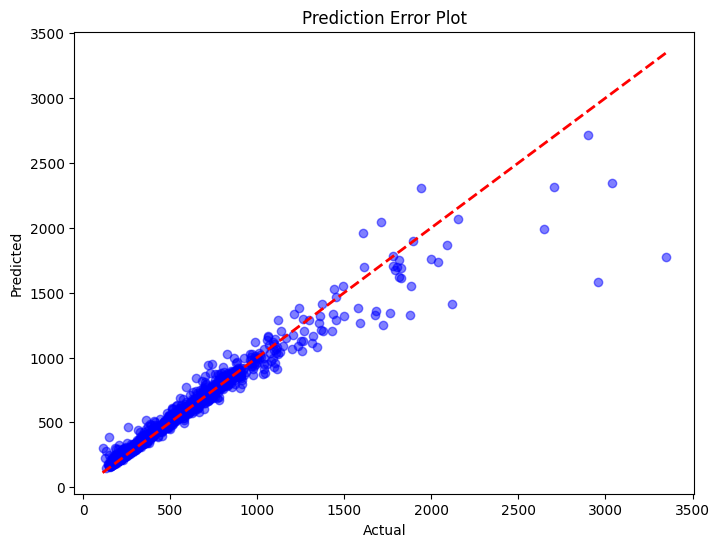

In [ ]:
plt.figure(figsize=(8, 6))
plt.scatter(y_rf_test, y_rf_pred, alpha=0.5, color='blue')
plt.plot([y_rf_test.min(), y_rf_test.max()], [y_rf_test.min(), y_rf_test.max()], 'r--', lw=2)
plt.xlabel("Actual")
plt.ylabel("Predicted")
plt.title(f"Prediction Error Plot")
plt.show()

#### Evaluasi Performa

In [ ]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

mae = mean_absolute_error(y_rf_test, y_rf_pred)
mse = mean_squared_error(y_rf_test, y_rf_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_rf_test, y_rf_pred)

print("Evaluation Metrics:")
print(f"MAE: {mae:.2f}")
print(f"MSE: {mse:.2f}")
print(f"RMSE: {rmse:.2f}")
print(f"R²: {r2:.4f}")

Evaluation Metrics:
MAE: 36.02
MSE: 8174.51
RMSE: 90.41
R²: 0.9390


### Test Data

#### Load and Process Data

In [ ]:
df_test_rf = pd.read_csv("https://drive.google.com/uc?id=1ovJcICAqyP-O87bQulC8e8b6jcyrcsd6")


In [ ]:
id_test = df_test_rf['id'].copy()


#### Check Missing Values

In [ ]:
# Cek missing values awal
print("Missing values before:")
print(df_test_rf.isnull().sum())

Missing values before:
user_age_group           0
user_id                  0
attempt_date             0
smt_rank                 0
smt_avg_spd              0
smt_name                 0
user_weight_category    39
act_title                0
act_avg_spd              0
act_max_spd              0
act_total_km             0
act_moving_seconds       0
act_total_seconds        0
has_hr_data              0
id                       0
gender                   0
dtype: int64


In [ ]:
mode_value = df_test_rf['user_weight_category'].mode()[0]
df_test_rf['user_weight_category'] = df_test_rf['user_weight_category'].fillna(mode_value)

#### Encode data

In [ ]:
df_test_rf = pd.get_dummies(df_test_rf, columns=['smt_name'])
df_test_rf.head()

,user_age_group,user_id,attempt_date,smt_rank,smt_avg_spd,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,...,gender,smt_name_Al Fardoos to shellfish round about,smt_name_Headquarters Business Park,smt_name_King Street side,smt_name_North Corniche,smt_name_Obhur North Short,smt_name_Oghor 2 SailsIsland,smt_name_PRINCE SULTAN - ASSALAM TO FATIMA,smt_name_S.Ubhur Alkurnaysh South Bound with detour,smt_name_Starbucks to Majid
0,25 to 34,564,2018-07-15,33,36.9,65 to 74 kg,Night Ride,34.6,50.8,41.61,...,male,False,False,False,False,False,False,True,False,False
1,25 to 34,323,2018-01-03,181,26.2,75 to 84 kg,احلى تمرين مع دراج جدة two hearts person bikin...,25.4,40.3,45.37,...,male,False,False,False,False,False,False,False,False,True
2,25 to 34,149,2019-07-19,3,56.0,54 kg and under,Afternoon Ride,22.6,85.3,78.45,...,male,False,False,False,False,False,True,False,False,False
3,45 to 54,1027,2018-06-22,142,11.1,75 to 84 kg,Morning Ride,12.1,16.9,21.01,...,male,False,False,False,True,False,False,False,False,False
4,35 to 44,823,2018-08-29,216,22.2,85 to 95 kg,تمرين جميل مع دراج جدة red heart,21.9,45.7,57.15,...,male,False,False,False,False,False,False,False,False,True


In [ ]:
df_test_rf['gender'] = df_test_rf['gender'].map({'female': 1, 'male':2})
df_test_rf.head()

,user_age_group,user_id,attempt_date,smt_rank,smt_avg_spd,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,...,gender,smt_name_Al Fardoos to shellfish round about,smt_name_Headquarters Business Park,smt_name_King Street side,smt_name_North Corniche,smt_name_Obhur North Short,smt_name_Oghor 2 SailsIsland,smt_name_PRINCE SULTAN - ASSALAM TO FATIMA,smt_name_S.Ubhur Alkurnaysh South Bound with detour,smt_name_Starbucks to Majid
0,25 to 34,564,2018-07-15,33,36.9,65 to 74 kg,Night Ride,34.6,50.8,41.61,...,2,False,False,False,False,False,False,True,False,False
1,25 to 34,323,2018-01-03,181,26.2,75 to 84 kg,احلى تمرين مع دراج جدة two hearts person bikin...,25.4,40.3,45.37,...,2,False,False,False,False,False,False,False,False,True
2,25 to 34,149,2019-07-19,3,56.0,54 kg and under,Afternoon Ride,22.6,85.3,78.45,...,2,False,False,False,False,False,True,False,False,False
3,45 to 54,1027,2018-06-22,142,11.1,75 to 84 kg,Morning Ride,12.1,16.9,21.01,...,2,False,False,False,True,False,False,False,False,False
4,35 to 44,823,2018-08-29,216,22.2,85 to 95 kg,تمرين جميل مع دراج جدة red heart,21.9,45.7,57.15,...,2,False,False,False,False,False,False,False,False,True


In [ ]:
age_mapping = {
    '19 and under': 0,
    '20 to 24': 1,
    '25 to 34': 2,
    '35 to 44': 3,
    '45 to 54': 4,
    '55 to 64': 5,
    '65 to 69': 6,
    '70 to 74': 7,
    '75+': 8
}
df_test_rf['user_age_group'] = df_test_rf['user_age_group'].map(age_mapping)
df_test_rf.head()

,user_age_group,user_id,attempt_date,smt_rank,smt_avg_spd,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,...,gender,smt_name_Al Fardoos to shellfish round about,smt_name_Headquarters Business Park,smt_name_King Street side,smt_name_North Corniche,smt_name_Obhur North Short,smt_name_Oghor 2 SailsIsland,smt_name_PRINCE SULTAN - ASSALAM TO FATIMA,smt_name_S.Ubhur Alkurnaysh South Bound with detour,smt_name_Starbucks to Majid
0,2,564,2018-07-15,33,36.9,65 to 74 kg,Night Ride,34.6,50.8,41.61,...,2,False,False,False,False,False,False,True,False,False
1,2,323,2018-01-03,181,26.2,75 to 84 kg,احلى تمرين مع دراج جدة two hearts person bikin...,25.4,40.3,45.37,...,2,False,False,False,False,False,False,False,False,True
2,2,149,2019-07-19,3,56.0,54 kg and under,Afternoon Ride,22.6,85.3,78.45,...,2,False,False,False,False,False,True,False,False,False
3,4,1027,2018-06-22,142,11.1,75 to 84 kg,Morning Ride,12.1,16.9,21.01,...,2,False,False,False,True,False,False,False,False,False
4,3,823,2018-08-29,216,22.2,85 to 95 kg,تمرين جميل مع دراج جدة red heart,21.9,45.7,57.15,...,2,False,False,False,False,False,False,False,False,True


In [ ]:
weight_mapping = {
    '54 kg and under': 0,
    '55 to 64 kg': 1,
    '65 to 74 kg': 2,
    '75 to 84 kg': 3,
    '85 to 95 kg': 4,
    '95 kg to 104 kg': 5,
    '105 kg to 114 kg': 6,
    '115 kg and over': 7
}
df_test_rf['user_weight_category'] = df_test_rf['user_weight_category'].map(weight_mapping)

In [ ]:
freq_map = df_test_rf['act_title'].value_counts(normalize=True)
df_test_rf['act_title'] = df_test_rf['act_title'].map(freq_map)

In [ ]:
df_test_rf['attempt_date'] = pd.to_datetime(df_test_rf['attempt_date'])
df_test_rf['attempt_year'] = df_test_rf['attempt_date'].dt.year
df_test_rf['attempt_month'] = df_test_rf['attempt_date'].dt.month
df_test_rf['attempt_day'] = df_test_rf['attempt_date'].dt.day
df_test_rf = df_test_rf.drop('attempt_date', axis=1)

In [ ]:
df_test_rf.isnull().sum()

,0
user_age_group,0
user_id,0
smt_rank,0
smt_avg_spd,0
user_weight_category,0
act_title,0
act_avg_spd,0
act_max_spd,0
act_total_km,0
act_moving_seconds,0


#### Predict data test

In [ ]:
test_rf_predictions = best_rf.predict(df_test_rf[X_rg_train.columns])

# Membuat file untuk submission kaggle
submission = pd.DataFrame({
'id': id_test,  # Gunakan id yang sudah disimpan
'smt_finish_seconds': test_rf_predictions
})

submission.to_csv('CSL_Submission_RF_with_Hypertune.csv', index=False)
submission

NameError: name 'best_rf' is not defined

## KNN Regressor with Hypertuning

### Load Data

In [ ]:
df_knn = df_clean.copy()
df_knn.head()

,user_age_group,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data
0,25 to 34,2017-12-22,male,712,15.8,382,Headquarters Business Park,54 kg and under,Night Ride,13.6,34.9,19.24,5103,5103,0
1,25 to 34,2015-04-13,male,189,33.2,216,Oghor 2 SailsIsland,105 kg to 114 kg,Night Ride,21.5,43.2,23.47,3926,3926,0
2,25 to 34,2018-02-07,male,264,23.7,593,Starbucks to Majid,75 to 84 kg,Evening Ride,26.7,92.9,38.23,5152,5152,0
3,25 to 34,2018-08-24,male,50,33.4,817,Al Fardoos to shellfish round about,75 to 84 kg,Afternoon Ride,31.4,54.4,65.77,7548,7548,1
4,25 to 34,2020-03-06,female,19,21.3,284,Headquarters Business Park,54 kg and under,ثاني تمرين ١٠٠كم,19.9,43.2,96.53,17493,17493,0


### Encode Data

Mencari fitur kategorikal per-kolom untuk di encode.

In [ ]:
# Mencari Tiap Nilai Unik Per Kolom
for column in df_knn.select_dtypes(include=['object', 'category']).columns:
    unique_vals = df_knn[column].unique()
    print(f"Unique values in '{column}': {unique_vals}\n")

Unique values in 'user_age_group': ['25 to 34' '19 and under' '35 to 44' '55 to 64' '45 to 54' '20 to 24'
 '65 to 69' '75+' '70 to 74']

Unique values in 'attempt_date': ['2017-12-22' '2015-04-13' '2018-02-07' ... '2016-04-21' '2019-08-31'
 '2019-04-25']

Unique values in 'gender': ['male' 'female']

Unique values in 'smt_name': ['Headquarters Business Park' 'Oghor 2 SailsIsland' 'Starbucks to Majid'
 'Al Fardoos to shellfish round about' 'North Corniche' 'King Street side'
 'S.Ubhur Alkurnaysh South Bound with detour' 'Obhur North Short'
 'PRINCE SULTAN - ASSALAM TO FATIMA']

Unique values in 'user_weight_category': ['54 kg and under' '105 kg to 114 kg' '75 to 84 kg' '65 to 74 kg'
 '115 kg and over' '85 to 95 kg' '95 kg to 104 kg' '55 to 64 kg']

Unique values in 'act_title': ['Night Ride' 'Evening Ride' 'Afternoon Ride' ...
 'Evening Ride مسائي للوحوش' 'Evening Ride With Jeddah Cyclists '
 'Nice Relaxed Ride next the Red Sea']



In [ ]:
# Mapping
gender_mapper = {'female': 1, 'male': 2 }
df_knn['gender'] =df_knn['gender'].map(gender_mapper)

mapping = {
    'Starbucks to Majid': 0,
    'King Street side': 1,
    'Al Fardoos to shellfish round about': 2,
    'Headquarters Business Park': 3,
    'PRINCE SULTAN - ASSALAM TO FATIMA': 4,
    'Oghor 2 SailsIsland': 5,
    'Obhur North Short': 6,
    'North Corniche': 7,
    'S.Ubhur Alkurnaysh South Bound with detour': 8
}

df_knn['smt_name'] = df_knn['smt_name'].map(mapping)

# Frequency Encoding
frequency_encoding_act = df_knn['act_title'].value_counts(normalize=True)
df_knn['act_title'] = df_knn['act_title'].map(frequency_encoding_act)

# Time-Based Encoding
df_knn['attempt_date'] = pd.to_datetime(df_knn['attempt_date'])
df_knn['attempt_year'] = df_knn['attempt_date'].dt.year
df_knn['attempt_month'] = df_knn['attempt_date'].dt.month
df_knn['attempt_day'] = df_knn['attempt_date'].dt.day
df_knn = df_knn.drop('attempt_date', axis=1)

# Ordinal Encoding
weight_mapper = {
    '54 kg and under': 0,
    '55 to 64 kg': 1,
    '65 to 74 kg': 2,
    '75 to 84 kg': 3,
    '85 to 95 kg': 4,
    '95 kg to 104 kg': 5,
    '105 kg to 114 kg': 6,
    '115 kg and over': 7
}
df_knn['user_weight_category'] = df_knn['user_weight_category'].map(weight_mapper)

age_mapper = {
    '19 and under': 0,
    '20 to 24': 1,
    '25 to 34': 2,
    '35 to 44': 3,
    '45 to 54': 4,
    '55 to 64': 5,
    '65 to 69': 6,
    '70 to 74': 7,
    '75+': 8
}
df_knn['user_age_group'] = df_knn['user_age_group'].map(age_mapper)




# Menampilan Data
df_knn.head()

,user_age_group,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,attempt_year,attempt_month,attempt_day
0,2,2,712,15.8,382,3,0,0.132072,13.6,34.9,19.24,5103,5103,0,2017,12,22
1,2,2,189,33.2,216,5,6,0.132072,21.5,43.2,23.47,3926,3926,0,2015,4,13
2,2,2,264,23.7,593,0,3,0.281310,26.7,92.9,38.23,5152,5152,0,2018,2,7
3,2,2,50,33.4,817,2,3,0.092498,31.4,54.4,65.77,7548,7548,1,2018,8,24
4,2,1,19,21.3,284,3,0,0.000477,19.9,43.2,96.53,17493,17493,0,2020,3,6


**Penjelasan:**
- Mapping: data kategorikal yang disesuaikan semau kita tanpa ada urutan.
- Frequency encoding: karena ada banyak kategori yg tidak pakai urutan
- Ordinal encoding: kategorikal tapi berurutan
- Time-based encoding: mengubah informasi waktu (seperti tanggal, bulan, tahun, waktu dalam sehari, dll.) menjadi fitur numerik

Sebenarnya di sini, saya ingin menggunakan One-Hot Encoding untuk `smt_name`. Akan tetapi, encoding ini dapat meningkatkan dimensi data secara signifikan sehingga dapat menyebabkan seperti overfitting atau kompleksitas yang tinggi.

**Sumber:**
- https://letsdatascience.com/frequency-encoding/
- https://medium.com/@WojtekFulmyk/ordinal-encoding-a-brief-explanation-a29cf374dbc1

### Handle Outlier

In [ ]:
def hitung_outlier(df) :
    outliers_dict = {}
    outliers_percentage_dict = {}

    numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']

    for col in df.select_dtypes(include=numerics) :
        q1 = np.percentile(df[col], 25)
        q3 = np.percentile(df[col], 75)
        iqr = q3 - q1
        outliers = df[col][
            (df[col] > q3 + 1.5 * iqr) |
            (df[col] < q1 - 1.5 * iqr)
        ]
        outliers_dict[col] = len(outliers)
        outliers_percentage_dict[col] = (len(outliers) / len(df)) * 100

    outliers_values = tuple(outliers_dict.values())
    outliers_percentage_values = tuple(outliers_percentage_dict.values())

    outliers_df = pd.DataFrame([outliers_values, outliers_percentage_values],
                            columns=list(outliers_dict.keys()),
                            index=['Outliers count', 'Outliers percentage (%)'])
    display(outliers_df)

In [ ]:
# Cek outlier
hitung_outlier(df_knn)

,user_age_group,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,attempt_year,attempt_month,attempt_day
Outliers count,483.000000,253.000000,163.000000,53.000000,288.000000,0.0,0.0,0.0,94.000000,375.000000,308.000000,296.000000,296.000000,1236.000000,91.000000,0.0,0.0
Outliers percentage (%),7.676414,4.020979,2.590591,0.842339,4.577241,0.0,0.0,0.0,1.493961,5.959949,4.895105,4.704387,4.704387,19.643992,1.446281,0.0,0.0


<Axes: >

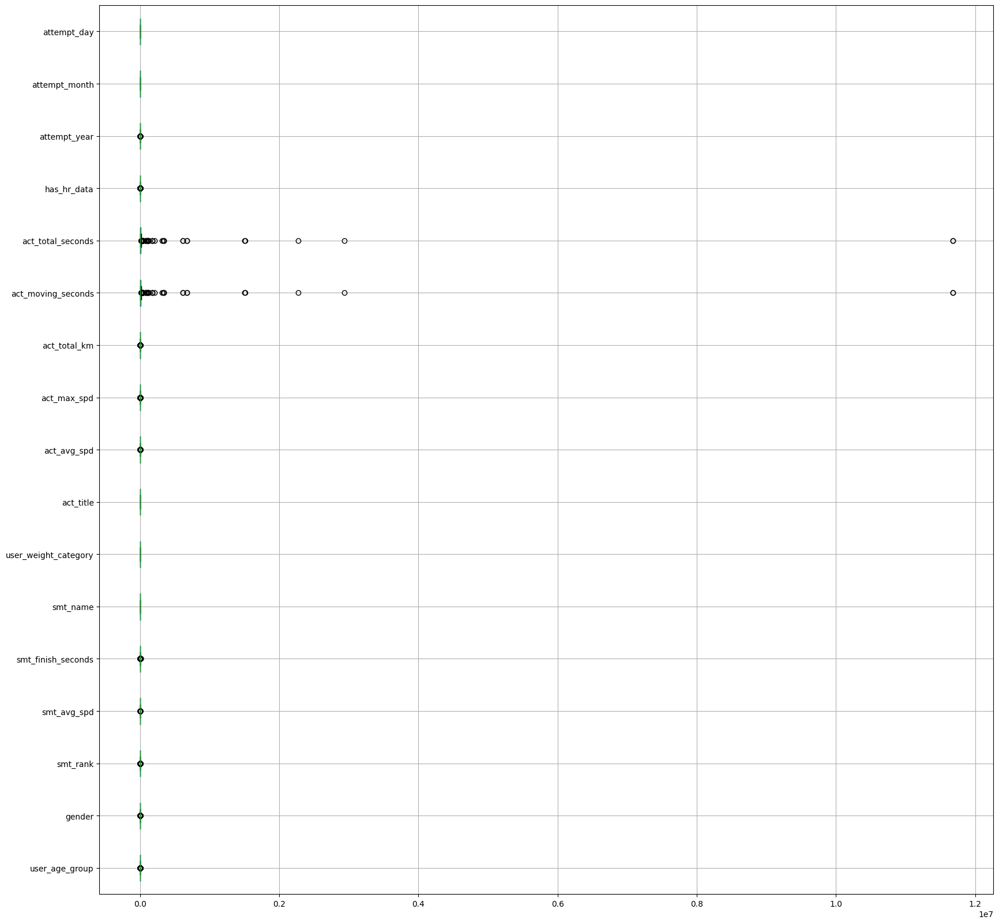

In [ ]:
df_knn.boxplot(vert=False, figsize=(20,20))

In [ ]:
# Hapus outlier yang tak wajar
def hapus_outliers_tertinggi(df, col, percentage=15):
    q1 = np.percentile(df[col], 25)
    q3 = np.percentile(df[col], 75)
    iqr = q3 - q1

    outliers = df[col] > (q3 + 1.5 * iqr)
    outliers_index = df[outliers].index

    # Ambil 30% nilai tertinggi di antara outliers
    outliers_values = df.loc[outliers_index, col].sort_values(ascending=False)
    n_remove = int(len(outliers_values) * (percentage / 100))
    to_remove = outliers_values.head(n_remove).index

    return df.drop(index=to_remove)

df_knn = hapus_outliers_tertinggi(df_knn, 'act_total_seconds', percentage=15)
df_knn = hapus_outliers_tertinggi(df_knn, 'act_moving_seconds', percentage=15)
df_knn = hapus_outliers_tertinggi(df_knn, 'smt_finish_seconds', percentage=15)
df_knn = hapus_outliers_tertinggi(df_knn, 'act_max_spd', percentage=15)

In [ ]:
# Periksa outlier
hitung_outlier(df_knn)

,user_age_group,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,attempt_year,attempt_month,attempt_day
Outliers count,461.000000,241.000000,156.000000,43.0000,235.000000,0.0,0.0,0.0,63.000000,300.00000,256.000000,216.000000,216.000000,1229.000000,90.000000,0.0,0.0
Outliers percentage (%),7.531449,3.937265,2.548603,0.7025,3.839242,0.0,0.0,0.0,1.029244,4.90116,4.182323,3.528835,3.528835,20.078419,1.470348,0.0,0.0


Jadi, fungsi penghapusan outlier tersebut digunakan untuk menghapus nilai tertinggi dari outlier agar dapat membantu mengurangi pengaruh ekstrem terhadap algoritma machine learning.

<Axes: >

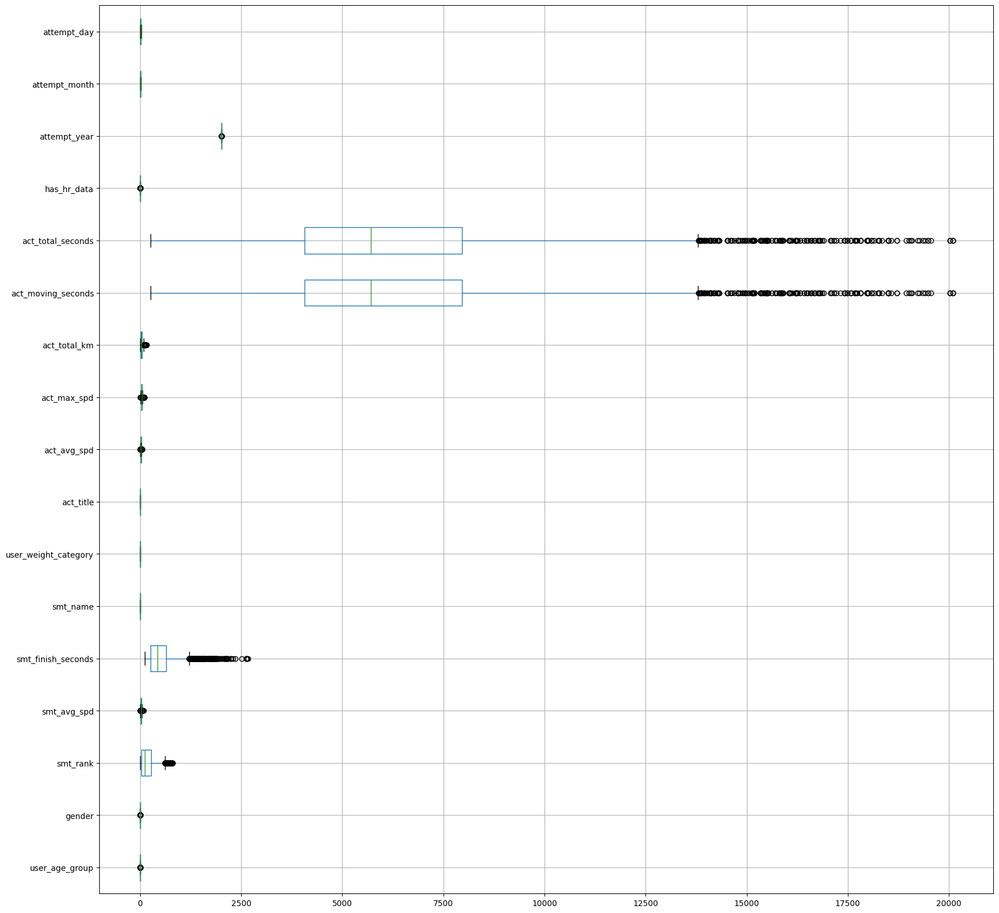

In [ ]:
df_knn.boxplot(vert=False, figsize=(20,20))

### Proses Modelling

In [ ]:
X_raw = df_knn.drop(["smt_finish_seconds"],axis=1)
y    = df_knn["smt_finish_seconds"]

In [ ]:
# Split data
X_train, X_test, y_train, y_test = train_test_split(X_raw , y , test_size=0.2, random_state=42)

In [ ]:
# Scaling
from sklearn.preprocessing import RobustScaler, StandardScaler, MinMaxScaler

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

**Penjelasan:**
- Karena sudah ditangani outlier yang ekstrem dalam data sebelumnya, kita bisa menggunakan `StandardScaler`. Scaler ini bekerja dengan cara menstandarkan data sehingga punya mean = 0 dan standar deviasi = 1.
- Menggunakan scaler, menyebabkan distribusi data menjadi lebih seimbang.

**Sumber:**
- https://www.geeksforgeeks.org/what-is-standardscaler/

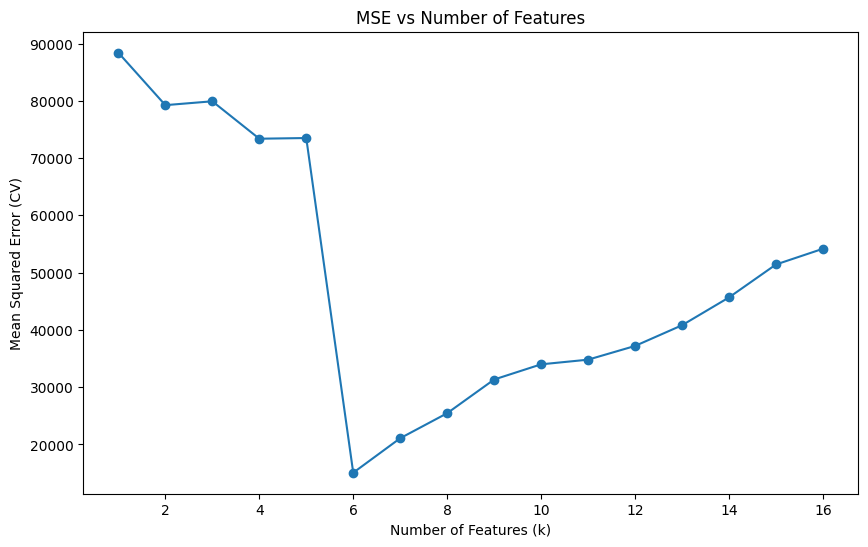

Optimal number of features (k): 6
Minimum MSE: 15058.106


In [ ]:
from sklearn.neighbors import KNeighborsRegressor
import matplotlib.pyplot as plt
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.model_selection import cross_val_score

# Cari jumlah fitur \(k\) optimal untuk KNN
max_k = X_train_scaled.shape[1]
k_range = range(1, max_k + 1)
cv_scores = []

for k in k_range:
    selector = SelectKBest(score_func=f_regression, k=k)
    X_train_selected = selector.fit_transform(X_train_scaled, y_train)

    knn = KNeighborsRegressor(n_neighbors=5)
    scores = cross_val_score(knn, X_train_selected, y_train, cv=5, scoring='neg_mean_squared_error')
    cv_scores.append(-scores.mean())

# Menentukan \(k\) optimal
k_optimal = k_range[np.argmin(cv_scores)]

# Plot hasil
plt.figure(figsize=(10, 6))
plt.plot(k_range, cv_scores, marker='o')
plt.xlabel('Number of Features (k)')
plt.ylabel('Mean Squared Error (CV)')
plt.title('MSE vs Number of Features')
plt.show()

print(f"Optimal number of features (k): {k_optimal}")
print(f"Minimum MSE: {min(cv_scores):.3f}")

**Penjelasan:**
- Dapat dilihat bahwa ketika jumlah fitur mencapai **k = 6**, MSE turun secara signifikan ke titik terendah. Hal ini menandakan bahwa pada jumlah fitur, model mencapai performa terbaik.
- Namun, setelah **k = 6**, itu meningkat yang berarti adanya overfitting. Hal ini berarti model terlalu kompleks dan tidak bisa generalisasi dengan baik. Jadi, kita gunakan 6 fitur karena optimal.

**Sumber:**
- https://www.researchgate.net/figure/The-relationship-between-the-number-of-features-and-the-MSE-in-the-NN-model-and-the-SVR_fig3_308673665

In [ ]:
# Hypertuning KNN
param_grid = {
    'knn__n_neighbors': range(1, 20),
    'knn__weights': ['uniform', 'distance'],
    'knn__metric': ['euclidean', 'manhattan']
}

# Pipeline untuk seleksi fitur dan KNN
pipeline = Pipeline([
    ('select_features', SelectKBest(score_func=f_regression, k=k_optimal)),
    ('knn', KNeighborsRegressor())
])

# Grid Search untuk Hypertuning
grid_search = GridSearchCV(pipeline, param_grid, cv=5, scoring='r2', n_jobs=-1)

# Fit model
grid_search.fit(X_train_scaled, y_train)

# Evaluasi Model Terbaik
best_model = grid_search.best_estimator_
best_params = grid_search.best_params_
best_score = grid_search.best_score_
test_score = best_model.score(X_test_scaled, y_test)

print("\nHasil Hypertuning KNN Regression:")
print(f"Parameter Terbaik: {best_params}")
print(f"R^2 Score (CV): {best_score:.3f}")
print(f"R^2 Score (Test): {test_score:.3f}")



Hasil Hypertuning KNN Regression:
Parameter Terbaik: {'knn__metric': 'euclidean', 'knn__n_neighbors': 4, 'knn__weights': 'distance'}
R^2 Score (CV): 0.868
R^2 Score (Test): 0.875


In [ ]:
# Evaluasi tambahan dengan model spesifik
KNN_euclidean = KNeighborsRegressor(n_neighbors=2, metric='euclidean', weights='distance')
KNN_euclidean.fit(X_train_scaled, y_train)

KNeighborsRegressor(metric='euclidean', n_neighbors=2, weights='distance')

In [ ]:
scores = cross_val_score(KNN_euclidean, X_train_scaled, y_train, scoring='r2', cv=5)
print(f'Hasil Evaluasi cross-validation: {scores.mean()}')

Hasil Evaluasi cross-validation: 0.3893668979007492


In [ ]:
y_pred = KNN_euclidean.predict(X_test_scaled)
y_pred

array([ 383.26177291,  608.3304535 , 1110.8130454 , ...,  320.8212682 ,
        637.22311468,  416.30020366])

In [ ]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

def evaluate_regressor_performance(y_true, y_pred):
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = mse ** 0.5
    r2 = r2_score(y_true, y_pred)

    print("Evaluasi Regressor:")
    print(f"Mean Absolute Error (MAE): {mae:.3f}")
    print(f"Mean Squared Error (MSE): {mse:.3f}")
    print(f"Root Mean Squared Error (RMSE): {rmse:.3f}")
    print(f"R-squared (R^2): {r2:.3f}")
    return {"MAE": mae, "MSE": mse, "RMSE": rmse, "R2": r2}


In [ ]:
y_pred = best_model.predict(X_test_scaled)
evaluate_regressor_performance(y_test, y_pred)

Evaluasi Regressor:
Mean Absolute Error (MAE): 43.043
Mean Squared Error (MSE): 14001.138
Root Mean Squared Error (RMSE): 118.326
R-squared (R^2): 0.875


{'MAE': 43.04256048455463,
 'MSE': 14001.13807782921,
 'RMSE': 118.32640482085648,
 'R2': 0.8750979008044267}

### Predict Data Test

In [ ]:
test_data_knn = pd.read_csv("https://drive.google.com/uc?id=1aKPCzUk-U1mOvYiMxuUfa_M2TDu_TMXq")

id_test = test_data_knn['id'].copy()
test_data_knn.drop(["id", "user_id"], axis=1, inplace=True)

In [ ]:
# Cek missing values awal
print("Missing values before:")
print(test_data_knn.isnull().sum())

Missing values before:
user_age_group           0
attempt_date             0
smt_rank                 0
smt_avg_spd              0
smt_name                 0
user_weight_category    39
act_title                0
act_avg_spd              0
act_max_spd              0
act_total_km             0
act_moving_seconds       0
act_total_seconds        0
has_hr_data              0
gender                   0
dtype: int64


In [ ]:
mode_value = test_data_knn['user_weight_category'].mode()[0]
test_data_knn['user_weight_category'] = test_data_knn['user_weight_category'].fillna(mode_value)

In [ ]:
# Label Encoding
gender_mapper = {'female': 1, 'male': 2 }
test_data_knn['gender'] =test_data_knn['gender'].map(gender_mapper)

# Frequency Encoding
frequency_encoding_act = test_data_knn['act_title'].value_counts(normalize=True)
test_data_knn['act_title'] = test_data_knn['act_title'].map(frequency_encoding_act)

# Time-Based Encoding
test_data_knn['attempt_date'] = pd.to_datetime(test_data_knn['attempt_date'])
test_data_knn['attempt_year'] = test_data_knn['attempt_date'].dt.year
test_data_knn['attempt_month'] = test_data_knn['attempt_date'].dt.month
test_data_knn['attempt_day'] = test_data_knn['attempt_date'].dt.day
test_data_knn = test_data_knn.drop('attempt_date', axis=1)

# Ordinal Encoding
weight_mapper = {
    '54 kg and under': 0,
    '55 to 64 kg': 1,
    '65 to 74 kg': 2,
    '75 to 84 kg': 3,
    '85 to 95 kg': 4,
    '95 kg to 104 kg': 5,
    '105 kg to 114 kg': 6,
    '115 kg and over': 7
}
test_data_knn['user_weight_category'] = test_data_knn['user_weight_category'].map(weight_mapper)

age_mapper = {
    '19 and under': 0,
    '20 to 24': 1,
    '25 to 34': 2,
    '35 to 44': 3,
    '45 to 54': 4,
    '55 to 64': 5,
    '65 to 69': 6,
    '70 to 74': 7,
    '75+': 8
}
test_data_knn['user_age_group'] = test_data_knn['user_age_group'].map(age_mapper)

mapping = {
    'Starbucks to Majid': 0,
    'King Street side': 1,
    'Al Fardoos to shellfish round about': 2,
    'Headquarters Business Park': 3,
    'PRINCE SULTAN - ASSALAM TO FATIMA': 4,
    'Oghor 2 SailsIsland': 5,
    'Obhur North Short': 6,
    'North Corniche': 7,
    'S.Ubhur Alkurnaysh South Bound with detour': 8
}

test_data_knn['smt_name'] = test_data_knn['smt_name'].map(mapping)

# Menampilan Data
test_data_knn.head()

,user_age_group,smt_rank,smt_avg_spd,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,gender,attempt_year,attempt_month,attempt_day
0,2,33,36.9,4,2,0.149936,34.6,50.8,41.61,4326,4326,0,2,2018,7,15
1,2,181,26.2,0,3,0.002541,25.4,40.3,45.37,6427,6427,0,2,2018,1,3
2,2,3,56.0,5,0,0.094028,22.6,85.3,78.45,12507,12507,0,2,2019,7,19
3,4,142,11.1,7,3,0.213469,12.1,16.9,21.01,6254,6254,0,2,2018,6,22
4,3,216,22.2,0,4,0.001271,21.9,45.7,57.15,9398,9398,0,2,2018,8,29


In [ ]:
# Mengatur ulang urutan kolom fitur agar bisa di-predict
columns = list(test_data_knn.columns)

columns.remove('gender')
columns.insert(1, 'gender')

test_data_knn = test_data_knn[columns]

In [ ]:
test_data_knn.isnull().sum()

,0
user_age_group,0
gender,0
smt_rank,0
smt_avg_spd,0
smt_name,0
user_weight_category,0
act_title,0
act_avg_spd,0
act_max_spd,0
act_total_km,0


In [ ]:
# Prediksi pada Test Data Baru (Consistent with Pipeline)
test_data_scaled = scaler.transform(test_data_knn)  # Scaling test data
knn_predictions = best_model.predict(test_data_scaled)


# Membuat file untuk submission kaggle
submission = pd.DataFrame({
'id': id_test,  # Gunakan id yang sudah disimpan
'smt_finish_seconds': knn_predictions
})

submission.to_csv('submisi_knn.csv', index=False)
submission


,id,smt_finish_seconds
0,2699,188.991439
1,332,537.904630
2,3282,209.372042
3,5891,1456.067254
4,858,655.373571
...,...,...
782,2726,308.567752
783,7350,247.601789
784,4370,403.044691
785,4979,544.978708


# **Clustering**

## K-Means Clustering with Elbow Method

In [ ]:
# Impor library dan modul yang dibutuhkan pada tugas ini (boleh ditambahkan jika kurang)
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
from yellowbrick.cluster import SilhouetteVisualizer
import matplotlib.cm as cm
import scipy.cluster.hierarchy as shc
from sklearn.cluster import AgglomerativeClustering
from sklearn.decomposition import PCA
from sklearn.feature_selection import SelectKBest, f_classif

### Load Data

In [ ]:
df_elb = df_clean.copy()
df_elb.head()

,user_age_group,attempt_date,gender,smt_rank,smt_avg_spd,smt_finish_seconds,smt_name,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data
0,25 to 34,2017-12-22,male,712,15.8,382,Headquarters Business Park,54 kg and under,Night Ride,13.6,34.9,19.24,5103,5103,0
1,25 to 34,2015-04-13,male,189,33.2,216,Oghor 2 SailsIsland,105 kg to 114 kg,Night Ride,21.5,43.2,23.47,3926,3926,0
2,25 to 34,2018-02-07,male,264,23.7,593,Starbucks to Majid,75 to 84 kg,Evening Ride,26.7,92.9,38.23,5152,5152,0
3,25 to 34,2018-08-24,male,50,33.4,817,Al Fardoos to shellfish round about,75 to 84 kg,Afternoon Ride,31.4,54.4,65.77,7548,7548,1
4,25 to 34,2020-03-06,female,19,21.3,284,Headquarters Business Park,54 kg and under,ثاني تمرين ١٠٠كم,19.9,43.2,96.53,17493,17493,0


### Penanganan Standardisasi

In [ ]:
from sklearn.preprocessing import RobustScaler

scaler = RobustScaler()

df_numeric = df_elb.drop(columns=['smt_rank']).select_dtypes(include=['int64', 'float64'])
df_numeric.head()

scaled = scaler.fit_transform(df_numeric)
df_scaled = pd.DataFrame(scaled, columns=df_numeric.columns, index= df_numeric.index)
df_elb = pd.concat([df_elb.drop(columns=df_numeric.columns), df_scaled], axis=1)

**Penjelasan:**
- Standardisasi digunakan untuk memastikan bahwa fitur-fitur memiliki skala yang seragam. Jadi, dapat menghindari dominasi fitur yang punya rentang nilai lebih besar.
- Pada kode ini, digunakan `RobustScaler` untuk menangani kolom numerik, lalu menggabungkan kolom kategorikal dalam dataset. Alasan memakai `RobustScaler` adalah karena lebih robust terhadap keberadaan outliers (outliers dibiarkan) karena scaler ini mengurangi median dari tiap fitur dan membaginya dengan IQR. Dapat dipastikan bahwa data yang punya outliers bisa diproses dengan baik tanpa dipengaruhi nilai ekstrem.
- Dapat dilihat bahwa pada fitur `smt_finish_seconds` terdapat sebesar **4.577%** outliers. Jadi, pilihan `RobustScaler` lebih baik.

**Sumber:**
- https://www.geeksforgeeks.org/standardscaler-minmaxscaler-and-robustscaler-techniques-ml/

### Penanganan Encoding

In [ ]:
# Mencari Tiap Nilai Unik Per Kolom
for column in df_elb.select_dtypes(include=['object', 'category']).columns:
    unique_vals = df_elb[column].unique()
    print(f"Unique values in '{column}': {unique_vals}\n")

Unique values in 'user_age_group': ['25 to 34' '19 and under' '35 to 44' '55 to 64' '45 to 54' '20 to 24'
 '65 to 69' '75+' '70 to 74']

Unique values in 'attempt_date': ['2017-12-22' '2015-04-13' '2018-02-07' ... '2016-04-21' '2019-08-31'
 '2019-04-25']

Unique values in 'gender': ['male' 'female']

Unique values in 'smt_name': ['Headquarters Business Park' 'Oghor 2 SailsIsland' 'Starbucks to Majid'
 'Al Fardoos to shellfish round about' 'North Corniche' 'King Street side'
 'S.Ubhur Alkurnaysh South Bound with detour' 'Obhur North Short'
 'PRINCE SULTAN - ASSALAM TO FATIMA']

Unique values in 'user_weight_category': ['54 kg and under' '105 kg to 114 kg' '75 to 84 kg' '65 to 74 kg'
 '115 kg and over' '85 to 95 kg' '95 kg to 104 kg' '55 to 64 kg']

Unique values in 'act_title': ['Night Ride' 'Evening Ride' 'Afternoon Ride' ...
 'Evening Ride مسائي للوحوش' 'Evening Ride With Jeddah Cyclists '
 'Nice Relaxed Ride next the Red Sea']



In [ ]:
# Label Encoding
gender_mapper = {'female': 1, 'male': 2}
df_elb['gender'] = df_elb['gender'].map(gender_mapper)

seg_mapper = {
    'Starbucks to Majid': 0,
    'King Street side': 1,
    'Al Fardoos to shellfish round about': 2,
    'Headquarters Business Park': 3,
    'PRINCE SULTAN - ASSALAM TO FATIMA': 4,
    'Oghor 2 SailsIsland': 5,
    'Obhur North Short': 6,
    'North Corniche': 7,
    'S.Ubhur Alkurnaysh South Bound with detour': 8
}
df_elb['smt_name'] = df_elb['smt_name'].map(seg_mapper)


# Frequency Encoding
frequency_encoding_act = df_elb['act_title'].value_counts(normalize=True)
df_elb['act_title'] = df_elb['act_title'].map(frequency_encoding_act)

# Time-Based Encoding
df_elb['attempt_date'] = pd.to_datetime(df_elb['attempt_date'])
df_elb['attempt_year'] = df_elb['attempt_date'].dt.year
df_elb['attempt_month'] = df_elb['attempt_date'].dt.month
df_elb['attempt_day'] = df_elb['attempt_date'].dt.day
df_elb = df_elb.drop('attempt_date', axis=1)

# Ordinal Encoding
weight_mapper = {
    '54 kg and under': 0,
    '55 to 64 kg': 1,
    '65 to 74 kg': 2,
    '75 to 84 kg': 3,
    '85 to 95 kg': 4,
    '95 kg to 104 kg': 5,
    '105 kg to 114 kg': 6,
    '115 kg and over': 7
}
df_elb['user_weight_category'] = df_elb['user_weight_category'].map(weight_mapper)

age_mapper = {
    '19 and under': 0,
    '20 to 24': 1,
    '25 to 34': 2,
    '35 to 44': 3,
    '45 to 54': 4,
    '55 to 64': 5,
    '65 to 69': 6,
    '70 to 74': 7,
    '75+': 8
}
df_elb['user_age_group'] = df_elb['user_age_group'].map(age_mapper)

# Menampilan Data
df_elb.head()

,user_age_group,gender,smt_rank,smt_name,user_weight_category,act_title,smt_avg_spd,smt_finish_seconds,act_avg_spd,act_max_spd,act_total_km,act_moving_seconds,act_total_seconds,has_hr_data,attempt_year,attempt_month,attempt_day
0,2,2,712,3,0,0.132072,-0.955357,-0.148052,-1.103896,-0.605042,-0.645993,-0.169477,-0.169477,0.0,2017,12,22
1,2,2,189,5,6,0.132072,0.598214,-0.579221,-0.077922,0.092437,-0.498606,-0.463469,-0.463469,0.0,2015,4,13
2,2,2,264,0,3,0.281310,-0.250000,0.400000,0.597403,4.268908,0.015679,-0.157237,-0.157237,0.0,2018,2,7
3,2,2,50,2,3,0.092498,0.616071,0.981818,1.207792,1.033613,0.975261,0.441239,0.441239,1.0,2018,8,24
4,2,1,19,3,0,0.000477,-0.464286,-0.402597,-0.285714,0.092437,2.047038,2.925315,2.925315,0.0,2020,3,6


**Penjelasan:**
- Label Encoding: digunakan pada `gender` dan `smt_name` untuk mengubah ke bentuk integer secara unique tanpa atau dengan makna tertentu (dapat dilihat kalau fitur ini tidak ada urutan).
- Ordinal Label Encoding: digunakan pada `user_weight_category` dan `user_age_group` untuk mengubah ke bentuk integer secara unique dengan urutan atau tingkatan (dapat dilihat kalau fitur ini ada urutannya).
- Frequency Encoding:
- Date-Time Encoding:

**Sumber:**
- https://medium.com/@vipinnation/unraveling-categorical-variables-understanding-label-ordinal-and-one-hot-encoding-techniques-8f5375151fed
- https://letsdatascience.com/frequency-encoding/

### Pemilihan Fitur

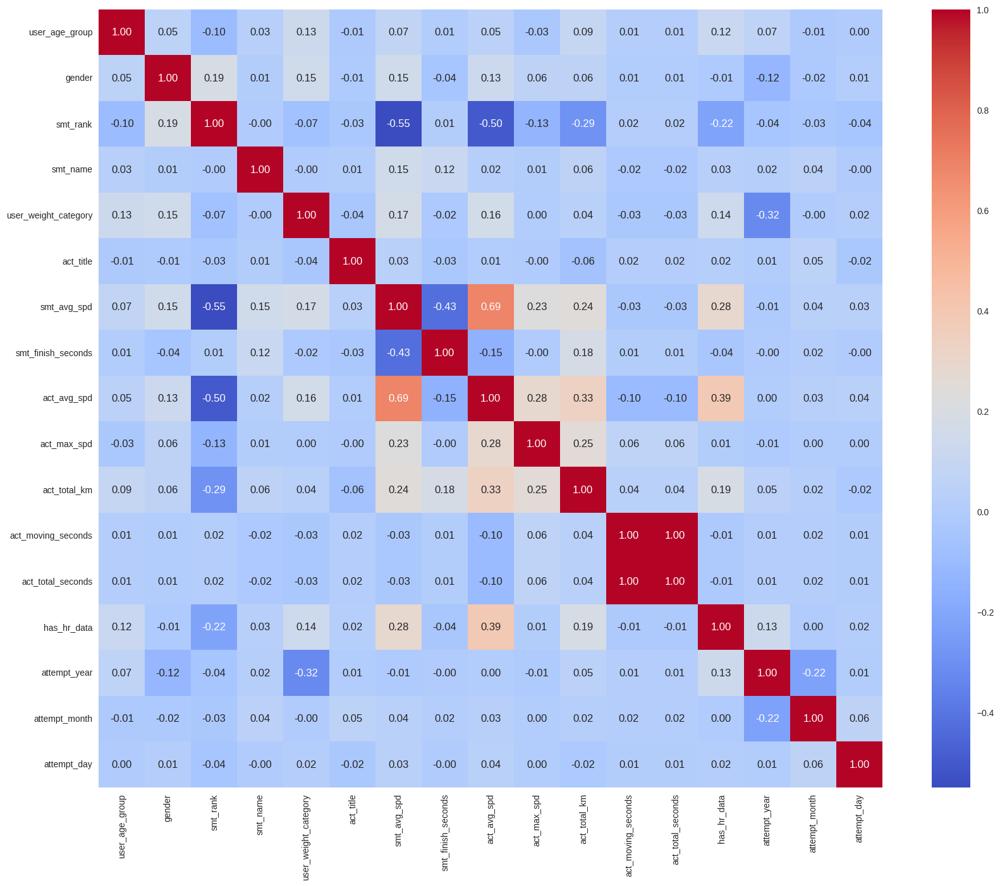

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Hitung matriks korelasi antar fitur
correlation_matrix = df_elb.corr()

# Tampilkan matriks korelasi dengan heatmap
plt.figure(figsize=(20,16))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.show()

In [ ]:
# Membuat dataframe dengan 3 fitur terbaik
df_selected = df_elb[['smt_rank', 'smt_avg_spd', 'smt_finish_seconds']]
display(df_selected.head())

,smt_rank,smt_avg_spd,smt_finish_seconds
0,712,-0.955357,-0.148052
1,189,0.598214,-0.579221
2,264,-0.250000,0.400000
3,50,0.616071,0.981818
4,19,-0.464286,-0.402597


**Penjelasan:**

Berikut adalah alasan terhadap fitur yang saya pilih:
- `smt_rank` dan `smt_avg_spd`: **-0.55** (artinya semakin tinggi kecepatan rata-rata segmen, semakin kecil atau lebih baik peringkatnya)

- `smt_avg_spd` dan `smt_finish_seconds`: **-0.43** (semakin tinggi kecepatan rata-rata segmen, semakin singkat waktu penyelesaian segmen)

**Sumber:**
- https://medium.com/geekculture/feature-selection-in-machine-learning-correlation-matrix-univariate-testing-rfecv-1186168fac12

### Visualisasi Elbow Method

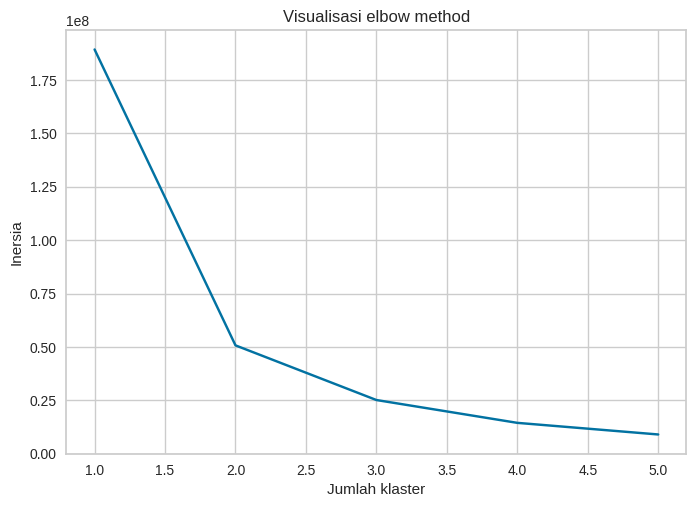

In [ ]:
from sklearn.cluster import KMeans
# Memvisualisasikan elbow method
inertia = []
for cluster in range(1, 6):
    km = KMeans(n_clusters=cluster, n_init=10)
    km = km.fit(df_selected)
    inertia.append(km.inertia_)

plt.plot(range(1, 6), inertia, 'bx-')
plt.xlabel('Jumlah klaster')
plt.ylabel('Inersia')
plt.title('Visualisasi elbow method')
plt.show()

In [ ]:
optimal_k = 2

**Penjelasan:**
- Berdasarkan Elbow Method, kita dapat melihat jumlah klaster yang optimal yaitu **k = 2**.
- Hal ini dapat dilihat dari grafik di mana pada saat **k = 2** terdapat titik "elbow" atau titik di mana penurunan nilai inersia mulai melambat.
- Sebelum **k = 2**, penurunan inersia lebih tajam yang berarti penambahan jumlah klaster memberikan peningkatan yang besar dalam menjelaskan variasi data.
- Akan tetapi, setelah **k = 2**, penurunan inersia jadi jauh lebih kecil yang berarti penambahakn jumlah klaster tidak memberikan peningkatan.

**Sumber:**
- https://www.geeksforgeeks.org/elbow-method-for-optimal-value-of-k-in-kmeans/

### Visualisasi Clustering

In [ ]:
# Latih model sesuai jumlah klaster optimal
kmeans = KMeans(n_clusters=optimal_k, n_init=10)
assignment = kmeans.fit_predict(df_selected)

In [ ]:
# Append hasil clustering ke dataframe
df_with_clusters = pd.DataFrame(df_selected.copy())
df_with_clusters['cluster'] = assignment
df_with_clusters.head()

,smt_rank,smt_avg_spd,smt_finish_seconds,cluster
0,712,-0.955357,-0.148052,1
1,189,0.598214,-0.579221,0
2,264,-0.250000,0.400000,1
3,50,0.616071,0.981818,0
4,19,-0.464286,-0.402597,0


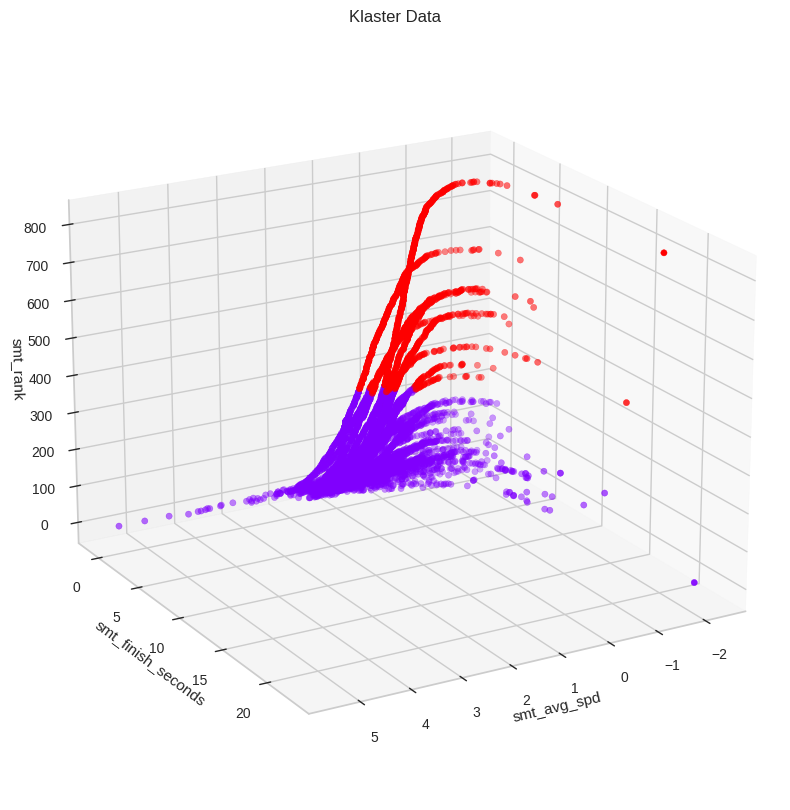

In [ ]:
fig = plt.figure(figsize=(10, 10))
ax = plt.axes(projection="3d")

# Menyiapkan beberapa variabel yang diperlukan untuk visualisasi
x = df_with_clusters['smt_avg_spd']
y = df_with_clusters['smt_finish_seconds']
z = df_with_clusters['smt_rank']
cluster = df_with_clusters['cluster']

# Memvisualisasikan hasilnya
scatter = ax.scatter(x, y, z, c=cluster, cmap="rainbow")
plt.title("Klaster Data")
plt.grid(False)
ax.set_xlabel('smt_avg_spd')
ax.set_ylabel('smt_finish_seconds')
ax.set_zlabel('smt_rank')

# Menyesuaikan sudut pandang untuk tampilan depan
ax.view_init(elev=20, azim=60)  # elev=90 untuk tampilan depan, azim=90 untuk sudut rotasi

# Menampilkan grafik
plt.show()


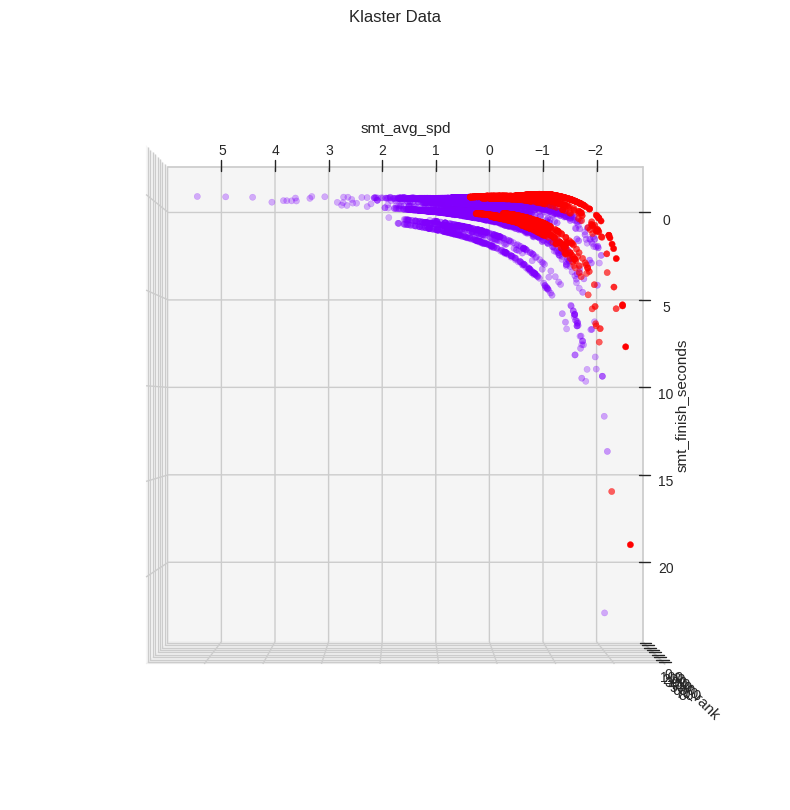

In [ ]:
fig = plt.figure(figsize=(10, 10))
ax = plt.axes(projection="3d")

# Menyiapkan beberapa variabel yang diperlukan untuk visualisasi
x = df_with_clusters['smt_avg_spd']
y = df_with_clusters['smt_finish_seconds']
z = df_with_clusters['smt_rank']
cluster = df_with_clusters['cluster']

# Memvisualisasikan hasilnya
scatter = ax.scatter(x, y, z, c=cluster, cmap="rainbow")
plt.title("Klaster Data")
plt.grid(False)
ax.set_xlabel('smt_avg_spd')
ax.set_ylabel('smt_finish_seconds')
ax.set_zlabel('smt_rank')

# Menyesuaikan sudut pandang untuk tampilan depan
ax.view_init(elev=90, azim=90)  # elev=90 untuk tampilan depan, azim=90 untuk sudut rotasi

# Menampilkan grafik
plt.show()


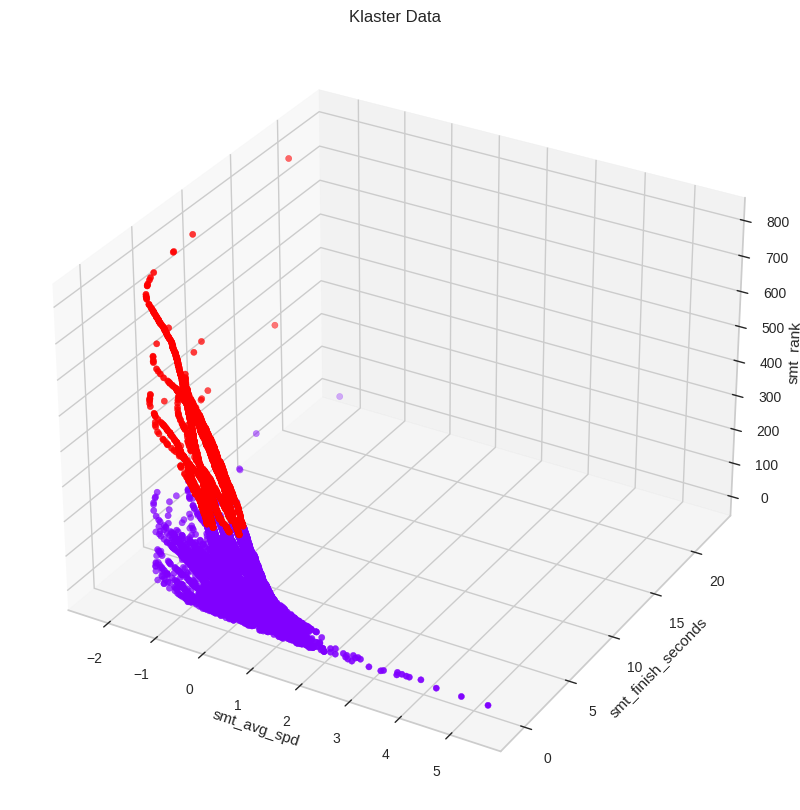

In [ ]:
fig = plt.figure(figsize=(10, 10))
ax = plt.axes(projection="3d")

# Menyiapkan beberapa variabel yang diperlukan untuk visualisasi
x = df_with_clusters['smt_avg_spd']
y = df_with_clusters['smt_finish_seconds']
z = df_with_clusters['smt_rank']
cluster = df_with_clusters['cluster']

# Memvisualisasikan hasilnya
scatter = ax.scatter(x, y, z, c=cluster, cmap="rainbow")
plt.title("Klaster Data")
plt.grid(False)
ax.set_xlabel('smt_avg_spd')
ax.set_ylabel('smt_finish_seconds')
ax.set_zlabel('smt_rank')

# Menampilkan grafik
plt.show()


**Penjelasan:**

**1. Pembagian Klaster:**
- Terdapat dua klaster (merah dan ungu). Jadi, ada pola yang berbeda antara dua kelompok.
- Klaster merah memiliki karakteristik yang berbeda dibandingkan dengan yang ungu. Dapat dilihat di `smt_finish_seconds` dan `smt_avg_spd`.

**2. Korelasi Antar Variabel:**
- `smt_rank`: adanya hubungan positif dengan variabel yang lain. Jadi, rank yang lebih rendah (lebih baik) ada di bagian bawah grafik.
- `smt_avg_spd`: pembagian klaster dipengaruhi oleh rata-rata kecepatan ini. Dapat dilihat bahwa klaster merah memiliki nilai kecepatan yang lebih kecil dibandingkan yang ungu.
- `smt_finish_seconds`: tak hanya itu, klaster merah juga punya waktu penyelesaian yang lebih tinggi dibandingkan yang ungu.

**3. Distribusi Data:**
- Klaster ungu lebih dominan pada sebagian besar rentang data, apalagi pada nilai yang kecepatan lebih tinggi dan waktu penyelesaian yang lebih singkat.
- Klaster merah terdistribusi lebih jauh pada waktu penyelesaian yang lebih besar. Hal ini menandakan bahwa klaster ini mencakup peserta yang kinerjanya rendah, seperti waktu penyelesaian lebih lambat.

**4. Kesimpulan:**
- Semakin cepat waktu penyelesaian (`smt_finish_seconds`) dan semakin tinggi kecepatan rata-rata (`smt_avg_spd`), maka semakin kecil nilai rank (`smt_rank`). Hal ini mengindikasikan bahwa performa lebih baik.

**Sumber:**
- https://docs.kanaries.net/articles/clustering-visualization

## K-Means dengan Silhoutte Method

#### Pemilihan fitur

In [ ]:
df_cluster = df_dt.copy()
df_cluster.head()

,user_age_group,gender,smt_rank,smt_avg_spd,smt_finish_seconds,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,...,smt_name_King Street side,smt_name_North Corniche,smt_name_Obhur North Short,smt_name_Oghor 2 SailsIsland,smt_name_PRINCE SULTAN - ASSALAM TO FATIMA,smt_name_S.Ubhur Alkurnaysh South Bound with detour,smt_name_Starbucks to Majid,attempt_year,attempt_month,attempt_day
0,2,2,712,15.8,382,0,0.132072,13.6,34.9,19.24,...,False,False,False,False,False,False,False,2017,12,22
1,2,2,189,33.2,216,6,0.132072,21.5,43.2,23.47,...,False,False,False,True,False,False,False,2015,4,13
2,2,2,264,23.7,593,3,0.281310,26.7,92.9,38.23,...,False,False,False,False,False,False,True,2018,2,7
3,2,2,50,33.4,817,3,0.092498,31.4,54.4,65.77,...,False,False,False,False,False,False,False,2018,8,24
4,2,1,19,21.3,284,0,0.000477,19.9,43.2,96.53,...,False,False,False,False,False,False,False,2020,3,6


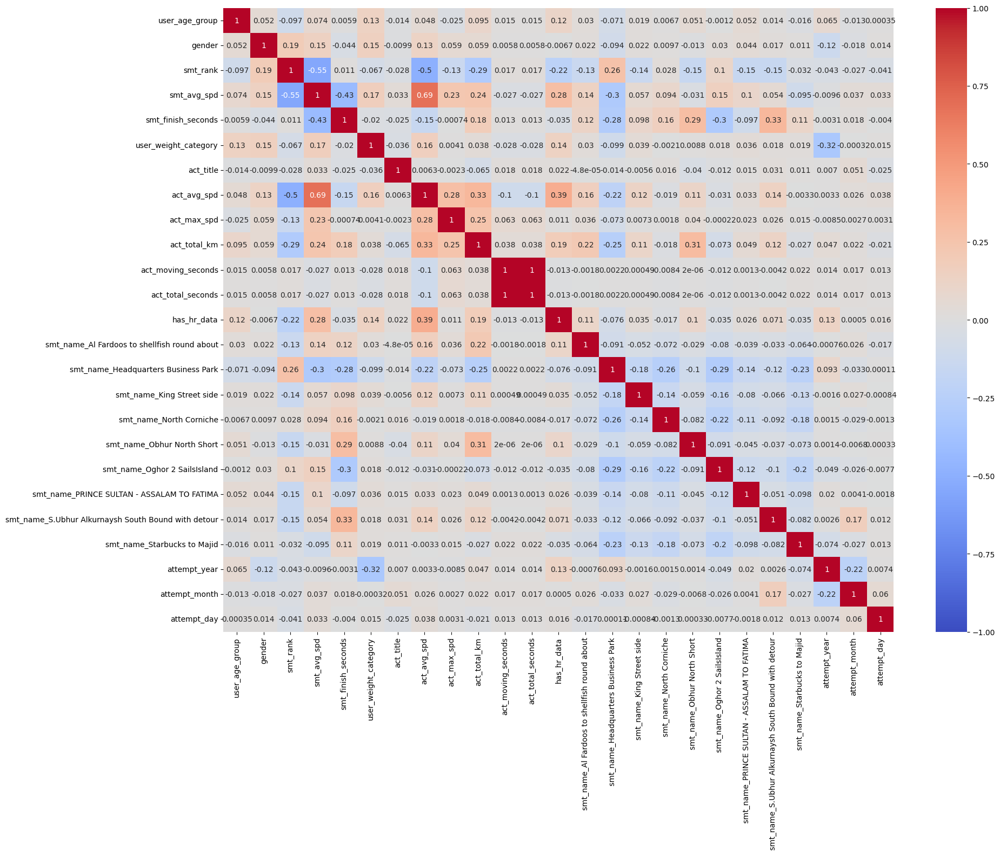

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

correlation_matrix = df_cluster.corr()

plt.figure(figsize=(20,15))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.show()

In [ ]:
new_df_clustered = df_cluster[['user_weight_category', 'smt_rank', 'act_total_km']]

Pemilihan fitur `user_weight_category`, `smt_rank`, dan `act_total_km` untuk clustering karena beberapa hal berikut :
* Ketiga fitur ini memiliki korelasi yang rendah satu sama lain, yang terlihat dari nilai korelasi yang cukup rendah dengan rincian sebagai berikut. `user_weight_category` dengan smt_rank (-0.067), `user_weight_category` dengan `act_total_km` (0.038), dan `smt_rank` dengan `act_total_km` (-0.29). Korelasi rendah ini menunjukkan bahwa fitur-fitur tersebut memberikan informasi yang unik, yang penting untuk menghindari redundansi dalam hasil clustering.
* Masing-masing fitur merepresentasikan aspek yang berbeda dari peserta. Fitur `user_weight_category` menggambarkan kondisi fisik peserta, `smt_rank menggambarkan performa atau kemampuan`, dan `act_total_km` merepresentasikan kapasitas bersepeda atau endurance peserta.
* ketiga fitur ini memberikan data yang bermakna dalam mengelompokkan pesepeda berdasarkan kondisi fisik, kemampuan, dan kapasitas bersepeda, yang membuat segmentasi lebih relevan.
* Pemilihan fitur ini menghindari penggunaan fitur yang berkorelasi tinggi seperti smt_avg_spd dengan act_avg_spd (0.69) dan act_moving_seconds dengan act_total_seconds (1.0), yang bisa menyebabkan bias dalam hasil clustering.

#### Hitung dan visualisasi nilai Silhouette Coefficient

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

for k in [2, 3, 4, 5]:
    clusterer = KMeans(n_clusters=k, n_init=10, random_state=42)

    # Menghitung silhouette_score untuk mengukur seberapa baik klaster yang terbentuk
    cluster_labels = clusterer.fit_predict(new_df_clustered)
    silhouette_avg = silhouette_score(new_df_clustered, cluster_labels)
    print(f"Untuk k = {k}, rata-rata silhouette_coefficient adalah: {silhouette_avg}")

Untuk k = 2, rata-rata silhouette_coefficient adalah: 0.6625869490953031
Untuk k = 3, rata-rata silhouette_coefficient adalah: 0.5911537020228168
Untuk k = 4, rata-rata silhouette_coefficient adalah: 0.5434602551365164
Untuk k = 5, rata-rata silhouette_coefficient adalah: 0.5023615181130121


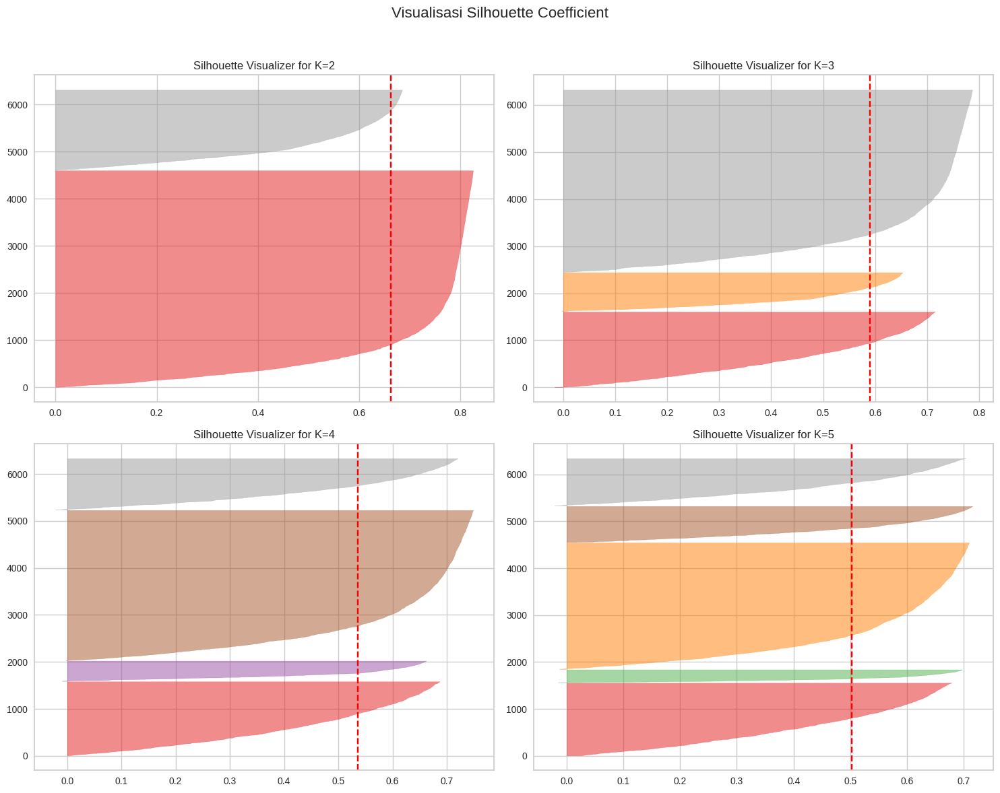

In [ ]:
from yellowbrick.cluster import SilhouetteVisualizer
import matplotlib.pyplot as plt

fig, ax = plt.subplots(2, 2, figsize=(15, 12))
fig.suptitle("Visualisasi Silhouette Coefficient", fontsize=16)

for i, k in enumerate([2, 3, 4, 5]):
    clusterer = KMeans(n_clusters=k, random_state=42)
    q, mod = divmod(i, 2)
    visualizer = SilhouetteVisualizer(clusterer, ax=ax[q][mod])
    visualizer.fit(new_df_clustered)
    ax[q][mod].set_title(f"Silhouette Visualizer for K={k}", fontsize=12)

plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust layout to fit the suptitle
plt.show()


Hasil clustering berdasarkan nilai rata-rata Silhouette Coefficient menunjukkan bahwa \( k = 2 \) adalah jumlah cluster terbaik dengan nilai 0.6626, yang menandakan separasi cluster yang jelas. Untuk \( k = 3 \) hingga \( k = 5 \), nilai Silhouette Coefficient terus menurun (\( 0.5911 \), \( 0.5435 \), \( 0.5024 \)), menunjukkan bahwa peningkatan jumlah cluster mengurangi kualitas separasi. clustering ini dilakukan **tanpa standarisasi data**, karena penggunaan metode seperti Min-Max Scaling, Robust Scaling, maupun Standard Scaling justru menghasilkan nilai Silhouette Coefficient yang jauh lebih rendah dan mengacaukan separasi cluster. Oleh karena itu, disimpulkan bahwa skala asli fitur lebih sesuai untuk pengelompokan.

#### Visualisasi hasil cluster

In [ ]:
kmeans = KMeans(n_clusters=2, n_init=10)
assignment = kmeans.fit_predict(new_df_clustered)

In [ ]:
df_with_clusters = pd.DataFrame(new_df_clustered.copy())
df_with_clusters['cluster'] = assignment
df_with_clusters.head()

,user_weight_category,smt_rank,act_total_km,cluster
0,0,712,19.24,0
1,6,189,23.47,1
2,3,264,38.23,0
3,3,50,65.77,1
4,0,19,96.53,1


Text(0.5, 0, 'act_total_km')

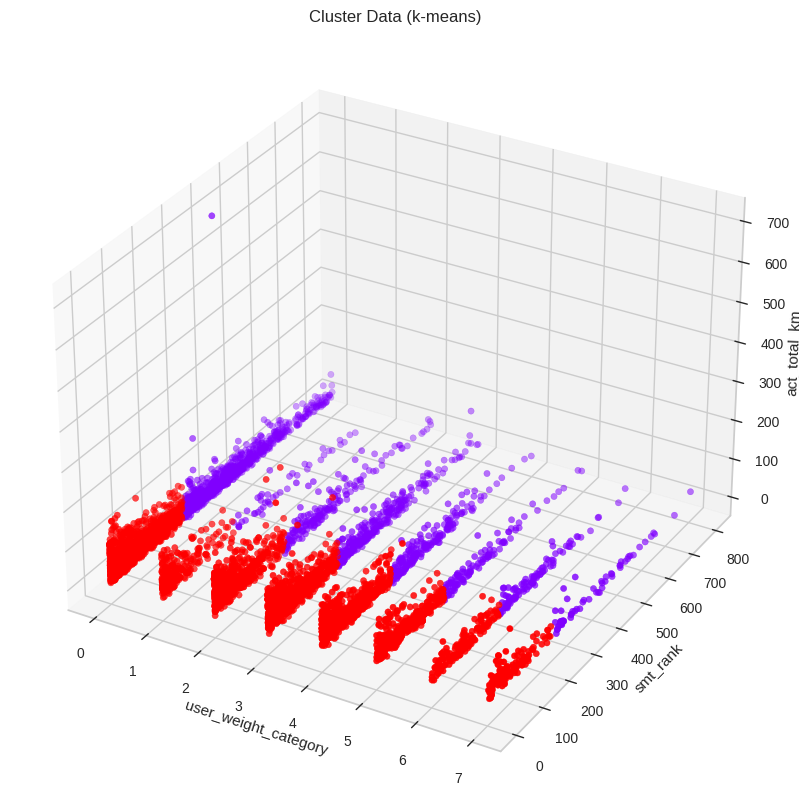

In [ ]:
fig = plt.figure(figsize = (10, 10))
ax = plt.axes(projection="3d")

# Menyiapkan beberapa variabel yang diperlukan untuk visualisasi
x = df_with_clusters['user_weight_category']
y = df_with_clusters['smt_rank']
z = df_with_clusters['act_total_km']
cluster = df_with_clusters['cluster']

# Memvisualisasikan hasilnya
ax.scatter(x, y, z, c = cluster, cmap = "rainbow")
plt.title("Cluster Data (k-means)")
plt.grid(False)
ax.set_xlabel('user_weight_category')
ax.set_ylabel('smt_rank')
ax.set_zlabel('act_total_km')

#### Insight

Hasil visualisasi clusterisasi dengan K-Means menunjukkan bahwa **`smt_rank`** menjadi dimensi utama yang memisahkan dua cluster. Cluster merah mengelompokkan pengguna dengan **`smt_rank` rendah**, yang mencerminkan peringkat segmen yang lebih baik, sedangkan cluster ungu mengelompokkan pengguna dengan **`smt_rank` tinggi**, menunjukkan peringkat yang lebih buruk. Pembagian cluster ini jelas terlihat dalam grafik dengan perbedaan signifikan di sepanjang dimensi **`smt_rank`**.

Dalam cluster merah, pengguna mendominasi peringkat terbaik (nilai `smt_rank` kecil), menunjukkan performa unggul di segmen terkait. Sebaliknya, cluster ungu berisi pengguna dengan peringkat yang kurang baik (nilai `smt_rank` besar). Tidak ada indikasi yang jelas bahwa variabel lain, seperti kategori berat badan (`user_weight_category`) atau total jarak aktivitas (`act_total_km`), memengaruhi pembagian cluster secara signifikan dalam visualisasi ini.

Oleh karena itu, clusterisasi ini sepenuhnya mencerminkan distribusi performa berdasarkan variabel **`smr_rank`**, tanpa melibatkan hubungan langsung dengan variabel lainnya.

## Hierarchical Clustering (Ward)

In [ ]:
df_clust = df_dt.copy()
df_clust.head()

,user_age_group,gender,smt_rank,smt_avg_spd,smt_finish_seconds,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,...,smt_name_King Street side,smt_name_North Corniche,smt_name_Obhur North Short,smt_name_Oghor 2 SailsIsland,smt_name_PRINCE SULTAN - ASSALAM TO FATIMA,smt_name_S.Ubhur Alkurnaysh South Bound with detour,smt_name_Starbucks to Majid,attempt_year,attempt_month,attempt_day
0,2,2,712,15.8,382,0,0.132072,13.6,34.9,19.24,...,False,False,False,False,False,False,False,2017,12,22
1,2,2,189,33.2,216,6,0.132072,21.5,43.2,23.47,...,False,False,False,True,False,False,False,2015,4,13
2,2,2,264,23.7,593,3,0.281310,26.7,92.9,38.23,...,False,False,False,False,False,False,True,2018,2,7
3,2,2,50,33.4,817,3,0.092498,31.4,54.4,65.77,...,False,False,False,False,False,False,False,2018,8,24
4,2,1,19,21.3,284,0,0.000477,19.9,43.2,96.53,...,False,False,False,False,False,False,False,2020,3,6


In [ ]:
from sklearn.preprocessing import RobustScaler

scaler = RobustScaler()
df_clust_scaled = scaler.fit_transform(df_clust)
df_clust_scaled

array([[ 0.        ,  0.        ,  2.62608696, ..., -0.5       ,
         0.71428571,  0.4       ],
       [ 0.        ,  0.        ,  0.35217391, ..., -1.5       ,
        -0.42857143, -0.2       ],
       [ 0.        ,  0.        ,  0.67826087, ...,  0.        ,
        -0.71428571, -0.6       ],
       ...,
       [ 1.        ,  0.        ,  0.47826087, ..., -2.5       ,
         0.14285714, -0.33333333],
       [ 1.        ,  0.        ,  1.60434783, ..., -1.5       ,
        -0.42857143,  0.53333333],
       [ 1.        ,  0.        ,  0.14782609, ...,  0.5       ,
        -0.42857143,  0.6       ]])

### Pemilihan Fitur

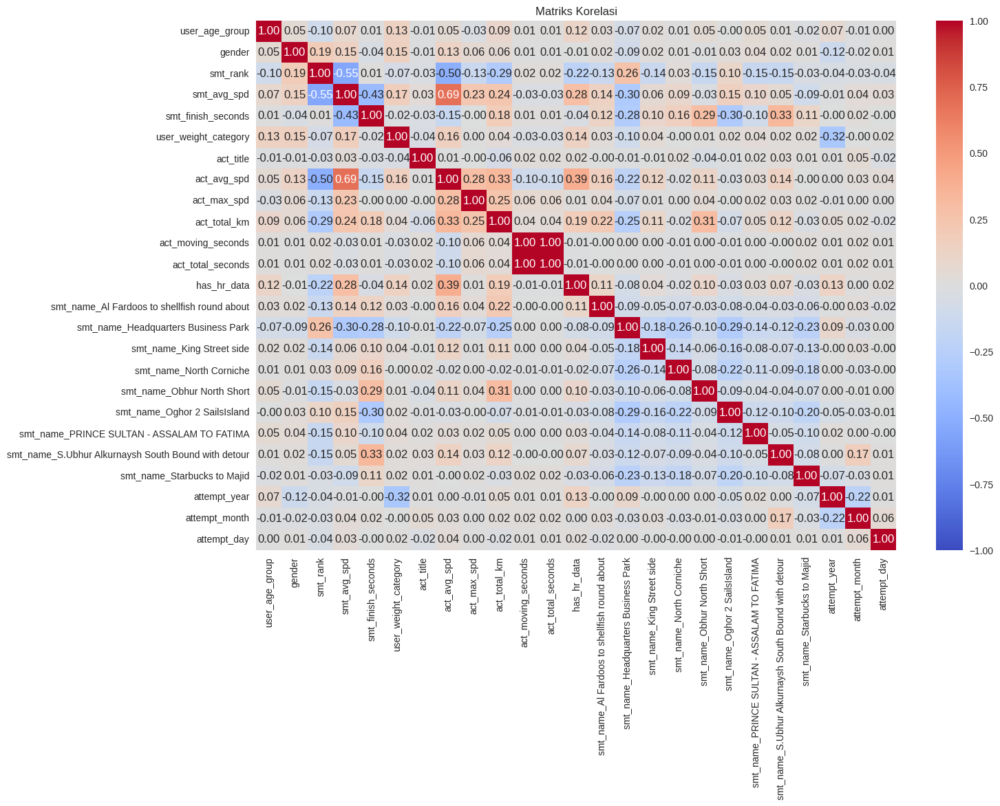

In [ ]:
matriks_korelasi = pd.DataFrame(df_clust_scaled, columns=df_clust.columns).corr()
plt.figure(figsize=(15, 10))
sns.heatmap(matriks_korelasi, annot=True, cmap='coolwarm', fmt=".2f", vmin=-1, vmax=1)
plt.title('Matriks Korelasi')
plt.show()

In [ ]:
varians = df_clust.var().sort_values(ascending=False)
print(varians)

act_moving_seconds                                     4.656018e+10
act_total_seconds                                      4.656018e+10
smt_finish_seconds                                     1.866023e+05
smt_rank                                               3.009798e+04
act_total_km                                           7.295827e+02
act_max_spd                                            2.908846e+02
attempt_day                                            7.525260e+01
smt_avg_spd                                            7.136972e+01
act_avg_spd                                            3.424061e+01
attempt_month                                          1.501286e+01
user_weight_category                                   4.137421e+00
attempt_year                                           2.425878e+00
user_age_group                                         1.176589e+00
smt_name_Headquarters Business Park                    1.852846e-01
smt_name_Oghor 2 SailsIsland                    

Berdasarkan matriks korelasi dan varians yang diberikan, kita akan memilih 3 kolom untuk tujuan clustering dengan mempertimbangkan beberapa hal:

1. Korelasi: Hindari kolom yang terlalu berkorelasi tinggi satu sama lain untuk mencegah redundansi.
2. Varians: Pilih kolom dengan varians tinggi karena kolom ini memberikan lebih banyak informasi untuk clustering.
3. Relevansi: Pastikan kolom yang dipilih relevan dengan tujuan clustering.

Kolom dengan varians tertinggi adalah:
- `act_moving_seconds` (4.656018e+10)
- `act_total_seconds` (4.656018e+10)
- `smt_finish_seconds` (1.866023e+05)
Namun, `act_moving_seconds` dan `act_total_seconds` sangat berkorelasi (nilai korelasi = 1.00). Kita hanya perlu memilih salah satu dari keduanya.

Berdasarkan analisis di atas, berikut adalah kolom yang dipilih:

1. `act_moving_seconds`: Varians tinggi dan memberikan informasi tentang waktu aktivitas.
2. `smt_avg_spd`: Informasi tentang kecepatan rata-rata dan tidak terlalu berkorelasi dengan act_moving_seconds.
3. `smt_finish_seconds`: Menyumbang informasi tambahan tentang waktu yang dibutuhkan untuk menyelesaikan segment.

### Visualisasi Dendogram

In [ ]:
from sklearn.cluster import AgglomerativeClustering

# Membuat model sementara untuk divisualisasikan
agglomerative = AgglomerativeClustering(distance_threshold=0, n_clusters=None, linkage='ward')
cluster_assignment = agglomerative.fit(df_clust_scaled)

cluster_assignment.labels_

array([5888, 6206, 3773, ...,    3,    1,    0])

In [ ]:
import scipy.cluster.hierarchy as shc

# Fungsi untuk menampilkan dendogram
def plot_dendrogram(model, **kwargs):
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count
    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, counts]
    ).astype(float)

    # Plot dendogram yang dihasilkan
    shc.dendrogram(linkage_matrix, **kwargs)

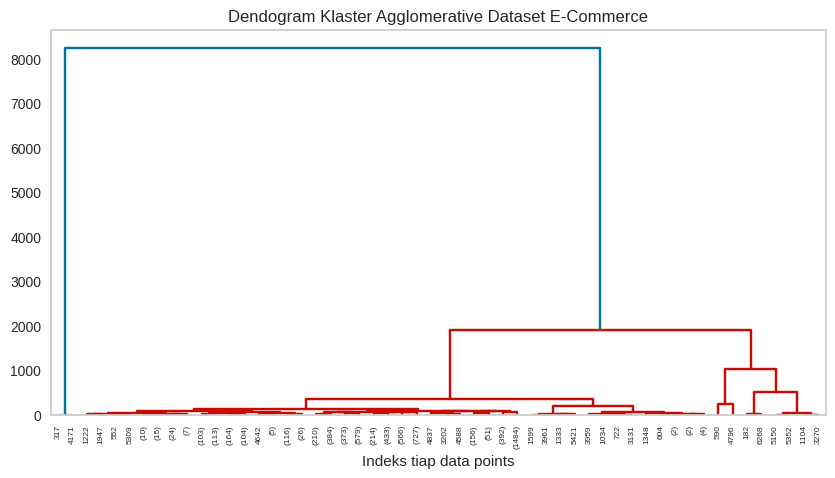

In [ ]:
plt.figure(figsize=(10, 5))
plt.grid(False)
plot_dendrogram(agglomerative, truncate_mode='level', p=7)  # Hanya tampilkan 7 level teratas
plt.title("Dendogram Klaster Agglomerative Dataset CSL")
plt.xlabel("Indeks tiap data points")
plt.show()

Dendrogram menunjukkan bahwa dataset CSL dapat dikelompokkan menjadi **dua klaster besar** berdasarkan jarak dissimilarity yang sangat tinggi. Namun, terdapat beberapa sub-klaster yang lebih kecil dengan jarak dissimilarity rendah, yang menunjukkan adanya kemiripan antar data dalam kelompok tersebut. Secara keseluruhan.

### Mendefinisikan Model Clustering

In [ ]:
# Definisikan model dengan hasil visualisasi sebelumnya
agglomerative = AgglomerativeClustering(n_clusters=2, linkage='ward')
clustering = agglomerative.fit_predict(df_clust)

In [ ]:
# Append hasil clustering ke dataframe
df_with_clusters_agg = pd.DataFrame(df_clust.copy())
df_with_clusters_agg['cluster'] = clustering
df_with_clusters_agg.head()

,user_age_group,gender,smt_rank,smt_avg_spd,smt_finish_seconds,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,...,smt_name_North Corniche,smt_name_Obhur North Short,smt_name_Oghor 2 SailsIsland,smt_name_PRINCE SULTAN - ASSALAM TO FATIMA,smt_name_S.Ubhur Alkurnaysh South Bound with detour,smt_name_Starbucks to Majid,attempt_year,attempt_month,attempt_day,cluster
0,2,2,712,15.8,382,0,0.132072,13.6,34.9,19.24,...,False,False,False,False,False,False,2017,12,22,0
1,2,2,189,33.2,216,6,0.132072,21.5,43.2,23.47,...,False,False,True,False,False,False,2015,4,13,0
2,2,2,264,23.7,593,3,0.281310,26.7,92.9,38.23,...,False,False,False,False,False,True,2018,2,7,0
3,2,2,50,33.4,817,3,0.092498,31.4,54.4,65.77,...,False,False,False,False,False,False,2018,8,24,0
4,2,1,19,21.3,284,0,0.000477,19.9,43.2,96.53,...,False,False,False,False,False,False,2020,3,6,0


### Visualisasi hasil clustering

In [ ]:
fig = px.scatter_3d(
    df_with_clusters_agg,
    x='act_moving_seconds',
    y='smt_avg_spd',
    z='smt_finish_seconds',
    color='cluster',  # Warna berdasarkan cluster
    title='3D Cluster Visualization with 2 Clusters',
    opacity=0.8,
    width=800,
    height=800
)

fig.show()

Berdasarkan visualisasi clustering dengan 2 klaster diatas menggunakan **Agglomerative Clustering**:

1. **Pembagian Klaster**:
   - Terdapat dua klaster yang terlihat jelas, dengan sebagian besar data berada dalam klaster **biru**.
   - Klaster **kuning** terdiri dari sejumlah kecil data yang memiliki karakteristik unik.

2. **Insight Klaster Kuning**:
   - Data dalam klaster ini memiliki nilai **smt_avg_spd** yang jauh lebih tinggi dibandingkan klaster lainnya.
   - Ini menunjukkan bahwa klaster kuning mewakili outliers atau kelompok khusus dengan performa kecepatan diatas rata-rata.

3. **Insight Klaster Biru**:
   - Sebagian besar data dalam klaster biru memiliki distribusi yang lebih terpusat pada **act_moving_seconds** dan **smt_finish_seconds**, dengan kecepatan rata-rata yang relatif lebih rendah.


## *Hierarchical Clustering*

#### *Load Data*

In [172]:
df_clustering = df_rf.copy()
df_clustering

,user_age_group,gender,smt_rank,smt_avg_spd,smt_finish_seconds,user_weight_category,act_title,act_avg_spd,act_max_spd,act_total_km,...,smt_name_King Street side,smt_name_North Corniche,smt_name_Obhur North Short,smt_name_Oghor 2 SailsIsland,smt_name_PRINCE SULTAN - ASSALAM TO FATIMA,smt_name_S.Ubhur Alkurnaysh South Bound with detour,smt_name_Starbucks to Majid,attempt_year,attempt_month,attempt_day
0,2,2,712,15.8,382,0,0.132072,13.6,34.9,19.24,...,False,False,False,False,False,False,False,2017,12,22
1,2,2,189,33.2,216,6,0.132072,21.5,43.2,23.47,...,False,False,False,True,False,False,False,2015,4,13
2,2,2,264,23.7,593,3,0.281310,26.7,92.9,38.23,...,False,False,False,False,False,False,True,2018,2,7
3,2,2,50,33.4,817,3,0.092498,31.4,54.4,65.77,...,False,False,False,False,False,False,False,2018,8,24
4,2,1,19,21.3,284,0,0.000477,19.9,43.2,96.53,...,False,False,False,False,False,False,False,2020,3,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6287,2,2,431,22.3,778,0,0.132072,17.9,96.5,41.93,...,False,True,False,False,False,False,False,2018,7,16
6288,3,2,34,38.9,446,4,0.000318,34.5,52.2,48.13,...,False,True,False,False,False,False,False,2018,11,21
6289,3,2,218,22.1,637,3,0.132072,17.6,40.7,50.64,...,False,False,False,False,False,False,True,2013,8,11
6290,3,2,477,12.4,485,4,0.233153,14.5,34.9,40.93,...,False,False,False,False,False,False,False,2015,4,24


#### Pemilihan Fitur

Saya akan menggunakan 3 fitur, yaitu `act_total_km`, `gender`, dan `act_avg_spd`

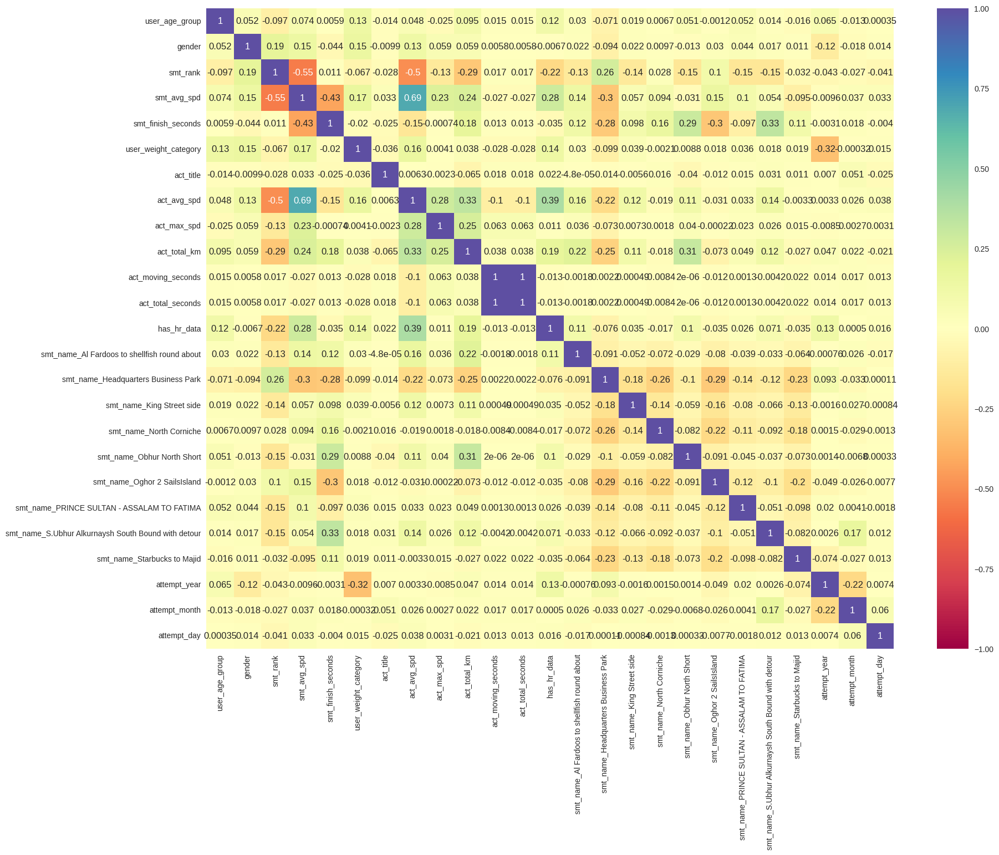

In [173]:
import seaborn as sns
import matplotlib.pyplot as plt

correlation_matrix = df_clustering.corr()

plt.figure(figsize=(20,15))
sns.heatmap(correlation_matrix, annot=True, cmap='Spectral', vmin=-1, vmax=1)
plt.show()

Pemilihan fitur `act_total_km`, `gender`, dan `act_avg_spd` untuk *clustering* karena beberapa hal berikut :
* Ketiga fitur ini memiliki korelasi yang tidak terlalu kuat antar satu sama lain, sehingga masing-masing memberikan informasi yang unik dan menghindari redundansi.
* `act_total_km` mencerminkan kapasitas bersepeda, `gender` menggambarkan demografi peserta, dan `act_avg_spd` menunjukkan performa kecepatan rata-rata.
* Fitur-fitur ini relevan untuk mengelompokkan pesepeda berdasarkan jarak tempuh, jenis kelamin, dan kecepatan, sehingga segmentasi menjadi lebih akurat.
* Dengan memilih fitur yang tidak berkorelasi tinggi, bisa menghindari potensi bias dalam hasil *clustering* yang dapat disebabkan oleh fitur-fitur yang saling terkait.

#### *Pre-processing*

##### Pilih fitur

In [ ]:
# Hanya pertahankan fitur yang akan digunakan
fitur_dipakai = ['act_total_km', 'gender', 'act_avg_spd']

df_clustering = df_clustering[fitur_dipakai]
df_clustering

,act_total_km,gender,act_avg_spd
0,19.24,2,13.6
1,23.47,2,21.5
2,38.23,2,26.7
3,65.77,2,31.4
4,96.53,1,19.9
...,...,...,...
6287,41.93,2,17.9
6288,48.13,2,34.5
6289,50.64,2,17.6
6290,40.93,2,14.5


##### Pengananan *Outliers*

In [ ]:
# Periksa outlier
hitung_outlier(df_clustering)

,act_total_km,gender,act_avg_spd
Outliers count,308.000000,253.000000,94.000000
Outliers percentage (%),4.895105,4.020979,1.493961


<Axes: >

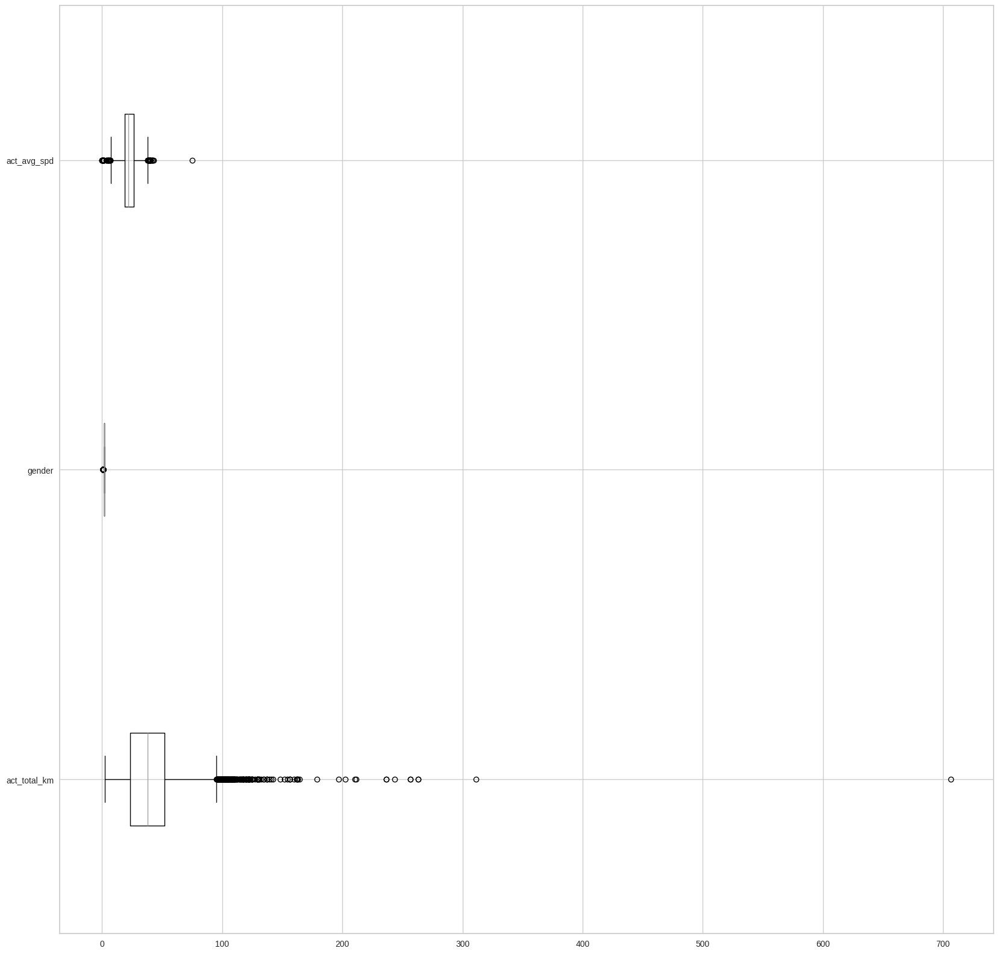

In [ ]:
df_clustering.boxplot(vert=False, figsize=(20,20))

In [ ]:
# Hapus outlier yang tak wajar
def hapus_outliers_tertinggi(df, col, percentage=25):
    q1 = np.percentile(df[col], 25)
    q3 = np.percentile(df[col], 75)
    iqr = q3 - q1

    outliers = df[col] > (q3 + 1.5 * iqr)
    outliers_index = df[outliers].index

    # Ambil 25% nilai tertinggi di antara outliers
    outliers_values = df.loc[outliers_index, col].sort_values(ascending=False)
    n_remove = int(len(outliers_values) * (percentage / 100))
    to_remove = outliers_values.head(n_remove).index

    return df.drop(index=to_remove)

df_clustering = hapus_outliers_tertinggi(df_clustering, 'act_total_km', percentage=25)
df_clustering = hapus_outliers_tertinggi(df_clustering, 'act_avg_spd', percentage=25)

<Axes: >

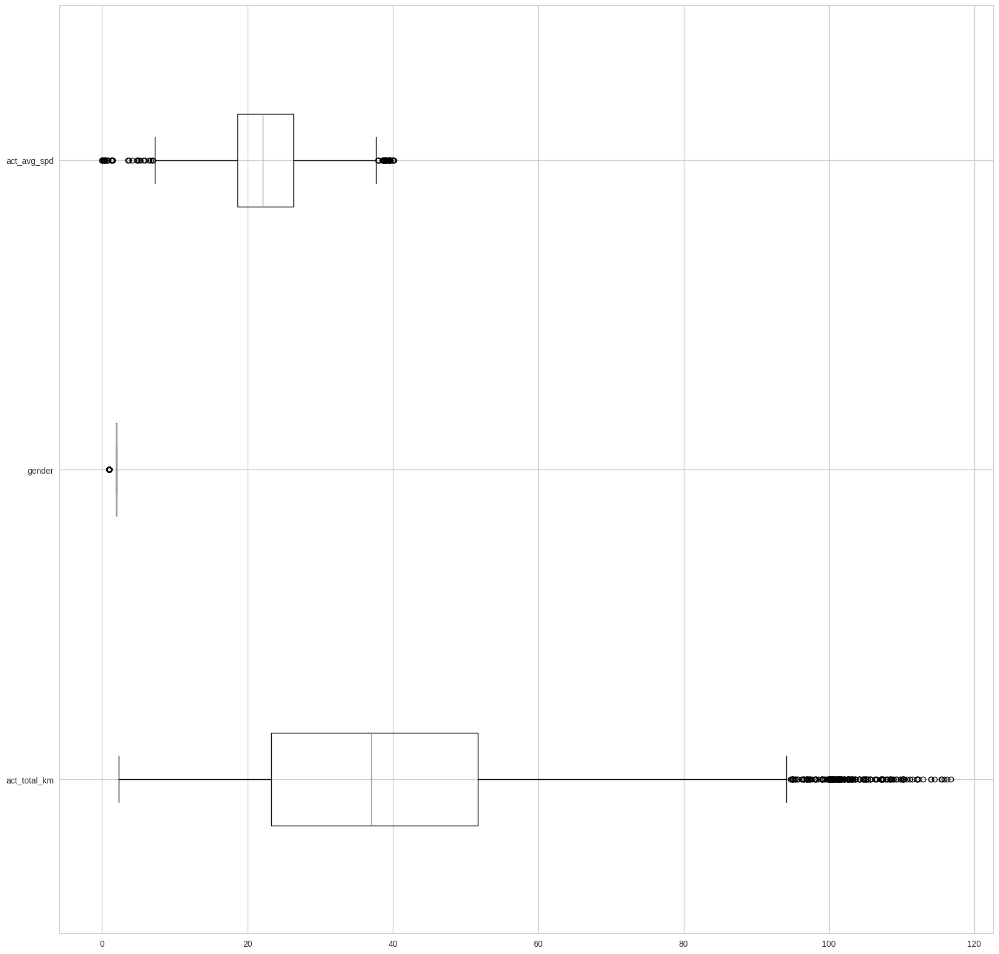

In [ ]:
df_clustering.boxplot(vert=False, figsize=(20,20))

##### Standarisasi

In [ ]:
# Melakukan standarisasi (pake MinMaxScaler)
scaler = MinMaxScaler()

df_clustering[df_clustering.columns] = scaler.fit_transform(df_clustering)
df_clustering

,act_total_km,gender,act_avg_spd
0,0.148109,1.0,0.338308
1,0.185049,1.0,0.534826
2,0.313946,1.0,0.664179
3,0.554449,1.0,0.781095
4,0.823072,0.0,0.495025
...,...,...,...
6287,0.346258,1.0,0.445274
6288,0.400402,1.0,0.858209
6289,0.422321,1.0,0.437811
6290,0.337525,1.0,0.360697


#### *Agglomerative clustering* (Metode *Average*)

Tanpa menspesifikasikan jumlah *cluster*

In [ ]:
from sklearn.cluster import AgglomerativeClustering

# Agglomerative clustering
agglomerative  = AgglomerativeClustering(distance_threshold=0, n_clusters=None, linkage='average')
cluster_assignment = agglomerative.fit(df_clustering)

cluster_assignment.labels_

array([4987, 6197, 6196, ...,    3,    1,    0])

##### Menentukan jumlah *cluster*

In [ ]:
from scipy.cluster import hierarchy as shc

# Fungsi untuk menampilkan dendogram
def plot_dendrogram(model, **kwargs):
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count
    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, counts]
    ).astype(float)

    # Plot dendogram yang dihasilkan
    shc.dendrogram(linkage_matrix, **kwargs)

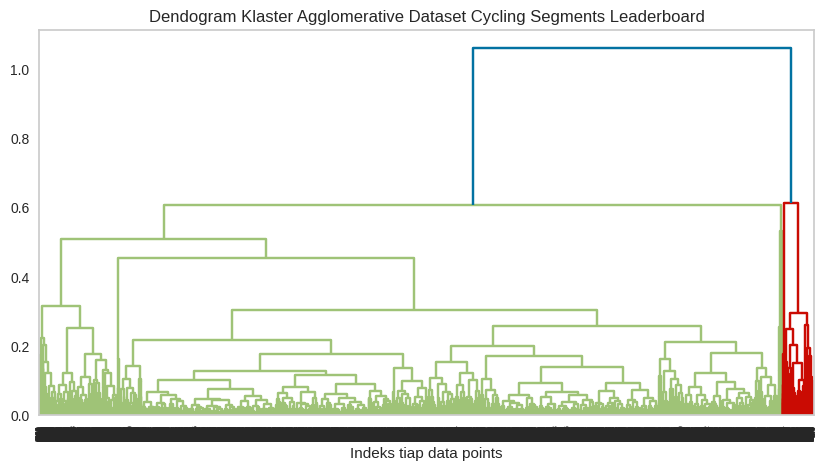

In [ ]:
# Dendogram
plt.figure(figsize=(10, 5))
plt.grid(False)
plot_dendrogram(agglomerative, truncate_mode=None)
plt.title("Dendogram Klaster Agglomerative Dataset Cycling Segments Leaderboard")
plt.xlabel("Indeks tiap data points")
plt.show()

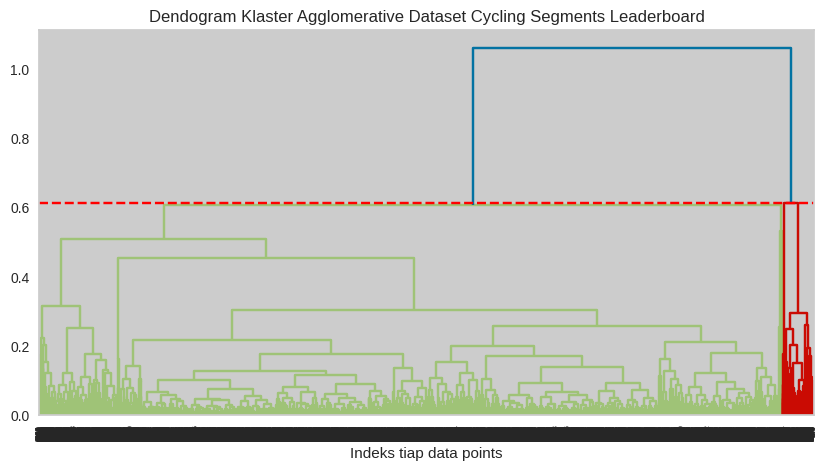

In [ ]:
from scipy.cluster.hierarchy import dendrogram, linkage

linked = linkage(df_clustering, 'average')

plt.figure(figsize=(10, 5))
dendrogram(linked)
plt.title("Dendogram Klaster Agglomerative Dataset Cycling Segments Leaderboard")
plt.xlabel("Indeks tiap data points")

distances = linked[:, 2]
sorted_distances = np.sort(distances)
diffs = np.diff(sorted_distances)
idx = np.argmax(diffs)
max_d = sorted_distances[idx] # Threshold

plt.axhline(y=max_d, c='red', linestyle = 'dashed')

plt.show()

##### *Training* Model

In [ ]:
# Definisikan model dengan hasil visualisasi sebelumnya
agglomerative = AgglomerativeClustering(n_clusters=4, linkage='average')
cluster_assignment = agglomerative.fit_predict(df_clustering)

In [ ]:
# Append hasil clustering ke dataframe
df_with_clusters_agg = pd.DataFrame(df_clustering.copy())
df_with_clusters_agg['cluster'] = cluster_assignment
df_with_clusters_agg.head()

,act_total_km,gender,act_avg_spd,cluster
0,0.148109,1.0,0.338308,1
1,0.185049,1.0,0.534826,1
2,0.313946,1.0,0.664179,1
3,0.554449,1.0,0.781095,1
4,0.823072,0.0,0.495025,2


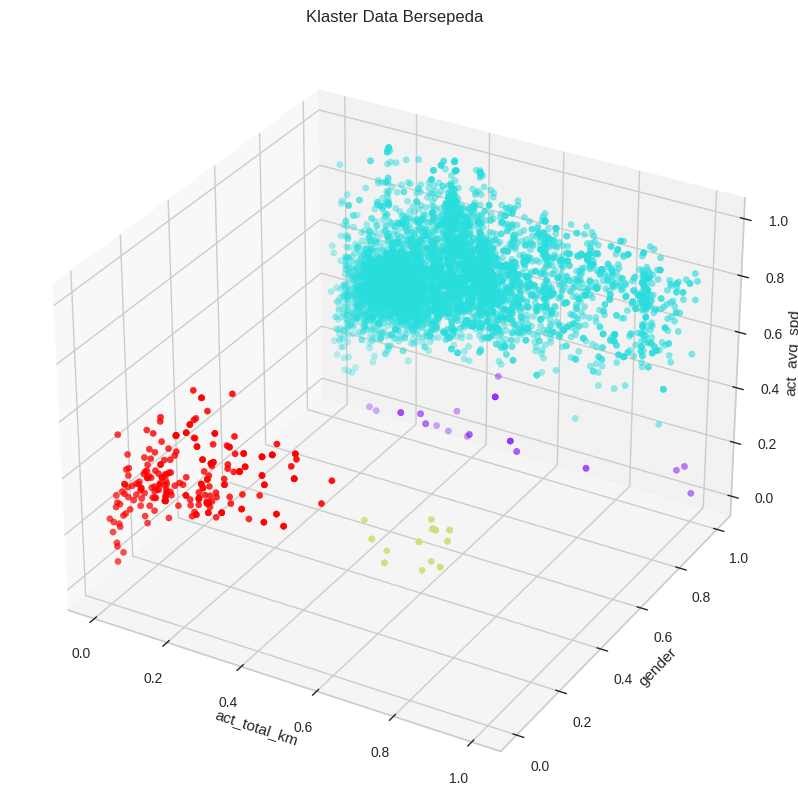

In [ ]:
# Visualisasi
fig = plt.figure(figsize = (10, 10))
ax = plt.axes(projection="3d")

x = df_with_clusters_agg['act_total_km']
y = df_with_clusters_agg['gender']
z = df_with_clusters_agg['act_avg_spd']
cluster = df_with_clusters_agg['cluster']

ax.scatter(x, y, z, c = cluster, cmap = "rainbow")
plt.title("Klaster Data Bersepeda")
plt.grid(False)
ax.set_xlabel('act_total_km')
ax.set_ylabel('gender')
ax.set_zlabel('act_avg_spd')

plt.show()

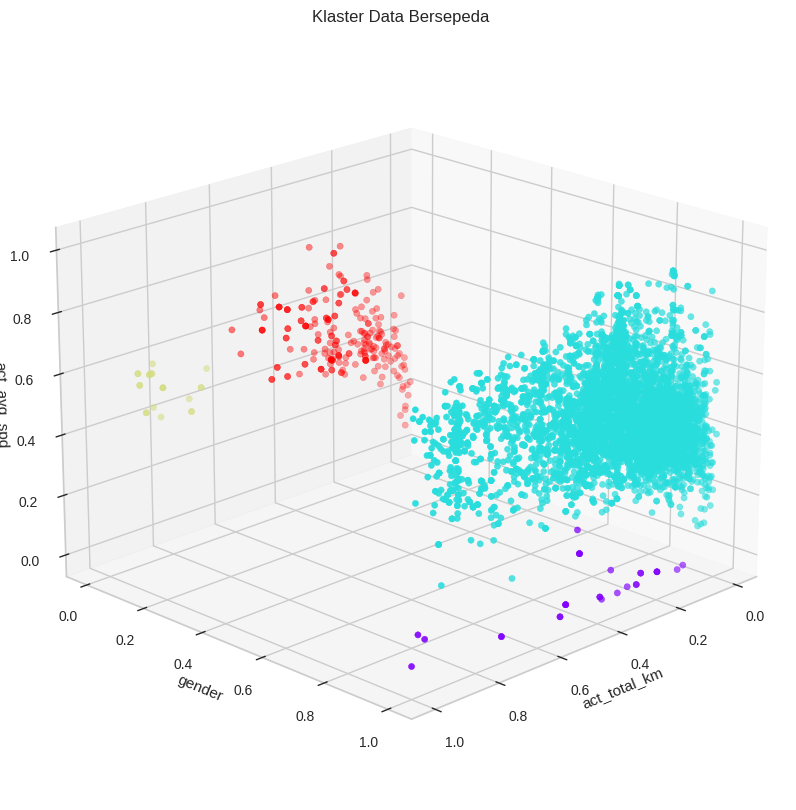

In [ ]:
# Visualisasi
fig = plt.figure(figsize = (10, 10))
ax = plt.axes(projection="3d")

x = df_with_clusters_agg['act_total_km']
y = df_with_clusters_agg['gender']
z = df_with_clusters_agg['act_avg_spd']
cluster = df_with_clusters_agg['cluster']

ax.scatter(x, y, z, c = cluster, cmap = "rainbow")

# Ganti angle
ax.view_init(elev=20, azim=45)

plt.title("Klaster Data Bersepeda")
plt.grid(False)
ax.set_xlabel('act_total_km')
ax.set_ylabel('gender')
ax.set_zlabel('act_avg_spd')

plt.show()

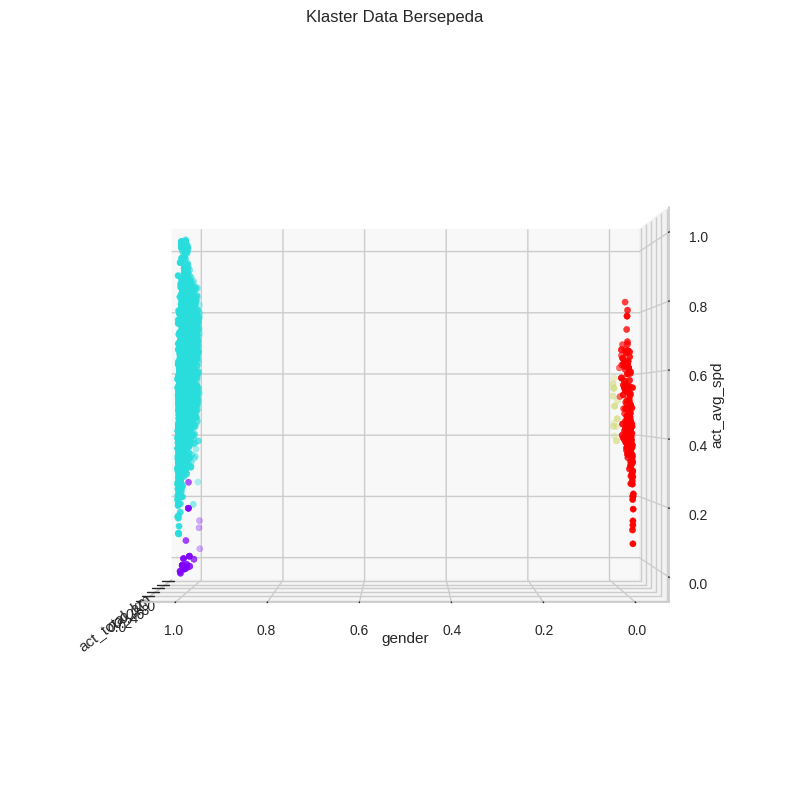

In [ ]:
# Visualisasi
fig = plt.figure(figsize = (10, 10))
ax = plt.axes(projection="3d")

x = df_with_clusters_agg['act_total_km']
y = df_with_clusters_agg['gender']
z = df_with_clusters_agg['act_avg_spd']
cluster = df_with_clusters_agg['cluster']

ax.scatter(x, y, z, c = cluster, cmap = "rainbow")

# Ganti angle
ax.view_init(elev=0, azim=180)

plt.title("Klaster Data Bersepeda")
plt.grid(False)
ax.set_xlabel('act_total_km')
ax.set_ylabel('gender')
ax.set_zlabel('act_avg_spd')

plt.show()

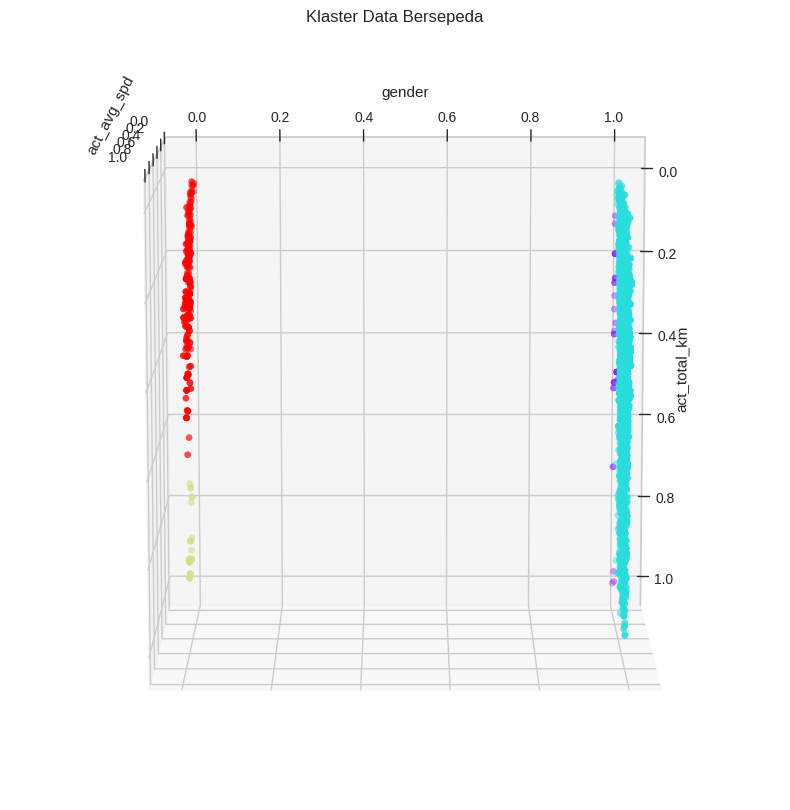

In [ ]:
# Visualisasi
fig = plt.figure(figsize = (10, 10))
ax = plt.axes(projection="3d")

x = df_with_clusters_agg['act_total_km']
y = df_with_clusters_agg['gender']
z = df_with_clusters_agg['act_avg_spd']
cluster = df_with_clusters_agg['cluster']

ax.scatter(x, y, z, c = cluster, cmap = "rainbow")

# Ganti angle
ax.view_init(elev=100, azim=0)

plt.title("Klaster Data Bersepeda")
plt.grid(False)
ax.set_xlabel('act_total_km')
ax.set_ylabel('gender')
ax.set_zlabel('act_avg_spd')

plt.show()

##### Karakteristik *Cluster*

Hasil *clustering* mengungkapkan pola performa bersepeda yang berbeda berdasarkan gender, kecepatan rata-rata, dan total jarak tempuh. Klaster biru muda menunjukkan kelompok laki-laki dengan kecepatan rata-rata yang tinggi dan total jarak tempuh yang merata. Sebaliknya, klaster ungu juga terdiri dari laki-laki, tetapi dengan kecepatan rata-rata yang rendah dan total jarak tempuh yang tetap merata. Hal ini mencerminkan variasi kemampuan dalam kelompok laki-laki, di mana ada yang berfokus pada kecepatan tinggi dan ada yang lebih lambat.

Sementara itu, klaster merah dan kuning mencerminkan performa perempuan. Klaster merah terdiri dari perempuan dengan total jarak tempuh yang merata dari tapi tidak sampai sejauh klaster kuning dan kecepatan rata-rata yang tidak secepat laki-laki, tetapi tetap bervariasi. Klaster kuning, di sisi lain, menunjukkan perempuan dengan total jarak tempuh yang lebih jauh  dan kecepatan rata-rata yang serupa dengan klaster merah. Pola ini menunjukkan perbedaan gaya bersepeda antara laki-laki dan perempuan, di mana laki-laki cenderung lebih fokus pada kecepatan, sementara perempuan menunjukkan konsistensi jarak tempuh yang lebih jelas pada kelompok tertentu.